In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sn
from numpy import array
from math import sqrt
import findspark
findspark.init('/home/ramin/spark-2.1.1-bin-hadoop2.7')
import pyspark
from pyspark.mllib.clustering import KMeans, KMeansModel

In [2]:
from pyspark.sql import SparkSession

In [3]:
spark = SparkSession.builder.appName('clustering').getOrCreate()

In [4]:
ass = spark.read.csv("./cleaned data/AS.csv", header=True, inferSchema=True)
mp = spark.read.csv("./cleaned data/MP.csv", header=True, inferSchema=True)
up = spark.read.csv("./cleaned data/UP.csv", header=True, inferSchema=True)
jh = spark.read.csv("./cleaned data/JH.csv", header=True, inferSchema=True)
rj = spark.read.csv("./cleaned data/RJ.csv", header=True, inferSchema=True)
bh = spark.read.csv("./cleaned data/BH.csv", header=True, inferSchema=True)
cg = spark.read.csv("./cleaned data/CG.csv", header=True, inferSchema=True)
od = spark.read.csv("./cleaned data/OD.csv", header=True, inferSchema=True)
ut = spark.read.csv("./cleaned data/UT.csv", header=True, inferSchema=True)

In [5]:
df_concat = ass.union(mp.union(up.union(jh.union(rj.union(bh.union(cg.union(od.union(ut))))))))

In [6]:
df_concat.show(5)

+----------+------------------+---+---+-----------------+----------------+-----------------+--------------------+---------------------+-------------------------------+-----------+--------------+----------------------+-----------+-----------------------+------------+
|state_code|record_code_iodine|sex|age|     weight_in_kg|length_height_cm|haemoglobin_level|first_breast_feeding|is_cur_breast_feeding|day_or_month_for_breast_feeding|water_month|ani_milk_month|semisolid_month_or_day|solid_month|vegetables_month_or_day|illness_type|
+----------+------------------+---+---+-----------------+----------------+-----------------+--------------------+---------------------+-------------------------------+-----------+--------------+----------------------+-----------+-----------------------+------------+
|      18.0|                 3|  1|5.0|              5.0|       59.200001|              9.0|                 1.0|                  1.0|                            5.0|        0.0|           0.0|     

In [7]:
from pyspark.ml.feature import StandardScaler
from pyspark.ml.linalg import Vectors
from pyspark.ml.feature import VectorAssembler

In [8]:
df_concat.count()

120969

In [9]:
df_concat.describe().toPandas().transpose()

,0,1,2,3,4
summary,count,mean,stddev,min,max
state_code,120969,14.012912399044383,6.165466506318247,5.0,23.0
record_code_iodine,120969,2.754019624862568,0.5220060451137156,1,3
sex,120969,1.4745678644942093,0.4993548515825768,1,2
age,120969,28.333192801461532,16.354565523504537,0.0,324.0
weight_in_kg,120969,10.723201875016104,4.8222989542472,1.0,609.2000099999999
length_height_cm,120969,83.56522880541996,14.880242824921023,16.799999,205.3
haemoglobin_level,120969,9.048010155063364,1.769596549631636,3.0,18.0
first_breast_feeding,120969,1.4180492522877761,0.6241575981662638,1.0,5.0
is_cur_breast_feeding,120969,1.6636080318098025,0.4732808775158675,1.0,11.0


In [10]:
Before=df_concat.count()
df_councat=df_concat.na.drop()
after=df_concat.count()
Before-after

0

In [11]:
df_concat.columns

['state_code',
 'record_code_iodine',
 'sex',
 'age',
 'weight_in_kg',
 'length_height_cm',
 'haemoglobin_level',
 'first_breast_feeding',
 'is_cur_breast_feeding',
 'day_or_month_for_breast_feeding',
 'water_month',
 'ani_milk_month',
 'semisolid_month_or_day',
 'solid_month',
 'vegetables_month_or_day',
 'illness_type']

In [12]:
cols = ['state_code', 'record_code_iodine', 'sex', 'age', 'weight_in_kg',
       'length_height_cm', 'haemoglobin_level', 'first_breast_feeding',
       'is_cur_breast_feeding', 'day_or_month_for_breast_feeding',
       'water_month', 'ani_milk_month', 'semisolid_month_or_day',
       'solid_month', 'vegetables_month_or_day']
assembler = VectorAssembler(inputCols=cols, outputCol='features')
assembled_data = assembler.transform(df_concat)

In [13]:
# Feature scaling
scaler = StandardScaler(inputCol='features', outputCol='scaledFeatures',withStd=True,withMean=True)
scaler_model = scaler.fit(assembled_data)
scaled_data = scaler_model.transform(assembled_data)

In [14]:
scaled_data.printSchema()



root
 |-- state_code: double (nullable = true)
 |-- record_code_iodine: integer (nullable = true)
 |-- sex: integer (nullable = true)
 |-- age: double (nullable = true)
 |-- weight_in_kg: double (nullable = true)
 |-- length_height_cm: double (nullable = true)
 |-- haemoglobin_level: double (nullable = true)
 |-- first_breast_feeding: double (nullable = true)
 |-- is_cur_breast_feeding: double (nullable = true)
 |-- day_or_month_for_breast_feeding: double (nullable = true)
 |-- water_month: double (nullable = true)
 |-- ani_milk_month: double (nullable = true)
 |-- semisolid_month_or_day: double (nullable = true)
 |-- solid_month: double (nullable = true)
 |-- vegetables_month_or_day: double (nullable = true)
 |-- illness_type: double (nullable = true)
 |-- features: vector (nullable = true)
 |-- scaledFeatures: vector (nullable = true)



In [15]:
cluster_data = scaled_data.select('scaledFeatures')

In [16]:
cluster_data.printSchema()

root
 |-- scaledFeatures: vector (nullable = true)



In [17]:
from pyspark.ml.clustering import KMeans


In [18]:
elbowset=cluster_data
elbowset.persist()

DataFrame[scaledFeatures: vector]

In [19]:
cost={}
for i in range(2,31):
    k_means= KMeans(featuresCol='scaledFeatures', k=i)
    model_k = k_means.fit(cluster_data)
    wssse= model_k.computeCost(cluster_data)
    print("K = "+str(i)+": Within Set Sum of Squared Errors = " + str(wssse))
    cost[i]=wssse
    
    


K = 2: Within Set Sum of Squared Errors = 1514413.9234882842
K = 3: Within Set Sum of Squared Errors = 1345094.6769858801
K = 4: Within Set Sum of Squared Errors = 1266186.2486200081
K = 5: Within Set Sum of Squared Errors = 1210340.7216152875
K = 6: Within Set Sum of Squared Errors = 1128800.8032602773
K = 7: Within Set Sum of Squared Errors = 1086802.7665127506
K = 8: Within Set Sum of Squared Errors = 1065873.4630898521
K = 9: Within Set Sum of Squared Errors = 1046741.3878523409
K = 10: Within Set Sum of Squared Errors = 1019875.3433607761
K = 11: Within Set Sum of Squared Errors = 967914.6178026315
K = 12: Within Set Sum of Squared Errors = 931809.6661924963
K = 13: Within Set Sum of Squared Errors = 896875.8298935721
K = 14: Within Set Sum of Squared Errors = 893054.1925914846
K = 15: Within Set Sum of Squared Errors = 859377.4937559518
K = 16: Within Set Sum of Squared Errors = 863664.5661673537
K = 17: Within Set Sum of Squared Errors = 824711.4203490856
K = 18: Within Set Sum 

In [20]:
prediction = model_k.transform(cluster_data).select('prediction').collect()
labels = [p.prediction for p in prediction ]

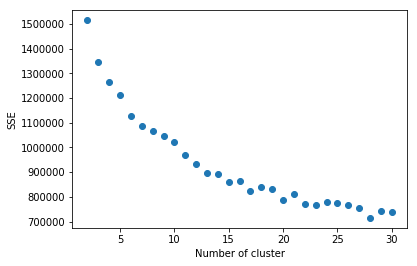

In [21]:
plt.figure()
plt.plot(list(cost.keys()), list(cost.values()),'o')
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

In [22]:
k_means_2 = KMeans(featuresCol='scaledFeatures', k=2)
k_means_3 = KMeans(featuresCol='scaledFeatures', k=3)
k_means_5 = KMeans(featuresCol='scaledFeatures', k=5)

In [23]:
model_k2 = k_means_2.fit(cluster_data)
model_k3 = k_means_3.fit(cluster_data)
model_k5 = k_means_5.fit(cluster_data)

In [24]:
# Evaluate both clustering models by computing Within Set Sum of Squared Errors.
wssse_2 = model_k2.computeCost(cluster_data)
print("K = 2: Within Set Sum of Squared Errors = " + str(wssse_2))

wssse_3 = model_k3.computeCost(cluster_data)
print("K = 3: Within Set Sum of Squared Errors = " + str(wssse_3))
wssse_5 = model_k5.computeCost(cluster_data)
print("K = 5: Within Set Sum of Squared Errors = " + str(wssse_5))

K = 2: Within Set Sum of Squared Errors = 1514413.9234882845
K = 3: Within Set Sum of Squared Errors = 1345094.6769858801
K = 5: Within Set Sum of Squared Errors = 1210340.7216152872


In [25]:
model_k.transform(cluster_data).groupBy('prediction').count().show()

+----------+-----+
|prediction|count|
+----------+-----+
|        28| 2030|
|        26| 6676|
|        27| 2948|
|        12| 3295|
|        22| 3043|
|         1| 6687|
|        13| 1664|
|        16| 7211|
|         6| 5080|
|         3| 3441|
|        20| 1719|
|         5| 6256|
|        19| 5522|
|        15| 3214|
|         9| 5360|
|        17| 7431|
|         4| 1559|
|         8| 5252|
|        23| 3158|
|         7| 7767|
+----------+-----+
only showing top 20 rows



In [26]:
model_k2.transform(cluster_data).groupBy('prediction').count().show()

+----------+-----+
|prediction|count|
+----------+-----+
|         1|29128|
|         0|91841|
+----------+-----+



In [27]:
model_k5.transform(cluster_data).groupBy('prediction').count().show()

+----------+-----+
|prediction|count|
+----------+-----+
|         1|25631|
|         3|48245|
|         4|13227|
|         2|18185|
|         0|15681|
+----------+-----+



# New

# jaccard similarity

In [28]:
def jaccard(a, b):
    c = a.intersection(b)
    return float(len(c)) / (len(a) + len(b) - len(c))

# Query for calculate simiarity

In [29]:
query={
 'state_code':18.0,
 'record_code_iodine':3,
 'sex':1,
 'age':5.0,
 'weight_in_kg':5.0,
 'length_height_cm':59.200001,
 'haemoglobin_level':9.0,
 'first_breast_feeding':1.0,
 'is_cur_breast_feeding':1.0,
 'day_or_month_for_breast_feeding':5.0,
 'water_month':0.0,
 'ani_milk_month':0.0,
 'semisolid_month_or_day':0.0,
 'solid_month':0.0,
 'vegetables_month_or_day':0.0}
print(query.values())

dict_values([18.0, 3, 1, 5.0, 5.0, 59.200001, 9.0, 1.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0])


# calculate jaccard similarity between Query and dataset

In [32]:
counter=0
list_j_dist,items_j=[],[]
for row in df_concat.rdd.collect():
    l=[row['state_code'],row["record_code_iodine"],row["sex"],row["age"],row["weight_in_kg"],row["length_height_cm"],row["haemoglobin_level"]
       ,row["first_breast_feeding"],row["is_cur_breast_feeding"]
       ,row["day_or_month_for_breast_feeding"],row["water_month"]
       ,row["ani_milk_month"],row["semisolid_month_or_day"]
        ,row["solid_month"],row["vegetables_month_or_day"]]
    dist=jaccard(set(l), set(query.values()))
    counter+=1
    list_j_dist.append(dist)
    items_j.append(counter)
    print(dist)
print("Done!")

1.0
0.45454545454545453
0.36363636363636365
0.3333333333333333
0.21428571428571427
0.4
0.3333333333333333
0.36363636363636365
0.6666666666666666
0.45454545454545453
0.5
0.45454545454545453
0.3333333333333333
0.3333333333333333
0.3076923076923077
0.36363636363636365
0.3333333333333333
0.25
0.4166666666666667
0.25
0.36363636363636365
0.3333333333333333
0.21428571428571427
0.3333333333333333
0.3333333333333333
0.4166666666666667
0.38461538461538464
0.5
0.26666666666666666
0.4166666666666667
0.4166666666666667
0.25
0.25
0.38461538461538464
0.25
0.3333333333333333
0.23076923076923078
0.3333333333333333
0.2857142857142857
0.21428571428571427
0.4166666666666667
0.25
0.3333333333333333
0.3333333333333333
0.25
0.25
0.4166666666666667
0.23076923076923078
0.25
0.23076923076923078
0.25
0.25
0.25
0.3333333333333333
0.36363636363636365
0.23076923076923078
0.3333333333333333
0.21428571428571427
0.26666666666666666
0.35714285714285715
0.3333333333333333
0.26666666666666666
0.35714285714285715
0.363636

0.23076923076923078
0.23076923076923078
0.3076923076923077
0.13333333333333333
0.23076923076923078
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.23076923076923078
0.3076923076923077
0.35714285714285715
0.23076923076923078
0.23076923076923078
0.25
0.23076923076923078
0.2857142857142857
0.23076923076923078
0.23076923076923078
0.23076923076923078
0.23076923076923078
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.2857142857142857
0.3076923076923077
0.3076923076923077
0.38461538461538464
0.3076923076923077
0.3076923076923077
0.38461538461538464
0.2857142857142857
0.38461538461538464
0.3076923076923077
0.3076923076923077
0.23076923076923078
0.21428571428571427
0.25
0.3076923076923077
0.3076923076923077
0.38461538461538464
0.21428571428571427
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.4166666666666667
0.23076923076923078
0.21428571428571427
0.2857142857142857
0.23076923076923078
0.3333333333333333
0.3076923076923077
0.357142857142857

0.13333333333333333
0.2
0.21428571428571427
0.13333333333333333
0.3076923076923077
0.4166666666666667
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.16666666666666666
0.23076923076923078
0.21428571428571427
0.3076923076923077
0.2
0.21428571428571427
0.13333333333333333
0.4166666666666667
0.21428571428571427
0.2
0.2
0.2857142857142857
0.2
0.2
0.21428571428571427
0.13333333333333333
0.13333333333333333
0.21428571428571427
0.23076923076923078
0.13333333333333333
0.23076923076923078
0.13333333333333333
0.13333333333333333
0.14285714285714285
0.3076923076923077
0.26666666666666666
0.21428571428571427
0.13333333333333333
0.2
0.2
0.23076923076923078
0.21428571428571427
0.5555555555555556
0.13333333333333333
0.3076923076923077
0.3076923076923077
0.13333333333333333
0.125
0.23076923076923078
0.13333333333333333
0.21428571428571427
0.21428571428571427
0.2
0.1875
0.21428571428571427
0.13333333333333333
0.2
0.21428571428571427
0.38461538461538464
0.13333333333333

0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.25
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2
0.15384615384615385
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.23076923076923078
0.3076923076923077
0.14285714285714285
0.2857142857142857
0.5
0.23076923076923078
0.21428571428571427
0.3076923076923077
0.38461538461538464
0.21428571428571427
0.4
0.21428571428571427
0.3333333333333333
0.38461538461538464
0.21428571428571427
0.2857142857142857
0.14285714285714285
0.3076923076923077
0.13333333333333333
0.2
0.2727272727272727
0.17647058823529413
0.4
0.5
0.21428571428571427
0.3076923076923077
0.21428571428571427
0.2857142857142857
0.2
0.25
0.21428571428571427
0.2857142857142857
0.25
0.21428

0.4
0.2857142857142857
0.5
0.3333333333333333
0.5454545454545454
0.21428571428571427
0.4
0.2727272727272727
0.25
0.3076923076923077
0.21428571428571427
0.21428571428571427
0.13333333333333333
0.21428571428571427
0.13333333333333333
0.13333333333333333
0.2
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.13333333333333333
0.21428571428571427
0.21428571428571427
0.3333333333333333
0.36363636363636365
0.3076923076923077
0.2
0.21428571428571427
0.14285714285714285
0.13333333333333333
0.2
0.13333333333333333
0.21428571428571427
0.14285714285714285
0.14285714285714285
0.14285714285714285
0.2
0.13333333333333333
0.14285714285714285
0.14285714285714285
0.13333333333333333
0.21428571428571427
0.13333333333333333
0.14285714285714285
0.2
0.2
0.13333333333333333
0.23076923076923078
0.14285714285714285
0.23076923076923078
0.2727272727272727
0.2857142857142857
0.23076923076923078
0.2
0.23076923076923078
0.2857142857142857
0.14285714285714285
0.23076923076923078
0.5
0.25
0.30769230769230

0.17647058823529413
0.13333333333333333
0.26666666666666666
0.4
0.0625
0.26666666666666666
0.17647058823529413
0.1875
0.2857142857142857
0.17647058823529413
0.2857142857142857
0.2
0.3333333333333333
0.25
0.26666666666666666
0.3333333333333333
0.11764705882352941
0.2857142857142857
0.2
0.1875
0.26666666666666666
0.26666666666666666
0.2
0.2
0.25
0.26666666666666666
0.25
0.25
0.26666666666666666
0.21428571428571427
0.21428571428571427
0.5
0.2
0.2
0.26666666666666666
0.1875
0.2
0.2
0.23529411764705882
0.11764705882352941
0.2
0.2
0.26666666666666666
0.2
0.11764705882352941
0.5
0.25
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.125
0.26666666666666666
0.2
0.125
0.058823529411764705
0.17647058823529413
0.5
0.2727272727272727
0.1875
0.17647058823529413
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.23529411764705882
0.2
0.26666666666666666
0.1875
0.2
0.2
0.21428571428571427
0.1875
0.2
0.2727272727272727
0.2
0.125
0.11764705882352941
0.2
0.125
0.25
0.1333333333333

0.25
0.26666666666666666
0.2
0.2
0.25
0.2
0.25
0.25
0.3333333333333333
0.26666666666666666
0.1875
0.3333333333333333
0.2
0.26666666666666666
0.2
0.2
0.38461538461538464
0.3333333333333333
0.36363636363636365
0.25
0.3076923076923077
0.2857142857142857
0.2727272727272727
0.35714285714285715
0.2
0.3333333333333333
0.26666666666666666
0.21428571428571427
0.35714285714285715
0.2857142857142857
0.2
0.21428571428571427
0.2
0.2
0.3125
0.26666666666666666
0.3125
0.2
0.17647058823529413
0.21428571428571427
0.26666666666666666
0.3333333333333333
0.25
0.125
0.3333333333333333
0.6
0.36363636363636365
0.2
0.2
0.26666666666666666
0.2857142857142857
0.25
0.2857142857142857
0.2
0.2
0.3333333333333333
0.25
0.2
0.35714285714285715
0.2
0.21428571428571427
0.26666666666666666
0.21428571428571427
0.2
0.2
0.21428571428571427
0.26666666666666666
0.2
0.26666666666666666
0.2
0.21428571428571427
0.2
0.26666666666666666
0.21428571428571427
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2
0.2
0.2
0.

0.2857142857142857
0.3076923076923077
0.35714285714285715
0.5
0.25
0.26666666666666666
0.2857142857142857
0.2857142857142857
0.2
0.1875
0.4
0.21428571428571427
0.26666666666666666
0.35714285714285715
0.4
0.26666666666666666
0.2857142857142857
0.2
0.2
0.13333333333333333
0.2
0.13333333333333333
0.2
0.13333333333333333
0.13333333333333333
0.2
0.13333333333333333
0.2
0.2
0.13333333333333333
0.2
0.1875
0.21428571428571427
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.13333333333333333
0.2
0.2
0.13333333333333333
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2857142857142857
0.2
0.2
0.13333333333333333
0.26666666666666666
0.26666666666666666
0.2
0.2
0.13333333333333333
0.13333333333333333
0.2
0.2
0.2
0.13333333333333333
0.13333333333333333
0.2
0.2
0.13333333333333333
0.13333333333333333
0.0625
0.125
0.125
0.13333333333333333
0.13333333333333333
0.2857142857142857
0.3333333333333333
0.2
0.1875
0.2
0.2
0.26666666666666666
0.23076923076923078
0.125
0.125
0.13333333333333333
0.13333333333333333


0.2857142857142857
0.35714285714285715
0.35714285714285715
0.2857142857142857
0.3333333333333333
0.2857142857142857
0.25
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.14285714285714285
0.35714285714285715
0.35714285714285715
0.5454545454545454
0.5
0.5
0.26666666666666666
0.21428571428571427
0.23076923076923078
0.45454545454545453
0.26666666666666666
0.21428571428571427
0.21428571428571427
0.38461538461538464
0.3333333333333333
0.35714285714285715
0.38461538461538464
0.2857142857142857
0.25
0.25
0.46153846153846156
0.35714285714285715
0.3333333333333333
0.35714285714285715
0.3333333333333333
0.35714285714285715
0.5
0.35714285714285715
0.5
0.3333333333333333
0.3333333333333333
0.2857142857142857
0.38461538461538464
0.2857142857142857
0.21428571428571427
0.35714285714285715
0.35714285714285715
0.2857142857142857
0.35714285714285715
0.21428571428571427
0.21428571428571427
0.35714285714285715
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.21428

0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.16666666666666666
0.23529411764705882
0.1875
0.1875
0.2
0.17647058823529413
0.23529411764705882
0.1875
0.23529411764705882
0.1875
0.23529411764705882
0.21428571428571427
0.21428571428571427
0.25
0.26666666666666666
0.25
0.17647058823529413
0.1875
0.17647058823529413
0.17647058823529413
0.16666666666666666
0.1875
0.3076923076923077
0.1875
0.1875
0.1875
0.1875
0.1875
0.3076923076923077
0.13333333333333333
0.1875
0.1875
0.21428571428571427
0.1875
0.25
0.26666666666666666
0.1875
0.13333333333333333
0.25
0.1875
0.1875
0.1111111111111111
0.1875
0.1875
0.26666666666666666
0.10526315789473684
0.23529411764705882
0.1875
0.2
0.10526315789473684
0.1875
0.1875
0.1875
0.2
0.1875
0.16666666666666666
0.2
0.1875
0.1875
0.1875
0.23529411764705882
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.2
0.1875
0.23529411764705882
0.1875
0.1875
0.1875
0.1875
0.16666666666666666
0.1875
0.1875
0.1875
0.1875
0.1875
0.1666666666666666

0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2
0.3076923076923077
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.1875
0.2857142857142857
0.11764705882352941
0.2857142857142857
0.1111111111111111
0.1875
0.25
0.2857142857142857
0.26666666666666666
0.21428571428571427
0.2
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.1875
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.3076923076923077
0.21428571428571427
0.1875
0.21428571428571427
0.14285714285714285
0.21428571428571427
0.17647058823529413
0.21428571428571427
0.1875
0.25
0.17647058823529413
0.25
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.125
0.21428571428571427
0.3076923076923077
0.21428571428571427
0.21428571428571427
0.2
0.25
0.21428571428571427
0.1875
0.21428571428571427
0.21428571428571427
0.21428571428571427

0.11764705882352941
0.1875
0.25
0.25
0.2857142857142857
0.1875
0.2
0.2857142857142857
0.1875
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.23076923076923078
0.2857142857142857
0.2857142857142857
0.26666666666666666
0.3076923076923077
0.1875
0.2857142857142857
0.1875
0.2857142857142857
0.3076923076923077
0.2857142857142857
0.1875
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.1875
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.1875
0.1875
0.1875
0.2857142857142857
0.1875
0.2857142857142857
0.1875
0.2857142857142857
0.1875
0.2857142857142857
0.1875
0.1875
0.25
0.25
0.2857142857142857
0.25
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.1875
0.2857142857142857
0.1875
0.1875
0.2857142857142857
0.125
0.14285714285714285
0.17647058823529413
0.17647058823529413
0.125
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.125
0.17647058823529413
0.17647058823529413

0.21428571428571427
0.21428571428571427
0.21428571428571427
0.25
0.21428571428571427
0.25
0.21428571428571427
0.1875
0.25
0.21428571428571427
0.1875
0.3333333333333333
0.26666666666666666
0.06666666666666667
0.25
0.2
0.1875
0.26666666666666666
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.26666666666666666
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.26666666666666666
0.21428571428571427
0.23076923076923078
0.21428571428571427
0.21428571428571427
0.1875
0.25
0.0625
0.14285714285714285
0.1875
0.21428571428571427
0.1875
0.1875
0.1875
0.125
0.25
0.25
0.25
0.2857142857142857
0.2857142857142857
0.3333333333333333
0.2857142857142857
0.1875
0.2857142857142857
0.1875
0.25
0.2857142857142857
0.1875
0.2
0.2
0

0.2
0.25
0.2
0.23529411764705882
0.23529411764705882
0.2
0.2
0.17647058823529413
0.2
0.2
0.17647058823529413
0.23529411764705882
0.2
0.23529411764705882
0.16666666666666666
0.2
0.2
0.17647058823529413
0.2
0.1875
0.3076923076923077
0.2
0.17647058823529413
0.2
0.16666666666666666
0.23529411764705882
0.2
0.16666666666666666
0.2
0.23529411764705882
0.2
0.2
0.23529411764705882
0.2
0.2
0.2
0.2
0.16666666666666666
0.2
0.2
0.1875
0.25
0.2
0.2
0.21428571428571427
0.2
0.2
0.2
0.2
0.25
0.2
0.1875
0.125
0.1875
0.2
0.1875
0.26666666666666666
0.3333333333333333
0.125
0.2
0.25
0.25
0.2
0.2
0.2
0.26666666666666666
0.13333333333333333
0.2
0.2
0.1875
0.2
0.3333333333333333
0.2
0.1875
0.3333333333333333
0.26666666666666666
0.3333333333333333
0.3333333333333333
0.125
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.3333333333333333
0.2
0.3333333333333333
0.3333333333333333
0.3333333333333333
0.2
0.3333333333333333
0.2
0.3333333333333333
0.2
0.36363636363636365
0.2
0.2
0.3333333333333333
0.3333333333333333
0.1176

0.1875
0.058823529411764705
0.05263157894736842
0.26666666666666666
0.058823529411764705
0.26666666666666666
0.2727272727272727
0.1875
0.21428571428571427
0.25
0.17647058823529413
0.26666666666666666
0.2
0.3333333333333333
0.23076923076923078
0.1875
0.21428571428571427
0.17647058823529413
0.23076923076923078
0.2
0.17647058823529413
0.1875
0.2
0.3333333333333333
0.1875
0.38461538461538464
0.2
0.21428571428571427
0.1875
0.1875
0.21428571428571427
0.21428571428571427
0.1875
0.3076923076923077
0.1875
0.25
0.3076923076923077
0.21428571428571427
0.2857142857142857
0.38461538461538464
0.3076923076923077
0.21428571428571427
0.21428571428571427
0.26666666666666666
0.21428571428571427
0.21428571428571427
0.25
0.21428571428571427
0.21428571428571427
0.3333333333333333
0.21428571428571427
0.23076923076923078
0.21428571428571427
0.125
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.25
0.23076923076923078
0.21428571428571427
0.2857142857142857
0.26666666666666666
0.2
0.25
0.21428571428

0.1875
0.1875
0.1875
0.1875
0.1875
0.2
0.2
0.1875
0.2
0.1875
0.2
0.2
0.2
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.2
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.2
0.25
0.1875
0.1875
0.23076923076923078
0.1875
0.1875
0.1875
0.11764705882352941
0.17647058823529413
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.4166666666666667
0.16666666666666666
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.36363636363636365
0.2857142857142857
0.2857142857142857
0.3076923076923077
0.2857142857142857
0.2857142857142857
0.23076923076923078
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.1875
0.2857142857142857
0.1875
0.2857142857142857
0.17647058823529413
0.2857142857142857
0.2857142857142857
0.23529411764705882
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.23076923076923078
0.285714285714285

0.1875
0.16666666666666666
0.11764705882352941
0.1875
0.1111111111111111
0.1875
0.1875
0.1875
0.17647058823529413
0.1875
0.2857142857142857
0.1875
0.3333333333333333
0.1875
0.1111111111111111
0.1875
0.13333333333333333
0.25
0.1875
0.1875
0.25
0.1875
0.1111111111111111
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.26666666666666666
0.1875
0.1875
0.1875
0.1111111111111111
0.1875
0.1875
0.1875
0.1875
0.1875
0.17647058823529413
0.125
0.1875
0.1875
0.1875
0.1875
0.1875
0.16666666666666666
0.125
0.1875
0.1875
0.2
0.1875
0.1875
0.1875
0.1875
0.1875
0.16666666666666666
0.1875
0.35714285714285715
0.1875
0.2
0.1875
0.1875
0.1875
0.1875
0.1875
0.17647058823529413
0.1875
0.26666666666666666
0.2
0.1875
0.3333333333333333
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1111111111111111
0.1875
0.1111111111111111
0.1875
0.1875
0.1875
0.1875
0.16666666666666666
0.16666666666666666
0.125
0.21428571428571427
0.2
0.055555

0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.17647058823529413
0.1875
0.1875
0.17647058823529413
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.25
0.16666666666666666
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.26666666666666666
0.1875
0.26666666666666666
0.1875
0.2
0.17647058823529413
0.2
0.17647058823529413
0.125
0.2857142857142857
0.3076923076923077
0.16666666666666666
0.125
0.2
0.125
0.2
0.2
0.10526315789473684
0.2
0.125
0.2
0.2
0.35714285714285715
0.3076923076923077
0.17647058823529413
0.2
0.21428571428571427
0.11764705882352941
0.13333333333333333
0.2
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.2
0.3076923076923077
0.2
0.2
0.23529411764705882
0.2
0.16666666666666666
0.16666666666666666
0.2
0.23529411764705882
0.2
0.2
0.2
0.2
0.058823529411764705
0.2
0.1875
0.2
0.2
0.2
0.2
0.2
0.10526315789473684
0.2727272727272727
0.1111111111111111
0.2
0.2
0.2
0.36363636363636365
0.16666666666666666
0.2
0.21428571428571427
0.2
0.2
0.

0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.23529411764705882
0.1875
0.1875
0.2
0.23529411764705882
0.16666666666666666
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.23529411764705882
0.1875
0.1875
0.1875
0.1875
0.1875
0.17647058823529413
0.25
0.36363636363636365
0.2
0.26666666666666666
0.2
0.2
0.16666666666666666
0.1875
0.1875
0.1875
0.1875
0.2
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.2
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.11764705882352941
0.25
0.25
0.1875
0.23529411764705882
0.1875
0.1875
0.2
0.1875
0.1875
0.1875
0.1875
0.2
0.1875
0.1875
0.25
0.1875
0.1875
0.1875
0.1875
0.1875
0.11764705882352941
0.26666666666666666
0.2
0.2
0.1875
0.1875
0.1875
0.26666666666666666
0.1875
0.1875
0.2
0.1875
0.2
0.1875
0.1875
0.1875
0.1875
0.1875
0.2
0.2
0.125
0.26666666666666666
0.1875
0.17647058823529413
0.11764705882352941
0.2
0.1875
0.1875
0.25
0.1875
0.1875
0.2857142857142857
0.2857142857142857
0.1875
0.1875
0.1875
0.1875
0.3571428571

0.1875
0.25
0.25
0.25
0.1875
0.2
0.26666666666666666
0.1875
0.14285714285714285
0.21428571428571427
0.07142857142857142
0.2857142857142857
0.1875
0.21428571428571427
0.26666666666666666
0.14285714285714285
0.14285714285714285
0.14285714285714285
0.1875
0.2
0.14285714285714285
0.17647058823529413
0.26666666666666666
0.1875
0.14285714285714285
0.13333333333333333
0.1875
0.1875
0.14285714285714285
0.14285714285714285
0.21428571428571427
0.14285714285714285
0.21428571428571427
0.14285714285714285
0.25
0.0625
0.13333333333333333
0.23076923076923078
0.26666666666666666
0.1875
0.25
0.21428571428571427
0.2
0.1875
0.21428571428571427
0.21428571428571427
0.2
0.125
0.17647058823529413
0.1875
0.21428571428571427
0.0625
0.125
0.1875
0.125
0.25
0.11764705882352941
0.2727272727272727
0.25
0.1875
0.1875
0.14285714285714285
0.1875
0.21428571428571427
0.21428571428571427
0.125
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.14285714285714285
0.14285714285714285
0.4166666666666667
0.2142857

0.2
0.2
0.1875
0.2
0.25
0.25
0.125
0.17647058823529413
0.17647058823529413
0.2
0.2
0.2
0.17647058823529413
0.2
0.2
0.23529411764705882
0.2
0.2
0.2
0.2
0.25
0.2
0.2
0.2
0.2
0.11764705882352941
0.2
0.2
0.2
0.2
0.25
0.2
0.2
0.36363636363636365
0.2
0.3333333333333333
0.3333333333333333
0.2
0.2
0.2
0.2
0.23076923076923078
0.25
0.1875
0.3333333333333333
0.23076923076923078
0.1875
0.21428571428571427
0.2
0.36363636363636365
0.2857142857142857
0.23076923076923078
0.2
0.2
0.21428571428571427
0.25
0.2
0.2
0.21428571428571427
0.2
0.23076923076923078
0.23076923076923078
0.2
0.3333333333333333
0.125
0.2727272727272727
0.2
0.25
0.23529411764705882
0.2
0.25
0.23529411764705882
0.25
0.21428571428571427
0.21428571428571427
0.2
0.25
0.2
0.36363636363636365
0.2
0.2
0.23529411764705882
0.2
0.25
0.25
0.2
0.2
0.2
0.2
0.2
0.2
0.25
0.2
0.25
0.25
0.2
0.13333333333333333
0.21428571428571427
0.15789473684210525
0.2
0.2
0.2
0.21428571428571427
0.2
0.2
0.2
0.2
0.2
0.21428571428571427
0.23076923076923078
0.23529411

0.125
0.13333333333333333
0.2
0.17647058823529413
0.13333333333333333
0.17647058823529413
0.25
0.25
0.25
0.25
0.125
0.25
0.1875
0.25
0.25
0.15384615384615385
0.23076923076923078
0.2
0.26666666666666666
0.36363636363636365
0.25
0.3076923076923077
0.26666666666666666
0.11764705882352941
0.2
0.2857142857142857
0.2
0.3076923076923077
0.26666666666666666
0.2
0.1875
0.2
0.2
0.25
0.2
0.2
0.25
0.26666666666666666
0.25
0.125
0.1875
0.13333333333333333
0.2
0.18181818181818182
0.21428571428571427
0.2
0.25
0.1875
0.21428571428571427
0.1875
0.36363636363636365
0.1875
0.2727272727272727
0.21428571428571427
0.2
0.2
0.2
0.25
0.26666666666666666
0.3333333333333333
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.1875
0.25
0.2857142857142857
0.25
0.25
0.2727272727272727
0.11764705882352941
0.2727272727272727
0.23529411764705882
0.21428571428571427
0.2
0.25
0.1875
0.23076923076923078
0.2
0.25
0.2
0.25
0.1875
0.1875
0.17647058823529413
0.2
0.1875
0.25
0.2
0.2
0.26666666666666666
0.125
0.26666

0.3333333333333333
0.1875
0.1875
0.21428571428571427
0.3333333333333333
0.1875
0.1875
0.1875
0.25
0.1875
0.1875
0.1875
0.1875
0.11764705882352941
0.1875
0.25
0.26666666666666666
0.1875
0.2
0.25
0.26666666666666666
0.2
0.13333333333333333
0.17647058823529413
0.1875
0.1875
0.25
0.17647058823529413
0.17647058823529413
0.25
0.1875
0.1875
0.25
0.058823529411764705
0.1875
0.17647058823529413
0.1875
0.13333333333333333
0.1875
0.16666666666666666
0.1875
0.1875
0.1875
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.2727272727272727
0.2
0.3333333333333333
0.2
0.23529411764705882
0.2
0.36363636363636365
0.2
0.1875
0.2
0.1875
0.1875
0.17647058823529413
0.1875
0.17647058823529413
0.25
0.1875
0.1875
0.26666666666666666
0.25
0.1875
0.17647058823529413
0.26666666666666666
0.26666666666666666
0.1111111111111111
0.1875
0.4166666666666667
0.1875
0.2857142857142857
0.25
0.125
0.1875
0.1875
0.125
0.125
0.125
0.11764705882352941
0.17647058823529413
0.1875
0.26666666666666666
0.2
0.125
0.117647

0.1111111111111111
0.17647058823529413
0.1875
0.2
0.3333333333333333
0.1875
0.1875
0.1875
0.1875
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.0625
0.06666666666666667
0.0625
0.125
0.0625
0.17647058823529413
0.17647058823529413
0.125
0.0625
0.125
0.0625
0.25
0.125
0.0625
0.17647058823529413
0.0625
0.17647058823529413
0.0625
0.0625
0.17647058823529413
0.125
0.125
0.17647058823529413
0.125
0.125
0.23529411764705882
0.0625
0.0625
0.21428571428571427
0.0625
0.125
0.17647058823529413
0.0625
0.0625
0.0625
0.25
0.0625
0.11764705882352941
0.1875
0.125
0.125
0.3333333333333333
0.13333333333333333
0.0625
0.0625
0.23529411764705882
0.0625
0.25
0.125
0.23076923076923078
0.0625
0.125
0.25
0.2
0.0625
0.125
0.125
0.17647058823529413
0.17647058823529413
0.0625
0.0625
0.125
0.0625
0.0625
0.3333333333333333
0.125
0.0625
0.125
0.125
0.26666666666666666
0.1875
0.125
0.125
0.125
0.23529411764705882
0.11764705882352941
0.125
0.17647058823529413
0.2
0.125
0.125
0.0625
0.11764705882352941
0.33333333333333

0.2857142857142857
0.21428571428571427
0.3333333333333333
0.2857142857142857
0.2
0.2857142857142857
0.125
0.2727272727272727
0.2857142857142857
0.2857142857142857
0.3076923076923077
0.2
0.2857142857142857
0.11764705882352941
0.2857142857142857
0.2
0.11764705882352941
0.2857142857142857
0.3333333333333333
0.2
0.2857142857142857
0.2857142857142857
0.3076923076923077
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.2857142857142857
0.2
0.2
0.1875
0.2
0.2857142857142857
0.2727272727272727
0.2
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2
0.3076923076923077
0.3076923076923077
0.3333333333333333
0.2
0.4166666666666667
0.38461538461538464
0.11764705882352941
0.2857142857142857
0.2857142857142857
0.3076923076923077
0.2
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.13333333333333333
0.2727272727272727
0.2857142857142857
0.2
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.2
0.2857142857142857
0.2
0.2857142857142857
0.2
0.3636

0.26666666666666666
0.26666666666666666
0.26666666666666666
0.45454545454545453
0.21428571428571427
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.3333333333333333
0.4166666666666667
0.5
0.26666666666666666
0.45454545454545453
0.35714285714285715
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.36363636363636365
0.21428571428571427
0.26666666666666666
0.5
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.2
0.13333333333333333
0.21428571428571427
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.1875
0.26666666666666666
0.26666666666666666
0.2
0.26666666666666666
0.26666666666666666
0.38461538461538464
0.4166666666666667
0.26666666666666666
0.2
0.21428571428571427
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.2
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.14285714285714285
0.26666666666666

0.26666666666666666
0.26666666666666666
0.38461538461538464
0.35714285714285715
0.26666666666666666
0.38461538461538464
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.38461538461538464
0.2857142857142857
0.45454545454545453
0.5
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.2857142857142857
0.45454545454545453
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.5
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2666

0.21428571428571427
0.2
0.2857142857142857
0.2
0.2
0.2
0.2
0.2857142857142857
0.2
0.2
0.2
0.2
0.2
0.21428571428571427
0.2
0.2857142857142857
0.26666666666666666
0.2
0.2857142857142857
0.2
0.26666666666666666
0.2
0.2
0.2857142857142857
0.2
0.21428571428571427
0.2
0.2
0.2727272727272727
0.2857142857142857
0.35714285714285715
0.2727272727272727
0.21428571428571427
0.2857142857142857
0.2
0.2727272727272727
0.2
0.36363636363636365
0.2
0.2
0.2
0.26666666666666666
0.2
0.2
0.2
0.38461538461538464
0.35714285714285715
0.3333333333333333
0.2857142857142857
0.2
0.2
0.2
0.2
0.2
0.21428571428571427
0.21428571428571427
0.2
0.2
0.2
0.2
0.38461538461538464
0.26666666666666666
0.2
0.2
0.2
0.2
0.2
0.2
0.2857142857142857
0.2857142857142857
0.38461538461538464
0.2
0.26666666666666666
0.2857142857142857
0.4166666666666667
0.26666666666666666
0.2
0.5
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.2
0.26666666666666666
0.2
0.2857142857142857
0.26666666666666666
0.454545454545

0.38461538461538464
0.38461538461538464
0.2857142857142857
0.3076923076923077
0.3076923076923077
0.38461538461538464
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.3076923076923077
0.26666666666666666
0.26666666666666666
0.3076923076923077
0.3076923076923077
0.23076923076923078
0.2727272727272727
0.3076923076923077
0.38461538461538464
0.5
0.2
0.26666666666666666
0.3076923076923077
0.3076923076923077
0.21428571428571427
0.2
0.2
0.3076923076923077
0.3076923076923077
0.2
0.16666666666666666
0.3333333333333333
0.38461538461538464
0.38461538461538464
0.3333333333333333
0.16666666666666666
0.3076923076923077
0.125
0.45454545454545453
0.23076923076923078
0.3076923076923077
0.3333333333333333
0.2727272727272727
0.14285714285714285
0.2727272727272727
0.3076923076923077
0.36363636363636365
0.21428571428571427
0.23076923076923078
0.3076923076923077
0.2
0.2727272727272727
0.3076923076923077
0.36363636363636365
0.38461538461538464
0.3076923076923077
0.2727272727272727

0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.35714285714285715
0.26666666666666666
0.4166666666666667
0.26666666666666666
0.26666666666666666
0.45454545454545453
0.26666666666666666
0.38461538461538464
0.26666666666666666
0.26666666666666666
0.5
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.38461538461538464
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.38461538461538464
0.26666666666666666
0.25
0.2857142857142857
0.26666666666666666
0.2
0.26666666666666666
0.26666666666666666
0.23076923076923078
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.35714285714285715
0.35714285714285715
0.2666666666

0.3076923076923077
0.3333333333333333
0.3076923076923077
0.3076923076923077
0.3
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.38461538461538464
0.3076923076923077
0.3333333333333333
0.38461538461538464
0.3333333333333333
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.2
0.2
0.3076923076923077
0.2727272727272727
0.3076923076923077
0.2
0.3076923076923077
0.38461538461538464
0.2
0.2
0.26666666666666666
0.26666666666666666
0.38461538461538464
0.4166666666666667
0.36363636363636365
0.26666666666666666
0.26666666666666666
0.36363636363636365
0.26666666666666666
0.2857142857142857
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.38461538461538464
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.4
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.5
0.26666666666666666
0.2666666

0.2857142857142857
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.5
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.5
0.5
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.35714285714285715
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.36363636363636365
0.45454545454545453
0.26666666666666666
0.26666666666666666
0.2
0.17647058823529413
0.26666666666666666
0.26666666666666666
0.35714285714285715
0.21428571428571427
0.15384615384615385
0.15384615384615385
0.2857142857142857
0.3076923076923077
0.2142857142

0.14285714285714285
0.2857142857142857
0.21428571428571427
0.3076923076923077
0.2857142857142857
0.26666666666666666
0.45454545454545453
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.1875
0.21428571428571427
0.2857142857142857
0.14285714285714285
0.21428571428571427
0.2727272727272727
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.3076923076923077
0.3076923076923077
0.3
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.2857142857142857
0.4
0.21428571428571427
0.2857142857142857
0.3333333333333333
0.3333333333333333
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.4166666666666667
0.36363636363636365
0.3076923076923077
0.3076923076923077
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.4166666666666667
0.3076923076923077
0.2857142857142857
0.26666666666666666
0.30769230

0.4166666666666667
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.2857142857142857
0.14285714285714285
0.14285714285714285
0.38461538461538464
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.2
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.2857142857142857
0.4
0.3076923076923077
0.2857142857142857
0.21428571428571427
0.38461538461538464
0.2857142857142857
0.2
0.21428571428571427
0.2857142857142857
0.23076923076923078
0.2857142857142857
0.2857142857142857
0.14285714285714285
0.21428571428571427
0.3076923076923077
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.21428571428571427
0.2857142857142857
0.15384615384615385
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.38461538461538464
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.214

0.21428571428571427
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.2857142857142857
0.3076923076923077
0.21428571428571427
0.3333333333333333
0.2857142857142857
0.2857142857142857
0.5
0.4
0.23076923076923078
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.3333333333333333
0.2857142857142857
0.3076923076923077
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.36363636363636365
0.2857142857142857
0.3076923076923077
0.2857142857142857
0.3076923076923077
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.3076923076923077
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.3076923076923077
0.21428571428571427
0.36363636363636365
0.2
0.3076923076923077
0.26666666666666666
0.2857142857142857
0.21428571428571427
0.26666666666666666
0.21428571428571427
0.25
0.2857142857142857
0.3076923076923077
0.3333333333333333
0.2857142857142857
0.21428571428

0.3076923076923077
0.3076923076923077
0.38461538461538464
0.3333333333333333
0.2857142857142857
0.3076923076923077
0.4166666666666667
0.3333333333333333
0.35714285714285715
0.125
0.3076923076923077
0.2727272727272727
0.3333333333333333
0.2857142857142857
0.3076923076923077
0.5
0.45454545454545453
0.2857142857142857
0.38461538461538464
0.35714285714285715
0.21428571428571427
0.38461538461538464
0.21428571428571427
0.21428571428571427
0.1875
0.2857142857142857
0.25
0.21428571428571427
0.3076923076923077
0.21428571428571427
0.1875
0.4166666666666667
0.3333333333333333
0.3076923076923077
0.26666666666666666
0.2857142857142857
0.17647058823529413
0.38461538461538464
0.38461538461538464
0.38461538461538464
0.14285714285714285
0.3076923076923077
0.3076923076923077
0.2857142857142857
0.38461538461538464
0.2
0.3333333333333333
0.3076923076923077
0.2857142857142857
0.2
0.14285714285714285
0.2857142857142857
0.26666666666666666
0.21428571428571427
0.3076923076923077
0.3333333333333333
0.454545454

0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2
0.2
0.2
0.2
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.21428571428571427
0.26666666666666666
0.26666666666666666
0.2
0.26666666666666666
0.26666666666666666
0.2
0.2
0.2
0.26666666666666666
0.2
0.2
0.26666666666666666
0.2
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.45454545454545453
0.26666666666666666
0.26666666666666666
0.5
0.26666666666666666
0.2857142857142857
0.5
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.266666666666666

0.13333333333333333
0.2
0.2
0.23076923076923078
0.2
0.2
0.2857142857142857
0.2
0.21428571428571427
0.2
0.23076923076923078
0.3333333333333333
0.2
0.13333333333333333
0.3333333333333333
0.13333333333333333
0.2
0.2
0.2
0.13333333333333333
0.2
0.13333333333333333
0.13333333333333333
0.06666666666666667
0.2
0.25
0.2
0.21428571428571427
0.13333333333333333
0.25
0.23076923076923078
0.13333333333333333
0.2
0.23076923076923078
0.13333333333333333
0.23076923076923078
0.2
0.23076923076923078
0.2
0.21428571428571427
0.3333333333333333
0.21428571428571427
0.3076923076923077
0.13333333333333333
0.23076923076923078
0.2727272727272727
0.2
0.2
0.21428571428571427
0.13333333333333333
0.13333333333333333
0.21428571428571427
0.3333333333333333
0.21428571428571427
0.14285714285714285
0.23076923076923078
0.21428571428571427
0.25
0.26666666666666666
0.2857142857142857
0.3076923076923077
0.3076923076923077
0.2
0.38461538461538464
0.3076923076923077
0.2
0.2
0.2
0.36363636363636365
0.21428571428571427
0.230769

0.3333333333333333
0.23076923076923078
0.23076923076923078
0.14285714285714285
0.3076923076923077
0.38461538461538464
0.3076923076923077
0.2727272727272727
0.3333333333333333
0.2857142857142857
0.2
0.3076923076923077
0.36363636363636365
0.3076923076923077
0.2857142857142857
0.23076923076923078
0.3076923076923077
0.36363636363636365
0.3076923076923077
0.3076923076923077
0.23076923076923078
0.3333333333333333
0.23076923076923078
0.21428571428571427
0.3333333333333333
0.3333333333333333
0.3333333333333333
0.25
0.25
0.3076923076923077
0.3076923076923077
0.36363636363636365
0.23076923076923078
0.4166666666666667
0.3076923076923077
0.21428571428571427
0.3076923076923077
0.23076923076923078
0.2857142857142857
0.21428571428571427
0.3076923076923077
0.3076923076923077
0.23076923076923078
0.3333333333333333
0.2857142857142857
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.2857142857142857
0.23076923076923078
0.3076923076923077
0.2857142857142857
0.36363636363636365
0.2142857142857142

0.26666666666666666
0.21428571428571427
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.3333333333333333
0.21428571428571427
0.2
0.21428571428571427
0.26666666666666666
0.2
0.5555555555555556
0.2
0.21428571428571427
0.2
0.26666666666666666
0.2
0.125
0.2727272727272727
0.26666666666666666
0.26666666666666666
0.125
0.26666666666666666
0.2
0.2
0.21428571428571427
0.21428571428571427
0.2
0.26666666666666666
0.2
0.2
0.2
0.1875
0.2
0.11764705882352941
0.2
0.2
0.26666666666666666
0.21428571428571427
0.1875
0.2
0.21428571428571427
0.26666666666666666
0.2
0.14285714285714285
0.13333333333333333
0.2
0.17647058823529413
0.2
0.2
0.2
0.2
0.21428571428571427
0.2
0.1875
0.2
0.36363636363636365
0.26666666666666666
0.23529411764705882
0.26666666666666666
0.2
0.13333333333333333
0.2
0.26666666666666666
0.25
0.23529411764705882
0.36363636363636365
0.11764705882352941
0.2142857

0.2857142857142857
0.2727272727272727
0.2857142857142857
0.3333333333333333
0.2857142857142857
0.14285714285714285
0.1875
0.2
0.2
0.21428571428571427
0.2857142857142857
0.11764705882352941
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.3333333333333333
0.14285714285714285
0.2857142857142857
0.21428571428571427
0.2
0.3333333333333333
0.36363636363636365
0.21428571428571427
0.2857142857142857
0.2
0.21428571428571427
0.2857142857142857
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.2857142857142857
0.3333333333333333
0.13333333333333333
0.2857142857142857
0.21428571428571427
0.45454545454545453
0.2
0.2
0.2857142857142857
0.36363636363636365
0.2857142857142857
0.21428571428571427
0.2857142857142857
0.4
0.2857142857142857
0.4
0.2857142857142857
0.14285714285714285
0.23076923076923078
0.36363636363636365
0.2
0.2857142857142857
0.45454545454545453
0.214285714285714

0.26666666666666666
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.3333333333333333
0.21428571428571427
0.36363636363636365
0.3076923076923077
0.36363636363636365
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.3333333333333333
0.21428571428571427
0.2857142857142857
0.23076923076923078
0.21428571428571427
0.3076923076923077
0.36363636363636365
0.2
0.21428571428571427
0.3333333333333333
0.35714285714285715
0.2857142857142857
0.38461538461538464
0.21428571428571427
0.36363636363636365
0.21428571428571427
0.2857142857142857
0.3076923076923077
0.35714285714285715
0.36363636363636365
0.36363636363636365
0.13333333333333333
0.2857142857142857
0.2857142857142857
0.3076923076923077
0.3333333333333333
0.2857142857142857
0.3333333333333333
0.3333333333333333
0.2857142857142857
0.35714285714285715
0.3333333333333333
0.2857142857142857
0.35714285714285715
0.21428571428571427


0.25
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.2
0.2
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.3333333333333333
0.1875
0.2
0.21428571428571427
0.23076923076923078
0.4
0.25
0.45454545454545453
0.2857142857142857
0.3076923076923077
0.26666666666666666
0.26666666666666666
0.35714285714285715
0.3333333333333333
0.26666666666666666
0.26666666666666666
0.2
0.2
0.36363636363636365
0.2857142857142857
0.26666666666666666
0.21428571428571427
0.21428571428571427
0.17647058823529413
0.2
0.25
0.2
0.2857142857142857
0.45454545454545453
0.26666666666666666
0.17647058823529413
0.2857142857142857
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.36363636363636365
0.26666666666666666
0.26666666666666666
0.25
0.26666666666666666
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.26666666666666666
0.2666666666666

0.23076923076923078
0.17647058823529413
0.21428571428571427
0.2857142857142857
0.2
0.26666666666666666
0.3076923076923077
0.3076923076923077
0.26666666666666666
0.1875
0.1875
0.21428571428571427
0.1875
0.3333333333333333
0.1875
0.36363636363636365
0.3076923076923077
0.3076923076923077
0.45454545454545453
0.3076923076923077
0.3076923076923077
0.2857142857142857
0.4
0.2857142857142857
0.26666666666666666
0.23076923076923078
0.38461538461538464
0.4166666666666667
0.23076923076923078
0.23076923076923078
0.45454545454545453
0.21428571428571427
0.35714285714285715
0.3076923076923077
0.4
0.2857142857142857
0.3076923076923077
0.23076923076923078
0.23076923076923078
0.3333333333333333
0.23076923076923078
0.3333333333333333
0.3076923076923077
0.45454545454545453
0.3076923076923077
0.23076923076923078
0.23076923076923078
0.23076923076923078
0.3076923076923077
0.3076923076923077
0.23076923076923078
0.2857142857142857
0.3076923076923077
0.26666666666666666
0.23076923076923078
0.3333333333333333
0.2

0.2
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.2
0.26666666666666666
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.26666666666666666
0.2857142857142857
0.2857142857142857
0.35714285714285715
0.26666666666666666
0.21428571428571427
0.14285714285714285
0.2
0.26666666666666666
0.36363636363636365
0.2
0.25
0.38461538461538464
0.26666666666666666
0.26666666666666666
0.2
0.21428571428571427
0.3076923076923077
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.2
0.2
0.26666666666666666
0.2
0.21428571428571427
0.25
0.3076923076923077
0.2857142857142857
0.2
0.3076923076923077
0.1875
0.26666666666666666
0.2
0.25
0.3333333333333333
0.3333333333333333
0.3076923076923077
0.5
0.36363636363636365
0.5
0.3076923076923077
0.2857142857142857
0.2
0.36363636363636365
0.25
0.38461538461538464
0.2
0.2
0.2
0.2727272727272727
0.3333333333333333
0.36363636363636365
0.26666666666666666
0.3333333333333333
0.2
0.26666666666666666
0.3076923076923077
0.363

0.2
0.2857142857142857
0.2
0.36363636363636365
0.23076923076923078
0.38461538461538464
0.26666666666666666
0.2
0.3333333333333333
0.26666666666666666
0.2
0.21428571428571427
0.26666666666666666
0.21428571428571427
0.2857142857142857
0.23076923076923078
0.2
0.2
0.15384615384615385
0.25
0.2
0.1875
0.15384615384615385
0.36363636363636365
0.4166666666666667
0.36363636363636365
0.26666666666666666
0.13333333333333333
0.2
0.2
0.25
0.2
0.23076923076923078
0.14285714285714285
0.11764705882352941
0.23076923076923078
0.2
0.26666666666666666
0.125
0.13333333333333333
0.2
0.2857142857142857
0.26666666666666666
0.2
0.26666666666666666
0.2
0.2
0.3333333333333333
0.4166666666666667
0.21428571428571427
0.21428571428571427
0.36363636363636365
0.15384615384615385
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.3076923076923077
0.38461538461538464
0.21428571428571427
0.3076923076923077
0.2857142857142857
0.23076923076923078
0.3333333333333333
0.2727272727272727
0.21428571428571427
0.21428571

0.21428571428571427
0.14285714285714285
0.21428571428571427
0.2857142857142857
0.2727272727272727
0.2857142857142857
0.36363636363636365
0.2857142857142857
0.21428571428571427
0.3076923076923077
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.3076923076923077
0.2857142857142857
0.23076923076923078
0.21428571428571427
0.21428571428571427
0.25
0.21428571428571427
0.36363636363636365
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.3076923076923077
0.2857142857142857
0.4166666666666667
0.2857142857142857
0.2857142857142857
0.26666666666666666
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.45454545454545453
0.23076923076923078
0.21428571428571427
0.23076923076923078
0.21428571428571427
0.35714285714285715
0.23076923076923078
0.21428571428571427
0.21428571428571427
0.2727272727272727
0.5
0.23076923076923078
0.2857142857142857
0.2857142857142857
0.23076923076923078
0.2666666

0.21428571428571427
0.21428571428571427
0.14285714285714285
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.3076923076923077
0.3333333333333333
0.3076923076923077
0.21428571428571427
0.3076923076923077
0.2857142857142857
0.3076923076923077
0.3076923076923077
0.4166666666666667
0.2857142857142857
0.3076923076923077
0.4166666666666667
0.26666666666666666
0.3076923076923077
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.3076923076923077
0.3333333333333333
0.36363636363636365
0.26666666666666666
0.3076923076923077
0.38461538461538464
0.23076923076923078
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.3333333333333333
0.2857142857142857
0.36363636363636365
0.3333333333333333
0.3076923076923077
0.2857142857142857
0.2857142857142857
0.3076923076923077
0.3076923076923077
0.21428571428571427
0.23076923076923078
0.2857142857142857
0.3076923076923077
0.2857142857142857
0.2857142857142857
0.2857142857142

0.26666666666666666
0.21428571428571427
0.13333333333333333
0.14285714285714285
0.36363636363636365
0.2
0.23076923076923078
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.23076923076923078
0.3076923076923077
0.2
0.13333333333333333
0.2857142857142857
0.13333333333333333
0.23076923076923078
0.2
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.21428571428571427
0.21428571428571427
0.2
0.2727272727272727
0.26666666666666666
0.2857142857142857
0.2857142857142857
0.2
0.13333333333333333
0.13333333333333333
0.21428571428571427
0.26666666666666666
0.2
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.3076923076923077
0.3333333333333333
0.2
0.2
0.13333333333333333
0.21428571428571427
0.13333333333333333
0.2
0.2
0.2857142857142857
0.21428571428571427
0.2857142857142857
0.2
0.4
0.2
0.3076923076923077
0.21428571428571427
0.2857142857142857
0.2
0.3076923076923077
0.26666666666666666
0.2
0.2
0.2
0.2
0.23076923076923078
0.3333333333333333
0.3846

0.25
0.15384615384615385
0.23076923076923078
0.15384615384615385
0.23076923076923078
0.15384615384615385
0.23076923076923078
0.23076923076923078
0.25
0.23076923076923078
0.23076923076923078
0.3333333333333333
0.3333333333333333
0.3333333333333333
0.3076923076923077
0.15384615384615385
0.3076923076923077
0.3076923076923077
0.23076923076923078
0.4166666666666667
0.3333333333333333
0.3076923076923077
0.23076923076923078
0.3076923076923077
0.15384615384615385
0.3333333333333333
0.3076923076923077
0.36363636363636365
0.23076923076923078
0.23076923076923078
0.23076923076923078
0.23076923076923078
0.3076923076923077
0.23076923076923078
0.23076923076923078
0.23076923076923078
0.21428571428571427
0.23076923076923078
0.23076923076923078
0.36363636363636365
0.23076923076923078
0.23076923076923078
0.3076923076923077
0.23076923076923078
0.25
0.23076923076923078
0.3076923076923077
0.3076923076923077
0.23076923076923078
0.36363636363636365
0.3076923076923077
0.2857142857142857
0.2857142857142857
0.30

0.38461538461538464
0.3076923076923077
0.38461538461538464
0.23076923076923078
0.3076923076923077
0.21428571428571427
0.3333333333333333
0.23076923076923078
0.23076923076923078
0.3076923076923077
0.3076923076923077
0.38461538461538464
0.38461538461538464
0.4166666666666667
0.2857142857142857
0.15384615384615385
0.23076923076923078
0.16666666666666666
0.15384615384615385
0.15384615384615385
0.25
0.23076923076923078
0.3333333333333333
0.3333333333333333
0.36363636363636365
0.38461538461538464
0.3076923076923077
0.3333333333333333
0.3076923076923077
0.38461538461538464
0.25
0.3333333333333333
0.3076923076923077
0.3076923076923077
0.23076923076923078
0.3076923076923077
0.45454545454545453
0.23076923076923078
0.23076923076923078
0.4166666666666667
0.3333333333333333
0.3076923076923077
0.23076923076923078
0.36363636363636365
0.2
0.21428571428571427
0.2727272727272727
0.23076923076923078
0.2857142857142857
0.23076923076923078
0.3333333333333333
0.15384615384615385
0.38461538461538464
0.230769

0.21428571428571427
0.21428571428571427
0.21428571428571427
0.26666666666666666
0.3333333333333333
0.2857142857142857
0.3076923076923077
0.2
0.2
0.2
0.26666666666666666
0.2857142857142857
0.23076923076923078
0.2
0.3076923076923077
0.23076923076923078
0.2
0.21428571428571427
0.3333333333333333
0.3076923076923077
0.3076923076923077
0.23076923076923078
0.3076923076923077
0.2
0.3333333333333333
0.2857142857142857
0.1875
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.21428571428571427
0.3076923076923077
0.14285714285714285
0.21428571428571427
0.26666666666666666
0.25
0.2
0.2
0.3076923076923077
0.21428571428571427
0.21428571428571427
0.2
0.2
0.23076923076923078
0.26666666666666666
0.23076923076923078
0.2857142857142857
0.2
0.2857142857142857
0.2
0.25
0.13333333333333333
0.13333333333333333
0.21428571428571427
0.26666666666666666
0.3076923076923077
0.23076923076923078
0.26666666666666666
0.45454545454545453
0.3076923076923077
0.26666666666666666
0.1875
0.26666666666666666
0.23076

0.23076923076923078
0.3076923076923077
0.21428571428571427
0.14285714285714285
0.38461538461538464
0.3076923076923077
0.3076923076923077
0.3333333333333333
0.3076923076923077
0.36363636363636365
0.25
0.36363636363636365
0.23076923076923078
0.23076923076923078
0.3076923076923077
0.21428571428571427
0.38461538461538464
0.23076923076923078
0.3076923076923077
0.23076923076923078
0.3076923076923077
0.3333333333333333
0.2857142857142857
0.2857142857142857
0.3076923076923077
0.38461538461538464
0.23076923076923078
0.5
0.38461538461538464
0.3076923076923077
0.38461538461538464
0.25
0.3076923076923077
0.23076923076923078
0.2857142857142857
0.26666666666666666
0.3333333333333333
0.25
0.38461538461538464
0.21428571428571427
0.3076923076923077
0.3076923076923077
0.23076923076923078
0.4166666666666667
0.3076923076923077
0.23076923076923078
0.35714285714285715
0.23076923076923078
0.3076923076923077
0.3333333333333333
0.3076923076923077
0.4166666666666667
0.21428571428571427
0.25
0.3076923076923077
0

0.25
0.3333333333333333
0.4166666666666667
0.21428571428571427
0.21428571428571427
0.25
0.36363636363636365
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.36363636363636365
0.3333333333333333
0.2857142857142857
0.23076923076923078
0.23076923076923078
0.2857142857142857
0.3076923076923077
0.15384615384615385
0.3076923076923077
0.3076923076923077
0.23076923076923078
0.23076923076923078
0.23076923076923078
0.36363636363636365
0.23076923076923078
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.21428571428571427
0.26666666666666666
0.23076923076923078
0.36363636363636365
0.23076923076923078
0.45454545454545453
0.23076923076923078
0.23076923076923078
0.3076923076923077
0.3076923076923077
0.23076923076923078
0.23076923076923078
0.3076923076923077
0.23076923076923078
0.3076923076923077
0.3076923076923077
0.21428571428571427
0.23076923076923078
0.3076923076923077
0.3076923076923077
0.3333333333333

0.15384615384615385
0.23076923076923078
0.23076923076923078
0.13333333333333333
0.15384615384615385
0.25
0.15384615384615385
0.3333333333333333
0.23076923076923078
0.23076923076923078
0.15384615384615385
0.25
0.3076923076923077
0.23076923076923078
0.23076923076923078
0.21428571428571427
0.2727272727272727
0.3076923076923077
0.23076923076923078
0.23076923076923078
0.15384615384615385
0.14285714285714285
0.25
0.15384615384615385
0.15384615384615385
0.21428571428571427
0.25
0.13333333333333333
0.21428571428571427
0.23076923076923078
0.21428571428571427
0.25
0.3076923076923077
0.21428571428571427
0.15384615384615385
0.21428571428571427
0.15384615384615385
0.2727272727272727
0.13333333333333333
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.3333333333333333
0.4166666666666667
0.15384615384615385
0.23076923076923078
0.15384615384615385
0.14285714285714285
0.23076923076923078
0.23076923076923078
0.3076923076923077
0.15384615384615385
0.23076923076923078
0.2857142857142857
0.307

0.2857142857142857
0.21428571428571427
0.13333333333333333
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.125
0.23076923076923078
0.2857142857142857
0.3333333333333333
0.2
0.3333333333333333
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.2857142857142857
0.2
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.36363636363636365
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.38461538461538464
0.21428571428571427
0.21428571428571427
0.3333333333333333
0.23076923076923078
0.25
0.2857142857142857
0.2857142857142857
0.1875
0.26666666666666666
0.3333333333333333
0.2
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2
0.26666666666666666
0.2857142857142857
0.2
0.2
0.17647058823529413
0.2857142857142857
0.2857142857142857
0.2
0.125
0.25


0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.3076923076923077
0.4
0.4166666666666667
0.36363636363636365
0.21428571428571427
0.2857142857142857
0.17647058823529413
0.2857142857142857
0.26666666666666666
0.2
0.2857142857142857
0.3076923076923077
0.1875
0.3333333333333333
0.2857142857142857
0.26666666666666666
0.21428571428571427
0.4166666666666667
0.2
0.3076923076923077
0.26666666666666666
0.2857142857142857
0.25
0.45454545454545453
0.26666666666666666
0.25
0.26666666666666666
0.26666666666666666
0.17647058823529413
0.2727272727272727
0.26666666666666666
0.36363636363636365
0.2
0.25
0.26666666666666666
0.1875
0.26666666666666666
0.1875
0.2857142857142857
0.2857142857142857
0.36363636363636365
0.26666666666666666
0.26666666666666666
0.4444444444444444
0.26666666666666666
0.1875
0.26666666666666666
0.2857142857142857
0.2
0.26666666666666666
0.25
0.2857142857142857
0.3076923076923077
0.26666666666666666
0.17647058823529413
0.1875
0.1875
0.26666666666666

0.3333333333333333
0.3076923076923077
0.3076923076923077
0.1875
0.3076923076923077
0.17647058823529413
0.2857142857142857
0.21428571428571427
0.36363636363636365
0.21428571428571427
0.2857142857142857
0.23076923076923078
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.25
0.3333333333333333
0.14285714285714285
0.1875
0.26666666666666666
0.21428571428571427
0.21428571428571427
0.38461538461538464
0.2857142857142857
0.23076923076923078
0.2
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.17647058823529413
0.21428571428571427
0.11764705882352941
0.14285714285714285
0.14285714285714285
0.5
0.21428571428571427
0.14285714285714285
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.125
0.125
0.21428571428571427
0.15384615384615385
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.1875
0.14285714285714285
0.14285714285714285
0.25
0.2857142857142857
0.2
0.4166666666666667
0.125
0.26666666666666666
0.3076923076923077
0.15384615384615385
0.2
0.214285

0.2857142857142857
0.13333333333333333
0.36363636363636365
0.26666666666666666
0.36363636363636365
0.26666666666666666
0.38461538461538464
0.3333333333333333
0.25
0.36363636363636365
0.25
0.26666666666666666
0.23076923076923078
0.36363636363636365
0.2857142857142857
0.21428571428571427
0.3076923076923077
0.3076923076923077
0.21428571428571427
0.3076923076923077
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.36363636363636365
0.4
0.21428571428571427
0.3333333333333333
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.3076923076923077
0.21428571428571427
0.2857142857142857
0.1875
0.3333333333333333
0.21428571428571427
0.4
0.45454545454545453
0.3333333333333333
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.36363636363636365
0.36363636363636365
0.21428571428571427
0.36363636363636365
0.21428571428571427
0.3333333333333333
0.25
0.3333333333333333
0.36363636363636365
0.3333333333333333
0.4
0.21428

0.3076923076923077
0.26666666666666666
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.26666666666666666
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.26666666666666666
0.26666666666666666
0.3076923076923077
0.26666666666666666
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.2
0.25
0.25
0.26666666666666666
0.25
0.25
0.3076923076923077
0.3076923076923077
0.25
0.25
0.25
0.26666666666666666
0.26666666666666666
0.3333333333333333
0.2
0.25
0.3076923076923077
0.3076923076923077
0.25
0.3333333333333333
0.2857142857142857
0.3076923076923077
0.26666666666666666
0.3076923076923077
0.25
0.5
0.26666666666666666
0.26666666666666666
0.3076923076923077
0.26666666666666666
0.26666666666666666
0.3076923076923077
0.1875
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.2857142857142857
0.3076923076923077
0.3076923076923077
0.26666666666666666
0.2
0.3076923076923077
0.3333333333333333
0.3076923076923077
0.3076923076923077
0

0.3076923076923077
0.45454545454545453
0.11764705882352941
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.16666666666666666
0.38461538461538464
0.3076923076923077
0.17647058823529413
0.3076923076923077
0.3076923076923077
0.17647058823529413
0.17647058823529413
0.36363636363636365
0.35714285714285715
0.36363636363636365
0.21428571428571427
0.36363636363636365
0.3076923076923077
0.36363636363636365
0.1875
0.3076923076923077
0.3076923076923077
0.21428571428571427
0.26666666666666666
0.23076923076923078
0.3076923076923077
0.3333333333333333
0.36363636363636365
0.3076923076923077
0.3076923076923077
0.36363636363636365
0.3076923076923077
0.1875
0.2857142857142857
0.3076923076923077
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.5
0.3076923076923077
0.25
0.3076923076923077
0.2
0.25
0.3076923076923077
0.3333333333333333
0.17647058823529413
0.2
0.36363636363636365
0.16666666666666666
0.3333333333333333
0.3076923076923077
0.1875
0.3076923076923077
0.5
0.307692307692307

0.21428571428571427
0.14285714285714285
0.36363636363636365
0.3333333333333333
0.36363636363636365
0.3076923076923077
0.38461538461538464
0.15384615384615385
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.17647058823529413
0.21428571428571427
0.17647058823529413
0.25
0.21428571428571427
0.26666666666666666
0.2
0.21428571428571427
0.2
0.25
0.2
0.21428571428571427
0.25
0.25
0.5
0.21428571428571427
0.21428571428571427
0.2
0.1875
0.21428571428571427
0.2
0.23076923076923078
0.25
0.21428571428571427
0.36363636363636365
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.2
0.25
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.36363636363636365
0.2
0.21428571428571427
0.2
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.2
0.25
0.35714285714285715
0.4166666666666667
0.21428571428571427
0.35714285714285715
0.2
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.26666666666666666
0.21428571428571427

0.1875
0.1875
0.25
0.3076923076923077
0.2857142857142857
0.25
0.2857142857142857
0.17647058823529413
0.14285714285714285
0.1875
0.21428571428571427
0.1875
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.3333333333333333
0.21428571428571427
0.2
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.26666666666666666
0.35714285714285715
0.2857142857142857
0.2
0.17647058823529413
0.21428571428571427
0.125
0.13333333333333333
0.2
0.36363636363636365
0.125
0.13333333333333333
0.2857142857142857
0.17647058823529413
0.2857142857142857
0.13333333333333333
0.35714285714285715
0.3333333333333333
0.25
0.14285714285714285
0.14285714285714285
0.1875
0.2857142857142857
0.1875
0.21428571428571427
0.14285714285714285
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.14285714285714285
0.125
0.2
0.26666666666666666
0.25
0.23529411764705882
0.26666666666666666
0.17647058823529413
0.2857142857142857
0.25
0.25
0.45454545454545453
0.25
0.26666666666666666
0.3333333333333333
0.2
0.2

0.2
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.3333333333333333
0.38461538461538464
0.13333333333333333
0.2857142857142857
0.2857142857142857
0.35714285714285715
0.26666666666666666
0.2
0.21428571428571427
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.1875
0.2
0.25
0.2
0.13333333333333333
0.2
0.45454545454545453
0.2
0.26666666666666666
0.35714285714285715
0.38461538461538464
0.13333333333333333
0.2
0.13333333333333333
0.26666666666666666
0.13333333333333333
0.2
0.21428571428571427
0.14285714285714285
0.13333333333333333
0.2
0.13333333333333333
0.21428571428571427
0.3076923076923077
0.13333333333333333
0.2
0.13333333333333333
0.4166666666666667
0.1875
0.26666666666666666
0.2
0.2
0.36363636363636365
0.3333333333333333
0.21428571428571427
0.13333333333333333
0.26666666666666666
0.2
0.4166666666666667
0.13333333333333333
0.2
0.2
0.21428571428571427
0.25
0.4166666666666667
0.1875
0.14285714285714285
0.21428571428571427
0.2
0.13333333333

0.2857142857142857
0.2857142857142857
0.21428571428571427
0.2857142857142857
0.3076923076923077
0.13333333333333333
0.2857142857142857
0.23076923076923078
0.3333333333333333
0.3333333333333333
0.3076923076923077
0.21428571428571427
0.3076923076923077
0.3076923076923077
0.2
0.25
0.2857142857142857
0.3076923076923077
0.25
0.36363636363636365
0.2857142857142857
0.26666666666666666
0.36363636363636365
0.45454545454545453
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.3076923076923077
0.2857142857142857
0.26666666666666666
0.21428571428571427
0.2857142857142857
0.3076923076923077
0.2
0.2857142857142857
0.36363636363636365
0.23076923076923078
0.45454545454545453
0.36363636363636365
0.2857142857142857
0.13333333333333333
0.2857142857142857
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.3076923076923077
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.3076923076923077
0.3076923076923077
0.36363636363636365
0.2857142857142857
0.2857142857142857
0.25
0.30769

0.1875
0.26666666666666666
0.38461538461538464
0.1875
0.3333333333333333
0.26666666666666666
0.45454545454545453
0.3076923076923077
0.17647058823529413
0.36363636363636365
0.125
0.1875
0.2727272727272727
0.1875
0.125
0.2
0.1875
0.25
0.1875
0.2
0.1875
0.1875
0.1875
0.25
0.14285714285714285
0.1875
0.2
0.3333333333333333
0.2
0.1875
0.21428571428571427
0.1875
0.1875
0.25
0.1875
0.2
0.1875
0.1875
0.1875
0.38461538461538464
0.1875
0.1875
0.1875
0.1875
0.21428571428571427
0.1875
0.17647058823529413
0.38461538461538464
0.4166666666666667
0.1875
0.1875
0.1875
0.36363636363636365
0.1875
0.1875
0.26666666666666666
0.1875
0.17647058823529413
0.1875
0.1875
0.1875
0.1875
0.1875
0.17647058823529413
0.2
0.17647058823529413
0.17647058823529413
0.1875
0.2
0.25
0.1875
0.17647058823529413
0.1875
0.36363636363636365
0.25
0.36363636363636365
0.1875
0.2857142857142857
0.26666666666666666
0.4
0.2
0.1875
0.25
0.36363636363636365
0.1875
0.21428571428571427
0.1875
0.36363636363636365
0.1875
0.1875
0.1875
0.1875


0.2857142857142857
0.17647058823529413
0.26666666666666666
0.3333333333333333
0.36363636363636365
0.26666666666666666
0.4166666666666667
0.26666666666666666
0.1875
0.25
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.25
0.2
0.1875
0.2
0.25
0.3333333333333333
0.26666666666666666
0.26666666666666666
0.3333333333333333
0.26666666666666666
0.36363636363636365
0.26666666666666666
0.26666666666666666
0.14285714285714285
0.2857142857142857
0.2
0.25
0.26666666666666666
0.25
0.2857142857142857
0.25
0.25
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.4
0.2857142857142857
0.26666666666666666
0.2
0.26666666666666666
0.2857142857142857
0.36363636363636365
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.25
0.26666666666666666
0.1875
0.26666666666666666
0.36363636363636365
0.36363636363636365
0.1875
0.26666666666666666
0.26666666666666666
0.36363636363636365
0.2
0.11764705882352941
0.2
0.2
0.2
0.2
0.

0.2
0.2
0.2
0.2
0.2
0.21428571428571427
0.3076923076923077
0.2857142857142857
0.2
0.26666666666666666
0.2
0.26666666666666666
0.36363636363636365
0.13333333333333333
0.2857142857142857
0.3076923076923077
0.13333333333333333
0.26666666666666666
0.13333333333333333
0.2
0.2
0.4166666666666667
0.2
0.38461538461538464
0.2
0.26666666666666666
0.2
0.25
0.2
0.35714285714285715
0.26666666666666666
0.2
0.2
0.17647058823529413
0.21428571428571427
0.2857142857142857
0.26666666666666666
0.2
0.2
0.2
0.17647058823529413
0.2
0.2
0.13333333333333333
0.2
0.2
0.26666666666666666
0.17647058823529413
0.2
0.26666666666666666
0.13333333333333333
0.17647058823529413
0.26666666666666666
0.21428571428571427
0.38461538461538464
0.3333333333333333
0.2
0.125
0.36363636363636365
0.1875
0.26666666666666666
0.2
0.2
0.21428571428571427
0.26666666666666666
0.1875
0.36363636363636365
0.2
0.2
0.13333333333333333
0.2
0.3333333333333333
0.14285714285714285
0.3076923076923077
0.2
0.26666666666666666
0.4166666666666667
0.2
0

0.2857142857142857
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.45454545454545453
0.2857142857142857
0.26666666666666666
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.3076923076923077
0.25
0.21428571428571427
0.2
0.35714285714285715
0.25
0.2857142857142857
0.21428571428571427
0.1875
0.2857142857142857
0.2857142857142857
0.25
0.21428571428571427
0.2857142857142857
0.23076923076923078
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.2
0.23076923076923078
0.3076923076923077
0.25
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.2
0.1875
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.26666666666666666
0.13333333333333333
0.45454545454545453
0.23076923076923078
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.2857142857142857
0.38461538461538464
0.2857142857142857
0.28571428571

0.21428571428571427
0.2
0.2
0.21428571428571427
0.21428571428571427
0.4
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.38461538461538464
0.3076923076923077
0.2
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.36363636363636365
0.21428571428571427
0.1875
0.23529411764705882
0.26666666666666666
0.17647058823529413
0.26666666666666666
0.3076923076923077
0.17647058823529413
0.23076923076923078
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.21428571428571427
0.23529411764705882
0.38461538461538464
0.17647058823529413
0.45454545454545453
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.1875
0.2
0.45454545454545453
0.26666666666666666
0.36363636363636365
0.2857142857142857
0.17647058823529413
0.23529411764705882
0

0.26666666666666666
0.1875
0.2857142857142857
0.1875
0.26666666666666666
0.17647058823529413
0.26666666666666666
0.25
0.21428571428571427
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.2
0.17647058823529413
0.23529411764705882
0.26666666666666666
0.26666666666666666
0.2727272727272727
0.38461538461538464
0.2
0.2857142857142857
0.26666666666666666
0.36363636363636365
0.2857142857142857
0.1875
0.26666666666666666
0.26666666666666666
0.36363636363636365
0.23529411764705882
0.45454545454545453
0.2857142857142857
0.25
0.25
0.2857142857142857
0.2727272727272727
0.14285714285714285
0.26666666666666666
0.125
0.125
0.11764705882352941
0.13333333333333333
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.2
0.26666666666666666
0.4166666666666667
0.2857142857142857
0.36363636363636365
0.26666666666666666
0.13333333333333333
0.2857142857142857
0.36363636363636365
0.17647058823529413
0.26666666666666666
0.2
0.3636363

0.21428571428571427
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.3076923076923077
0.4166666666666667
0.3076923076923077
0.2857142857142857
0.2857142857142857
0.23076923076923078
0.3076923076923077
0.2
0.23076923076923078
0.21428571428571427
0.21428571428571427
0.3333333333333333
0.26666666666666666
0.21428571428571427
0.2857142857142857
0.3076923076923077
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.17647058823529413
0.2857142857142857
0.21428571428571427
0.3333333333333333
0.25
0.4
0.17647058823529413
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.25
0.23076923076923078
0.3076923076923077
0.36363636363636365
0.38461538461538464
0.3076923076923077
0.13333333333333333
0.36363636363636365
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.2142

0.14285714285714285
0.21428571428571427
0.17647058823529413
0.21428571428571427
0.2857142857142857
0.17647058823529413
0.21428571428571427
0.11764705882352941
0.21428571428571427
0.17647058823529413
0.125
0.13333333333333333
0.26666666666666666
0.2857142857142857
0.2
0.3076923076923077
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.13333333333333333
0.2
0.2
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.25
0.11764705882352941
0.21428571428571427
0.2
0.21428571428571427
0.3333333333333333
0.2
0.3333333333333333
0.2857142857142857
0.36363636363636365
0.21428571428571427
0.2857142857142857
0.26666666666666666
0.3333333333333333
0.21428571428571427
0.26666666666666666
0.3076923076923077
0.26666666666666666
0.21428571428571427
0.26666666666666666
0.2857142857142857
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.4166666666666667
0.2857142857142857
0.2857142857142857
0.28571

0.2857142857142857
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.3333333333333333
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.21428571428571427
0.2
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.3333333333333333
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.2
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.36363636363636365
0.26666666666666666
0.2
0.2
0.3076923076923077
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.36363636363636365
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.36363636363636365
0.36363636363636365
0.2
0.23076923076923078
0.3333333333333333
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2
0.3076923076923077
0.26666666666666666
0.26666666666666666
0.3076923076923077
0.38461538461538464
0.266666

0.21428571428571427
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.3333333333333333
0.3333333333333333
0.2857142857142857
0.3076923076923077
0.2
0.2857142857142857
0.3333333333333333
0.3333333333333333
0.2857142857142857
0.3333333333333333
0.26666666666666666
0.3333333333333333
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.23076923076923078
0.36363636363636365
0.26666666666666666
0.3076923076923077
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.35714285714285715
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.2857142857142857
0.1875
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.3333333333333333
0.2
0.36363636363636365
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.5
0.2857142857142857
0.4
0.2857142857142857
0.26666666666666666
0.26666666666666666
0

0.1875
0.26666666666666666
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.23529411764705882
0.17647058823529413
0.25
0.1875
0.1111111111111111
0.1111111111111111
0.1875
0.16666666666666666
0.16666666666666666
0.1875
0.1875
0.1875
0.17647058823529413
0.1875
0.1875
0.17647058823529413
0.21428571428571427
0.1875
0.1875
0.1875
0.11764705882352941
0.11764705882352941
0.25
0.2
0.1875
0.1875
0.17647058823529413
0.125
0.21428571428571427
0.13333333333333333
0.3076923076923077
0.21428571428571427
0.2
0.25
0.1875
0.2857142857142857
0.16666666666666666
0.23076923076923078
0.25
0.2
0.16666666666666666
0.16666666666666666
0.1875
0.23529411764705882
0.2857142857142857
0.07142857142857142
0.26666666666666666
0.23529411764705882
0.3076923076923077
0.3333333333333333
0.25
0.25
0.23529411764705882
0.17647058823529413
0.17647058823529413
0.1875
0.1875
0.1111111111111111

0.26666666666666666
0.17647058823529413
0.1875
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.1875
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.1875
0.16666666666666666
0.13333333333333333
0.17647058823529413
0.17647058823529413
0.1875
0.17647058823529413
0.17647058823529413
0.16666666666666666
0.11764705882352941
0.17647058823529413
0.23076923076923078
0.26666666666666666
0.1875
0.2857142857142857
0.1875
0.11764705882352941
0.23076923076923078
0.2857142857142857
0.2857142857142857
0.1875
0.14285714285714285
0.13333333333333333
0.25
0.1875
0.17647058823529413
0.21428571428571427
0.26666666666666666
0.1875
0.2
0.17647058823529413
0.21428571428571427
0.2
0.26666666666666666
0.35714285714285715
0.1111111111111111
0.1875
0.25
0.2857142857142857
0.25
0.17647058823529413
0.1875
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.176

0.17647058823529413
0.17647058823529413
0.11764705882352941
0.17647058823529413
0.2857142857142857
0.058823529411764705
0.11764705882352941
0.17647058823529413
0.17647058823529413
0.1875
0.17647058823529413
0.11764705882352941
0.2857142857142857
0.1875
0.26666666666666666
0.1875
0.25
0.25
0.15384615384615385
0.4166666666666667
0.3333333333333333
0.3076923076923077
0.0625
0.13333333333333333
0.2857142857142857
0.2
0.2
0.1875
0.2857142857142857
0.3076923076923077
0.11764705882352941
0.11764705882352941
0.2
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.1875
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.17647058823529413
0.11764705882352941
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.058823529411764705
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.1875
0.1875
0.26666666666666666
0.11764705882352941
0.17647058823529413
0.11764705882352941
0.11764705882352941
0.2
0.26

0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.1875
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.16666666666666666
0.17647058823529413
0.17647058823529413
0.1875
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.1111111111111111
0.23529411764705882
0.17647058823529413
0.1875
0.17647058823529413
0.17647058823529413
0.1111111111111111
0.17647058823529413
0.17647058823529413
0.25
0.17647058823529413
0.17647058823529413
0.26666666666666666
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.1875
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.16666666666666666
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.35714285714285715
0.23529411764705882
0.16666666666666666
0.25
0.1875
0.16666666666666666
0.17647058823529413
0.25
0.25
0.17647058823529413
0.25
0.23076923076923078
0.17647058823529413
0.

0.17647058823529413
0.23529411764705882
0.17647058823529413
0.3333333333333333
0.17647058823529413
0.17647058823529413
0.3125
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.16666666666666666
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.3125
0.3125
0.17647058823529413
0.17647058823529413
0.2
0.23529411764705882
0.3076923076923077
0.26666666666666666
0.16666666666666666
0.17647058823529413
0.23529411764705882
0.25
0.23529411764705882
0.17647058823529413
0.1875
0.26666666666666666
0.23529411764705882
0.16666666666666666
0.17647058823529413
0.10526315789473684
0.3333333333333333
0.2857142857142857
0.17647058823529413
0.23529411764705882
0.2727272727272727
0.25
0.23529411764705882
0.3076923076923077
0.3333333333333333
0.23529411764705882
0.17647058823529413
0.3333333333333333
0.10526315789473684
0.25
0.25
0.23076923076923078
0.3076923076923077
0.17647058823529413
0.1875
0.25
0.17647058823529413
0.17647058823529413
0.187

0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.25
0.1875
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.1875
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.23529411764705882
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.1875
0.17647058823529413
0.1875
0.25
0.17647058823529413
0.1875
0.17647058823529413
0.17647058823529413
0.1875
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.23529411764705882
0.17647058823529413
0.23529411764705882
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.176470

0.23076923076923078
0.14285714285714285
0.3076923076923077
0.3333333333333333
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.14285714285714285
0.14285714285714285
0.21428571428571427
0.14285714285714285
0.14285714285714285
0.14285714285714285
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.14285714285714285
0.14285714285714285
0.23076923076923078
0.14285714285714285
0.14285714285714285
0.23076923076923078
0.3333333333333333
0.4166666666666667
0.3076923076923077
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.14285714285714285
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.26666666666666666
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.13333333333333333
0.07142857142857142
0.058823529411764705
0.058823529411764705
0.15384615384615385
0.30

0.125
0.17647058823529413
0.125
0.25
0.10526315789473684
0.17647058823529413
0.3333333333333333
0.23076923076923078
0.25
0.2
0.17647058823529413
0.1875
0.1875
0.16666666666666666
0.23076923076923078
0.125
0.17647058823529413
0.125
0.1875
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.125
0.125
0.2857142857142857
0.21428571428571427
0.125
0.125
0.1875
0.2
0.3333333333333333
0.125
0.125
0.23076923076923078
0.17647058823529413
0.125
0.125
0.2
0.26666666666666666
0.16666666666666666
0.25
0.17647058823529413
0.125
0.17647058823529413
0.15384615384615385
0.125
0.3333333333333333
0.125
0.125
0.125
0.13333333333333333
0.125
0.125
0.11764705882352941
0.125
0.125
0.125
0.26666666666666666
0.125
0.125
0.13333333333333333
0.125
0.17647058823529413
0.125
0.125
0.11764705882352941
0.0625
0.125
0.17647058823529413
0.125
0.125
0.25
0.125
0.25
0.17647058823529413
0.16666666666666666
0.125
0.11764705882352941
0.17647058823529413
0.17647058823529413
0.1875
0.125
0.13333333333333333
0.125
0

0.21428571428571427
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.2727272727272727
0.14285714285714285
0.21428571428571427
0.36363636363636365
0.21428571428571427
0.21428571428571427
0.36363636363636365
0.1875
0.21428571428571427
0.15384615384615385
0.2857142857142857
0.25
0.21428571428571427
0.3076923076923077
0.1875
0.3076923076923077
0.1875
0.1875
0.23076923076923078
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.2
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.21428571428571427
0.1875
0.45454545454545453
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.1875
0.21428571428571427
0.23076923076923078
0.1875
0.2857142857142857
0.14285714285714285
0.21428571428571427
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.13333333333333333
0.1428571

0.21428571428571427
0.21428571428571427
0.14285714285714285
0.15384615384615385
0.3076923076923077
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.25
0.14285714285714285
0.21428571428571427
0.3076923076923077
0.23076923076923078
0.15384615384615385
0.15384615384615385
0.14285714285714285
0.23076923076923078
0.21428571428571427
0.15384615384615385
0.21428571428571427
0.23076923076923078
0.21428571428571427
0.15384615384615385
0.23076923076923078
0.15384615384615385
0.15384615384615385
0.3076923076923077
0.23076923076923078
0.15384615384615385
0.21428571428571427
0.21428571428571427
0.15384615384615385
0.15384615384615385
0.3076923076923077
0.15384615384615385
0.3076923076923077
0.3076923076923077
0.21428571428571427
0.3333333333333333
0.15384615384615385
0.15384615384615385
0.3076923076923077
0.21428571428571427
0.3333333333333333
0.21428571428571427
0.23076923076923078
0.21

0.2
0.13333333333333333
0.13333333333333333
0.1111111111111111
0.13333333333333333
0.2
0.2
0.13333333333333333
0.2
0.13333333333333333
0.2
0.2
0.13333333333333333
0.13333333333333333
0.3076923076923077
0.23076923076923078
0.13333333333333333
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.13333333333333333
0.13333333333333333
0.21428571428571427
0.2
0.2
0.13333333333333333
0.2
0.2
0.2
0.2
0.2857142857142857
0.2857142857142857
0.17647058823529413
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.1875
0.2
0.2857142857142857
0.2857142857142857
0.17647058823529413
0.2857142857142857
0.2857142857142857
0.25
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.25
0.1875
0.23076923076923078
0.21428571428571427
0.2857142857142857
0.21428571428571427
0.13333333333333333
0.21428571428571427
0.21428571428571427
0.13333333333333333
0.21428571428571427
0.13333333333333333
0.11764705882352941
0.21428571428571427
0.21428571428571427
0.13333333333333333
0.2142857

0.23529411764705882
0.1875
0.21428571428571427
0.3333333333333333
0.13333333333333333
0.2
0.25
0.17647058823529413
0.1875
0.1875
0.26666666666666666
0.2
0.2857142857142857
0.125
0.2
0.1875
0.26666666666666666
0.1875
0.1875
0.3333333333333333
0.1875
0.125
0.25
0.21428571428571427
0.1875
0.1875
0.15384615384615385
0.1875
0.1875
0.2727272727272727
0.2
0.2
0.15384615384615385
0.25
0.1875
0.1875
0.2857142857142857
0.125
0.21428571428571427
0.1875
0.26666666666666666
0.1875
0.25
0.25
0.25
0.1875
0.1875
0.1875
0.125
0.1875
0.25
0.1875
0.1875
0.1875
0.2
0.25
0.26666666666666666
0.2
0.2857142857142857
0.13333333333333333
0.2
0.2
0.1875
0.25
0.25
0.13333333333333333
0.13333333333333333
0.2
0.2
0.2
0.13333333333333333
0.23076923076923078
0.1875
0.1875
0.17647058823529413
0.1875
0.23076923076923078
0.25
0.1875
0.1875
0.2
0.25
0.15384615384615385
0.15384615384615385
0.1875
0.1875
0.125
0.13333333333333333
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.125
0.13333333333333333
0.06666666666666667
0.125


0.17647058823529413
0.2857142857142857
0.11764705882352941
0.17647058823529413
0.13333333333333333
0.11764705882352941
0.16666666666666666
0.058823529411764705
0.1875
0.11764705882352941
0.23529411764705882
0.11764705882352941
0.058823529411764705
0.0
0.058823529411764705
0.058823529411764705
0.16666666666666666
0.1875
0.2
0.1875
0.16666666666666666
0.058823529411764705
0.05555555555555555
0.15384615384615385
0.1875
0.0
0.058823529411764705
0.058823529411764705
0.058823529411764705
0.1875
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.25
0.125
0.058823529411764705
0.23076923076923078
0.2857142857142857
0.2857142857142857
0.25
0.125
0.058823529411764705
0.125
0.3076923076923077
0.26666666666666666
0.26666666666666666
0.11764705882352941
0.3076923076923077
0.17647058823529413
0.25
0.11764705882352941
0.17647058823529413
0.058823529411764705
0.11764705882352941
0.26666666666666666
0.11764705882352941
0.1875
0.26666666666666666
0.058823529411764705
0.11764705882352941
0.1176

0.058823529411764705
0.11764705882352941
0.3076923076923077
0.2857142857142857
0.125
0.17647058823529413
0.11764705882352941
0.3333333333333333
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.14285714285714285
0.11764705882352941
0.058823529411764705
0.11764705882352941
0.11764705882352941
0.058823529411764705
0.17647058823529413
0.17647058823529413
0.058823529411764705
0.1875
0.25
0.11764705882352941
0.125
0.2727272727272727
0.11764705882352941
0.125
0.1875
0.11764705882352941
0.25
0.058823529411764705
0.17647058823529413
0.2
0.058823529411764705
0.2857142857142857
0.1875
0.125
0.17647058823529413
0.125
0.11764705882352941
0.2
0.16666666666666666
0.1875
0.35714285714285715
0.36363636363636365
0.058823529411764705
0.058823529411764705
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.23076923076923078
0.2857142857142857
0.23076923076923078
0.17647058823529413
0.11764705882352941
0.17647058823529413
0.11764705882352941
0.21428571428571427
0.16666666666666666
0.

0.2
0.21428571428571427
0.2
0.21428571428571427
0.25
0.25
0.2
0.21428571428571427
0.13333333333333333
0.26666666666666666
0.2
0.2
0.2
0.2
0.2
0.21428571428571427
0.21428571428571427
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.13333333333333333
0.1875
0.2
0.15384615384615385
0.2
0.21428571428571427
0.2
0.2
0.2
0.2
0.13333333333333333
0.13333333333333333
0.21428571428571427
0.2857142857142857
0.2
0.21428571428571427
0.21428571428571427
0.25
0.36363636363636365
0.21428571428571427
0.21428571428571427
0.16666666666666666
0.21428571428571427
0.21428571428571427
0.2
0.21428571428571427
0.2
0.23076923076923078
0.21428571428571427
0.2
0.21428571428571427
0.23076923076923078
0.21428571428571427
0.2
0.21428571428571427
0.17647058823529413
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.2
0.13333333333333333
0.21428571428571427
0.2
0.16666666666666666
0.14285714285714285
0.23076923076923078
0.21428571428571427
0.2857142857142857
0.11764705882352941
0.2
0.15384615384615385
0.133333

0.17647058823529413
0.125
0.2
0.058823529411764705
0.11764705882352941
0.21428571428571427
0.1111111111111111
0.2857142857142857
0.058823529411764705
0.17647058823529413
0.17647058823529413
0.3076923076923077
0.38461538461538464
0.2857142857142857
0.17647058823529413
0.17647058823529413
0.21428571428571427
0.25
0.3076923076923077
0.058823529411764705
0.17647058823529413
0.17647058823529413
0.25
0.058823529411764705
0.11764705882352941
0.11764705882352941
0.1875
0.2727272727272727
0.058823529411764705
0.2
0.26666666666666666
0.11764705882352941
0.1111111111111111
0.21428571428571427
0.11764705882352941
0.17647058823529413
0.11764705882352941
0.17647058823529413
0.11764705882352941
0.11764705882352941
0.125
0.058823529411764705
0.11764705882352941
0.17647058823529413
0.11764705882352941
0.3076923076923077
0.11764705882352941
0.1875
0.058823529411764705
0.11764705882352941
0.3076923076923077
0.23529411764705882
0.17647058823529413
0.125
0.11764705882352941
0.25
0.25
0.26666666666666666
0.

0.3076923076923077
0.36363636363636365
0.2857142857142857
0.2857142857142857
0.25
0.2857142857142857
0.2
0.1875
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.16666666666666666
0.2727272727272727
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.25
0.1875
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.17647058823529413
0.2857142857142857
0.2
0.2857142857142857
0.17647058823529413
0.2857142857142857
0.2857142857142857
0.1875
0.2857142857142857
0.1875
0.17647058823529413
0.2857142857142857
0.1875
0.2857142857142857
0.1875
0.17647058823529413
0.25
0.25
0.2857142857142857
0.17647058823529413
0.25
0.1875
0.25
0.25
0.25
0.25
0.25
0.2727272727272727
0.2857142857142857
0.25
0.26666666666666666
0.25
0.38461538461538464
0.25
0.1875
0.1875
0.14285714285714285
0.17647058823529413
0.17647058823529413
0.16666666666666666
0.2857142857142857
0.2857142857142857
0.23529411764

0.26666666666666666
0.26666666666666666
0.11764705882352941
0.2
0.2857142857142857
0.21428571428571427
0.23076923076923078
0.2727272727272727
0.125
0.3076923076923077
0.14285714285714285
0.1875
0.21428571428571427
0.25
0.21428571428571427
0.2727272727272727
0.23076923076923078
0.3333333333333333
0.14285714285714285
0.0
0.21428571428571427
0.15384615384615385
0.21428571428571427
0.07142857142857142
0.2727272727272727
0.125
0.23076923076923078
0.13333333333333333
0.125
0.25
0.1875
0.21428571428571427
0.3333333333333333
0.2
0.14285714285714285
0.21428571428571427
0.058823529411764705
0.1875
0.21428571428571427
0.14285714285714285
0.35714285714285715
0.125
0.25
0.23076923076923078
0.23076923076923078
0.3333333333333333
0.38461538461538464
0.25
0.2727272727272727
0.1111111111111111
0.2857142857142857
0.1875
0.14285714285714285
0.25
0.23076923076923078
0.38461538461538464
0.21428571428571427
0.14285714285714285
0.26666666666666666
0.21428571428571427
0.2857142857142857
0.13333333333333333
0.

0.2
0.11764705882352941
0.2
0.3333333333333333
0.2
0.17647058823529413
0.17647058823529413
0.21428571428571427
0.2
0.25
0.2
0.2
0.21428571428571427
0.2
0.1111111111111111
0.1111111111111111
0.25
0.2
0.2
0.3076923076923077
0.2
0.15384615384615385
0.11764705882352941
0.21428571428571427
0.26666666666666666
0.17647058823529413
0.13333333333333333
0.17647058823529413
0.13333333333333333
0.2727272727272727
0.2
0.1111111111111111
0.23076923076923078
0.13333333333333333
0.2
0.17647058823529413
0.2
0.3333333333333333
0.058823529411764705
0.17647058823529413
0.2
0.17647058823529413
0.11764705882352941
0.23076923076923078
0.1875
0.2
0.2
0.2857142857142857
0.2
0.17647058823529413
0.1875
0.125
0.25
0.1111111111111111
0.13333333333333333
0.16666666666666666
0.2
0.2727272727272727
0.2
0.1875
0.2
0.13333333333333333
0.14285714285714285
0.13333333333333333
0.13333333333333333
0.2
0.21428571428571427
0.2
0.1875
0.1875
0.2
0.2
0.2
0.26666666666666666
0.25
0.2
0.2
0.13333333333333333
0.2
0.2
0.125
0.2
0.

0.13333333333333333
0.13333333333333333
0.2
0.1875
0.1875
0.13333333333333333
0.1875
0.2
0.2
0.13333333333333333
0.16666666666666666
0.2
0.2
0.13333333333333333
0.1875
0.17647058823529413
0.1875
0.2
0.11764705882352941
0.21428571428571427
0.2
0.13333333333333333
0.1875
0.2
0.2
0.2
0.2
0.11764705882352941
0.13333333333333333
0.21428571428571427
0.2
0.2
0.3076923076923077
0.25
0.25
0.125
0.13333333333333333
0.0625
0.2
0.13333333333333333
0.2
0.11764705882352941
0.2
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.2
0.13333333333333333
0.2
0.13333333333333333
0.3076923076923077
0.13333333333333333
0.1875
0.2
0.17647058823529413
0.2
0.1875
0.2
0.2
0.13333333333333333
0.21428571428571427
0.2
0.13333333333333333
0.2
0.2
0.1875
0.2
0.2
0.13333333333333333
0.2
0.21428571428571427
0.2
0.2
0.13333333333333333
0.1875
0.125
0.3076923076923077
0.13333333333333333
0.25
0.2727272727272727
0.2
0.2
0.26666666666666666
0.13333333333333333
0.13333333333333333
0.2142857142

0.125
0.125
0.125
0.125
0.125
0.125
0.17647058823529413
0.125
0.17647058823529413
0.2
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.058823529411764705
0.2
0.125
0.23529411764705882
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.25
0.125
0.11764705882352941
0.125
0.125
0.125
0.125
0.17647058823529413
0.125
0.125
0.13333333333333333
0.125
0.125
0.2
0.125
0.25
0.125
0.125
0.125
0.125
0.1875
0.125
0.125
0.1875
0.1875
0.125
0.17647058823529413
0.125
0.125
0.1111111111111111
0.125
0.1875
0.2857142857142857
0.11764705882352941
0.125
0.125
0.125
0.125
0.125
0.2727272727272727
0.17647058823529413
0.125
0.1875
0.2
0.125
0.058823529411764705
0.125
0.13333333333333333
0.125
0.1875
0.125
0.125
0.125
0.125
0.125
0.125
0.25
0.125
0.125
0.15384615384615385
0.125
0.125
0.125
0.13333333333333333
0.2
0.125
0.1875
0.125
0.11764705882352941
0.13333333333333333
0.125
0.125
0.13333333333333333
0.13333333333333333
0.125
0.125
0.125
0.125
0.125
0.1875
0.125
0.125
0.11764705

0.14285714285714285
0.25
0.13333333333333333
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.14285714285714285
0.26666666666666666
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.13333333333333333
0.21428571428571427
0.14285714285714285
0.25
0.07142857142857142
0.16666666666666666
0.14285714285714285
0.11764705882352941
0.23076923076923078
0.21428571428571427
0.26666666666666666
0.07142857142857142
0.1875
0.07142857142857142
0.07142857142857142
0.125
0.14285714285714285
0.1875
0.21428571428571427
0.25
0.2
0.125
0.17647058823529413
0.07142857142857142
0.2
0.07142857142857142
0.23076923076923078
0.07142857142857142
0.21428571428571427
0.07142857142857142
0.14285714285714285
0.14285714285714285
0.07142857142857142
0.1875
0.07142857142857142
0.125
0.21428571428571427
0.14285714285714285
0.14285714285714285
0.2
0.07142857142857142
0.2
0.125
0.2
0.25
0.214285714285714

0.1875
0.21428571428571427
0.13333333333333333
0.11764705882352941
0.2
0.13333333333333333
0.21428571428571427
0.2
0.2
0.21428571428571427
0.2
0.21428571428571427
0.21428571428571427
0.2
0.2
0.17647058823529413
0.23076923076923078
0.11764705882352941
0.2
0.25
0.2
0.21428571428571427
0.2
0.1875
0.058823529411764705
0.13333333333333333
0.13333333333333333
0.14285714285714285
0.13333333333333333
0.058823529411764705
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.25
0.2
0.05555555555555555
0.14285714285714285
0.13333333333333333
0.13333333333333333
0.17647058823529413
0.2
0.13333333333333333
0.21428571428571427
0.13333333333333333
0.13333333333333333
0.26666666666666666
0.1875
0.26666666666666666
0.1875
0.2
0.1875
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.26666666666666666
0.13333333333333333
0.21428571428571427
0.1875
0.1875
0.125
0.2
0.125
0.125
0.14285714285714285
0.21428571428571427
0.11764705882352941
0.2
0.2
0.2
0.125
0.1875
0.2
0.1875
0.1875
0.21

0.17647058823529413
0.2
0.058823529411764705
0.058823529411764705
0.058823529411764705
0.1875
0.11764705882352941
0.13333333333333333
0.058823529411764705
0.11764705882352941
0.07142857142857142
0.26666666666666666
0.11764705882352941
0.35714285714285715
0.058823529411764705
0.11764705882352941
0.21428571428571427
0.0625
0.11764705882352941
0.11764705882352941
0.1111111111111111
0.125
0.1875
0.11764705882352941
0.05555555555555555
0.1875
0.17647058823529413
0.1111111111111111
0.2
0.125
0.11764705882352941
0.13333333333333333
0.125
0.17647058823529413
0.11764705882352941
0.2
0.11764705882352941
0.1111111111111111
0.11764705882352941
0.13333333333333333
0.11764705882352941
0.1875
0.11764705882352941
0.125
0.3333333333333333
0.11764705882352941
0.11764705882352941
0.058823529411764705
0.058823529411764705
0.125
0.11764705882352941
0.2
0.14285714285714285
0.23076923076923078
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.26666666666666666
0.3076923076923077
0.117647058823529

0.11764705882352941
0.1875
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.058823529411764705
0.16666666666666666
0.11764705882352941
0.058823529411764705
0.11764705882352941
0.2
0.1875
0.11764705882352941
0.058823529411764705
0.058823529411764705
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.1875
0.3076923076923077
0.11764705882352941
0.11764705882352941
0.16666666666666666
0.11764705882352941
0.058823529411764705
0.2
0.11764705882352941
0.058823529411764705
0.058823529411764705
0.16666666666666666
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.2
0.125
0.2
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.0
0.11764705882352941
0.058823529411764705
0.058823529411764705
0.17647058823529413
0.11764705882352941
0.117

0.1111111111111111
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.125
0.23529411764705882
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.2727272727272727
0.0625
0.14285714285714285
0.11764705882352941
0.17647058823529413
0.17647058823529413
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.10526315789473684
0.17647058823529413
0.11764705882352941
0.11764705882352941
0.1111111111111111
0.1111111111111111
0.17647058823529413
0.11764705882352941
0.23076923076923078
0.11764705882352941
0.11764705882352941
0.23529411764705882
0.2
0.11764705882352941
0.11764705882352941
0.125
0.125
0.13333333333333333
0.17647058823529413
0.11764705882352941
0.25
0.1875
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.1875
0.11764705882352941
0.1875
0.1875
0.125
0.058823529411764705
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.125
0.11764705882352941
0.0625
0.

0.13333333333333333
0.13333333333333333
0.15384615384615385
0.14285714285714285
0.2
0.15384615384615385
0.14285714285714285
0.26666666666666666
0.21428571428571427
0.2
0.1875
0.2
0.2
0.13333333333333333
0.2
0.23076923076923078
0.25
0.1875
0.23076923076923078
0.3076923076923077
0.2
0.23076923076923078
0.15384615384615385
0.11764705882352941
0.1875
0.06666666666666667
0.26666666666666666
0.125
0.13333333333333333
0.125
0.26666666666666666
0.2
0.2
0.2
0.2
0.2
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.2
0.2
0.13333333333333333
0.2
0.13333333333333333
0.17647058823529413
0.13333333333333333
0.11764705882352941
0.14285714285714285
0.14285714285714285
0.2
0.07142857142857142
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.14285714285714285
0.2
0.21428571428571427
0.13333333333333333
0.25
0.13333333333333333
0.125
0.125
0.21428571428571427
0.06666666666666667
0.13333333333333333
0.0625
0.17647058823529413
0.2
0.1875
0.17

0.0625
0.1875
0.125
0.125
0.125
0.13333333333333333
0.1875
0.125
0.13333333333333333
0.125
0.125
0.06666666666666667
0.13333333333333333
0.13333333333333333
0.2
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.125
0.125
0.1875
0.125
0.1875
0.125
0.1875
0.125
0.125
0.1875
0.125
0.1875
0.125
0.125
0.125
0.125
0.2
0.13333333333333333
0.1875
0.2
0.1875
0.125
0.1875
0.125
0.1875
0.125
0.125
0.125
0.125
0.125
0.1875
0.125
0.1875
0.125
0.1875
0.125
0.125
0.125
0.125
0.1875
0.1875
0.125
0.1875
0.1875
0.13333333333333333
0.1875
0.125
0.2
0.1875
0.1875
0.1875
0.1875
0.1875
0.125
0.125
0.125
0.1875
0.1875
0.1875
0.125
0.1875
0.1875
0.1875
0.2
0.1875
0.125
0.1875
0.125
0.1875
0.1875
0.1875
0.1875
0.125
0.1875
0.1875
0.125
0.1875
0.125
0.1875
0.125
0.1875
0.125
0.1875
0.125
0.125
0.1875
0.125
0.125
0.125
0.2
0.125
0.1875
0.125
0.125
0.125
0.1875
0.1875
0.125
0.125
0.125
0.15384615384615385
0.15384615384615385
0.15384615384615385
0.15384615384615385
0.07142857142857142
0.15384615384615385
0.153846

0.3076923076923077
0.25
0.2
0.2727272727272727
0.25
0.23076923076923078
0.125
0.25
0.3076923076923077
0.2
0.2857142857142857
0.3076923076923077
0.25
0.3333333333333333
0.2857142857142857
0.25
0.25
0.3333333333333333
0.2857142857142857
0.21428571428571427
0.2
0.21428571428571427
0.2857142857142857
0.25
0.23076923076923078
0.1875
0.2857142857142857
0.3076923076923077
0.21428571428571427
0.25
0.13333333333333333
0.21428571428571427
0.0625
0.25
0.25
0.23076923076923078
0.25
0.3076923076923077
0.2857142857142857
0.25
0.3076923076923077
0.36363636363636365
0.3076923076923077
0.2857142857142857
0.2727272727272727
0.3333333333333333
0.2727272727272727
0.21428571428571427
0.25
0.21428571428571427
0.3076923076923077
0.3333333333333333
0.2
0.2
0.26666666666666666
0.3333333333333333
0.23076923076923078
0.3076923076923077
0.13333333333333333
0.06666666666666667
0.2857142857142857
0.06666666666666667
0.1875
0.13333333333333333
0.06666666666666667
0.14285714285714285
0.14285714285714285
0.13333333333

0.13333333333333333
0.0625
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.14285714285714285
0.06666666666666667
0.06666666666666667
0.2
0.1875
0.1875
0.2
0.1875
0.13333333333333333
0.13333333333333333
0.2
0.2
0.3076923076923077
0.2
0.13333333333333333
0.13333333333333333
0.2857142857142857
0.13333333333333333
0.11764705882352941
0.2
0.2
0.13333333333333333
0.11764705882352941
0.2
0.13333333333333333
0.058823529411764705
0.13333333333333333
0.13333333333333333
0.125
0.13333333333333333
0.14285714285714285
0.13333333333333333
0.1875
0.058823529411764705
0.13333333333333333
0.058823529411764705
0.14285714285714285
0.13333333333333333
0.058823529411764705
0.13333333333333333
0.13333333333333333
0.2
0.13333333333333333
0.1875
0.058823529411764705
0.1875
0.2
0.26666666666666666
0.2
0.2
0.17647058823529413
0.13333333333333333
0.13333333333333333
0.2
0.25
0.17647058823529413
0.2
0.2
0.2
0.3076923076923077
0.13333333333333333
0.2
0.13333333333333333
0.14285714285714285
0.28571428

0.26666666666666666
0.21428571428571427
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.2
0.14285714285714285
0.26666666666666666
0.125
0.15384615384615385
0.13333333333333333
0.1875
0.21428571428571427
0.2727272727272727
0.15384615384615385
0.26666666666666666
0.2
0.25
0.2
0.2
0.2
0.23076923076923078
0.2
0.2
0.26666666666666666
0.26666666666666666
0.25
0.23076923076923078
0.2
0.25
0.25
0.23076923076923078
0.21428571428571427
0.21428571428571427
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.15384615384615385
0.26666666666666666
0.26666666666666666
0.2
0.2857142857142857
0.23076923076923078
0.26666666666666666
0.3333333333333333
0.2
0.26666666666666666
0.25
0.2857142857142857
0.2
0.21428571428571427
0.26666666666666666
0.2
0.3333333333333333
0.26666666666666666
0.23076923076923078
0.2
0.26666666666666666
0.26666666666666666
0.2
0.26666666666666666
0.26666666666666666
0.214285714

0.11764705882352941
0.11764705882352941
0.17647058823529413
0.1111111111111111
0.11764705882352941
0.17647058823529413
0.11764705882352941
0.11764705882352941
0.1111111111111111
0.1111111111111111
0.1111111111111111
0.1111111111111111
0.1111111111111111
0.13333333333333333
0.11764705882352941
0.1111111111111111
0.11764705882352941
0.11764705882352941
0.13333333333333333
0.1111111111111111
0.13333333333333333
0.16666666666666666
0.1111111111111111
0.1111111111111111
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.1111111111111111
0.17647058823529413
0.11764705882352941
0.1111111111111111
0.125
0.11764705882352941
0.1111111111111111
0.1111111111111111
0.1111111111111111
0.11764705882352941
0.125
0.25
0.1111111111111111
0.1111111111111111
0.17647058823529413
0.1875
0.17647058823529413
0.11764705882352941
0.17647058823529413
0.11764705882352941
0.26666666666666666
0.1875
0.1111111111111111
0.11764705882352941
0.1111111111111111
0.1111111111111111
0.11764705882352941
0.1176470

0.23076923076923078
0.14285714285714285
0.14285714285714285
0.14285714285714285
0.25
0.14285714285714285
0.21428571428571427
0.14285714285714285
0.23076923076923078
0.125
0.21428571428571427
0.2
0.11764705882352941
0.14285714285714285
0.125
0.14285714285714285
0.23076923076923078
0.2727272727272727
0.2727272727272727
0.3076923076923077
0.25
0.14285714285714285
0.25
0.2727272727272727
0.36363636363636365
0.3333333333333333
0.2727272727272727
0.4
0.25
0.2727272727272727
0.25
0.2727272727272727
0.2
0.25
0.23076923076923078
0.21428571428571427
0.13333333333333333
0.25
0.2
0.3333333333333333
0.23076923076923078
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.2857142857142857
0.2727272727272727
0.26666666666666666
0.2727272727272727
0.14285714285714285
0.21428571428571427
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.21428571428571427
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.3636363636

0.2
0.13333333333333333
0.2
0.13333333333333333
0.21428571428571427
0.13333333333333333
0.2
0.25
0.36363636363636365
0.13333333333333333
0.36363636363636365
0.2
0.2
0.2
0.058823529411764705
0.13333333333333333
0.2
0.26666666666666666
0.2
0.2
0.125
0.25
0.13333333333333333
0.2
0.2
0.2
0.14285714285714285
0.13333333333333333
0.2
0.2
0.36363636363636365
0.11764705882352941
0.2
0.13333333333333333
0.13333333333333333
0.1875
0.13333333333333333
0.1111111111111111
0.21428571428571427
0.13333333333333333
0.125
0.2
0.13333333333333333
0.2
0.25
0.2
0.17647058823529413
0.23076923076923078
0.13333333333333333
0.25
0.2
0.13333333333333333
0.13333333333333333
0.2
0.2
0.14285714285714285
0.25
0.2
0.2
0.11764705882352941
0.2
0.13333333333333333
0.2
0.13333333333333333
0.21428571428571427
0.23076923076923078
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.25
0.13333333333333333
0.2727272727272727
0.2
0.13333333333333333
0.13333333333333333
0.25
0.2
0.13333333333333333
0.3333333333333333


0.2857142857142857
0.2857142857142857
0.125
0.13333333333333333
0.26666666666666666
0.13333333333333333
0.2
0.2
0.2
0.13333333333333333
0.13333333333333333
0.21428571428571427
0.13333333333333333
0.2
0.2
0.13333333333333333
0.13333333333333333
0.2
0.2
0.13333333333333333
0.13333333333333333
0.2727272727272727
0.3076923076923077
0.1875
0.1875
0.2
0.21428571428571427
0.13333333333333333
0.13333333333333333
0.2
0.13333333333333333
0.2
0.13333333333333333
0.2
0.13333333333333333
0.2
0.35714285714285715
0.2
0.2
0.13333333333333333
0.2
0.2
0.2
0.25
0.2
0.2
0.2
0.2857142857142857
0.25
0.13333333333333333
0.125
0.13333333333333333
0.2
0.2
0.21428571428571427
0.2
0.2
0.2
0.13333333333333333
0.3076923076923077
0.23076923076923078
0.125
0.125
0.2
0.2
0.2
0.13333333333333333
0.1875
0.13333333333333333
0.13333333333333333
0.2
0.2
0.2
0.13333333333333333
0.13333333333333333
0.2
0.2727272727272727
0.26666666666666666
0.125
0.25
0.0625
0.1875
0.13333333333333333
0.2
0.13333333333333333
0.2
0.2
0.2
0.2

0.1875
0.1875
0.21428571428571427
0.1875
0.1875
0.125
0.125
0.2
0.1875
0.1875
0.2
0.1875
0.1875
0.26666666666666666
0.2
0.1875
0.13333333333333333
0.3076923076923077
0.26666666666666666
0.1875
0.1875
0.1875
0.21428571428571427
0.2
0.3333333333333333
0.1875
0.1875
0.2
0.2
0.2
0.1875
0.1875
0.13333333333333333
0.1875
0.25
0.1875
0.1875
0.26666666666666666
0.1875
0.1875
0.1875
0.26666666666666666
0.21428571428571427
0.125
0.2727272727272727
0.2
0.1875
0.1875
0.1875
0.1875
0.2
0.1875
0.2
0.1875
0.2
0.3076923076923077
0.1875
0.26666666666666666
0.3333333333333333
0.1875
0.2857142857142857
0.26666666666666666
0.2
0.1875
0.1875
0.1875
0.2
0.1875
0.26666666666666666
0.21428571428571427
0.1875
0.3333333333333333
0.1875
0.2
0.1875
0.1875
0.1875
0.26666666666666666
0.1875
0.1875
0.1875
0.4166666666666667
0.1875
0.25
0.1875
0.1875
0.1875
0.1875
0.1875
0.25
0.1875
0.1875
0.1875
0.1875
0.11764705882352941
0.2
0.2
0.1875
0.125
0.1875
0.17647058823529413
0.13333333333333333
0.1875
0.1875
0.1875
0.2
0.

0.1875
0.1875
0.125
0.125
0.1875
0.125
0.23076923076923078
0.125
0.21428571428571427
0.15384615384615385
0.13333333333333333
0.125
0.1875
0.21428571428571427
0.1875
0.1875
0.25
0.2857142857142857
0.2
0.125
0.125
0.125
0.125
0.125
0.125
0.1875
0.3333333333333333
0.125
0.2
0.125
0.26666666666666666
0.125
0.125
0.1875
0.23076923076923078
0.125
0.13333333333333333
0.13333333333333333
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.2
0.125
0.13333333333333333
0.125
0.1875
0.1875
0.1875
0.1875
0.1875
0.38461538461538464
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.2
0.1875
0.13333333333333333
0.13333333333333333
0.16666666666666666
0.125
0.21428571428571427
0.2
0.125
0.125
0.15384615384615385
0.2
0.1875
0.2857142857142857
0.125
0.2
0.13333333333333333
0.125
0.2
0.17647058823529413
0.1875
0.1875
0.1875
0.1875
0.1875
0.2
0.1875
0.2
0.2
0.2
0.1875
0.1875
0.26666666666666666
0.1875
0.1875
0.1875
0.2
0.13333333333333333
0.2
0.25
0.1875
0.2
0.26666666666666666
0.2
0.2

0.23076923076923078
0.23076923076923078
0.23076923076923078
0.21428571428571427
0.3076923076923077
0.3333333333333333
0.25
0.25
0.16666666666666666
0.23076923076923078
0.3076923076923077
0.3333333333333333
0.21428571428571427
0.3333333333333333
0.3333333333333333
0.3333333333333333
0.3333333333333333
0.3076923076923077
0.3076923076923077
0.3333333333333333
0.3076923076923077
0.3333333333333333
0.3333333333333333
0.2857142857142857
0.3333333333333333
0.3333333333333333
0.23076923076923078
0.23076923076923078
0.23076923076923078
0.23076923076923078
0.21428571428571427
0.23076923076923078
0.23076923076923078
0.23076923076923078
0.23076923076923078
0.23076923076923078
0.23076923076923078
0.23076923076923078
0.23076923076923078
0.21428571428571427
0.3333333333333333
0.3076923076923077
0.3076923076923077
0.16666666666666666
0.21428571428571427
0.14285714285714285
0.15384615384615385
0.2857142857142857
0.23076923076923078
0.23076923076923078
0.21428571428571427
0.14285714285714285
0.230769230

0.07142857142857142
0.2857142857142857
0.2
0.26666666666666666
0.38461538461538464
0.2
0.2857142857142857
0.14285714285714285
0.2857142857142857
0.25
0.2857142857142857
0.1875
0.125
0.2857142857142857
0.2
0.25
0.3076923076923077
0.21428571428571427
0.25
0.1875
0.2857142857142857
0.2857142857142857
0.1875
0.25
0.2857142857142857
0.25
0.2857142857142857
0.2
0.25
0.2
0.2857142857142857
0.3076923076923077
0.1875
0.2
0.1875
0.3333333333333333
0.11764705882352941
0.26666666666666666
0.06666666666666667
0.2
0.2857142857142857
0.058823529411764705
0.2857142857142857
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.2
0.2857142857142857
0.2
0.4166666666666667
0.2857142857142857
0.14285714285714285
0.38461538461538464
0.26666666666666666
0.058823529411764705
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.21428571428571427
0.1875
0.25
0.26666666666666666
0.2857142857142857
0.1875
0.125
0.1875
0.23076923076923078
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.28

0.125
0.13333333333333333
0.2
0.1875
0.2
0.2
0.2
0.1875
0.2
0.38461538461538464
0.1875
0.1875
0.1875
0.26666666666666666
0.38461538461538464
0.125
0.125
0.25
0.25
0.26666666666666666
0.13333333333333333
0.125
0.13333333333333333
0.1875
0.2
0.125
0.1875
0.26666666666666666
0.23076923076923078
0.3333333333333333
0.13333333333333333
0.1875
0.125
0.1875
0.21428571428571427
0.125
0.17647058823529413
0.1875
0.23076923076923078
0.1875
0.1875
0.125
0.125
0.15384615384615385
0.2
0.1875
0.125
0.1875
0.1875
0.1875
0.2
0.2
0.2727272727272727
0.1875
0.1875
0.1875
0.26666666666666666
0.1875
0.2857142857142857
0.21428571428571427
0.1875
0.2
0.36363636363636365
0.2
0.1875
0.3333333333333333
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.1875
0.1875
0.2857142857142857
0.2
0.1875
0.2
0.1875
0.3333333333333333
0.3333333333333333
0.2
0.2
0.2
0.2857142857142857
0.2857142857142857
0.1875
0.2857142857142857
0.1875
0.1875
0.18

0.125
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.26666666666666666
0.35714285714285715
0.2
0.23076923076923078
0.26666666666666666
0.26666666666666666
0.35714285714285715
0.13333333333333333
0.2
0.2
0.2
0.26666666666666666
0.3076923076923077
0.1875
0.2
0.2857142857142857
0.3076923076923077
0.26666666666666666
0.21428571428571427
0.1875
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.2
0.2857142857142857
0.2
0.25
0.26666666666666666
0.26666666666666666
0.1875
0.1875
0.125
0.25
0.1875
0.21428571428571427
0.14285714285714285
0.25
0.26666666666666666
0.2857142857142857
0.1875
0.26666666666666666
0.21428571428571427
0.25
0.2
0.35714285714285715
0.2
0.1875
0.26666666666666666
0.26666666666666666
0.23076923076923078
0.21428571428571427
0.26666666666666666
0.1875
0.38461538461538464
0.25
0.3333333333333333
0.26666666666666666
0.21428571428571427
0.36363636363636365
0.26666666666666666
0.23076923076923078
0.26666666666666666
0.26666666666666666
0.1875
0.2307692307

0.23076923076923078
0.1875
0.1875
0.125
0.1875
0.06666666666666667
0.1875
0.3333333333333333
0.23529411764705882
0.1875
0.1875
0.2
0.2
0.18181818181818182
0.1875
0.1875
0.26666666666666666
0.125
0.125
0.26666666666666666
0.2
0.2
0.1875
0.1875
0.1875
0.2
0.1875
0.1875
0.2857142857142857
0.2857142857142857
0.13333333333333333
0.1875
0.2
0.3333333333333333
0.1875
0.2
0.2857142857142857
0.1875
0.1875
0.25
0.1875
0.1875
0.26666666666666666
0.26666666666666666
0.3076923076923077
0.1875
0.1875
0.1875
0.26666666666666666
0.26666666666666666
0.1875
0.1875
0.1875
0.2
0.2857142857142857
0.2727272727272727
0.25
0.1875
0.1875
0.26666666666666666
0.1875
0.2
0.2
0.3333333333333333
0.26666666666666666
0.2
0.2
0.13333333333333333
0.21428571428571427
0.125
0.2
0.2
0.26666666666666666
0.1875
0.1875
0.2857142857142857
0.1875
0.2
0.2
0.26666666666666666
0.1875
0.1875
0.1875
0.26666666666666666
0.2
0.2857142857142857
0.2
0.2
0.2
0.2
0.1875
0.2
0.1875
0.26666666666666666
0.1875
0.1875
0.2
0.2
0.1875
0.1875
0

0.125
0.125
0.13333333333333333
0.1875
0.13333333333333333
0.13333333333333333
0.1875
0.1875
0.21428571428571427
0.1875
0.26666666666666666
0.125
0.1875
0.2
0.1875
0.2
0.1875
0.2857142857142857
0.125
0.125
0.13333333333333333
0.1875
0.25
0.2
0.2
0.125
0.125
0.1875
0.1875
0.13333333333333333
0.1875
0.125
0.125
0.2
0.1111111111111111
0.1875
0.1875
0.125
0.2
0.125
0.06666666666666667
0.16666666666666666
0.13333333333333333
0.2
0.1875
0.2
0.2
0.1875
0.1875
0.1875
0.125
0.3333333333333333
0.125
0.125
0.2
0.1875
0.13333333333333333
0.21428571428571427
0.1875
0.125
0.2
0.125
0.125
0.125
0.2
0.2857142857142857
0.1875
0.2
0.1875
0.2857142857142857
0.1875
0.125
0.125
0.13333333333333333
0.125
0.125
0.125
0.125
0.26666666666666666
0.125
0.1875
0.125
0.125
0.125
0.125
0.1875
0.1875
0.13333333333333333
0.13333333333333333
0.125
0.125
0.1875
0.125
0.125
0.125
0.125
0.1875
0.125
0.125
0.3333333333333333
0.1875
0.13333333333333333
0.125
0.125
0.2
0.1875
0.1875
0.1875
0.3333333333333333
0.3636363636363

0.2
0.2
0.2
0.25
0.2
0.3076923076923077
0.25
0.2
0.2
0.21428571428571427
0.2
0.2
0.2
0.26666666666666666
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.3076923076923077
0.2
0.17647058823529413
0.25
0.2857142857142857
0.058823529411764705
0.2
0.17647058823529413
0.2857142857142857
0.2
0.2
0.17647058823529413
0.2
0.2
0.4
0.2
0.2
0.17647058823529413
0.2
0.1875
0.17647058823529413
0.2
0.25
0.2
0.2
0.25
0.17647058823529413
0.2
0.2
0.125
0.2
0.2
0.2
0.2857142857142857
0.2
0.17647058823529413
0.2
0.2857142857142857
0.11764705882352941
0.2
0.1111111111111111
0.1111111111111111
0.2
0.2
0.2
0.17647058823529413
0.2
0.2
0.2
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.2
0.2
0.2
0.2
0.17647058823529413
0.2
0.2
0.16666666666666666
0.2
0.2
0.2
0.2
0.17647058823529413
0.2727272727272727
0.2
0.2
0.2
0.2
0.2
0.26666666666666666
0.2
0.26666666666666666
0.2
0.16666666666666666
0.2
0.2
0.25
0.2
0.2
0.16666666666666666
0.2
0.23076923076923078
0.17647058823529413
0.3333333333333333
0.4
0.2
0.2307692307692307

0.1875
0.17647058823529413
0.21428571428571427
0.1875
0.1875
0.21428571428571427
0.1875
0.21428571428571427
0.21428571428571427
0.17647058823529413
0.21428571428571427
0.2
0.21428571428571427
0.11764705882352941
0.21428571428571427
0.11764705882352941
0.2
0.21428571428571427
0.21428571428571427
0.1875
0.2
0.21428571428571427
0.17647058823529413
0.21428571428571427
0.21428571428571427
0.25
0.23076923076923078
0.2
0.21428571428571427
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.1875
0.17647058823529413
0.17647058823529413
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.3076923076923077
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.21428571428571427
0.26666666666666666
0.26666666666666666
0.21428571428571427
0.23076923076923078
0.23076923076923078
0.3333333333333333
0.1875
0.2
0.2
0.2
0.16666666666666666
0.1111111111111111
0.2
0.17647058823529413
0.2
0.2222222222222222
0.16666666666666666
0.2
0.17647058823529413
0.2
0.23529411764705882
0.1666

0.23529411764705882
0.23529411764705882
0.2857142857142857
0.125
0.23076923076923078
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.23529411764705882
0.26666666666666666
0.2
0.2
0.23529411764705882
0.1875
0.2857142857142857
0.25
0.125
0.23529411764705882
0.25
0.26666666666666666
0.23529411764705882
0.25
0.2857142857142857
0.25
0.14285714285714285
0.2
0.25
0.1875
0.25
0.1875
0.2857142857142857
0.2857142857142857
0.25
0.23529411764705882
0.25
0.35714285714285715
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.25
0.23529411764705882
0.2857142857142857
0.25
0.1875
0.3333333333333333
0.23529411764705882
0.25
0.25
0.23529411764705882
0.17647058823529413
0.25
0.1875
0.1875
0.1875
0.2857142857142857
0.25
0.21428571428571427
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.23529411764705882
0.25
0.25
0.2857142857142857
0.14285714285714285
0.2857142857142857
0.2857142857142857
0.2727272727272727
0.23529411764705882
0.3333333333333333
0.3333333333333333
0.125
0.2

0.23529411764705882
0.23529411764705882
0.17647058823529413
0.17647058823529413
0.23529411764705882
0.17647058823529413
0.17647058823529413
0.23529411764705882
0.16666666666666666
0.17647058823529413
0.23529411764705882
0.23076923076923078
0.23529411764705882
0.3125
0.17647058823529413
0.17647058823529413
0.25
0.17647058823529413
0.23529411764705882
0.23529411764705882
0.23529411764705882
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.1875
0.17647058823529413
0.11764705882352941
0.17647058823529413
0.17647058823529413
0.17647058823529413
0.11764705882352941
0.17647058823529413
0.17647058823529413
0.25
0.3125
0.17647058823529413
0.25
0.17647058823529413
0.17647058823529413
0.1875
0.17647058823529413
0.17647058823529413
0.26666666666666666
0.23529411764705882
0.2727272727272727
0.17647058823529413
0.25
0.25
0.2727272727272727
0.25
0.36363636363636365
0.2727272727272727
0.25
0.2727272727272727
0.25
0.17647058823529413
0.23076923076923078
0.36363636363636

0.25
0.2857142857142857
0.23076923076923078
0.2857142857142857
0.25
0.1875
0.2727272727272727
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.45454545454545453
0.25
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.13333333333333333
0.25
0.2857142857142857
0.125
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.125
0.2857142857142857
0.125
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.0625
0.2857142857142857
0.11764705882352941
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.16666666666666666
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.13333333333333333
0.23076923076923078
0.21428571428571427
0.3076923076923077
0.14285714285714285
0.14285714285714285
0.2857142857142857
0.3076923076923077
0.36363636363636365
0.25
0.23076923076923078
0.2857142857142857
0.36363636363636365
0.25
0.5
0.2727272727272727
0.2
0.2

0.2
0.23529411764705882
0.2
0.25
0.25
0.2
0.1111111111111111
0.2
0.17647058823529413
0.2
0.16666666666666666
0.17647058823529413
0.2
0.1111111111111111
0.21428571428571427
0.25
0.23529411764705882
0.2
0.23529411764705882
0.07142857142857142
0.25
0.2
0.1111111111111111
0.2
0.2
0.16666666666666666
0.2
0.23529411764705882
0.26666666666666666
0.16666666666666666
0.16666666666666666
0.17647058823529413
0.2
0.2
0.23529411764705882
0.2
0.2
0.2
0.2857142857142857
0.25
0.23076923076923078
0.3076923076923077
0.2
0.2
0.23076923076923078
0.23076923076923078
0.21428571428571427
0.2
0.2857142857142857
0.21428571428571427
0.2
0.2
0.2
0.2
0.25
0.16666666666666666
0.2
0.2
0.25
0.16666666666666666
0.16666666666666666
0.125
0.23529411764705882
0.125
0.11764705882352941
0.2
0.2
0.25
0.17647058823529413
0.17647058823529413
0.23529411764705882
0.2
0.2
0.2857142857142857
0.35714285714285715
0.17647058823529413
0.17647058823529413
0.2
0.2
0.23529411764705882
0.2
0.2
0.23529411764705882
0.2727272727272727
0.23

0.25
0.25
0.1875
0.17647058823529413
0.25
0.1875
0.25
0.17647058823529413
0.1875
0.1875
0.2857142857142857
0.1875
0.2727272727272727
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.2
0.1875
0.1875
0.26666666666666666
0.1875
0.1875
0.1875
0.1875
0.3076923076923077
0.1875
0.1875
0.23076923076923078
0.2727272727272727
0.1875
0.2727272727272727
0.125
0.23076923076923078
0.1111111111111111
0.1875
0.23076923076923078
0.2727272727272727
0.25
0.1875
0.21428571428571427
0.11764705882352941
0.1875
0.2727272727272727
0.11764705882352941
0.23076923076923078
0.21428571428571427
0.1875
0.3076923076923077
0.1875
0.36363636363636365
0.3076923076923077
0.1875
0.3333333333333333
0.21428571428571427
0.1875
0.3333333333333333
0.2
0.21428571428571427
0.1875
0.25
0.3333333333333333
0.23076923076923078
0.25
0.25
0.1875
0.1875
0.21428571428571427
0.1875
0.36363636363636365
0.1875
0.21428571428571427
0.25
0.1875
0.2727272727272727
0.1875
0.26666666666666666
0.2857142857142857
0.26666666666666666
0.25
0.25
0.1875
0

0.21428571428571427
0.2
0.21428571428571427
0.2
0.2
0.125
0.3333333333333333
0.21428571428571427
0.2
0.2
0.23076923076923078
0.23076923076923078
0.23076923076923078
0.25
0.2
0.3076923076923077
0.2
0.2
0.23076923076923078
0.2
0.36363636363636365
0.2
0.2
0.2
0.23076923076923078
0.2
0.2
0.21428571428571427
0.23076923076923078
0.14285714285714285
0.25
0.2
0.2
0.2
0.25
0.2
0.2
0.21428571428571427
0.2
0.26666666666666666
0.23076923076923078
0.2
0.23076923076923078
0.2
0.3333333333333333
0.2
0.25
0.2
0.2
0.3333333333333333
0.2
0.2
0.2
0.23076923076923078
0.23076923076923078
0.2
0.25
0.2727272727272727
0.25
0.25
0.2
0.14285714285714285
0.2
0.14285714285714285
0.2
0.21428571428571427
0.2
0.23529411764705882
0.2
0.2
0.26666666666666666
0.25
0.23076923076923078
0.2
0.2
0.2
0.23076923076923078
0.2857142857142857
0.23076923076923078
0.2
0.23076923076923078
0.23076923076923078
0.2857142857142857
0.25
0.21428571428571427
0.23076923076923078
0.25
0.25
0.2
0.2
0.4166666666666667
0.21428571428571427
0.1

0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.1875
0.2
0.21428571428571427
0.26666666666666666
0.21428571428571427
0.2
0.2
0.26666666666666666
0.125
0.2
0.2
0.3076923076923077
0.2
0.2
0.2
0.21428571428571427
0.2
0.3333333333333333
0.35714285714285715
0.3333333333333333
0.25
0.2857142857142857
0.23076923076923078
0.25
0.125
0.13333333333333333
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.21428571428571427
0.25
0.13333333333333333
0.1875
0.26666666666666666
0.25
0.26666666666666666
0.2
0.25
0.26666666666666666
0.21428571428571427
0.25
0.2
0.1875
0.4166666666666667
0.13333333333333333
0.3076923076923077
0.2
0.2
0.25
0.25
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.13333333333333333
0.2
0.2
0.2
0.125
0.2
0.14285714285714285
0.21428571428571427
0.2
0.2
0.21428571428571427
0.21428571428571427
0.1875
0.2
0.2
0.125
0.13333333333333333
0.21428571428571427
0.35714285714285715
0.2
0.2
0.2
0.2
0.2
0.13333333333333333
0.2
0.2
0.2
0.2
0.2
0.2
0.1875
0.125
0.1875
0.1875
0.066666666

0.2
0.26666666666666666
0.13333333333333333
0.13333333333333333
0.2
0.26666666666666666
0.2857142857142857
0.2
0.2857142857142857
0.26666666666666666
0.2857142857142857
0.0625
0.25
0.2857142857142857
0.2
0.14285714285714285
0.2
0.26666666666666666
0.125
0.13333333333333333
0.16666666666666666
0.25
0.2
0.2
0.2
0.13333333333333333
0.2
0.2
0.2
0.2
0.13333333333333333
0.2
0.2
0.2
0.2
0.2857142857142857
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.13333333333333333
0.2
0.2
0.2
0.2
0.13333333333333333
0.2727272727272727
0.21428571428571427
0.2857142857142857
0.3333333333333333
0.14285714285714285
0.21428571428571427
0.2
0.2
0.21428571428571427
0.13333333333333333
0.2
0.1875
0.21428571428571427
0.2
0.125
0.14285714285714285
0.2
0.13333333333333333
0.15384615384615385
0.2857142857142857
0.21428571428571427
0.26666666666666666
0.13333333333333333
0.2
0.2
0.2
0.2
0.2857142857142857
0.13333333333333333
0.125
0.21428571428571427
0.14285714285714285
0.2857142857142857
0.2727272727272727
0.2
0.13333333333333333
0.

0.1875
0.125
0.16666666666666666
0.1875
0.2857142857142857
0.21428571428571427
0.26666666666666666
0.125
0.26666666666666666
0.1875
0.2
0.25
0.2
0.2
0.2
0.25
0.21428571428571427
0.21428571428571427
0.2
0.36363636363636365
0.23076923076923078
0.26666666666666666
0.1875
0.2727272727272727
0.23076923076923078
0.17647058823529413
0.25
0.1875
0.26666666666666666
0.13333333333333333
0.25
0.2
0.21428571428571427
0.1875
0.2
0.1875
0.25
0.3333333333333333
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.0625
0.25
0.1875
0.1875
0.1875
0.13333333333333333
0.3333333333333333
0.1875
0.2857142857142857
0.125
0.21428571428571427
0.3076923076923077
0.4166666666666667
0.2
0.11764705882352941
0.23076923076923078
0.1875
0.14285714285714285
0.1875
0.26666666666666666
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.125
0.1875
0.2
0.1875
0.2
0.21428571428571427
0.25
0.3333333333333333
0.25
0.2857142857142857
0.26666666666666666
0.2
0.2
0.1875
0.1875
0.1875
0.125
0.1875
0.125
0.1875
0.125
0.1875


0.2
0.2
0.2
0.2
0.25
0.25
0.13333333333333333
0.2
0.2
0.2
0.25
0.13333333333333333
0.25
0.2857142857142857
0.2857142857142857
0.1875
0.17647058823529413
0.2
0.2
0.125
0.2857142857142857
0.2857142857142857
0.11764705882352941
0.21428571428571427
0.13333333333333333
0.11764705882352941
0.125
0.125
0.2
0.2
0.1875
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.125
0.21428571428571427
0.13333333333333333
0.21428571428571427
0.13333333333333333
0.2
0.07142857142857142
0.2
0.26666666666666666
0.125
0.125
0.125
0.2
0.2
0.125
0.14285714285714285
0.125
0.13333333333333333
0.21428571428571427
0.21428571428571427
0.125
0.13333333333333333
0.2
0.1875
0.1875
0.125
0.2
0.13333333333333333
0.14285714285714285
0.13333333333333333
0.125
0.13333333333333333
0.1875
0.2
0.125
0.11764705882352941
0.2
0.13333333333333333
0.125
0.1875
0.13333333333333333
0.125
0.06666666666666667
0.2
0.25
0.23076923076923078
0.2
0.125
0.21428571428571427
0.21428571428571427
0.14285714285

0.1875
0.1875
0.23529411764705882
0.25
0.1875
0.2
0.25
0.21428571428571427
0.125
0.2727272727272727
0.2857142857142857
0.13333333333333333
0.125
0.26666666666666666
0.23076923076923078
0.1875
0.13333333333333333
0.2857142857142857
0.1875
0.3076923076923077
0.2
0.1875
0.13333333333333333
0.2
0.1875
0.11764705882352941
0.23076923076923078
0.2
0.1875
0.2727272727272727
0.25
0.25
0.25
0.25
0.1875
0.1875
0.36363636363636365
0.25
0.1875
0.1875
0.2
0.17647058823529413
0.1875
0.2727272727272727
0.1875
0.21428571428571427
0.1875
0.26666666666666666
0.26666666666666666
0.125
0.15384615384615385
0.058823529411764705
0.25
0.058823529411764705
0.17647058823529413
0.1875
0.2
0.06666666666666667
0.17647058823529413
0.125
0.058823529411764705
0.1875
0.25
0.1875
0.125
0.1875
0.25
0.1875
0.2727272727272727
0.23076923076923078
0.16666666666666666
0.1875
0.3076923076923077
0.1875
0.1875
0.21428571428571427
0.1875
0.25
0.13333333333333333
0.26666666666666666
0.1875
0.23529411764705882
0.17647058823529413
0

0.1875
0.38461538461538464
0.23076923076923078
0.13333333333333333
0.36363636363636365
0.2857142857142857
0.16666666666666666
0.2857142857142857
0.21428571428571427
0.13333333333333333
0.25
0.2727272727272727
0.125
0.38461538461538464
0.2
0.2
0.26666666666666666
0.15384615384615385
0.1875
0.25
0.23076923076923078
0.25
0.13333333333333333
0.13333333333333333
0.25
0.23076923076923078
0.25
0.2
0.15384615384615385
0.3076923076923077
0.13333333333333333
0.13333333333333333
0.21428571428571427
0.1875
0.1875
0.21428571428571427
0.2
0.1875
0.1875
0.1875
0.21428571428571427
0.1875
0.26666666666666666
0.14285714285714285
0.13333333333333333
0.11764705882352941
0.14285714285714285
0.11764705882352941
0.125
0.11764705882352941
0.125
0.1875
0.1875
0.1875
0.1875
0.1875
0.11764705882352941
0.26666666666666666
0.17647058823529413
0.13333333333333333
0.13333333333333333
0.11764705882352941
0.125
0.21428571428571427
0.13333333333333333
0.2
0.13333333333333333
0.125
0.11764705882352941
0.2857142857142857

0.2
0.2
0.16666666666666666
0.35714285714285715
0.2
0.2
0.26666666666666666
0.125
0.3125
0.2
0.2
0.2
0.25
0.2857142857142857
0.2
0.2
0.17647058823529413
0.17647058823529413
0.2
0.2857142857142857
0.2
0.2857142857142857
0.2
0.21428571428571427
0.2
0.2
0.2
0.1875
0.1875
0.23076923076923078
0.2
0.2
0.2
0.14285714285714285
0.2
0.2727272727272727
0.26666666666666666
0.26666666666666666
0.2
0.1875
0.21428571428571427
0.2
0.1875
0.23076923076923078
0.17647058823529413
0.21428571428571427
0.17647058823529413
0.25
0.1875
0.23076923076923078
0.11764705882352941
0.1875
0.2727272727272727
0.25
0.2
0.21428571428571427
0.125
0.1875
0.17647058823529413
0.2
0.21428571428571427
0.26666666666666666
0.2727272727272727
0.2
0.3333333333333333
0.13333333333333333
0.11764705882352941
0.2
0.2
0.2
0.17647058823529413
0.17647058823529413
0.4
0.2
0.1875
0.2
0.2
0.125
0.21428571428571427
0.13333333333333333
0.2
0.07142857142857142
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.2
0.26666666666666666
0.125
0.21428571428571427
0

0.21428571428571427
0.25
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.3333333333333333
0.21428571428571427
0.21428571428571427
0.36363636363636365
0.21428571428571427
0.16666666666666666
0.14285714285714285
0.14285714285714285
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.1875
0.21428571428571427
0.21428571428571427
0.38461538461538464
0.3076923076923077
0.26666666666666666
0.1875
0.21428571428571427
0.26666666666666666
0.2857142857142857
0.21428571428571427
0.13333333333333333
0.21428571428571427
0.3076923076923077
0.21428571428571427
0.2
0.26666666666666666
0.21428571428571427
0.26666666666666666
0.21428571428571427
0.25
0.21428571428571427
0.21428571428571427
0.058823529411764705
0.1875
0.26666666666666666
0.2857142857142857
0.2
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.26666666666666666
0.125
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.1875
0.21428571428571427
0.2857142857142857
0.14285714285

0.25
0.1875
0.2857142857142857
0.2
0.25
0.17647058823529413
0.13333333333333333
0.26666666666666666
0.1875
0.26666666666666666
0.2857142857142857
0.23076923076923078
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.21428571428571427
0.21428571428571427
0.2
0.21428571428571427
0.26666666666666666
0.26666666666666666
0.2
0.26666666666666666
0.3333333333333333
0.26666666666666666
0.2857142857142857
0.35714285714285715
0.1875
0.25
0.25
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.21428571428571427
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.23076923076923078
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.25
0.26666666666666666
0.25
0.3076923076923077
0.21428571428571427
0.26666666666666666
0.1875
0.25
0.2857142857142857
0.26666666666666666
0.17647058823529413
0.26666666666666666
0.26666666666666666
0.235294117

0.2
0.23076923076923078
0.21428571428571427
0.1875
0.2
0.1875
0.1875
0.1875
0.2857142857142857
0.25
0.25
0.1875
0.2
0.2
0.1875
0.17647058823529413
0.2857142857142857
0.1875
0.3076923076923077
0.2857142857142857
0.1875
0.1875
0.26666666666666666
0.13333333333333333
0.1875
0.1875
0.13333333333333333
0.2727272727272727
0.3076923076923077
0.2857142857142857
0.1875
0.21428571428571427
0.1875
0.26666666666666666
0.35714285714285715
0.1875
0.1875
0.1875
0.1875
0.2857142857142857
0.1875
0.25
0.1875
0.35714285714285715
0.125
0.38461538461538464
0.125
0.26666666666666666
0.2857142857142857
0.1875
0.26666666666666666
0.3076923076923077
0.25
0.1875
0.3076923076923077
0.26666666666666666
0.2857142857142857
0.17647058823529413
0.3333333333333333
0.25
0.1875
0.1875
0.1875
0.23076923076923078
0.3076923076923077
0.25
0.25
0.2857142857142857
0.2857142857142857
0.3076923076923077
0.2857142857142857
0.2857142857142857
0.1875
0.1875
0.25
0.13333333333333333
0.2
0.3333333333333333
0.1875
0.2
0.3076923076923

0.13333333333333333
0.13333333333333333
0.2
0.21428571428571427
0.21428571428571427
0.3076923076923077
0.13333333333333333
0.2
0.2
0.21428571428571427
0.2
0.13333333333333333
0.21428571428571427
0.23076923076923078
0.2857142857142857
0.2
0.2
0.2
0.2727272727272727
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.14285714285714285
0.13333333333333333
0.23076923076923078
0.2
0.2
0.2
0.2
0.13333333333333333
0.21428571428571427
0.13333333333333333
0.2
0.2
0.25
0.2
0.2
0.3076923076923077
0.2727272727272727
0.21428571428571427
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.2
0.13333333333333333
0.23076923076923078
0.13333333333333333
0.21428571428571427
0.13333333333333333
0.13333333333333333
0.16666666666666666
0.13333333333333333
0.13333333333333333
0.2
0.13333333333333333
0.14285714285714285
0.13333333333333333
0.13333333333333333
0.13333333333333333
0.07142857142857142
0.06666666666666667
0.125
0.13333333333333333
0.13333333333333333
0.21428571428571427
0.1764

0.1875
0.1875
0.26666666666666666
0.2727272727272727
0.1875
0.2727272727272727
0.2
0.1875
0.1875
0.25
0.23076923076923078
0.25
0.1875
0.3076923076923077
0.23076923076923078
0.1875
0.25
0.1875
0.26666666666666666
0.125
0.1875
0.125
0.16666666666666666
0.125
0.125
0.36363636363636365
0.1875
0.35714285714285715
0.17647058823529413
0.2
0.1875
0.13333333333333333
0.2
0.23076923076923078
0.25
0.2
0.23076923076923078
0.1875
0.1875
0.1875
0.25
0.1875
0.2
0.1875
0.38461538461538464
0.21428571428571427
0.2857142857142857
0.2
0.15384615384615385
0.1875
0.25
0.26666666666666666
0.21428571428571427
0.13333333333333333
0.1875
0.3333333333333333
0.1875
0.25
0.1875
0.1875
0.1875
0.3076923076923077
0.26666666666666666
0.1875
0.13333333333333333
0.1875
0.125
0.26666666666666666
0.2
0.25
0.26666666666666666
0.1875
0.1875
0.1875
0.23076923076923078
0.25
0.058823529411764705
0.1875
0.125
0.1875
0.1875
0.21428571428571427
0.1875
0.1875
0.1875
0.1875
0.1875
0.1875
0.25
0.1875
0.25
0.1875
0.25
0.1875
0.1875
0

0.13333333333333333
0.11764705882352941
0.13333333333333333
0.125
0.25
0.2857142857142857
0.11764705882352941
0.11764705882352941
0.13333333333333333
0.17647058823529413
0.1875
0.26666666666666666
0.11764705882352941
0.1875
0.11764705882352941
0.11764705882352941
0.13333333333333333
0.11764705882352941
0.125
0.1875
0.11764705882352941
0.11764705882352941
0.17647058823529413
0.11764705882352941
0.1875
0.11764705882352941
0.1875
0.11764705882352941
0.11764705882352941
0.17647058823529413
0.23076923076923078
0.25
0.11764705882352941
0.17647058823529413
0.11764705882352941
0.11764705882352941
0.25
0.11764705882352941
0.25
0.11764705882352941
0.23076923076923078
0.23076923076923078
0.2
0.11764705882352941
0.11764705882352941
0.11764705882352941
0.125
0.11764705882352941
0.11764705882352941
0.125
0.125
0.17647058823529413
0.2857142857142857
0.23076923076923078
0.23076923076923078
0.11764705882352941
0.11764705882352941
0.1875
0.11764705882352941
0.1875
0.26666666666666666
0.1875
0.2727272727

0.21428571428571427
0.21428571428571427
0.21428571428571427
0.15384615384615385
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.23076923076923078
0.21428571428571427
0.23076923076923078
0.21428571428571427
0.21428571428571427
0.14285714285714285
0.14285714285714285
0.14285714285714285
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.21428571428571427
0.14285714285714285
0.21428571428571427
0.2
0.36363636363636365
0.36363636363636365
0.3333333333333333
0.25
0.4166666666666667
0.45454545454545453
0.36363636363636365
0.3333333333333333
0.3076923076923077
0.36363636363636365
0.3333333333333333
0.14285714285714285
0.1875
0.38461538461538464
0.26666666666666666
0.25
0.2857142857142857
0.3076923076923077
0.23076923076923078
0.21428571428571427
0.45454545454545453
0.23076923076923078
0.2
0.14285714285714285
0.2857142857142857
0.2857142857142857
0.2
0.2857142857142857
0.125
0.23076923076923078
0.3076923076923077
0.2857142857142857
0.266666666666666

0.23076923076923078
0.21428571428571427
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.3076923076923077
0.23076923076923078
0.3076923076923077
0.2857142857142857
0.2857142857142857
0.14285714285714285
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.1875
0.2857142857142857
0.21428571428571427
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2
0.2857142857142857
0.2857142857142857
0.3076923076923077
0.2857142857142857
0.3076923076923077
0.2857142857142857
0.2857142857142857
0.23076923076923078
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.26666666666666666
0.23076923076923078
0.2857142857142857
0.3076923076923077
0.2857142857142857
0.3333333333333333
0.45454545454545453
0.2
0.2857142857142857
0.2857142857142857
0.2
0.21428571428571427
0.2857142857142857
0.3333333333333333
0.2857142857142857
0.2
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.2857142857142

0.26666666666666666
0.13333333333333333
0.17647058823529413
0.1875
0.26666666666666666
0.26666666666666666
0.3333333333333333
0.2
0.23076923076923078
0.26666666666666666
0.2
0.21428571428571427
0.23076923076923078
0.36363636363636365
0.3076923076923077
0.36363636363636365
0.3076923076923077
0.3333333333333333
0.36363636363636365
0.26666666666666666
0.3076923076923077
0.14285714285714285
0.36363636363636365
0.3076923076923077
0.3333333333333333
0.1875
0.36363636363636365
0.26666666666666666
0.2857142857142857
0.45454545454545453
0.2
0.36363636363636365
0.3076923076923077
0.36363636363636365
0.4
0.36363636363636365
0.26666666666666666
0.26666666666666666
0.2857142857142857
0.36363636363636365
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.26666666666666666
0.38461538461538464
0.36363636363636365
0.35714285714285715
0.2857142857142857
0.13333333333333333
0.11764705882352941
0.35714285714285715
0.3076923076923077
0.2
0.23076923076923078
0.2
0.26666666666666666
0.363636363636

0.35714285714285715
0.21428571428571427
0.2857142857142857
0.23076923076923078
0.2
0.35714285714285715
0.2
0.35714285714285715
0.1875
0.35714285714285715
0.26666666666666666
0.35714285714285715
0.3333333333333333
0.2857142857142857
0.2857142857142857
0.2857142857142857
0.1875
0.3076923076923077
0.3076923076923077
0.35714285714285715
0.3333333333333333
0.35714285714285715
0.21428571428571427
0.2857142857142857
0.2857142857142857
0.38461538461538464
0.26666666666666666
0.38461538461538464
0.35714285714285715
0.35714285714285715
0.26666666666666666
0.26666666666666666
0.35714285714285715
0.21428571428571427
0.35714285714285715
0.26666666666666666
0.35714285714285715
0.35714285714285715
0.2
0.1875
0.35714285714285715
0.36363636363636365
0.35714285714285715
0.35714285714285715
0.35714285714285715
0.36363636363636365
0.35714285714285715
0.35714285714285715
0.26666666666666666
0.21428571428571427
0.35714285714285715
0.26666666666666666
0.35714285714285715
0.3333333333333333
0.2666666666666666

0.21428571428571427
0.21428571428571427
0.21428571428571427
0.26666666666666666
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.15384615384615385
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.15384615384615385
0.21428571428571427
0.26666666666666666
0.3333333333333333
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.2
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.23076923076923078
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.21428571428571427
0.23076923076923078
0.214285714285714

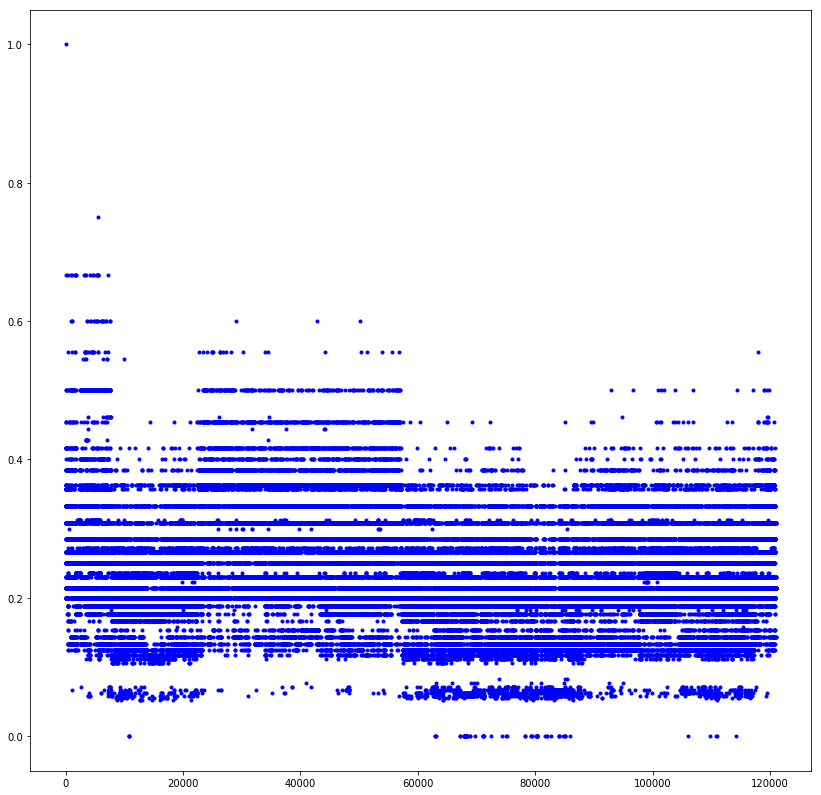

In [36]:
from matplotlib import pyplot as plt
plt.figure(figsize=(14,14))
x = [1,2,3]
plt.plot(items_j,list_j_dist,'.b')
plt.show()

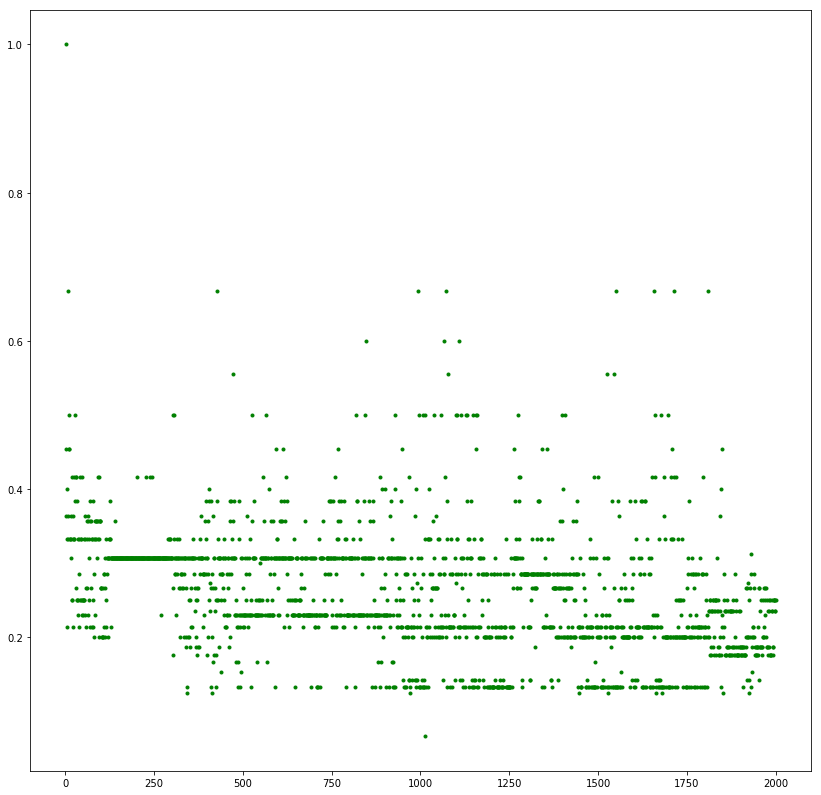

In [38]:
from matplotlib import pyplot as plt
plt.figure(figsize=(14,14))
plt.plot(items_j[0:2000],list_j_dist[0:2000],'.g')
plt.show()

# cosine similarity

In [39]:
import math
def cosine_similarity(v1,v2):
    sumxx, sumxy, sumyy = 0, 0, 0
    for i in range(len(v1)):
        x = v1[i]; y = v2[i]
        sumxx += x*x
        sumyy += y*y
        sumxy += x*y
    return sumxy/math.sqrt(sumxx*sumyy)

#print(v1, v2, cosine_similarity(v1,v2))

    

# Query for calculate similarity

In [42]:
query={
 'state_code':18.0,
 'record_code_iodine':3,
 'sex':1,
 'age':5.0,
 'weight_in_kg':5.0,
 'length_height_cm':59.200001,
 'haemoglobin_level':9.0,
 'first_breast_feeding':1.0,
 'is_cur_breast_feeding':1.0,
 'day_or_month_for_breast_feeding':5.0,
 'water_month':0.0,
 'ani_milk_month':0.0,
 'semisolid_month_or_day':0.0,
 'solid_month':0.0,
 'vegetables_month_or_day':0.0}
print(query.values())

dict_values([18.0, 3, 1, 5.0, 5.0, 59.200001, 9.0, 1.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0])


# calculate cosine similarity between Query and dataset

In [43]:

counter=0
list_C_dist,items_C=[],[]
for row in df_concat.rdd.collect():
    l=[row['state_code'],row["record_code_iodine"],row["sex"],row["age"],row["weight_in_kg"],row["length_height_cm"],row["haemoglobin_level"]
       ,row["first_breast_feeding"],row["is_cur_breast_feeding"]
       ,row["day_or_month_for_breast_feeding"],row["water_month"]
       ,row["ani_milk_month"],row["semisolid_month_or_day"]
        ,row["solid_month"],row["vegetables_month_or_day"]]
    dist=cosine_similarity(l,list(query.values()))
    counter+=1
    list_C_dist.append(dist)
    items_C.append(counter)
    print(dist)
print("Done!")


1.0
0.9922111605764552
0.9997249634071712
0.9995049353181534
0.9720133197271947
0.9941434040822239
0.9995787902443037
0.9958045166413401
0.9997960994425382
0.9993955280429387
0.9982832625590102
0.9989187192864263
0.9961766745765642
0.9957964375733359
0.9786180063353056
0.9933350292158367
0.9934233909696912
0.9806335574294991
0.9919544814226601
0.9961380580964133
0.9991563875153014
0.9941468175376533
0.9722992383105244
0.9937990233599423
0.9936603155975898
0.9906404033242943
0.9754401020127665
0.9934625417959362
0.9683209388211116
0.9906159789852303
0.990496442785964
0.9799544752766453
0.9799544752766453
0.9691246654847598
0.993573677884107
0.9935876382897258
0.9800701892141167
0.9934356518549755
0.9680979201410436
0.9750382451307558
0.9907000212187663
0.9935021263155457
0.9917072363105108
0.9903330783835708
0.9799211985704647
0.979761639601855
0.9902318112435126
0.9802727414110186
0.991809506344067
0.980211930569294
0.9802502659415909
0.9801470794250119
0.9932122476546807
0.96973398580

0.9241538621778482
0.9771788379687866
0.9268975685468327
0.9268236571340319
0.9271389710347979
0.9271436333041679
0.9254026443923972
0.9260527887412007
0.9505748268207019
0.9772690091132675
0.9229122804362965
0.9257365681921838
0.9774636055583246
0.9264148816940253
0.9698591055276649
0.9499063002686051
0.9572708305185522
0.9615350463994652
0.9503772645228631
0.8739279710586194
0.8643043702441319
0.9088744612978603
0.9890699740786605
0.9145416819278875
0.9056319436957807
0.911916710482479
0.9077204311178187
0.8740686929843793
0.9307002971788056
0.9073869860012274
0.9076190027005189
0.8697807451688273
0.9084533505486793
0.9059539952905601
0.9079755173805865
0.9090063357720614
0.865657064034972
0.8611719242901184
0.8679516967553053
0.8761638069688206
0.8755512877861612
0.8656470455695219
0.8751627060719183
0.9744659698462945
0.8739085771566482
0.9072417332834498
0.874782905921986
0.8747219550654604
0.8756202814212485
0.8754950163873705
0.9562831580515287
0.87266091477608
0.877924073339528

0.942683302003284
0.8853736541584034
0.9640085261829738
0.9628219858180725
0.9101098157431675
0.9574753440809001
0.8764018024631534
0.8925700671722977
0.947723003923406
0.9585687178918475
0.9169986714176691
0.9655842667340316
0.9643699680297713
0.9354904106294999
0.9667420852577845
0.9818081970803365
0.9558486968847281
0.9188712444811888
0.9189987796747989
0.96113122367221
0.9176523091274349
0.941605898517643
0.9504177481821378
0.9575672845861114
0.9352710833439518
0.9649634109577248
0.9705477354014431
0.9175149855036271
0.9728918940452349
0.8971720716918202
0.9406988143974295
0.956638261165735
0.9278116733500225
0.9556652072618822
0.9761899039795155
0.8829596138918343
0.911216543736863
0.9118151783254754
0.9722205855347124
0.9663285042048759
0.9955356292769305
0.9175485349996376
0.9582738801426993
0.9582738801426993
0.8858545771043652
0.9400484202332069
0.9619897555521953
0.9726314885480235
0.907414879898368
0.9535262052963521
0.8928472911232905
0.959669399408691
0.959649469801312
0.9

0.8926467907251988
0.9153056845492392
0.9385398340415583
0.9013691238086102
0.9029732435802296
0.9297520532451351
0.904614042282299
0.8948485949801552
0.935362849227581
0.9019335254348457
0.8994498194418208
0.909711434724456
0.9168229217505424
0.8982316691752555
0.9097837237825779
0.9412310276557282
0.9426194559976862
0.9473070068779443
0.9335165195325051
0.9536243627413945
0.94795736162586
0.9539880054212785
0.9261627342175008
0.9222713793763382
0.9411095269406234
0.9246054893365189
0.9563815864739612
0.9516957802013122
0.941062722655234
0.9113469176419886
0.8855957575413712
0.9504391428518958
0.9347220886860891
0.9175829068812188
0.947389411893477
0.9318543814541618
0.9522657972706702
0.9507981390348628
0.9163737590599454
0.9510488688980594
0.9659032141186394
0.9616832556076778
0.9648229685910292
0.9532169557421607
0.9570389494187043
0.9624914894302601
0.947258775224837
0.9614791730102443
0.9538634513418048
0.9520160812192058
0.954240349329793
0.9587932668339555
0.9509559934389561
0.

0.9277623408719368
0.9277292776797792
0.9279165929431819
0.9292046006982315
0.9276917799662676
0.9278485067543503
0.9280511169957106
0.9275219022250942
0.9271954573238667
0.9277252715124944
0.9285976137676547
0.9288957875912073
0.9288082687168606
0.9912755084929387
0.9511890212348989
0.9511699245023678
0.9511699245023678
0.9259249981687895
0.9404422249336435
0.976267722005903
0.9591997953128484
0.9604225132997672
0.9288439827567994
0.9711310729236844
0.956922167486368
0.9917086892988117
0.9666874933855863
0.9842571031722648
0.9983988871126196
0.9430188959342962
0.9780676844343877
0.9603852019307355
0.9584290567147354
0.9670888698970995
0.9931106580825086
0.9384261234298488
0.991367112763011
0.9694871159184413
0.942402552734137
0.9381329899060294
0.968024756075969
0.992139036245191
0.9436400608686825
0.9361356833777458
0.993710993145946
0.9377215118477473
0.9929957492172726
0.99445610706392
0.9568666111582236
0.9373806205362991
0.931995969028503
0.9774596035624235
0.9387829057023555
0.9

0.9971782307810104
0.9961952238072127
0.9857482146643575
0.9774369279033384
0.9974679049471815
0.9955850471365381
0.9885055553739602
0.9753863598835936
0.9756197348901573
0.9665422326923641
0.9224301156478778
0.9189282069442938
0.9475536194505951
0.9497084229124894
0.9606495066109364
0.9647677122502852
0.9637223245128973
0.9038674055689523
0.9288636970581718
0.93204184245399
0.9558146203162813
0.9665767893946621
0.9966964696019931
0.9701008733812182
0.9718882541642877
0.8990848245492228
0.9199560307324902
0.9196742643530006
0.9101909870988217
0.9149466441583086
0.9447256055610902
0.8959360143499765
0.9372393166673504
0.8946891522858327
0.9398638400590097
0.9373024224061735
0.9413519109391596
0.9040131706177343
0.9036787886310386
0.9352676308718187
0.9020350263778832
0.9140106871189008
0.9456102360991168
0.9098986740467573
0.9156016873139945
0.9705539761838593
0.965262305793176
0.9784643545649001
0.9946345042277358
0.9753573739706494
0.9785182915675039
0.9552449184625673
0.9808474647620

0.9850957064037124
0.9728085720566347
0.95635930064544
0.91584729106839
0.9458938511284153
0.9439675611511086
0.8969595923043319
0.8944004776726603
0.9207622940306657
0.962294334452889
0.9053369142547958
0.919865923648212
0.8936291077113135
0.94925201814448
0.9381754195681319
0.9671727190683889
0.9651405470125587
0.9610308237125669
0.9046966981169918
0.9491860879988661
0.9595668290100923
0.9804738027814722
0.9770894680497058
0.9755489339882647
0.9750421775667707
0.9788988348492663
0.980975616732293
0.9997014060522413
0.9956749827190714
0.9559680544201359
0.9545611089917719
0.9690331282324814
0.978414880675941
0.961566966898318
0.9772315070621331
0.9567586915588223
0.9681896079366944
0.9692709679670337
0.9804701144127296
0.9419716062344232
0.9237137619152591
0.925292003653477
0.9125981647611596
0.95644998504721
0.9144854945873726
0.9153028702464273
0.9482888750011029
0.9388147983615667
0.9444103393722134
0.9392673650647783
0.9363745102815465
0.9434461419129014
0.944290333363641
0.939885

0.9196746528488302
0.9972406090760194
0.947542391539958
0.918162107453782
0.9659029540081161
0.9619357934044597
0.9186834273960984
0.960164454313785
0.9128394758616069
0.9420276740533992
0.9441280796279246
0.998041473069325
0.9439213834319778
0.9709791589158228
0.9534941552329708
0.9445548759493522
0.9321916500533756
0.9587957764047498
0.9249255345041528
0.9422900705573936
0.9224382222680875
0.9232294698190937
0.9983029678395995
0.9232778211852113
0.9992924997170569
0.9980064643456479
0.9432410515267166
0.9366198349484629
0.896517645347972
0.9984487255021774
0.9371010219402053
0.912937080771975
0.9480061795155639
0.9562719902449794
0.9290593473182156
0.9356433214334033
0.9539843078493576
0.9420029150918614
0.914884755387726
0.9446789990735235
0.9488694945795291
0.9496248742261943
0.9612786601469206
0.9909690882784657
0.9993567042971215
0.9457608445711182
0.9675150349328551
0.9207632739501397
0.9492585490873385
0.9475038019312324
0.9447001349868579
0.9572984611654874
0.9426764842652502


0.9529305213224961
0.9344082526614127
0.9395064962605835
0.8997963964129784
0.9413018587556289
0.9555433768884316
0.960100093425197
0.944971698704261
0.9610409617693803
0.9318523447193523
0.9551340590991789
0.9143245863203914
0.9984486872242779
0.9655622609008422
0.7327765259635053
0.9965932701066632
0.9708357350143413
0.9865242472145671
0.9631437853448128
0.9613371413202003
0.967499745143216
0.9291536768552092
0.9985546407556718
0.9539810398785664
0.9735162966485599
0.9772158042264695
0.970060614826009
0.972578545826473
0.735505785675595
0.9709606500136762
0.9693248029831413
0.9963673977750873
0.9997160582355792
0.9989070624532327
0.9723780404025678
0.9841152536826815
0.9715983133720827
0.9755847143136747
0.9716461756425998
0.958505699978325
0.9724055091669455
0.9629553863970209
0.9622157282271578
0.9664042410278917
0.9758253970945561
0.9681957198763521
0.9697483214795481
0.9729551603098954
0.9750827807575935
0.954406255595595
0.9716067682219307
0.9137044720713803
0.9564510131193527
0

0.9557696662664804
0.9653557189514039
0.9717083918682339
0.9724366723125792
0.991330331113359
0.974568491785781
0.9063496981402096
0.9770755563628862
0.9809571678669728
0.9779085374124546
0.9990080535954915
0.9687876386190761
0.9629398893890473
0.976058773316063
0.9956375169998247
0.9693962917048841
0.9766997805573097
0.9794680741055982
0.9611033552367915
0.9795388377926173
0.9963879556878497
0.9653933594536885
0.9677984740797101
0.9995886489331945
0.9571146742494813
0.9678001831890435
0.9725695469809844
0.9525351302268371
0.940005506498312
0.9712083234425165
0.9985222195644524
0.9683057999974674
0.9996439977180751
0.9273507453842914
0.9443631858027888
0.9927394422741702
0.9638427158801296
0.9723088574332907
0.9912314023430187
0.9647229788832967
0.9696984504474686
0.9377909557307698
0.9760697516765874
0.9676556142158312
0.9558864203751213
0.9691978487128136
0.9970182199384435
0.9715634265291879
0.9790868372383912
0.9591220638128504
0.9965351889342285
0.996014449445958
0.923424208993829

0.9783322782108772
0.9769337923281558
0.999143310160966
0.9988000376842577
0.9831552320279718
0.9743908987652258
0.9720429511527007
0.979112199776211
0.9746019581274654
0.9953866773549278
0.9930274558363095
0.9715416711609679
0.9838332971557981
0.9954908111219045
0.9661949269205399
0.9760620715028334
0.9183354089489463
0.9174362791541677
0.9221067707398876
0.907858184396607
0.9131284430070733
0.9083903958208387
0.9048719747676838
0.9094817684014049
0.906158961838746
0.9129385168774314
0.9209600183813107
0.9161313672638222
0.9748127125149255
0.9344711987495014
0.9670945183871051
0.9083549498192586
0.9608958629585344
0.9197367037372206
0.913533469654602
0.9135043703377786
0.909905865699601
0.9481149952097568
0.9170013257372132
0.8957671203540987
0.9515347199196781
0.9409501638294994
0.9499794608659616
0.9062600601295548
0.9237373010415862
0.9450021886097413
0.9440325576932505
0.9441776032522284
0.9206841862550003
0.8993581282856279
0.9560248983785753
0.9402680695775842
0.8940513953122958

0.9937222764871853
0.9591425711763698
0.974739786028117
0.9465133684700834
0.9889050478373542
0.9757604443836333
0.9209929203628598
0.9277405144337038
0.9189420599936065
0.9196093567962407
0.9302779398894342
0.9539112909908888
0.9310374111215658
0.9553221639291933
0.9463475574265127
0.9462920111025717
0.9141336696287652
0.9488739614998197
0.9533668975128918
0.9539555274407077
0.9211141778142956
0.9171621451309785
0.9112170024073735
0.9499840016283273
0.9095115992426541
0.9288735998728056
0.9593050517206427
0.9681352940612595
0.9444602316991078
0.953562670255513
0.9636818926077374
0.9599271767303563
0.9589152287393734
0.9558333939330975
0.9440684544958512
0.9620320626742493
0.9635647264171083
0.91998023320519
0.9623015753854103
0.9460416355458626
0.9234777051271587
0.9221524311205505
0.925480459277631
0.9626873578296612
0.9666218164860361
0.9809959522406098
0.9932139528525371
0.96948022376738
0.9937721807580362
0.9993444597798512
0.977074469326704
0.9985424812096323
0.9494462651519749
0

0.9248244931919687
0.9516364085115677
0.9520995735928275
0.9621134636129917
0.9465965576595535
0.9671545671275987
0.948993886132971
0.9483268192001799
0.94972648092766
0.9720224707698023
0.984806965767811
0.9393731874417042
0.9760346881826849
0.9908526354591867
0.9983228024006676
0.9987185364130216
0.9819557346765287
0.9662814659279968
0.9842430521506171
0.9921777218218663
0.9706003462101113
0.9790885323598078
0.9864915659239928
0.9846656651114354
0.9987704320431082
0.9752035388448522
0.9810118682631009
0.9715121070010778
0.9914681627664755
0.9981706029518557
0.9878575729492319
0.9666046724082421
0.996913472493952
0.7466208480894615
0.9644755925569672
0.9240597128413314
0.9947848838123543
0.9824957713884833
0.9972305840065091
0.9983950741750013
0.9792113454898103
0.9646641311283141
0.9220276599168877
0.9404070233013986
0.9233533425730287
0.9389477170053403
0.9353390896130843
0.9274617385240699
0.9220454679097938
0.9228721827888864
0.9229319729292255
0.9290815159788194
0.927227912611623

0.9457324973881941
0.9454259359341509
0.9455002123894808
0.9400596080054827
0.9439631655727407
0.9423539349888961
0.940043866742111
0.9481931877402876
0.9309454272619464
0.9235245844237897
0.9481251751836626
0.9425776810016461
0.9467728461021947
0.9384264269293989
0.9488293052483594
0.9428405379151817
0.9399436168141024
0.9500680840958299
0.9484639977466615
0.9458125623724911
0.9286179179059104
0.9468601393555863
0.9411304935740112
0.944874073405363
0.9465025344822564
0.944457331880446
0.9462615811142003
0.9470762837367913
0.9408722263791514
0.9382425964093082
0.9430677872658705
0.9476447303555539
0.9326036199651893
0.9236827333722032
0.8953118094280782
0.918248527651177
0.922668111669607
0.9118512988331469
0.9260361239769791
0.9071098695434588
0.923439805153473
0.9269105497682033
0.9095486360152675
0.9164434275977651
0.9014054080801205
0.8856909130689289
0.921988257640465
0.924815676580931
0.9198277791126841
0.9155351045527258
0.9295081176857227
0.9119400650320556
0.9280054907439085
0

0.9545865393810952
0.9000737910567822
0.9601574049108618
0.9472708543793663
0.9457981240063124
0.924343342773573
0.9614898253459001
0.9617831992473265
0.9519210412157083
0.9233067654871988
0.9908966625172115
0.9505535232407792
0.9762849391879438
0.9164931315763684
0.9003346151557217
0.9614487531033414
0.948308509608265
0.9860176893874748
0.9279167916505544
0.9876970918640766
0.965256717878476
0.9941271035835368
0.9908283969173399
0.9578322372198453
0.9188635095215097
0.9470618831068752
0.9485554229816724
0.957750705703171
0.9286515958447142
0.9279167916505544
0.959171425459096
0.9425303042559121
0.9565840041122772
0.9161058789199932
0.9439938803310454
0.9609390754890915
0.9635490118335653
0.942976175671345
0.9279167916505544
0.9279501547962093
0.9504787660755826
0.9495003244505045
0.986464322116373
0.9000647910065362
0.9500349960080524
0.9556417610510621
0.9584039642751067
0.9681671111449048
0.9413079444798925
0.9571019879717232
0.9610008288867347
0.9682887738535195
0.9505364270195535


0.9259036789489236
0.9609762628027052
0.9528784425078715
0.9268111823890575
0.9762859985241139
0.9821954513935528
0.9243165508268372
0.9468637928382304
0.9263170582494409
0.9358091418214167
0.9608540061903855
0.9498459622538692
0.9524648955137832
0.939437159966017
0.9630361705728976
0.9725460327202837
0.9989570652948333
0.9584188976497473
0.990704538224033
0.9322162480561629
0.9478617803287989
0.957153234278582
0.9095946536851071
0.9134680316327104
0.9375008031256621
0.9536930287259876
0.9305187179570534
0.9318222457478774
0.9427523085079098
0.9113302380567179
0.9389379470551431
0.9554033333326668
0.9381997586370764
0.9040331897706404
0.9313578443848914
0.9599499863476215
0.9341255206973653
0.9413811411442955
0.9926491621264072
0.9529213052066925
0.9884482860892095
0.9111146336459031
0.9615028450011618
0.9373021684021758
0.931613202809464
0.9628886589972852
0.9304010923716789
0.9306244128807206
0.9058972096513577
0.971948405241237
0.9243824681860796
0.9906227285125817
0.966022862880972

0.9205821114742725
0.9571304421555678
0.9357874035214447
0.894521962829635
0.9363086179800377
0.9580412952529727
0.9326137751530099
0.9045175903701771
0.9372461155228508
0.9441412744604157
0.9449516780591861
0.9216722464851893
0.9415282767250611
0.9321137094069053
0.9383830960271785
0.9881151255723993
0.9259009833973729
0.9708629854603716
0.9498553666228884
0.9381734893847237
0.9565768450962256
0.9587061813748585
0.9142944050059225
0.9311082087849084
0.9926869436853765
0.9171544517283815
0.9838837528710785
0.894500010397601
0.9694214171093972
0.9182404472528944
0.9760226045353532
0.908928695535325
0.8866920154983953
0.9401841118937904
0.954285393993121
0.9223027889584093
0.898685989556358
0.894521962829635
0.894500010397601
0.9315879224944205
0.9219111494993801
0.943869310978633
0.9551207833799332
0.9218757873286951
0.9665582825938025
0.8924997137531451
0.9042704749012771
0.9332801823727048
0.9323840674093135
0.9443001200705458
0.9105257777930578
0.9564533256833309
0.9421899139557487
0

0.956544512938659
0.9725130707690676
0.9889481725234278
0.9882724167461485
0.9390622347056027
0.9572904643057144
0.9736370447500403
0.9655168080317574
0.9813495982398646
0.9410171902339298
0.9411222412991181
0.9518145281151074
0.9906729438142946
0.9328999204587105
0.9391162232356436
0.9810104317406345
0.9251362127653305
0.9663952910332111
0.9614407785512422
0.9453233397111637
0.9388756349031404
0.9967970764474665
0.9398542779587976
0.9724211451645786
0.9276307617655883
0.9276620359482171
0.9386432459306739
0.9721093829175297
0.9366294331905344
0.9503679512535269
0.939578840798494
0.9369667373272086
0.9359823735959083
0.939360998978638
0.9512361072799423
0.9548779820950413
0.9652933163040806
0.9146926087872346
0.9725778155337256
0.9628849930247925
0.9572667895166925
0.9263363334311353
0.9723439731013102
0.9511443328489744
0.9725725744504979
0.9370185961079504
0.9982379364507696
0.9973853105121089
0.9208481576766061
0.9883510017065145
0.9278293360263317
0.940959988685305
0.92681481984462

0.9891348624861253
0.9602812915911031
0.9816786674547512
0.9311915096554879
0.9608372383643206
0.9069235296108313
0.9864339840780646
0.9840153059732137
0.9095666306391829
0.8565997676896031
0.9230412163692135
0.9044767343277383
0.9305341883075027
0.9886895238353559
0.9946351800563583
0.9546354442561853
0.9212228620024382
0.9486887014722989
0.9567572245033958
0.9811195320615737
0.9422387145052434
0.9505925371557028
0.9212127240274477
0.9534228200192021
0.8953995902300348
0.9323352606430585
0.9984345342716993
0.8471450828067912
0.9007025735352098
0.902610359328933
0.8956043170260877
0.9367335617021936
0.927352812932093
0.9007217210870933
0.9447975230633752
0.9043653819219344
0.9461475579325327
0.9024805528729319
0.9689642759815479
0.8984436546607707
0.9977964096166883
0.9264403367526505
0.9963717677938047
0.9945036021435419
0.9583971843611784
0.9099271601849452
0.9640702428652036
0.940604456817066
0.8794194019033993
0.940604456817066
0.919208417243564
0.940604456817066
0.9189362945164634

0.9266398389896582
0.9813496555680505
0.927955103606706
0.983087609241805
0.9083219789943149
0.9454978491150614
0.9811452158721243
0.9537097852192074
0.9468350234871327
0.9892391911713487
0.9763414226972682
0.9931894876726393
0.943331445790009
0.9579581244427274
0.9905076867074406
0.9641738350945382
0.9650829411909884
0.9866282460196178
0.9281412391371671
0.98894455163506
0.9905520125869619
0.9064238506165758
0.9954075161674116
0.9303030007337768
0.991693223829846
0.9872204546692339
0.9356507503258238
0.9867962691671445
0.9279859066577255
0.9315918323814527
0.9519693580632765
0.9078326098185666
0.9288569714799914
0.9212850981232303
0.9921053585280626
0.9021526719216685
0.927955103606706
0.9308716145074236
0.9863553222313388
0.9519693580632765
0.9949283176599863
0.9519536426073735
0.9327687734188749
0.9144921587073652
0.9983549402343395
0.9415740133074879
0.9940819096477537
0.9048714511382608
0.9698610827882218
0.9175373464182589
0.9533487072704593
0.90064407930219
0.9010188572533987
0.

0.9081046825490389
0.9519536426073735
0.9334016758654927
0.9313910967056042
0.9298311614136667
0.9519536426073735
0.9336061417207138
0.930321856783442
0.9297660046651258
0.9497701870150408
0.9314062426117768
0.9528904425365009
0.9531208295310496
0.9528426358416316
0.9638693107374864
0.9309651203974023
0.9334538617231614
0.9479668348790999
0.9315522716212452
0.9459490772971892
0.8919925631312882
0.9290319994591919
0.9417102061956186
0.9196209532618944
0.9459490772971892
0.9459664685171753
0.9358968681833482
0.9024625171326115
0.9887858061477713
0.921328380583959
0.9121382216556511
0.944775892641614
0.8985128944062941
0.9152863788772999
0.962864959539848
0.900047884293125
0.928453715485017
0.9372287024456513
0.9836190585106688
0.9280329099038931
0.9727576654910086
0.972969725899778
0.9242919767513904
0.953491585883985
0.8675687114344335
0.9274391291649103
0.9268401886480155
0.9406671104622885
0.8983865284106358
0.9233183937061509
0.9626835805995397
0.8984266792680324
0.8983865284106358
0

0.915199170345423
0.9742056630045299
0.9290881827522942
0.9701604333133149
0.9780344053179173
0.9248816381900625
0.9517206277770144
0.9626796637258336
0.92626020261505
0.9256280388412408
0.981147563531586
0.9626875330054055
0.9489371121485081
0.9716960667649803
0.973723045216865
0.9256280388412408
0.9183545444513829
0.9620710455880425
0.9256280388412408
0.9661799007766574
0.9682156777997137
0.9290581350992048
0.9708839751381324
0.9256280388412408
0.9736120705143728
0.9625590279775577
0.9304039800943513
0.9374878343663773
0.9318431559238624
0.9716551411763024
0.9489536736862885
0.9261475603763072
0.9512393715838378
0.9275258162010284
0.9256593116299411
0.9256593116299411
0.9279064107400368
0.9541490764528846
0.9271307012479296
0.9375972296786022
0.953725793187804
0.9584157694438131
0.9261561343002036
0.9439433235632904
0.9481589445105266
0.9180507373394571
0.9120045578832098
0.9415117228639384
0.9247888628227471
0.9925158740245311
0.927146828026268
0.9641772135404373
0.9479277534206049


0.9585346788071384
0.9489536736862885
0.9492636744269722
0.9306381208528607
0.9907652358909966
0.9489371121485081
0.9012286942464082
0.9234083504245527
0.9488867060257588
0.880440962202913
0.9650829411909884
0.9765200837566528
0.9256593116299411
0.9473831404892984
0.9676458480488302
0.9273092677322039
0.9307717530665622
0.9515492466959372
0.9008226772215316
0.9466154058880911
0.9529153396128207
0.9493955054719749
0.9559807418598935
0.8809798694472881
0.9608629076017474
0.8801490814896341
0.9489536736862885
0.931436415449292
0.8997704480833852
0.9557139862707558
0.9267813232974264
0.9305642475967174
0.9489371121485081
0.9005681575642689
0.9459886688175003
0.900788254282654
0.9374304795713613
0.9934827275375376
0.9513537929354853
0.9002838928783456
0.9252249644596842
0.9273878805940261
0.8810656273607249
0.928144938413803
0.9002838928783456
0.9633880178092841
0.9276308080923783
0.9256280388412408
0.9597707109927788
0.9256593116299411
0.9002440190010659
0.9019482359910378
0.92915465698387

0.9465452020122366
0.959099092428903
0.9546078687385668
0.9330867462709441
0.9598084332873303
0.9865953848070549
0.9957260651872325
0.9301511245774716
0.9168570275025142
0.9238480738559748
0.9560157133206127
0.9337127922653555
0.945238914918117
0.9874854667669688
0.9770108768813119
0.9357662834469009
0.8979284513658885
0.9452148255584524
0.9973683968738293
0.9555417823336468
0.9714542807100321
0.9476734174353922
0.9412154632201295
0.9951752788208634
0.9235807131730471
0.9864035895200837
0.9215298624372604
0.9019558603196612
0.9429517914876273
0.941923544029109
0.9259872512120185
0.8863061550886577
0.9017427661053243
0.9844158277051465
0.937256274381516
0.995373503192781
0.9928838788545818
0.9310000362045672
0.9879409679300962
0.9884537477412196
0.9908618951144423
0.9056135740036656
0.9290012723118909
0.9725938060610542
0.9301579343998515
0.902280307371758
0.9910905822023928
0.9335449091609392
0.9231266332288016
0.9989645856025038
0.9022567014768579
0.998170754132488
0.951430160593778
0

0.9266483868160499
0.95156336421877
0.9945265896260729
0.9163007428889836
0.9487346775331629
0.9273281099207291
0.9308963763819476
0.9615241255948713
0.9271777948161269
0.9625811602648993
0.9160767660305277
0.9159896498425114
0.924557232950289
0.9018935556140747
0.9987748370195544
0.9209254577159154
0.9290507901998495
0.951396281637913
0.9184548673678128
0.9472378406942312
0.9938121726761611
0.9979951681071764
0.9521211695814432
0.9992429531978554
0.9216477188087545
0.9988642797169183
0.9290726983466807
0.944007077843926
0.9456096442828831
0.9754897258523461
0.9083462609847502
0.922111617423449
0.912755672284152
0.9890929907887411
0.9941054930120095
0.983901848251508
0.9864357634938802
0.992679289073541
0.9227535423452762
0.9182523683321836
0.9219148900256268
0.9601280882656976
0.9065027904237659
0.962089810719385
0.9241539444452154
0.9109911952182611
0.9596351874554221
0.916381960134483
0.9714571609292422
0.916439570497099
0.9446018761614952
0.9497331123729806
0.9492889399653524
0.918

0.9737020698351033
0.9526791304006538
0.9182466355757198
0.8946390908309323
0.9182404472528944
0.955612816959055
0.9587093465851919
0.9526791304006538
0.8950105868398401
0.9365661020852534
0.8950105868398401
0.8950323928834261
0.9805106914505766
0.9565912416233299
0.9159660712550665
0.9331053868912339
0.9504792208575938
0.9315327024477684
0.9277496747737288
0.9185510129503401
0.9525477411505192
0.9738747793818849
0.8931842996821654
0.9454847418373402
0.9455022612390545
0.8943916234891408
0.9493439892180899
0.9364223914540062
0.9565961998152829
0.9588305999718147
0.9002894136738447
0.9566393846252004
0.9944403126831715
0.909327205438642
0.926087132158147
0.9432736664347281
0.8940409531390997
0.9226122937365824
0.9649843955817557
0.9635800428230147
0.9600008395148828
0.9356306390953606
0.9645418969374082
0.9325009330013437
0.9903760079930494
0.9190470620937449
0.9149733375953252
0.9652467457963414
0.9395430888630293
0.9608242884759287
0.9855242846083193
0.9399957543084201
0.9645105728624

0.9745161298783357
0.9652453092389598
0.895132733698826
0.91841845285868
0.9061342461989148
0.9349619956076513
0.9240615206065524
0.9154919031359625
0.91841845285868
0.9222522959720252
0.9566759504539061
0.9384153654926206
0.9566759504539061
0.9126624013664761
0.965878437289686
0.9216529929726935
0.9566759504539061
0.994450309253368
0.9732093905504662
0.9565200524292874
0.961459447940828
0.9425922360024699
0.9784153675707521
0.9355242359237652
0.9957322756792332
0.9283873437752798
0.9442893097090475
0.9633047020114145
0.9220765727781204
0.8942896136258952
0.9893409001987705
0.9608369534967566
0.9688769652552535
0.8735340469956688
0.9037810045085358
0.9802660429777704
0.9786935878435662
0.9408441377565199
0.9542242929269416
0.9221701558475572
0.9501887218157877
0.9654625487501192
0.9229590711124498
0.9072800617479203
0.9349616923216807
0.8998843228505454
0.9609148191650544
0.9165827882877222
0.9417838607740887
0.902792099605574
0.9549227551171138
0.9403239503892454
0.9699973703617784
0.

0.9229590711124498
0.9424212560320144
0.9275733199526306
0.9229908775838912
0.9375288094982441
0.9454847418373402
0.9184125982449812
0.9519667898101284
0.9262649050658095
0.9184125982449812
0.9865839757605638
0.93346876407232
0.9919052876110128
0.8951106930045689
0.9142079892650908
0.9184125982449812
0.9102787273868859
0.9942082030356725
0.9184125982449812
0.9184125982449812
0.9871043788870338
0.9604005640137472
0.9157275566983522
0.8921148994146334
0.91841845285868
0.9143119362226814
0.91841845285868
0.9741641392475408
0.91841845285868
0.8735269981371582
0.9566494251182479
0.9566494251182479
0.9603237248978883
0.9458948696389327
0.9054800637236077
0.9118716177346169
0.9750878551342901
0.9229590711124498
0.9275642446535797
0.9398634213872435
0.9234441438644561
0.9442486882230524
0.9454847418373402
0.895132733698826
0.91841845285868
0.9455022612390545
0.9636638418045638
0.9522481770869532
0.9238885352644398
0.953853109374412
0.9956336359038284
0.9128631810483541
0.9454847418373402
0.956

0.9893564856850132
0.9739561274701437
0.8735640706047271
0.91841845285868
0.9184125982449812
0.8951106930045689
0.9285237044152522
0.9847198621170139
0.9847669135025291
0.9417520717446424
0.9350024258049787
0.9058307174894564
0.8735640706047271
0.9081694868575124
0.9559644914868031
0.901179678720258
0.90562165839441
0.9245990405436328
0.8990660076201966
0.9642144433905883
0.9381644109499607
0.9477974731721479
0.9057740743690446
0.9717555084795592
0.900105654375485
0.94398229665034
0.9526059263188952
0.906090313171177
0.9156159588053211
0.9680134001858344
0.9559767362090786
0.9805593620903934
0.954192622511216
0.9056486362249196
0.918609038297523
0.9330221277385464
0.90794958607123
0.9336736279221957
0.9048755978075594
0.9330430125994877
0.8788789772455022
0.9330430125994877
0.8900925279905618
0.9454847418373402
0.9508110065248728
0.950014593295409
0.916645751217706
0.9659748054222566
0.812353925906266
0.9050028071652007
0.9260275504039434
0.8718618500902556
0.9514664396432243
0.9138175

0.897472777560916
0.9464699045619429
0.9291236958931193
0.9497248757616363
0.9519526203848253
0.9055160760887092
0.9261436433451306
0.9161273366515065
0.9078211678914002
0.9186435944228029
0.9448329332694141
0.9243241994537356
0.9229908775838912
0.9150800132955218
0.9478491117679143
0.9281768790100879
0.9242483107131414
0.9466054169606408
0.9454558002586512
0.8486878078108339
0.9469772733566784
0.9026898589900472
0.9935309524958058
0.9170254613404145
0.8621813458366179
0.8609219042205993
0.9281418174633622
0.9467290418928527
0.916619861240208
0.9219576490835067
0.954934330835404
0.9453856816960864
0.9372973623276292
0.9665384971178633
0.9471814822116386
0.9331236649065572
0.9579386161426823
0.9275118972360599
0.9529464537335227
0.9643417172301181
0.9816715394256595
0.9910074026780535
0.927030630893406
0.9584769486588105
0.8870234596043635
0.9388247869957626
0.927480998148217
0.9250395151731859
0.9517967552563961
0.9513385816859184
0.9522806475762189
0.9560421362042374
0.903459730864836

0.8787155659990722
0.9511549084536659
0.9276252153705768
0.9215876320766306
0.9283568381463055
0.9497378811853857
0.9547353060732355
0.931115378623384
0.9358381626272537
0.9376740966340196
0.9496770049745896
0.9083972473140804
0.947275528573303
0.950229096289025
0.948721065998132
0.9386190621503161
0.8924017153509219
0.9496061156552761
0.9711816622604255
0.9929605591615634
0.9207224879155779
0.9454847418373402
0.9283875596861061
0.9283568381463055
0.9020336192004537
0.9456126276514062
0.9260281020265316
0.9879074295166376
0.9213842625824818
0.941377512798581
0.9467930270239807
0.9475031375684562
0.9422144184468895
0.9283568381463055
0.9283875596861061
0.9261791965038653
0.9676721540400751
0.9989474817756536
0.970661919806779
0.9287179631549235
0.954992336211734
0.9213182578021746
0.9597816733215321
0.965840715147008
0.9828381150239214
0.9534977449717277
0.9471171582422938
0.9134449534811137
0.9524905799503303
0.9471791552428511
0.9633226111450984
0.9299821096965988
0.9236897486150403
0

0.9648423857853277
0.9330021606942351
0.9246480476742684
0.9608109778427716
0.974233068756738
0.9609111565951834
0.8799825316799661
0.9544786334027395
0.8735913170185077
0.8950323928834261
0.9169977628410804
0.960096550757553
0.9420656004035111
0.9665865432481304
0.9182404472528944
0.9609392520549902
0.9221122010530243
0.9364067851403406
0.9451290485293476
0.9209412418262886
0.9664836926318925
0.9492836938883169
0.9042066604323511
0.9154817554975178
0.9469985813550037
0.9060458474007592
0.9527652984921949
0.9110500584584625
0.9261090402866287
0.9903715030092579
0.994046372888037
0.8950105868398401
0.8735640706047271
0.8480179016336223
0.8950323928834261
0.9371447449312607
0.9213198650057667
0.9098560350612279
0.9182404472528944
0.9222983812018278
0.9637559325043047
0.9182466355757198
0.9566181280174613
0.9094480187610422
0.9334615229240822
0.9249300359766869
0.8772915482499788
0.91273846276258
0.9712150859213499
0.9607189431071284
0.9736054054970585
0.9304977430950774
0.954493428675206

0.9389943933504092
0.9972302281360931
0.9400821556047148
0.9503049536574493
0.9987640810168764
0.9346426091258122
0.9617682653095391
0.9631255882335263
0.8943261591515144
0.9390737928150364
0.9137844759870022
0.9061691115415916
0.9448307312206989
0.9491167460832695
0.9573241999390569
0.9629901008230692
0.929158201360106
0.9500495811373537
0.9060458474007592
0.956831476454112
0.9502534392538905
0.9861304535699524
0.9883364600981974
0.9911400321626302
0.9230758580461452
0.9217781482231734
0.9163138883353016
0.9493959405729326
0.906619946471867
0.9396970701645365
0.9060044064465769
0.9283859085745918
0.8994269749041749
0.9286515958447142
0.9382033369250277
0.91273217742855
0.9496781487425507
0.907119679032775
0.9382234812728338
0.9417786353529286
0.9305695293958464
0.9550709808162972
0.9345179237532402
0.9535775229986075
0.9497248757616363
0.9164432073085003
0.8908255483929625
0.9443436726261607
0.921203145730739
0.9436200051197479
0.8993336607335399
0.9932437045352323
0.942982692168693
0

0.974187722761384
0.9722667698961001
0.9748691268649986
0.9411773900483075
0.9431825589584788
0.9559533151506172
0.9694479195786807
0.9652311501381305
0.900707306803256
0.9154555806427588
0.9137916019783779
0.9893096643729008
0.9778383549508576
0.9068514146366121
0.9373853240685278
0.901593703241879
0.9149973683056194
0.9303934886702528
0.9488503728300982
0.9290301142827961
0.9186105678903312
0.9386414125713005
0.9168257761632908
0.9392052214640915
0.9328629824749191
0.9792001851028852
0.9412484131666388
0.9704103821513902
0.9179159317479334
0.9166954579808982
0.8770387976465492
0.939696852947365
0.967802103550307
0.9326552243737469
0.9914940317584373
0.9328592523843433
0.9659379835845208
0.9395126739665589
0.9627256812376671
0.9590616479091127
0.9926114554707219
0.9562467693247326
0.9633609578034081
0.9729326426219566
0.9623621522829515
0.9713860048033144
0.9618830541488328
0.9322267880074416
0.9636918123078736
0.9590486677459581
0.9575177075112848
0.9575059443988216
0.957983016381179

0.9365499752601634
0.9366445848980008
0.960772652534678
0.9609332323387567
0.9605806710031848
0.9328300508823331
0.9365340869296576
0.9364730986874655
0.9545730307626323
0.9094185893350936
0.9637559325043047
0.9366207336310249
0.9608898854646704
0.93576787014638
0.919875330364006
0.9334616710844408
0.9492943433131559
0.9338230190786705
0.9452263012426763
0.977105538471729
0.9406006833422813
0.9182466355757198
0.9210545315051366
0.990575433090157
0.9679618348160043
0.9912702261348213
0.9750003124201111
0.9507456901682888
0.9650547834574753
0.934028526401219
0.956641896872618
0.9480405876216785
0.9545685225885195
0.955851568080671
0.9926491621264072
0.9582418258352648
0.9292091879845599
0.9560927439904888
0.9810173726041619
0.9707169613337582
0.9630484313030406
0.9569325110703292
0.9132518417049001
0.9323625305274318
0.9264973282040483
0.9542882569188844
0.9595093086580607
0.9471082760028178
0.9755846039287315
0.9469486316176733
0.9525056420241123
0.9021296224397656
0.9730151537868774
0.

0.900681037487965
0.9470848548415355
0.9753821732040879
0.9007208458752256
0.9754670839473703
0.9732240232742575
0.9729198826000588
0.9482598482124691
0.9775817443346149
0.9226255769487857
0.900681037487965
0.9261718736656503
0.9794944244016835
0.9275021501296707
0.9261718736656503
0.9427797769689008
0.9278504987093412
0.9261718736656503
0.8876640025950079
0.9550716425136272
0.980742205049753
0.9261718736656503
0.9252791847994037
0.9624844645409795
0.9279346813764678
0.9749980800427825
0.8851431831929963
0.900681037487965
0.9007208458752256
0.9261718736656503
0.9625628989917066
0.9205207966132196
0.9487691566425149
0.995362564829184
0.9205449450339575
0.9961529343995565
0.9905011786444711
0.9573186035188951
0.9277520012696286
0.9339723219110649
0.9461911433863528
0.9960255293023691
0.9590714858067857
0.9487655282474208
0.995104841338772
0.9953264057101905
0.9607198050843179
0.9644680196455961
0.9588411690481145
0.9957353201803731
0.8967347731482428
0.9932705929402292
0.8972548335973136

0.928698784996761
0.9992502005361841
0.9932093697238699
0.9918734049965655
0.9684161757044395
0.9835858194041314
0.9553502235622984
0.9910120191451572
0.9936687233049457
0.9970704794472894
0.956184229939502
0.9012624383738795
0.9250154301814746
0.9419537750488625
0.9572519200139951
0.8956727679854615
0.9482888476942785
0.9341895070300807
0.9820388606043837
0.8950106679891654
0.9107868844324145
0.9913917424474824
0.9226141945490193
0.9758250487493952
0.9749348409309093
0.902123094201013
0.9429282763804189
0.9726293108316653
0.9717103604288078
0.8824226732028341
0.9829189498727424
0.8975600579342059
0.9741546464231658
0.9750815635287483
0.975813865520855
0.9766776406441621
0.935203303546873
0.980188120992381
0.9825535880172143
0.8975197785930669
0.9222736316491655
0.9050726743086565
0.943914042156558
0.9387313429027621
0.9725883231983729
0.9750498277560791
0.9222416826517781
0.9748234030982021
0.9189486720227316
0.9570531107519923
0.987408334434044
0.9798635442939834
0.9545002487537448
0

0.8293787518520186
0.9531861844500183
0.9729647700723257
0.9791627175119151
0.948977973254356
0.9766265630612654
0.9086279475358556
0.9229843328187397
0.9222416826517781
0.8947489670467941
0.9545607951464028
0.9106678414094935
0.9402325807906743
0.9241564628202568
0.9652829972133663
0.9981044769298012
0.9971573579020805
0.9299362985509065
0.967114432263701
0.9961819987902717
0.9600823828684993
0.9854009327396706
0.9742155619791173
0.9463628036831558
0.9597326090510451
0.9751645347583235
0.9601400859616563
0.971576115267375
0.9484845235922053
0.9673833616927525
0.9429695033101759
0.9274200971280563
0.9514947739339281
0.964002549347714
0.9392755961095145
0.9349139344392163
0.9926331289608007
0.9716961906982117
0.998271470933224
0.9576535907193992
0.9627462785616511
0.9726598894061277
0.9414266723295713
0.99159736105717
0.9798086675690774
0.9580528809382256
0.9923692670062534
0.9519827987428426
0.9696572502856454
0.9680750795904907
0.9983487412627153
0.9655643705232889
0.9942440015605705


0.9898565825687711
0.9307290048597345
0.9955673990089587
0.9940583362135842
0.9545711763875072
0.9986607800520088
0.9662299684703723
0.9251496369123265
0.939870092332324
0.938195727966028
0.9570101277437921
0.9962011901131466
0.9586248724938166
0.9752249423457253
0.9935582018595006
0.9974823064439565
0.9643614364207277
0.9639350973724405
0.967191783175445
0.9819909879039638
0.9614780148131071
0.9362143685232891
0.981114653502056
0.9899760975979132
0.9758623994102548
0.9616254613636032
0.9675536055026969
0.9572879947403842
0.9941149138906547
0.9539125506419438
0.9342971498848582
0.966697180298072
0.9756546063227258
0.9751004566985314
0.9730746488408096
0.9653196906365205
0.9408959984254327
0.9598133123156705
0.9864902173322921
0.9942726132601509
0.935171058264251
0.9965491097484107
0.9574077440758785
0.9857477244369155
0.9396722003452997
0.9642656164529007
0.9915561592753166
0.985185211847535
0.9759476104409134
0.9591274833371932
0.9379859219051606
0.9375678352794886
0.9988158315769102


0.9986718064140616
0.9192847238106027
0.9327116050676302
0.9816213618727755
0.9351171230954781
0.8878907575870172
0.9453631322624337
0.9224109321814187
0.9909295172801303
0.8807781582122409
0.9013747963734814
0.9119757995910711
0.9151220749832059
0.9081361879059092
0.952723072360469
0.9496650964198922
0.95661136801619
0.9027439490675713
0.9558662048485934
0.9666595881783008
0.9470777661291674
0.9489027261510063
0.953288395889613
0.9566288026898588
0.8937349083767734
0.9487541950745007
0.9479956904253845
0.9014640781801466
0.9691848996430174
0.937920776892961
0.9259207521458411
0.8980508352698598
0.9966653928085184
0.9608624476845717
0.9451731023398959
0.8963652361509453
0.8845004057383984
0.9443577634496249
0.8259217139319135
0.968909102565919
0.9752006006990942
0.8871680285412639
0.9239950656481037
0.9677222178256674
0.9263010679277395
0.9772008824002805
0.997320383099061
0.9267240104862107
0.9945911503615962
0.948889137626533
0.941269438162919
0.920314062387743
0.9973012438310637
0.8

0.961862950271276
0.9777843939930666
0.9486096640761024
0.9720851336989187
0.9515123611541012
0.9608772285161995
0.9058698753990365
0.9458272805476617
0.9699290744213743
0.8833539044239094
0.9496640834959408
0.9661756250069482
0.9726719629027775
0.9728662150057715
0.9729981733450205
0.9687777522542061
0.9737260173513377
0.9751547241420835
0.9621546362660073
0.9621218927081444
0.9595407933806729
0.969102555777031
0.9605202143925731
0.955552512352849
0.9055081522000228
0.8890428930023648
0.9184533651271476
0.9381444890873323
0.9202698017806562
0.898695613725023
0.971985503091112
0.9991610487898369
0.9992521518655026
0.9021603206850131
0.9082945384250618
0.9626259985437411
0.9524907108869496
0.8967499879951673
0.993903033053589
0.9183964830753424
0.9712143164354876
0.9448440069597062
0.9958470397683522
0.9975567229575664
0.9982972914578462
0.9021585926040426
0.9991530635203963
0.9954108122014473
0.9953509698048619
0.9665157280792769
0.9655011464911479
0.9991963164157882
0.9982264861754174

0.9350531692990441
0.9308361556846785
0.9577439486540473
0.9902802291124919
0.9981369310686404
0.958073800077309
0.9609724487338035
0.9608344278227825
0.9588504646787367
0.9599751958011549
0.9573178078719425
0.9623928950727005
0.9215937944827098
0.9706087214925465
0.9229231819363538
0.9301766341998549
0.895601249269037
0.9300651804996686
0.9128855484254913
0.8970528539412176
0.9436983608385472
0.9217206888883648
0.9607084769171784
0.9612268755258184
0.8800578195362696
0.9240404241513994
0.9229652114086034
0.9075667804449123
0.9669677401624625
0.928194964922484
0.8925358933765548
0.9271169374194466
0.9479550492856396
0.9592773676137744
0.8921013248740691
0.9437163914429966
0.9560997879988468
0.8970124931239587
0.9514558989443281
0.9667368701484664
0.8970124931239587
0.9436983608385472
0.9603730687389852
0.8970528539412176
0.9434688863843441
0.800855369629346
0.9110816382958874
0.9512073171697184
0.9635587013739644
0.9409554939704526
0.8930107884622955
0.9634463621940327
0.96323283708380

0.9713421501544962
0.883525325379478
0.880185975423878
0.8531290948511453
0.8834973537952311
0.9655020632270142
0.9184012252111666
0.9399339313948181
0.9246903269493172
0.9666216229923167
0.8915010668615603
0.9881366584787058
0.9297736846167228
0.8748801858361045
0.9849392111477676
0.9256120676911707
0.8528421449575004
0.9159205663285795
0.9322697301205323
0.9906554160977634
0.9176772500164273
0.9361497811718438
0.8801229282104366
0.9250713046426514
0.9570589810598622
0.9399013485482445
0.9250713046426514
0.9919810660408431
0.917061232786588
0.9127303117009564
0.9360326401062706
0.9239792662834171
0.9064818972726062
0.9236011004584476
0.9490757091340744
0.9191794171820465
0.9399013485482445
0.986474248690729
0.8896713973537712
0.9636728044716462
0.9114814763797109
0.9165902127833266
0.8632673173716131
0.909948014997633
0.9097260325312848
0.946424248146966
0.9866236101711877
0.9119171290119757
0.9827279934403929
0.9038747933963852
0.8927299614452306
0.9258751021098693
0.9145942405060941

0.9094834993137982
0.8970671196652584
0.9876169605460458
0.9322510134695383
0.9225582708930504
0.9018652334090539
0.9268149228694371
0.9878588970275217
0.8943354026206842
0.9749159536009604
0.9668592709792009
0.9636111524405433
0.9265544805798093
0.9459284438598997
0.9320962467823808
0.9229445582219425
0.8786726346802513
0.8978988843742728
0.9873219000791122
0.9304840738047543
0.8998315480895237
0.9716403313950621
0.85508799137174
0.8751282912065653
0.9418716973355776
0.9024232371976952
0.9080456769175781
0.928216429748704
0.937537328755585
0.93431685603148
0.9462043005686362
0.8997781977766828
0.9863391972089429
0.9508668128356075
0.8733488366775393
0.9032757810535915
0.9243031189548438
0.9162429947608002
0.855413004612311
0.8980055353095702
0.9845629543815472
0.9399339313948181
0.964920772628606
0.8799145351543018
0.9285307547908891
0.8728141773736027
0.9121483244629409
0.9700823804750671
0.9232356124272197
0.9695134613638366
0.9112993058739547
0.9314962542764973
0.9005930131438074
0

0.9401537150808726
0.9168670367380576
0.8786399681823385
0.9709795526432496
0.9040190108591791
0.9529795425472628
0.9401537150808726
0.9384270970914358
0.8585261733231823
0.9168635525750557
0.9924211705015207
0.986833279678771
0.9868488288371743
0.9502150064470409
0.9878413291484285
0.8895341138975865
0.8806908464662873
0.8742416566084581
0.8534221675752643
0.9734754805629264
0.9540244607635978
0.9159895405980242
0.9881067675349763
0.8691008652289323
0.9230023026185629
0.9229513455950751
0.8746809157747402
0.8574032689714062
0.8858074472615642
0.9569224562691931
0.9561561293669606
0.9345587224330143
0.9021021321494165
0.9259381066425076
0.8960904118929278
0.917729475957252
0.9173876955988242
0.9278227572562907
0.8905331548780959
0.9232031711932764
0.8995347245999277
0.9702363042120757
0.9905902198474981
0.9290239571302606
0.9486194609491666
0.9183022562962782
0.9304102483455984
0.8995347245999277
0.8746809157747402
0.9262252768771357
0.8746809157747402
0.8995257792185345
0.900891744767

0.8957154793913422
0.9637615918208688
0.9712023157897466
0.97111461481873
0.9462704272953042
0.9712023157897466
0.8995347245999277
0.9509738019109263
0.9401537150808726
0.8962350697736389
0.9464097074758171
0.920249482624647
0.874703067427397
0.9044600482360742
0.9081731948168483
0.943741555262947
0.9744857675768516
0.920249482624647
0.9854168053552365
0.9861550158096707
0.9276227875791291
0.950458077117846
0.9401320058375368
0.9259707052275866
0.9512009945781855
0.9074065799472456
0.929992383363254
0.9862627124273255
0.920249482624647
0.8959162847015665
0.874703067427397
0.8947324770045408
0.9207713790719102
0.9464628876016639
0.9401537150808726
0.9078916254641507
0.9305801712419726
0.9233167262280979
0.9473901841879663
0.926305000583492
0.9880880252756928
0.8984975765319895
0.9067349118416337
0.935594123967401
0.9273290649351209
0.9476068550488822
0.874703067427397
0.943944532942641
0.8870050989262979
0.9251396710361609
0.8892237233989548
0.9215570793413987
0.9193121746501985
0.91951

0.9477513503425637
0.8351105020363153
0.9361740162119457
0.9835206053012832
0.945726539078603
0.8626593342223553
0.9128838860313762
0.9577683905319417
0.9451041191133269
0.9113197724926541
0.9904554146866643
0.9894046056946116
0.9450968120957738
0.9197800024519677
0.9054052652968516
0.9892060686972255
0.8932852234030071
0.9105674966588274
0.9492935059212526
0.8902992512656722
0.9376495019734921
0.9166406843189481
0.9396117459258678
0.9618105192868779
0.8950704430830193
0.9411005760175158
0.9139065759947387
0.9229924575824547
0.8987360106602053
0.9154635159071917
0.9487829763612484
0.9472782559279614
0.9493888121581854
0.9192199433504892
0.9526833824132527
0.8995426585783582
0.9219886096365362
0.9875404899757941
0.9177244233942506
0.9528433614104296
0.9379604875279018
0.9606954471156535
0.9550365281156309
0.9165263042655248
0.9005858508105966
0.9196263109880742
0.9527607774845316
0.9140547448417605
0.9429421061740013
0.8810473943748527
0.8455394501209293
0.9207362602223664
0.95371805057

0.9399013485482445
0.87407123990654
0.9239674295272635
0.901017553756684
0.9729007946769358
0.874703067427397
0.9709793018572432
0.9732552936552498
0.8731946909627996
0.9708106291083581
0.9247231997104057
0.9732492528482548
0.9495460863852855
0.9868612283738496
0.8989027990126235
0.9395552446469537
0.9227293928327931
0.8995347245999277
0.9395552446469537
0.9093481167092787
0.9253131899840441
0.9700621281771037
0.9741129767430263
0.9786827427998743
0.9221187645410218
0.9044579219734898
0.9633892389044403
0.950880654312634
0.9519033095883842
0.965267417045823
0.9516110915562992
0.9499135158910607
0.9526795232362716
0.9357023078767007
0.9419250163820866
0.9629162755197352
0.9745189818135338
0.8532139912867716
0.9032891656792861
0.9048803995883461
0.9472687318259589
0.8938961497076112
0.939471462992787
0.9495612208005938
0.9556991499848912
0.940161293986368
0.9622002845099026
0.9457144559902747
0.9095503507930056
0.9460597897848886
0.9708147845087218
0.8941086473610627
0.9161889517141102
0

0.879347616190047
0.9298493945098886
0.9298493945098886
0.9742017276147105
0.9284117029133655
0.9733899807625336
0.9636510105834253
0.9634852840379456
0.9176287508716015
0.8970919616827099
0.9044919529068246
0.9373218421199363
0.9666893966275937
0.963813396600116
0.948281546971507
0.8960148415900321
0.947181818765491
0.9183966709088255
0.9857140554134175
0.8803843913887597
0.9480942401826632
0.900162951091217
0.9463339816591045
0.966611182040984
0.9247203632909456
0.8971707133302727
0.944993050728182
0.8960161427065512
0.9637028907501823
0.9473477201314042
0.9285020591585263
0.9207508231333282
0.9605155132244072
0.8952190954075697
0.92397043839343
0.9521798059443775
0.8962350697736389
0.9401211908178607
0.9736897075348199
0.9311202712636508
0.937312261102702
0.874703067427397
0.9458276576666094
0.9253289963932998
0.9726915926711341
0.9457124765404408
0.9723038250726538
0.8995257792185345
0.9492644151037378
0.8995257792185345
0.9604358695663903
0.9720068805473192
0.9712023157897466
0.91

0.8977497309349529
0.8977497309349529
0.9726940678801622
0.9147144892660892
0.9721960017850227
0.9330340297534702
0.9774086997401388
0.9774086997401388
0.9774086997401388
0.9774086997401388
0.9787932555213936
0.9487809731016729
0.9481008698715901
0.9126806840832613
0.9353905523613969
0.9049746231355859
0.9906355639768959
0.935415679846048
0.9396194011415823
0.9901464597370279
0.9553609415092861
0.9436240450518169
0.9065817728620936
0.9294277232244944
0.9479271651053245
0.9180497520918072
0.9510483993701022
0.9311331529109533
0.9206031336087184
0.9506818751015398
0.9784464361917117
0.971882696928291
0.9014705218654273
0.9295529725287028
0.8894643910299359
0.9479877770609152
0.8771880342435786
0.9411999297659122
0.9812371059867564
0.9839511548007124
0.9513920223151228
0.9773210056225082
0.9882538077920617
0.9300605333990114
0.9892224560704818
0.9010793977352343
0.9876752066246386
0.8568001308982401
0.9689574609854666
0.9334265089250404
0.9298490038540504
0.974080388321781
0.9257014736993

0.9134275574196193
0.8805220718529473
0.8940287962427712
0.9078022980358672
0.9305839660065287
0.9179544882673929
0.9610343904373051
0.8804924936754357
0.9361074979231689
0.920794900592639
0.9550041556218127
0.9104195552979325
0.8960659484876561
0.9545560416455515
0.9587651456429552
0.948384629124148
0.9089561111569368
0.934787213202266
0.934159322381197
0.9868942123803149
0.896883746821064
0.9190346443118166
0.9247487565307757
0.9409701581897241
0.930206466446184
0.947920465914195
0.9281451488776225
0.9370824457502612
0.9203421144085985
0.9205823341158931
0.9630610287055542
0.9579925320235456
0.9206300645305106
0.9579061597074612
0.9603376713583238
0.9566099342713862
0.9285985401114838
0.9619066387825941
0.9622587769053957
0.9161980913558524
0.947462049336473
0.89054685800134
0.9605017513670696
0.9172954666313481
0.892465531999667
0.9609931019798663
0.9086806657419314
0.9503181404516778
0.9213252401187982
0.962431789162117
0.9007082272330685
0.9120773825496853
0.9220917014488749
0.934

0.9439783753586156
0.9222671863717812
0.8896397632006491
0.8961306242750188
0.9641359357186291
0.8908539832952569
0.9445304788095753
0.9692382394571454
0.8955134383935837
0.9871809568801799
0.9471964789833878
0.9631924983487724
0.9873655647188654
0.8675127776192109
0.9733600571957693
0.9115234225088013
0.9493672365144116
0.9880329392488943
0.8995257792185345
0.86694595701354
0.8720762725910359
0.8746809157747402
0.8657477432394116
0.9455598490435866
0.9750959608644836
0.8982940296300985
0.9401211908178607
0.8879126398624777
0.9166700012115818
0.9601915166849794
0.9450090234025373
0.8899765777432231
0.9169670127968096
0.9232353504185126
0.958191506231265
0.8796590253880416
0.8883723472954785
0.9746106092051785
0.8880463960412948
0.9688853091706343
0.950920646517979
0.9174580017104332
0.9583286487514137
0.9011974718821628
0.9386960013224631
0.9536907060206833
0.8889733315021484
0.9471552001254172
0.9202039747778563
0.8931313390060791
0.9750357966501484
0.9715813563808626
0.90406486801315

0.9629335486329469
0.8957954582256448
0.9271375646863331
0.9106390352148492
0.9047038546091756
0.8867179540426028
0.9628244514402574
0.8978451789266834
0.9490371753703121
0.9863212907830926
0.9861400543831045
0.9505387600307845
0.9625039529234326
0.9512009945781855
0.9879813690303342
0.9727242787183163
0.9884993875249662
0.9453439377233668
0.9462952166946157
0.9873000670852126
0.9508025800897979
0.9246459349875733
0.9860310747999147
0.9214688814511824
0.9495872494990508
0.9325107444287711
0.9306247694529804
0.9509813315108279
0.9250158906739958
0.9494085826839536
0.947147615357081
0.9371424790056325
0.9604098255947099
0.9588415119832223
0.9268413265655496
0.9722142254281853
0.9251738667655632
0.9722142254281853
0.9251575497844648
0.9007919260191054
0.9242683889938736
0.9251738667655632
0.9482764871628107
0.8933247124315512
0.9482764871628107
0.9727765390270565
0.9723647082689102
0.9494835790171197
0.9204572598047148
0.9719669502463003
0.9264869017637903
0.9715747108588064
0.97270973486

0.9229932243898499
0.9423492417527077
0.9094485641330127
0.9104122825449664
0.9745572266358111
0.9145784905951384
0.8782338603537244
0.8694971877707238
0.9316787820721063
0.9182555820986458
0.9017601628253465
0.9410186488998697
0.9232916007344288
0.935414012984978
0.8858413427283411
0.9224441495307164
0.8926238594621719
0.9413826951876908
0.9542941957163601
0.8810861416319846
0.9748990555719377
0.8793744688769153
0.9471310690926198
0.8923841506836594
0.9070226437765945
0.9225840693740281
0.9418924002658362
0.9103426469142487
0.9024635924315721
0.9747986027353047
0.9730160820392977
0.9889473140688947
0.8799724754268986
0.9017722024476074
0.9887663018923033
0.9478365384916697
0.903660196415131
0.9601915166849794
0.948821128191156
0.9076693600201929
0.8933919693580743
0.9478425382458987
0.918153847445985
0.9040208509221231
0.9670343121094284
0.9705929459010664
0.9246550031422175
0.9037221120851409
0.9663107385875567
0.966415881809753
0.975131086493733
0.9107018737243778
0.9119794854365676

0.9646251065578496
0.9467085744916153
0.8979443988079331
0.9555044737591202
0.9020510865224814
0.9639020577586348
0.947109282466003
0.9324485454203978
0.966015615002936
0.9859111979742129
0.9355772248559129
0.9373472310414496
0.9183876364266673
0.913519961303397
0.9369578384732108
0.9619975838585435
0.9390084428823934
0.9114374316596254
0.9373052677378916
0.9248104486629795
0.9494452970107223
0.908852853954679
0.9125295001923118
0.9097934187565555
0.9874878588688245
0.9861550158096707
0.9062307914334836
0.965360291372599
0.9456086852138736
0.9140948857639659
0.9724581077475091
0.9199036614731516
0.9022766381368571
0.9277589762961536
0.9397772760400523
0.9401211908178607
0.9642773222492701
0.94845089225842
0.9196094717258855
0.9882257306675326
0.9870710063643373
0.8975484809359932
0.9194141047675524
0.9451040387319569
0.9277547003733065
0.9247333934445863
0.8844984054826629
0.9021679706251752
0.958704706310815
0.9279261833615489
0.943460302107728
0.9360703584883688
0.9061179370680693
0.

0.9293077142451267
0.9592785028513148
0.9020580755257623
0.950044316333368
0.9007861642548494
0.959435317091291
0.9660779607651526
0.9537483321617005
0.9526024823997074
0.9294543762042586
0.9635885020536494
0.9588752780898229
0.9256344298405191
0.9293692616599459
0.9373156590803698
0.9171165283428313
0.9732432488082456
0.916846745063371
0.9595462278053148
0.9378806898573143
0.9006239013050515
0.9189298050285553
0.9282964566345352
0.9483715136418246
0.9516382941765144
0.9729068055045225
0.9230162460491241
0.9067463911174709
0.9330631292213167
0.9384750205340475
0.8899777801992144
0.985136898516488
0.8903049146956992
0.9511658651618365
0.9879429433128393
0.9533275108764171
0.9269796679273697
0.8949253305237307
0.9322020772183977
0.9067892420519058
0.9408420619791692
0.934478766562497
0.9796238238120043
0.9779317374005961
0.9520346724754724
0.9623952695823
0.9456831784782622
0.950738884956184
0.9696873467731
0.9706708265063524
0.9487180874737399
0.911070884274104
0.9670032141304026
0.9753

0.9654687277223063
0.9018809037232233
0.9647924415749674
0.9081717216446084
0.9648414094449619
0.928512580040776
0.9197588713174736
0.9688144706285111
0.8964911046275975
0.9574425616698884
0.9186108218093861
0.9506759039024717
0.9469162478018482
0.953751097482765
0.9057518330649532
0.9655056953493998
0.9885828207205363
0.9476804761909347
0.9084595623320466
0.9532506941780388
0.9529994567234663
0.9052488475083971
0.961614181853495
0.9110718592430403
0.9042050955741381
0.9093930104926922
0.9658988385073466
0.9209551258719062
0.9232683531682159
0.8969023695783496
0.9667020061330347
0.9286172954852935
0.9015753055900901
0.9678315751371911
0.893198225885445
0.932871921956447
0.9703241227943673
0.9309907961731327
0.9661763232869607
0.9166400091149163
0.9270199169803589
0.9158259532488464
0.9532626214162145
0.9112604851070836
0.9665039713366352
0.9039295602413271
0.9414135595473652
0.965389935849386
0.9496884282836787
0.8996397456185633
0.9286876511148274
0.9285739942679007
0.9513724199311222

0.9416755064017958
0.9338870473690397
0.9451725210596238
0.9189451193218382
0.8998719444520389
0.9694202983282046
0.9638506600938977
0.9511486497864714
0.9092868154762941
0.8756352123163625
0.9849540553207775
0.9861963197957696
0.9626764316249754
0.9540503630627835
0.8802054675300889
0.9626492471916831
0.9255881494315901
0.91024400615496
0.9632272239386143
0.9394726154438572
0.9513891164355274
0.9623152060945886
0.936437907905661
0.9396156640754623
0.9589191844734293
0.9842539748290114
0.9414262945083894
0.9526120474804134
0.9340222546122827
0.958401102235723
0.9123055218164816
0.8800372653600695
0.9253773240399894
0.911752933002029
0.9335618119367455
0.9558525401898386
0.8867831474220311
0.864613834715561
0.9401312172141091
0.9668127972754468
0.8871721945581805
0.9868843290395038
0.9347750647144549
0.9624661627754951
0.9592731050972537
0.9415187696683982
0.9261650539876094
0.9349107857026275
0.9260022613376502
0.9648348548380302
0.8718135838779848
0.9641232593625559
0.9849331245298049

0.8984964911499655
0.9650369202737845
0.9262743718259278
0.9065580418402567
0.9293390332066618
0.9022446471985808
0.9466854563968957
0.9415354014182935
0.9559549733335707
0.8953174808082486
0.9235402475196319
0.9505363334352475
0.9068197422662028
0.9251015223794434
0.9488765724077429
0.9278776173932204
0.9067948697922685
0.9598995376694612
0.9019673812555565
0.9291943555070677
0.9408433349881475
0.9392042356080283
0.9293897544160445
0.9761269825733009
0.9176470509854779
0.9192406429159157
0.9203619337257292
0.9886768209165437
0.9590649770635129
0.9144501695119458
0.9412701794768313
0.9041648095908672
0.9851150666501125
0.9491567702228193
0.9284077846330913
0.9229894361715686
0.9551301894278751
0.9277870947798631
0.9565355834641578
0.9338528179460861
0.9229615406379251
0.9436892899285195
0.9895657007514822
0.9250370720985451
0.9485898103374892
0.9874086982430964
0.9550571322739039
0.9854178679935589
0.9426453499746008
0.9596418906254955
0.9548944694594416
0.9876905133441719
0.9389416149

0.9665519915369667
0.956334721077602
0.9141495282968831
0.9782466016930801
0.9482639227903983
0.9706879129755575
0.9637958650512644
0.9725906259379765
0.9558752150144674
0.9486442016627596
0.9343110448973987
0.9874967353612939
0.9856980507063479
0.9703251345852799
0.9353353763219006
0.9841811352628127
0.9842567034280125
0.9522273742275716
0.9044601256745721
0.9377627785665301
0.9462302105560666
0.9045708708597009
0.9456152060376124
0.9327184742786485
0.9587647666379217
0.9561601868297444
0.9589559987065205
0.9509306853564943
0.9577803215855598
0.9478934516140881
0.9401621935352519
0.9196127607240001
0.9542546434457532
0.9549763789095506
0.951015911626443
0.972692290501155
0.9374804759496663
0.9708772398599282
0.9162645559201577
0.9373142664114228
0.9339163617503519
0.9779756351501244
0.9691443542866102
0.9451031390983526
0.9045230300128071
0.9549818667293944
0.9395693788297028
0.9781273376329237
0.9189944049934927
0.9522794952753042
0.9306416836917679
0.9577372367068706
0.9448673751992

0.9257049688451744
0.9513003455564109
0.949189642768947
0.9455785885212906
0.8940434184754703
0.9306265547703363
0.9262209790181897
0.9645177080043258
0.9271264461654177
0.957373082376539
0.9277594865737403
0.9666705749406088
0.8957531625737115
0.8989117313343152
0.9245733325478027
0.9245896871904709
0.8989027990126235
0.8995257792185345
0.8995257792185345
0.8995257792185345
0.8740934385722212
0.9251738667655632
0.8968665991236388
0.9002574157948394
0.9266973242948819
0.9494875316041003
0.9479249465342731
0.9245733325478027
0.9202692044255539
0.9198766626842269
0.9076308087782227
0.9002574157948394
0.925544977287084
0.9002574157948394
0.9716377537747626
0.9716377537747626
0.9524100768311473
0.9613075675945566
0.9236449207669605
0.9614109634556874
0.926606532920838
0.89959994271661
0.8968665991236388
0.874703067427397
0.9644440080148177
0.9021454171953064
0.9665919122047915
0.9597520314149734
0.9862795745419556
0.9513029885213538
0.9514622329092909
0.9880880252756928
0.859672263310618
0

0.9378344045592669
0.9117180417494293
0.9874489755499107
0.9089631466115539
0.9855470880685527
0.9248974940654915
0.8807323406746647
0.8866753227285864
0.8961606601082367
0.919843952342914
0.8534221675752643
0.8995257792185345
0.9258314644096529
0.931581446025311
0.8810394269616949
0.9725884668078473
0.9495701431911595
0.9169670127968096
0.9398938897804404
0.9801781165242588
0.9640362553013415
0.9360965386014151
0.9842691922079468
0.921688736967284
0.9859364273956169
0.8803644911575981
0.9491004391657213
0.9666662085179575
0.9401537150808726
0.9893224916558343
0.9196328887065414
0.9809488274562443
0.9496033659755019
0.9070016634919597
0.9470373202828879
0.916366954078194
0.916366954078194
0.9223071361015344
0.9670046011113064
0.9136075836416288
0.8802093008875074
0.9717883871954849
0.9190269627115104
0.9196218347274482
0.9515528330774251
0.8876040059010584
0.9011612603477339
0.931581446025311
0.8746809157747402
0.9438024570790035
0.9139073945377055
0.9604342417500329
0.9461408993093405

0.9189470939665407
0.9236041200545074
0.9059910133247208
0.9498997451295128
0.9289310861134916
0.8975784138511415
0.9773420547631205
0.8973684862473505
0.9317410167634512
0.90781381081464
0.9448335030006966
0.9890097177588828
0.9585686231624438
0.9311144520558707
0.9855094484076607
0.9137616603432548
0.8829293249844715
0.9166051329025262
0.8970797999866488
0.8980325191437399
0.9172353080703795
0.892519343500421
0.9344117453731791
0.9184516262213093
0.8929861236804888
0.9793916015959009
0.9136448533401973
0.9376632074928168
0.9231074030290957
0.9879160910488112
0.9598855826277453
0.9189616914139239
0.8944962577742724
0.9768073185650445
0.9127617940888363
0.9518611697907442
0.9416515862631688
0.9793712092531575
0.8800946887998904
0.9536748081274471
0.9802156018576812
0.9514801956595129
0.9489948061092814
0.9224586945806323
0.9409323577437203
0.986792122636119
0.9157077505476694
0.8571278972860067
0.9362499160237202
0.8758925719883774
0.8741282527377986
0.9307030191624072
0.97945056449537

0.8931859590010164
0.9622155736615842
0.9846566583546287
0.904528581026103
0.9111665001451474
0.9806349147741236
0.9382127170783996
0.9854766744045524
0.9049683501736601
0.8989801709946178
0.9188963197186812
0.9365125188060605
0.9506669841488646
0.9514869187568854
0.8969494511974443
0.9509153920438069
0.9278918589219104
0.9120394047970202
0.9866200882227601
0.9868595039941033
0.9235853485853865
0.8919884508781096
0.9349472879053199
0.983934487445542
0.8913861223157082
0.9003339024474277
0.9879783848200259
0.9196323306701437
0.9150154386285542
0.9513591277750901
0.883301281205553
0.896408123132639
0.9536700098157979
0.9481315287932877
0.8991087967584819
0.9520794405906224
0.8844981983250809
0.9143697291909263
0.9525050231132662
0.9160357265801679
0.9545279303040735
0.9347728436124205
0.9871584757221754
0.9305590274007295
0.9088890631838316
0.9534401941555088
0.9421519088664844
0.9056548030400651
0.9073385083472215
0.9020330352025826
0.9264110206114198
0.9721263621493589
0.93488082058870

0.9517596295043177
0.8904869010507447
0.8878372758725496
0.9562766817033721
0.9630660155521586
0.9493054189984327
0.8980417872756029
0.9886177033021715
0.973915926460416
0.9679426870084468
0.9243121865479679
0.9506274175115301
0.9847034034532383
0.9036726810126036
0.9420792978896643
0.924492829967369
0.9090091037392828
0.9685076761812262
0.949912580859982
0.8780660326440558
0.9255729072720406
0.8995378214406332
0.891653144273655
0.9414828226689346
0.9653575932238718
0.9510022743755993
0.9861705547236784
0.9389046703364127
0.9551913471261655
0.9033310687293694
0.9498127747237237
0.9872700257808722
0.9341776144502526
0.9794473340807588
0.9340321741163703
0.9454402823278626
0.9096955335234453
0.950345780100509
0.9521456148693739
0.9400416488535404
0.9022244653891017
0.9500484551701607
0.9668918182007294
0.9857741017313185
0.9657133641432379
0.879536148735107
0.7153074652071866
0.9424079210928584
0.9419539143058248
0.8899819295161242
0.9248319636978082
0.9648218348831575
0.9841981335889161

0.925876613052183
0.9618125463245424
0.9648431624548479
0.9220845567207178
0.9459126803252532
0.874449966295302
0.8722240267807101
0.874703067427397
0.8995257792185345
0.8995347245999277
0.8746809157747402
0.9877117547276362
0.9623987608992249
0.8770913802137718
0.9642601265695829
0.8952190954075697
0.9389217090798339
0.9895702099976145
0.8961841624231035
0.9205237777432311
0.8677345997546848
0.8960161427065512
0.9262479724518755
0.9128145502126755
0.9881801668756051
0.9268902208391822
0.9028749771946165
0.9194139470935404
0.8956169024397115
0.896056552036288
0.9140325027566127
0.9619734103514722
0.9230362236100649
0.9187570926909956
0.8941453658497546
0.9610019541870586
0.9062438461738145
0.879697368855681
0.928940571838462
0.886203592068138
0.9384073855652808
0.9099836863955099
0.9083597963842659
0.9258549929931126
0.9541691606752059
0.9233680626715712
0.9299464749343018
0.8971038804764457
0.9453116803321717
0.8801533876225524
0.9594673644803223
0.943323346474254
0.9088898699164965
0

0.9723284427057265
0.9553772816879648
0.9723284427057265
0.9399013485482445
0.9723284427057265
0.9399013485482445
0.9723284427057265
0.8965886926761054
0.9446969835970189
0.8744459555250462
0.9476032176329171
0.8744237947602672
0.8744237947602672
0.8739572810275122
0.9487874359018519
0.8992909662342224
0.8739572810275122
0.9289295971481873
0.8739981573962537
0.9482893798907966
0.9399339313948181
0.9722393225198465
0.900546349323339
0.900546349323339
0.9482820996865112
0.8739572810275122
0.8959569761058351
0.9399339313948181
0.8992909662342224
0.9723284427057265
0.9709519328350303
0.9482764871628107
0.9723284427057265
0.8740934385722212
0.9399339313948181
0.8744237947602672
0.9719449474581501
0.8992909662342224
0.9482764871628107
0.8992909662342224
0.8992909662342224
0.8992819961485112
0.8740934385722212
0.87407123990654
0.8992909662342224
0.9399339313948181
0.9710343909004254
0.8933454340476445
0.9485995448573389
0.9710343909004254
0.8992819961485112
0.9399339313948181
0.87442379476026

0.9332059577471132
0.9862741207343918
0.9376513785606904
0.9818945400062812
0.9344048258356857
0.9623234477780228
0.9416793958977699
0.9470972445131302
0.9302168526051576
0.9356499342679301
0.928290217768923
0.9354734337426245
0.9372508247568518
0.9454297067361134
0.9630610727339972
0.9169405858635151
0.9302083873815998
0.9056555328232442
0.8986664075110048
0.9572462897795508
0.9635584579255468
0.9318271791297816
0.9014514482349806
0.9386012237537876
0.9539686835174097
0.9868305345227971
0.9242370964313137
0.8969033273753617
0.9420360897129104
0.9494340936883854
0.9330144067511316
0.9668887261155099
0.9455967803668577
0.9585044914047653
0.9729471310924747
0.9363698525786919
0.9589288532768123
0.9345841719142326
0.9108979130762772
0.9504858839843859
0.9820378261537474
0.9464668522553201
0.939232799015128
0.9175098196520973
0.9876133789845302
0.9090063238446522
0.9576843410245404
0.9436804310362269
0.9852395631291938
0.9357390612857022
0.9701627284368669
0.9061283792729692
0.961871122320

0.9347970268248326
0.928574116925815
0.9001591231282077
0.9267062579006957
0.9425832348171033
0.9282749404532511
0.9877283791271461
0.9715144399141622
0.9454972736810057
0.8889225528109979
0.887267840771118
0.9311238134526924
0.9440261120022319
0.9322365772906407
0.9238060088224016
0.8807816619251758
0.9258058394913674
0.8419660091711294
0.9250310409435457
0.9331451817572017
0.9293070844492901
0.9329005239138791
0.9395095078254894
0.9849033239822935
0.9267025231441915
0.8984283150404925
0.989366186995642
0.9284902410586088
0.9085955957940357
0.8614006493932344
0.906096642984238
0.9502279001610103
0.9035745280741299
0.9447477446806016
0.9788560729525015
0.9227331300194377
0.9860215577083116
0.9759302626559462
0.9282674390346409
0.89605068138342
0.9675826729398948
0.9523171628242182
0.9385717562599344
0.9338918102213859
0.9853931108397485
0.9844089140466378
0.9161861152482024
0.966023283342375
0.9507660674244167
0.9300609802907857
0.9337221920205382
0.8947898180528563
0.9069410190068016


0.9712530995916436
0.9530823901670606
0.8971691014928093
0.9221773743165419
0.9570155584454034
0.9197075046951363
0.9109830175306809
0.9270482930309658
0.8864378591278042
0.9544378020786591
0.9568952518024364
0.9626946978715647
0.9193844560534987
0.8938041496839935
0.9251135169238928
0.8934412747280445
0.9391846044361385
0.9345369989600198
0.9403546590860848
0.9416943907827654
0.9563304628397888
0.9734815045721783
0.9262491760310255
0.9847919413523428
0.9041167255077409
0.7071234279820431
0.9285629624253696
0.9486599007134121
0.9032663964355314
0.954394055497977
0.9056271392121178
0.904632458837592
0.9247533781433052
0.9028526489159028
0.974300178022108
0.9438651007646038
0.8991389242885794
0.9453087352694614
0.9084472288134142
0.9210542259512602
0.8978574499819216
0.9346827517235791
0.9084639718208395
0.9685452932854879
0.9861544843212658
0.9023578886153325
0.9331879437637772
0.963935791479323
0.9723251154095893
0.9059155222359729
0.9233400517884074
0.9868591328218603
0.94553625898062

0.9264351809811588
0.9430682235489487
0.9517952570045225
0.9697090928925798
0.9380085872570594
0.9515947214062397
0.9352622676088108
0.9455359326948919
0.9495342339205141
0.9406453711084601
0.9544220260989907
0.9508446206536707
0.9537117593165899
0.9886384114667832
0.9453615655780087
0.9881290955918696
0.8987480806026695
0.9376661915268035
0.954041393488105
0.950912738495359
0.9355690120968065
0.9587328424548697
0.9870446493468172
0.9587392515743172
0.9374159349117247
0.8960928738950086
0.9394045181956225
0.9610490188650058
0.9063460698870323
0.9217757439752582
0.9852812126437916
0.9441387599060659
0.9593185789230867
0.9618580854933756
0.9872376066184737
0.9296035249574227
0.9427502370948615
0.9349190298356421
0.9198710177825299
0.9438942106482568
0.9133504146392196
0.9595332754422766
0.9425143852335717
0.9840794537707179
0.9285684129586642
0.9307382421747379
0.906943440022232
0.9568528392586569
0.9383763540976493
0.9296506859854259
0.9122853319811197
0.9635527979403516
0.9356299524377

0.9471371062235832
0.9560555601954895
0.958938523692007
0.9573942210481766
0.8910311049027497
0.9000530038135699
0.9372387130870323
0.9010148304753598
0.9551559051793673
0.9533768020443039
0.9288059296412629
0.9267309124300556
0.9554367320663938
0.9572047274768691
0.9603500806260686
0.9583182380923987
0.9480232162039042
0.9451488023365298
0.9097506420606819
0.9852571012255581
0.9465030322590084
0.9504428573126734
0.95668165293884
0.9293496095779988
0.8863176845721223
0.9260689982352391
0.9036085782440375
0.9427365927085968
0.9289037426022548
0.9285657967917028
0.9264078068491912
0.9250456532194665
0.9216940894185062
0.9043539059675098
0.9485673946525782
0.9366297288194718
0.9580070089953
0.9434785065778547
0.9401926564866391
0.9020425596450653
0.9569258556644908
0.9180951725544501
0.9048990270427669
0.8972344959445568
0.9711084730927351
0.9894720220071718
0.9531192161675908
0.9568272874936443
0.9879246958760196
0.9892069448338053
0.9860542994836917
0.9628525691778508
0.9417778597150585

0.9200808488964194
0.9895285602621546
0.9812607725598087
0.8886693788506612
0.9544303394437235
0.9402801570201068
0.8779136768834174
0.9551497802421193
0.8886912568885487
0.8720589306311414
0.9393740712161329
0.9391044154498501
0.9167365524101144
0.9468318185929643
0.908700893134733
0.9088948960076612
0.9312695657779122
0.9323580116189993
0.890056862469454
0.9313441296581935
0.903293763108049
0.9898055662464582
0.897365652529556
0.987379188053062
0.9716871364688456
0.9501536536471398
0.930710453121257
0.9258508384329268
0.9279511050740938
0.8888405506424117
0.986615193940161
0.8777772086072081
0.9622636543254091
0.944163731859531
0.9013264035166625
0.9610597581363921
0.9232298601073624
0.9784952087665634
0.9445722544122888
0.9693591537204967
0.9471496950848405
0.9337063396339028
0.9689648137750032
0.9096370259350743
0.9167038340208257
0.9588476701683802
0.9350588602745787
0.9764936949322734
0.944902832167999
0.9716250254615214
0.9622498336356236
0.9140111783584374
0.937027093311567
0.9

0.9549783388385084
0.965954132001534
0.9186860219036656
0.982444202145634
0.948919030979097
0.9608086729128678
0.9236868847531075
0.9062018885954457
0.978637867218153
0.9519954677172768
0.9361781125353205
0.9613915221180291
0.9250038890837444
0.9411507132342674
0.953144215359392
0.9439417307994445
0.9231385375472614
0.9306973251058754
0.9460062336338477
0.9830317111236033
0.903393555041844
0.9359901395533863
0.9463584701248804
0.9911294791805499
0.9704551437402277
0.9871976044588338
0.9054242124247367
0.9233953460416017
0.9480565395541862
0.9315299375305284
0.9892603940756787
0.9287514068857287
0.95080413899891
0.9537566423335784
0.9392006857960788
0.9513784996970786
0.9281479202368991
0.9236223851151975
0.9306187806441916
0.8669382002131515
0.9000169162317003
0.95525917424123
0.8865098943359158
0.9098040817184518
0.9473457968817645
0.8734025904727861
0.895327977573037
0.9808821425408625
0.975079836975509
0.9264448006374686
0.89160160998419
0.9411316581855096
0.9673349013873329
0.95484

0.8920050049182737
0.9012225510221842
0.9655043009917753
0.9184443370777696
0.9654914765663062
0.8916678563864067
0.9855028165247213
0.9357864567164488
0.9338457152217203
0.9647483688185151
0.9215729292874039
0.9258561045929481
0.9280441751033431
0.9668541154109881
0.9160192118629392
0.9606646358794132
0.9265624960873955
0.9658641755941759
0.9427100752159747
0.9031846017277884
0.972766838436628
0.8646112463169917
0.9210546371289957
0.8894684004740038
0.939917027532976
0.8889395097602992
0.9423040621366402
0.9387533764509938
0.9729012226222286
0.9478220539117636
0.9646650410440973
0.9172093116362753
0.9574404169312374
0.9580007045726638
0.9195293217025896
0.9662247722550188
0.9313432301230394
0.9208145772841305
0.9687468938593691
0.902845398244732
0.946488183794003
0.8984961475357057
0.944823242356725
0.9644367214650124
0.8975962015442934
0.9272070263919346
0.9867765688132661
0.9111517044789545
0.9474213631505687
0.9104954954204559
0.94974031579032
0.926317394770133
0.9557488103979402
0

0.9050912156801735
0.8977265263455598
0.9472795162580426
0.9302703541875192
0.9496186674747004
0.9427020344338791
0.9559727198155166
0.9619358797825379
0.9699889670842069
0.9265391472345521
0.9637366455805968
0.9331820734750705
0.9403076791658638
0.9628049979024155
0.9666192923562048
0.9048451609539943
0.9435649406285963
0.9643725165099417
0.9603921179381018
0.9620015213493539
0.9394997559145518
0.9324950160693267
0.9615938785006529
0.9643605929988864
0.9269151681447307
0.9671771503775866
0.9233387289075257
0.9628235494976665
0.964214867838307
0.9485257805332703
0.9604232847826893
0.9581498760046275
0.9485368657317051
0.96788434191929
0.9039224410294467
0.9270599284112819
0.9853029279713558
0.9443846834648445
0.9737911005761091
0.9526410673866679
0.9595688701731253
0.929110588258648
0.9016337868588381
0.9684611802464563
0.9706456397896142
0.9257196250051708
0.9603296436086636
0.9104773242032693
0.9525801208130033
0.9293629531510031
0.9545936868377268
0.9265229774316247
0.96968612226085

0.8900974684396843
0.9855706522158418
0.9546088713602369
0.9091081910869943
0.9305089868865114
0.8821179151641519
0.8559902498465533
0.9363372891672284
0.9175970583807146
0.9852212402724783
0.964282684866244
0.985723056047969
0.9880009216548706
0.9874941707778935
0.9828609072040955
0.957046165510491
0.9648549090705918
0.9149646419671912
0.9007657733786122
0.8755075421072277
0.87773596059016
0.9001133377924667
0.8888275217914614
0.9186088907017176
0.9863001170778263
0.9731152388636819
0.902333324917234
0.9309526431292408
0.9242539270619068
0.7767472514754249
0.9615135114406321
0.9652907991715141
0.9416814223207874
0.9421004714620318
0.9276422370574409
0.9555899351256618
0.9766631410490473
0.9217742532960306
0.955446019885792
0.919863483934891
0.9476013255245327
0.9641000077837942
0.9536149733720647
0.9490488860399885
0.9590265984511788
0.9256519652707399
0.936123017156233
0.9496719044623496
0.9405501516927747
0.9512462907783568
0.9471262993553249
0.9185911084229371
0.9585570492299483
0.

0.9329670640370018
0.933520104001317
0.9203553232105219
0.9573126110249223
0.9898220629326502
0.9472782074577086
0.9514098426495948
0.9423013924024374
0.9617120225652319
0.9595287035503451
0.9279037316086267
0.9542439206319993
0.9631908021430579
0.8984214420217902
0.734476492369423
0.9115495076820058
0.9176731106692733
0.9552538369208747
0.9038412906348691
0.9379867297588159
0.9685763030697161
0.9361397737800867
0.9392369132071602
0.942277296020932
0.9164468062928616
0.9904473814852304
0.9278586382420666
0.9361398767221674
0.9497185932812156
0.9015756456004419
0.9186583157860609
0.912959272752938
0.938718090324692
0.9280596144675944
0.9150747304139182
0.9354656381147044
0.9301494683234933
0.9068857694776443
0.9552113824496626
0.9336862765201924
0.8993912115553697
0.8965628408107712
0.9104780667562176
0.9609278625298275
0.8985933470230666
0.8875616040968343
0.9196274909085813
0.9250824087610919
0.9610699811468598
0.9581389099490555
0.8801331798029692
0.9840814870338287
0.882522074576556

0.9054950298208785
0.9550073612365282
0.9572180140725982
0.9094157698317323
0.9306751906993609
0.9751076419206934
0.9244736866602238
0.9466794329470132
0.9790854662780405
0.8963987754134879
0.9278343466331138
0.9755011430000115
0.9729916339890319
0.9523532067901014
0.8975322677762528
0.9691058917165263
0.9794112720042527
0.9098764194138117
0.9742446577122826
0.9551784162905308
0.9630780572254388
0.9088998717053566
0.9369011276384143
0.9686851410340309
0.902972079424946
0.9417486013626822
0.8767830152176482
0.9868616441997604
0.9111763018807005
0.9120774178142672
0.9310465713655662
0.9370581540212972
0.8746673610916885
0.9286400155200724
0.9073013122183197
0.9496431646565067
0.9157151916688476
0.9054109290401195
0.9509907898062998
0.9847528823731434
0.9687743481713549
0.9053693594687298
0.9704758573052151
0.9317672662505857
0.9846021613821904
0.9446170474886844
0.9574864649246853
0.9047057669731039
0.9293694012487334
0.984904145312457
0.93697223734232
0.9696147639734681
0.95584572223271

0.9673601512367892
0.9555597247842773
0.9684972490649465
0.928759602317606
0.9173441938600123
0.9510813672909265
0.9777244581259094
0.9650131538596529
0.9316965027516635
0.9322658388378822
0.9112648035578085
0.9493884143704366
0.9494320476592605
0.9552308941487611
0.9672638032054901
0.9367525138610848
0.9562753425113599
0.9553395153572738
0.9497002391773378
0.9765845870970262
0.9116376164153878
0.9686300918102412
0.9701101229445526
0.9531964113331134
0.9878349355888627
0.9294085521669956
0.9133060344678722
0.9848418392974985
0.9684860931132984
0.9697243342508577
0.9088191057481864
0.9691064528403692
0.954153570128386
0.9703671779918028
0.9354208619169311
0.9692608561959302
0.9725174342480227
0.9420281361814741
0.9271908177058986
0.9551955941323205
0.9648820856472823
0.9327525153855751
0.9586793385622064
0.9837929690955732
0.949738046916336
0.9521148142037273
0.9840436614263202
0.9085944084304169
0.9440610353335093
0.9475830547235626
0.9796933244806676
0.935192523338313
0.95575514138654

0.9237857869519753
0.9180136352816569
0.9673737203416327
0.8935432000478095
0.9569258717085846
0.9345615667559197
0.9445168679657342
0.9219002690540402
0.903989673925342
0.9119233271368189
0.9202602193201824
0.9642324381930893
0.9647346609704257
0.92776454063305
0.9484827556319424
0.944013879190555
0.8917535140927438
0.9482551699449264
0.94169534848771
0.960925845811009
0.9501864927592483
0.9598354746811362
0.9612900162426733
0.923019965760727
0.9657846500125516
0.9557340723374524
0.9570511899506893
0.9574486072412658
0.9265756953534845
0.9478426149743804
0.9562763214812786
0.9611900784320805
0.9572414276561897
0.871279409430713
0.9221749374288317
0.9582233629721868
0.9264543336685997
0.9126333437963845
0.9675794571218683
0.9446159963816546
0.938510542106049
0.9221921597593559
0.9124460275297701
0.9662308055073152
0.9287019944588345
0.9580734627672635
0.9489732663908843
0.9238764339564876
0.9488507573668826
0.9012387396208122
0.9612203927459965
0.9512490600393916
0.9421628116941245
0.8

0.9079719303666072
0.926761301813894
0.9681037844360861
0.9552328135373287
0.9544397926398152
0.9293574956047151
0.9291931360665141
0.9535978412616469
0.9692955887066588
0.9695589412361488
0.9445235761311913
0.9851368027699875
0.9526477732396439
0.9477747663073312
0.9282622492234079
0.9410606496174416
0.9695058195091689
0.9287323531158382
0.9707677885537175
0.9038905094943757
0.9241479246204131
0.9704384537326352
0.9537997249033718
0.9544197517436256
0.9277561323616191
0.9670818380236538
0.9297971283261305
0.9751132067427095
0.9493587528131407
0.9525751005428609
0.9552264669859402
0.9750736957035496
0.9690488150873021
0.9374995353405161
0.9682564891623946
0.9394425268304512
0.9690807461540016
0.9849983907689152
0.9518372548929863
0.9636208584873222
0.9486882740731829
0.9331953449793129
0.9338961656702416
0.96819303792115
0.915339965202203
0.932409739999419
0.9586838360068952
0.907635258848751
0.9556551844152997
0.950352628526546
0.969579119578667
0.9724004389843773
0.9513093086664013
0

0.9326804393870408
0.9557415941145714
0.9766199982429148
0.9621580250746121
0.9451927887524019
0.9008798930917022
0.974300178022108
0.9635349978388847
0.9516431091463504
0.9068045291820669
0.9364108218949453
0.9678474577337554
0.9231567303661982
0.9695856362006976
0.9323264748708812
0.9543344416458107
0.968467629056862
0.9625663878412303
0.936626928240712
0.9311555180077506
0.9697430430224859
0.9431032708084036
0.9660268415537621
0.9363429441374331
0.9855266575111848
0.9315435577557293
0.9283986473461489
0.9283986473461489
0.9283986473461489
0.9443221407471938
0.9312773485699665
0.9139289668421287
0.9591974655379527
0.9410165850364386
0.9276399098839833
0.9685980250505487
0.9030570716491052
0.9695749886371677
0.9550288612325707
0.9279429835697965
0.9315168415409636
0.9033119422929853
0.9066652421497887
0.9392448450199402
0.9315824091214046
0.9392448450199402
0.9315824091214046
0.9429072053479923
0.9555524562605742
0.9238523916003225
0.9286092450543979
0.9282059157292649
0.9816737609532

0.9094725804513749
0.918414935816003
0.9006649648365178
0.9505116599979915
0.9150693469509328
0.9870628190972085
0.9253159582065248
0.9662055356868715
0.9332594748767861
0.9133829933164213
0.9536584686996593
0.9688417594941744
0.9713291515723345
0.9061116786610705
0.9620358816622127
0.9490572936960633
0.9670852451145895
0.936487350405342
0.9679415355712289
0.9102722298744932
0.9668103779498343
0.950236830806725
0.9643950457406262
0.9150006383562987
0.9551048770991134
0.9489712901401803
0.9647429966225015
0.9643975083628206
0.947886551478847
0.943390713702457
0.9674409324674953
0.9778560738579567
0.9709068916585605
0.9649501703290595
0.8891390819218096
0.9612337084207683
0.9033381121856059
0.9840145129044493
0.9516390507597903
0.9647481635285184
0.9507146078915104
0.9242576316112419
0.9595991223724019
0.9733060719869403
0.9182913429259744
0.9276376490785239
0.9325531172308151
0.9328080585450819
0.9005396470480987
0.9661319292558002
0.9513758319495152
0.9312942073557295
0.984536181425441

0.9223966828052527
0.9018050299630205
0.9314978887480675
0.9137621354976656
0.9102924171831455
0.9238120736343549
0.9220971837467853
0.9062911245002314
0.9346256758661
0.9557268459361159
0.9210387942124734
0.9456346809992231
0.9490307506685075
0.9639591134961368
0.8827160613533213
0.9248511657221539
0.9576847586646116
0.9206430496068899
0.9269460929526376
0.9214236339975306
0.8718082444115307
0.9245601906339496
0.953396377745462
0.8866745782919775
0.8385152438648324
0.912033143624308
0.9412507245008871
0.9152475836472826
0.9202897902140204
0.8893511834727014
0.9271746330094709
0.9454077410480277
0.9054853169901811
0.9279425403094419
0.9753097744966903
0.9288116070629896
0.8713086601560874
0.984836535390071
0.9372296339900461
0.9513226506789803
0.8821886932971049
0.9121355147459614
0.9383777210355283
0.9335246791805736
0.9884399992929886
0.9082271206727419
0.9113281606913494
0.904151488337306
0.9376885203335161
0.9416344877774662
0.9213977245630101
0.956559456996873
0.9364422373760365
0

0.9102507800097042
0.9004628045196064
0.8703572050524844
0.9011827462665897
0.9385281564130822
0.99095081485042
0.9809156431643233
0.9897162221308548
0.9258351850698306
0.9007921855202127
0.9359931953742722
0.9728740942362456
0.9215389179076793
0.9442768254396279
0.8816738375179797
0.9762918919610303
0.9439398386040542
0.9891565248893562
0.9435733053800556
0.9059551787627167
0.9321464809067802
0.9834256931630423
0.9229381241583252
0.975879028794692
0.898908761082461
0.9192065128191982
0.932808858058683
0.9636405025551025
0.8945975170702275
0.9096434592771878
0.9486171489282869
0.923176753328302
0.9377046573528499
0.9734635426756238
0.8929846605149518
0.975900334733494
0.9036526325692363
0.9793259502761369
0.896056076717682
0.9488250636413825
0.896056076717682
0.9374380647534878
0.9195969883826535
0.9048615332949943
0.987966991894011
0.9005257099120556
0.9184516959418179
0.9889880182528662
0.8947609518327229
0.9166737247903354
0.9239985459346622
0.9744528489783224
0.9485825349617315
0.8

0.9277718943692289
0.9479158323273804
0.9836818515876561
0.9478598734145572
0.9487798653397902
0.9497780450467179
0.9733474521355415
0.869507721232184
0.9159877207854922
0.925228926173591
0.9407047594017636
0.9321305912429492
0.9307182516019125
0.9209344909984183
0.9347368922581449
0.9315134558405548
0.9313592342344947
0.9715307678625854
0.9530506153360389
0.9206478293018219
0.9896818354314346
0.8987847227560704
0.9406441210699822
0.8968657140519961
0.922573433621338
0.8968657140519961
0.9420746060778602
0.9390014537389764
0.9609124645629984
0.9200164690122893
0.9462396688973228
0.9435044691966488
0.9836922335376728
0.9196812655285918
0.9465332023754568
0.9227998219803959
0.9200343244579469
0.959355247896865
0.9397815122806907
0.9587880396056695
0.9548605571913517
0.9249453294770534
0.898844374134728
0.9350209816172315
0.9387535882206971
0.928534434561304
0.8955453094021156
0.9008372756100276
0.9419697040160812
0.8609523761103429
0.9422690929400429
0.9018123110534065
0.9518363151721646

0.9848323795236702
0.952827304224042
0.9577164569460574
0.9360487738232486
0.9305496612073446
0.9076628123256011
0.8760509036332064
0.8565283535575319
0.9895292601739406
0.9263667366495766
0.9262809389890483
0.9413341963016096
0.9544900190209222
0.9169853296153971
0.924179294746226
0.9268640292454875
0.9495556598419946
0.908557592706725
0.9440679379238068
0.9352001318588243
0.9326560207048422
0.9368867763953977
0.9698533435498116
0.9305208747582017
0.8940423497574966
0.9578184237252696
0.9546050032056466
0.9045259801156149
0.8899283164090455
0.9466664124275183
0.9212373365481223
0.9325155817311256
0.9010787224206449
0.9273178742909304
0.9886856933290874
0.901839282929951
0.915895195040927
0.9553804440140347
0.9265980766726667
0.9306009156586071
0.9417810947653024
0.8870258932017665
0.9689297736482163
0.8927358490996722
0.9278904980074143
0.8989017829766021
0.9017610037100677
0.9411129633980346
0.9302574179319001
0.9206292081829102
0.9333646933418153
0.9699979834268682
0.944589702234884

0.9273634082550997
0.9346291299121511
0.9751247758837551
0.9286026145441333
0.9760803224493194
0.944634515736376
0.9571452510275616
0.984013039609353
0.9399337369188989
0.9879752356046936
0.929666205236335
0.9399179826746716
0.9313978161564457
0.9898527759087931
0.9218619070134733
0.9287459174903192
0.9535282211926015
0.9513589320651257
0.8838515924496869
0.9636404092494792
0.899251285745812
0.8990082275502049
0.9409467109562923
0.989163878530808
0.9857888202787138
0.9195669129702603
0.9615874204722833
0.894152741083551
0.9288365864344439
0.9005928507329596
0.9203227797093683
0.966555652052594
0.9032190907990447
0.9242860941868857
0.938876069518696
0.9707184143620068
0.8874748191897691
0.9773215410371134
0.9616084975075341
0.9802880809488091
0.8983069360710652
0.9341994774253498
0.9025497980119404
0.9673614222438234
0.9244260081523032
0.9569816516259245
0.9787054081349159
0.9258955039275005
0.9848176232448661
0.9155898261266382
0.9797767555196376
0.9785938890647453
0.9591210105550904
0

0.9087823775019291
0.9542163780467824
0.913900969739634
0.9322008611723053
0.9112636452387883
0.9137646560776532
0.9547181806885658
0.8931067587677374
0.8887706984729887
0.9119517308288357
0.9258661734128716
0.9548254187518996
0.9546279266275132
0.9072804916233084
0.9555925324503071
0.9404806054440016
0.9337490824551655
0.8818296688618557
0.9343506220562217
0.9622990395749426
0.9423570246449509
0.9608766233709846
0.9609546635227056
0.9608569019512782
0.9082375320272568
0.8893913625504088
0.9609410791808868
0.9619636873901746
0.9608176770528488
0.9653585379704989
0.9354625343082696
0.8770026302460096
0.9255204708276602
0.9622711603573892
0.8921852801604425
0.9316972525196789
0.9594849793475775
0.9667749819994678
0.9609478014232683
0.8795482841003561
0.9617525199601409
0.9078540616635664
0.9611297678962533
0.9891577299910672
0.9609775540316466
0.9623878709020462
0.8997356090635875
0.9616692638972714
0.9615841773835136
0.8993645734560237
0.8847674814344736
0.906307242398816
0.918939655995

0.9362320520730729
0.9841237952837756
0.9357564728413207
0.9337490824551655
0.9139080920217887
0.9113196243227144
0.9361813079859851
0.9563587668863893
0.9299802599654815
0.9399631469724836
0.9125451267940955
0.9007775674694053
0.913431743417531
0.9288961919801977
0.9843621047521943
0.9475929589802865
0.987034707385471
0.9468632934917427
0.9897331407000377
0.949813627733468
0.9872609845938592
0.9233440732198219
0.8997094169126482
0.9377060062249513
0.9455360538180171
0.9146993694091076
0.9561793072018696
0.9094164963558784
0.9080298023107505
0.9878677670703624
0.9053298170557674
0.9523819153947457
0.9886625164383962
0.9265529033615878
0.9449316852497516
0.961872049075824
0.9003586344753723
0.9287317499235923
0.9312405582046641
0.9270997301874067
0.9895255633111358
0.8960659386281138
0.928683654869752
0.8876660414990738
0.9440095238583959
0.9374394463425137
0.9337867543965992
0.9891195141590192
0.9359938809603369
0.9408945658274495
0.9882146840940031
0.9330877534939973
0.987829373151479

0.885011946166911
0.9281337218034231
0.9861271055171158
0.9514481246723488
0.9874379007029885
0.9408700916199824
0.9263402616690644
0.9403763170154931
0.9233759099966548
0.9259008382523551
0.9271332205509009
0.9285022018159699
0.8984782507312498
0.9173403237086905
0.9526942429820902
0.8970925945693584
0.9483656970965681
0.9380701488992489
0.9480864057532771
0.9458604251182187
0.9620463200985965
0.9145824816572461
0.897537821416639
0.9413831428920033
0.9595538971835265
0.9881073371645099
0.9230274074329572
0.9399694971820222
0.9451374367217379
0.9511788177207279
0.8990537885973511
0.9593722986346942
0.9066661338075309
0.9458238043622132
0.9045617235811452
0.9882261207498768
0.8973896487434556
0.9253885442080352
0.9019545000977354
0.8998626368320665
0.9382232106700875
0.9412142026939707
0.9178213919716826
0.9517239990979729
0.9818898598297898
0.9477784449540708
0.9040804021580474
0.9434091057345514
0.9546594264523849
0.955220721720575
0.9222451601934684
0.9379468300342261
0.9392642490906

0.9240351474681155
0.9297109514609522
0.9520712592288477
0.9224573241687397
0.9436217667389646
0.9416925213743478
0.9460003126651473
0.9525662578330887
0.9574779484964996
0.9531870935039838
0.9294448916422936
0.9527878900476606
0.9127500047716739
0.9518488484774412
0.9287765922447578
0.9555562071363257
0.9241833169913868
0.9408200719238947
0.9287918255281736
0.8984972961348292
0.9377596862882934
0.9528087265042459
0.9664135541934317
0.9094177998227121
0.9389048709228185
0.9580155730175924
0.8866611035102624
0.9184318829439986
0.9565221898083879
0.9090710263252795
0.9889523326290622
0.9121728466806965
0.9331333442847118
0.9298479922337306
0.9359931953742722
0.9570750201212779
0.9615055825439378
0.9467115576946687
0.9400946113697032
0.9578954546924583
0.9537978800231192
0.9270935361629434
0.9585360885914825
0.8926226053718185
0.9555351920007412
0.9015992028015325
0.9389256393168598
0.9265871820273304
0.9296897765083669
0.9110727180409962
0.9547488524563557
0.9574581610574878
0.9371178989

0.8658669455715219
0.8799751207107575
0.8976477537818626
0.8226328381379373
0.8864679447064401
0.9569503928880482
0.9633630360000967
0.8879462860570487
0.9644094712255299
0.9279906687836068
0.9456364276738279
0.9501988032801955
0.8673960809911231
0.9015842592875113
0.9082665345233842
0.8967975116959859
0.9206718068157332
0.9388590513299794
0.9224557601215883
0.9426775102516923
0.9565912747513139
0.919321133450696
0.8643667675222326
0.9884009753115996
0.9232668180139195
0.9722134183795964
0.9224328698786368
0.9626228413568757
0.8982364794575717
0.923439727103597
0.8875566986812501
0.9288466808896899
0.8842581986814705
0.9236406532742677
0.889134722079812
0.8920937555666949
0.8886561322551164
0.8568157248317565
0.9062655089461766
0.9472421826223076
0.9148965794009388
0.9010426440640796
0.8664128845212646
0.9244082263069244
0.9732031095058786
0.9319387141169496
0.9318138294334004
0.8672660880118064
0.9195073572739669
0.9896422379462635
0.9825737116125796
0.8986380865795954
0.8875913051039

0.9629269493847596
0.9198450262360224
0.9602375847349015
0.9141732443909164
0.9112692145054642
0.9898629113210448
0.9475409507112363
0.9060249406144747
0.9473932297414078
0.9397903116038616
0.9087861731548706
0.9012310969764995
0.9360099937246958
0.9394359999200764
0.9556667321773838
0.8595662132833433
0.9449789830984744
0.9454280338279843
0.9664434966509605
0.9116725898618476
0.936538151040916
0.9039243429989272
0.9185923297291515
0.9435456037720311
0.9229728581476987
0.9583611392328334
0.9734694932776726
0.900953882225383
0.9083836807640935
0.9073011381688313
0.9067253213170484
0.9411870741861872
0.960349894889643
0.9528286833812621
0.9423882093123898
0.9254170044487895
0.9712322007264276
0.9396910943764963
0.948742303438528
0.9879846251315489
0.9582653412965896
0.923342197332513
0.9373904724483002
0.918775059681226
0.9661264441515903
0.917938005172479
0.8740978732562424
0.9226923736840309
0.9388730551922362
0.9529664099708026
0.91717974854233
0.907397720377592
0.9157219248398913
0.9

0.9265942981319155
0.9198420975119387
0.902385620535162
0.9075287750475297
0.9815435085527319
0.949406543340801
0.8698750604005246
0.8909532186661694
0.9479998458897531
0.9818548446111175
0.8605259152916823
0.8760994728203095
0.9807611002102553
0.9076356329746017
0.9453008460443044
0.9136610682581121
0.8735117158962202
0.8984128422965093
0.9179409942268966
0.9867233991857853
0.9293402683931131
0.9456461597476818
0.9881151594792573
0.9787913737675283
0.9358938031147516
0.94947257779439
0.9313072594754137
0.973653611767117
0.8775852052658029
0.947982531224651
0.9405775004103911
0.9305526331189831
0.9367570462707959
0.9328415019800831
0.8993581799695212
0.9751247758837551
0.9108218776160397
0.9831078564952304
0.986986641971948
0.9305673296674402
0.9406013437647216
0.9067480499746546
0.9414025333668367
0.9305526331189831
0.8889408508121159
0.9311164177329888
0.9361512146953238
0.9326911480358114
0.9369804901959443
0.9757148537577152
0.9752236316199366
0.9872357726387129
0.903243302938745
0

0.9325461905864643
0.9265680885268107
0.9282934426910492
0.9477209741813237
0.91129587009283
0.9494815503339945
0.9039578114391211
0.9291011863654565
0.9341378083624032
0.9488101256368744
0.988263212794448
0.9177153730955918
0.9899810364422786
0.9899810364422786
0.9452420741630261
0.9844962003594592
0.9320076850374143
0.9049822667504367
0.9359931953742722
0.9056562272546055
0.9059340083922064
0.9439918025993018
0.9573342540822203
0.9882614067412417
0.9603614964793435
0.963257297096238
0.9313281383310047
0.9649016841544471
0.9587276993529048
0.9339827018651277
0.9388241919954706
0.9305673296674402
0.9792811719153505
0.9365399251567909
0.9464619420898418
0.9105006260859817
0.9383277791602309
0.9374831365593124
0.9323463914629336
0.9405865044061599
0.9105720345530449
0.9358428360560022
0.894618468378116
0.8999437982868133
0.8967995100022979
0.9319125224368167
0.9307130323504232
0.9010012922772122
0.9435325375211986
0.9479264987231654
0.9748990555719377
0.9821621431127521
0.943278581106638

0.8830860914276177
0.9452594408432246
0.9778341796781821
0.8896361268269524
0.9899667259490683
0.9413769440373112
0.9843357806715592
0.9812749409017651
0.9351513671210859
0.9871456652340628
0.8834863183363375
0.8841793081413037
0.9813681742319752
0.8901457625046115
0.9195709007106352
0.9230833595656627
0.8940579522705245
0.9365510269209338
0.9166699664233807
0.937461748840345
0.8908631076805399
0.9138134697796905
0.9166887725441357
0.949374131227068
0.9385878378552145
0.8942509015912061
0.901902381706915
0.9385058454973058
0.9492079924376637
0.9166699664233807
0.9538894963617803
0.949831731705569
0.8627900134951717
0.9516521610957918
0.9126662205264229
0.9480756223393194
0.9522079000583584
0.9488200259375618
0.924242803502749
0.9832496370430431
0.8954562190557853
0.9252652741775841
0.918640374402691
0.9291368010584304
0.9471495639098761
0.8992618180284903
0.9216872918938649
0.9842351723229362
0.9836120012224715
0.885577486738504
0.9380525055374581
0.8569506284469359
0.9915386100324951


0.9419608939057862
0.9536054011948308
0.9241615110519791
0.9279110306425321
0.9421960127457291
0.9550004803553022
0.953670132596463
0.9473831013984483
0.9871088460673764
0.9894504122519843
0.956042301958723
0.9505311867768431
0.9213523820448692
0.9236821085242558
0.9006466360299991
0.9386794581923167
0.9296927985259262
0.8888033417441583
0.9266768504985339
0.9502681021773368
0.9599477008612832
0.9245768350417529
0.9402096364783918
0.9256678468777203
0.9472652814813972
0.9367913509773717
0.9843462744125253
0.9000277578429032
0.9260129024460543
0.9441398536152693
0.9259293521752828
0.8998178932200103
0.9238675147177969
0.9059175971255088
0.9195930739901678
0.9187301671431338
0.931494380143413
0.9236972530580284
0.9314199383389574
0.9375312216945961
0.9499124823771495
0.9490780098968867
0.9647543965737789
0.8809117791795822
0.9373192286052163
0.9396338378052527
0.923712884541222
0.9386965247373812
0.9420116064548999
0.9296780373423579
0.94028143910454
0.9375471555527647
0.9281801308822295

0.9461745584547756
0.9481359151004347
0.9350794952668967
0.9864614025376192
0.9899326319503051
0.9287473209767478
0.9822519678098979
0.9276590726526772
0.9236702078877596
0.9612390265904959
0.9176022984201477
0.8795695310594316
0.9284443840826049
0.9626049275575055
0.9210937552656874
0.9608331796825582
0.9391472493292854
0.9857894103401131
0.9623805877631262
0.9242661572088308
0.8983650345241644
0.9854782663930077
0.9119304900951939
0.9832486712616504
0.9035912256774581
0.9474627987403302
0.9544092684178702
0.9188741598452215
0.9595861534816121
0.9596834645635252
0.8853926620691945
0.9596438857075246
0.9152009952766953
0.9604220763763961
0.9422808888524805
0.8940355058333118
0.9136946525891241
0.9602356319490952
0.9152302402997853
0.8707319930638733
0.9228461389592814
0.9734815045721783
0.9157142385569405
0.8931276141882075
0.9431330896465797
0.9127941849008192
0.9122812174369972
0.9751247758837551
0.9310190157989627
0.9258517090602217
0.9111759460154722
0.9406585191826956
0.9105773025

0.9234786584916831
0.8917400284001814
0.9562442404733951
0.9187034666396656
0.9098732062787549
0.8961299897320205
0.9430984857506811
0.9631266736157589
0.8555540007279414
0.9487336559014029
0.9016171759398287
0.8877967155192161
0.9303293157654129
0.9025147037901341
0.9238477882747784
0.9398124049566052
0.9002174346241356
0.9892199791277183
0.8781222617724169
0.9551604374019439
0.9123223520234218
0.9575391777674381
0.9401171029221067
0.8654231272265485
0.8527989771928411
0.8563785638004359
0.9113165001157337
0.9214792417629672
0.9574603352245431
0.8754510892550984
0.9104964955942093
0.9154768742795714
0.9267415910061505
0.9457673482537018
0.9626821665767201
0.9291831435176204
0.878486134827476
0.9423914936478308
0.9115826898655396
0.9312182757486048
0.9211765002004983
0.8996155298041438
0.9449611674806431
0.9047247271126877
0.896269421405402
0.9546468837919709
0.9002995564862926
0.9408816772530973
0.9052546060705479
0.8807980534480089
0.9577594273218794
0.8777279250226784
0.904340211437

0.9403600288663547
0.9245872230910442
0.9530333678700463
0.9230189559890187
0.9199986303525118
0.9640049736928294
0.9768823960048627
0.9694304385414553
0.8879170946478087
0.942923592833106
0.9040888712667186
0.9557457954460894
0.9889007281781297
0.8815369022541614
0.9775004792470159
0.976986421961799
0.8889323773560447
0.9675689680858343
0.8859707591959424
0.8941620750866803
0.9190454125239453
0.9822772013280896
0.9180617171021734
0.9725943873748674
0.9247187221928828
0.9439821898914704
0.8525212240397831
0.9505235243910443
0.9179650155104229
0.957564560071382
0.9501592320876454
0.9078100406537916
0.9502398186602804
0.9270967180394468
0.9396671317519549
0.9479423754946135
0.9452202717638298
0.9208658645912371
0.9208692293840657
0.8801895477526124
0.9413750677114174
0.8723901061568662
0.9312078408311856
0.8646463610760547
0.9188249467129097
0.913881085273551
0.9441470459459289
0.9479547525781186
0.9007644418319831
0.939242224969558
0.9206684638754624
0.9082989692055264
0.941688137826938

0.891327263589547
0.9412373716765279
0.9291640286110796
0.8807386006529005
0.9313124503665827
0.9474587770763221
0.9900701881495757
0.938321265709454
0.9012330641367425
0.9192604007078164
0.9563337775274334
0.9909715823613848
0.9014757731859445
0.8901153688990411
0.9441291964457962
0.9434454661574673
0.9390016774277729
0.8935225758002481
0.9506853897664542
0.9809832079611136
0.9362991956308376
0.9337798178070966
0.8868901727792694
0.9350608078364903
0.9204594382960123
0.9557819167171423
0.8764462362765746
0.8643173587145606
0.8314249477673958
0.9348704915247893
0.9412550785611021
0.9371347270160089
0.9027618909553383
0.938628501952784
0.8730165128907393
0.9295824597466902
0.8972559298993948
0.9153344102329042
0.8598131185418216
0.987933606178039
0.9038778340609928
0.9017126626765405
0.9584855918806977
0.9214822480298885
0.8985230165225824
0.9815095376308907
0.9517410763780578
0.9095310106651887
0.9426023696423149
0.95099315422147
0.9426023696423149
0.9812099664173781
0.9429772349404995

0.9010317198170766
0.8972738021724914
0.9003565547285262
0.9149096394175554
0.9074478277114815
0.9844953093425554
0.9127240405168152
0.9502932129240171
0.889814672716292
0.9498188898915279
0.9180835900202038
0.8748559401670123
0.9220909227879002
0.938493397706439
0.9162728691288768
0.9331015190155887
0.9672448392578865
0.9285965125729854
0.9225022049940084
0.9167246787028633
0.9535517308970712
0.9321432303192994
0.9482684888272477
0.9448096825843029
0.8534359675510784
0.8878508594816822
0.8936357347707956
0.9155042229161461
0.8994232229002501
0.9302396441556036
0.9372164942753181
0.92689176989623
0.9528314431718108
0.9427121962518136
0.8849548933252689
0.9244903748963913
0.8970463137120569
0.9196101963808667
0.938157227123881
0.9108744183091164
0.9240149853991259
0.943147024151926
0.9593077958215938
0.9543589081543652
0.8709449172810828
0.9065689035220008
0.8783329868946386
0.9406720873096307
0.9491911254503597
0.9810669961284885
0.9662860497971074
0.9104661546830098
0.9604786048044969

0.8999561418788062
0.9429033335239915
0.9399778426172415
0.9118701169166432
0.8810070031621025
0.9869688517459448
0.8583701889750471
0.8789165607401623
0.8600365716929846
0.9324724067373817
0.9337014045755275
0.9066130791062449
0.9223981932494276
0.8840291121765992
0.8776255247986817
0.9326096933184365
0.8932003187226191
0.902054609750091
0.9382028423448621
0.9364319831346528
0.9817895411271378
0.8980569620457094
0.9067025388728902
0.9338681810001528
0.8645916212567257
0.9043593397360662
0.902194529132027
0.9870643083303899
0.8838668275151275
0.9553046283939726
0.9068831805626638
0.9345647299479729
0.9287229475042837
0.9460570042792498
0.8644086141823003
0.91575772384906
0.8685927286232801
0.9759194056832193
0.9055028527956066
0.8719332067942627
0.8671131150460797
0.9346049497723621
0.9795154674675133
0.9481538306032186
0.9882400891549009
0.9220598089427721
0.8924666339657275
0.9407873271877732
0.9323040937082901
0.9517484749063293
0.9891411600961096
0.8981147695509345
0.98832456057108

0.9831847544010361
0.9594961672511788
0.9037280871464921
0.9629247848569171
0.9042139848697608
0.9531067000180403
0.9482316931174615
0.9317597234797725
0.9510947549194566
0.9636506025997332
0.9032266938699841
0.9624694588490561
0.9314220801858482
0.9331568851012445
0.9721880861781653
0.9281866263940644
0.9500750172264546
0.9759173882481343
0.9115050244978814
0.9695777254304201
0.981782870015168
0.9395414268702424
0.9517648015768113
0.9353777071728984
0.9610498740563727
0.9571550025856413
0.9531411755351238
0.9898808315974155
0.8848754114252356
0.9129283703929754
0.9636491478567617
0.9886984229839055
0.9671311115425578
0.9462933266680651
0.9594690366199718
0.9877972826384283
0.9349439955903316
0.9585332385031143
0.9681461076175394
0.9901056968906159
0.9664876113444918
0.9881190028273978
0.962235514891685
0.9749651039283006
0.9321564752533479
0.9772847909642788
0.9572736059128382
0.9874669169328497
0.8440002028907615
0.9866239520151646
0.9872427017149313
0.9872574268119806
0.932695604851

0.933911003643655
0.9406783657647446
0.88981180673535
0.9452894646834074
0.9268181225756202
0.9378671432438307
0.8968805222198375
0.9420860394817796
0.9407896431817502
0.9313532384014028
0.9307695471613004
0.9452346732172261
0.9179830067102616
0.9308919513063699
0.9521943743091786
0.9295124115593916
0.90784637964973
0.9582461234454571
0.9362956436222546
0.988068912698178
0.972889103164014
0.9335894274635181
0.8516995919164528
0.9213388180961032
0.9734754805629264
0.8269619831991432
0.9182162985518946
0.9441211974428949
0.9150670572102017
0.9904796780145555
0.9106203992881017
0.9874583042846479
0.9440244592211606
0.9346173527947125
0.9904718856776709
0.9471766352578795
0.9896039306950961
0.9599565613126758
0.936482679139746
0.9438367182115993
0.9226986853510153
0.9254501695611169
0.9583186197841604
0.931428723763973
0.8801652312942522
0.942985466182563
0.9354204422492479
0.93679337940718
0.8874003631860461
0.9623718614507707
0.9270166145171957
0.9916970026737698
0.9335073543462041
0.922

0.9577525717669891
0.8929140307636995
0.967666594933757
0.9087070579857025
0.9499906963737601
0.9340153522278312
0.9406553498399455
0.9289735572932335
0.9633939060212232
0.9007803798773438
0.907577819106795
0.9256621424908751
0.9732572705863416
0.9838847602237946
0.9610305066014465
0.9593091978263015
0.9307107281197926
0.9699999693635485
0.9080352548319371
0.9469829771148895
0.9015658368210132
0.9019316289494748
0.9185676904550176
0.9882177990684747
0.9472072987644109
0.9048162118454371
0.9455626776594476
0.9302429225052625
0.9357977380330147
0.9040387762349399
0.9529408412958583
0.9362150826475146
0.948403734709472
0.8972959150459117
0.9874196233736738
0.9359424955562676
0.9897841190950809
0.9370804083308566
0.9037555105117514
0.9597567264175326
0.8959288769218517
0.9521307666695976
0.8848209552035471
0.9445758993222041
0.9260220368317436
0.9061443309170525
0.9877239858413661
0.9269257303114721
0.9534553671508177
0.9453966482250276
0.9901592763469529
0.9447139609306016
0.8823174642997

0.9083799656439603
0.8325995591390242
0.9002771972333259
0.9104987106515556
0.8934706495264978
0.9119086612152828
0.9094265257051903
0.93443093800256
0.8955218595903249
0.9154221321115295
0.9202053789422437
0.9286794875956988
0.9439482515962335
0.889078411942017
0.9396028766733768
0.9430378889837965
0.9383333262180403
0.922472953521585
0.9360690053559088
0.9519655505026985
0.9388929932423776
0.9496131493649843
0.9391306652398053
0.9283600455278768
0.9222739331339581
0.9352093608067886
0.9366705292554733
0.9830080867675244
0.9218588896864764
0.9529096295605619
0.9273274104703203
0.9285177584843496
0.9795710529769878
0.9247822095666909
0.9381595636873004
0.9334741959083515
0.9892716915442534
0.93892594775092
0.9355544710252527
0.9218686430418076
0.9421123994438171
0.9393454345670652
0.938997323674753
0.9287056618524802
0.9434730599212
0.9338742295622212
0.959604812310691
0.9361849690310735
0.9355101112687882
0.886786184799567
0.9041839115906172
0.928993262735438
0.9072295326904336
0.9764

0.9399013485482445
0.9641156435588123
0.9719915800221837
0.8951786705382647
0.9222984951733973
0.9215485006815771
0.9399339313948181
0.920016197254714
0.9181518085432496
0.9395226891529379
0.9086878352482315
0.8992909662342224
0.904537285126118
0.8938606403835977
0.9063038038966674
0.8960556686801348
0.9168442993463216
0.9073807970291093
0.91742881419896
0.8719901645453582
0.8745312175357136
0.9098276858567726
0.9221961176485237
0.9839972753434651
0.8945138087089208
0.9857174817591824
0.9506257486266699
0.8846091763385586
0.9533138020416013
0.9431860118151887
0.9058448998857684
0.8744459555250462
0.908441182857853
0.8695001288281926
0.9399280755828457
0.9091003489303419
0.9091003489303419
0.949025107325498
0.9196901296707377
0.9332696580583935
0.9663444708443834
0.9392967442567166
0.905304291048844
0.9204135967745055
0.9602578725612786
0.9461769984114926
0.9193068179080602
0.9639706353885712
0.9399339313948181
0.9625738036075439
0.8992909662342224
0.9876146737975886
0.9057963643945143


0.960273580500159
0.8965340142775465
0.8894347578728644
0.8742007968888441
0.9245800757362836
0.8880706501700101
0.9016413277417948
0.9863025693348734
0.9388305940546068
0.9194946288684545
0.9215297437092586
0.8744459555250462
0.9637612348369868
0.8890496295977292
0.9639586872154816
0.9096318993319014
0.9458894628224431
0.9251346416264771
0.882518197314541
0.9007919260191054
0.9626975161026138
0.8892875904745847
0.8746809157747402
0.8835663544384161
0.9218194351364196
0.8748352301721354
0.988245599715413
0.9463764996077406
0.8986862690493362
0.9642317564576034
0.973140411859305
0.9475127793371378
0.8754622246689735
0.8990571566470299
0.9749318323134366
0.8911470657274762
0.8848541849252455
0.8788383613203525
0.9895708902440238
0.9895668332498354
0.890814486634907
0.9233236758239839
0.990839068287587
0.9588832902437376
0.8896593059802153
0.9474745017837953
0.9010077425436799
0.9471455585105376
0.9496136761007408
0.9482337750878729
0.9603202337010313
0.9476425447178596
0.8954872941179929

0.9489006289865801
0.9227753495385671
0.9291189635313866
0.9714666282580336
0.9278129839044243
0.9636043341514803
0.9878581915603266
0.960995250713069
0.9616364314742297
0.9124389455649383
0.9378080134484744
0.9875371409891576
0.9778651905609784
0.9198702627375918
0.9888991813354034
0.9031262774868041
0.9570853612214874
0.9687437397558086
0.9059516715204099
0.8995347245999277
0.9465312780888179
0.9734754805629264
0.9208759065984478
0.9468379756104278
0.8995347245999277
0.8961430728717108
0.874703067427397
0.9165201976624375
0.9775109944861793
0.9048246842355414
0.904888452482227
0.9498262715168456
0.9311679764655311
0.9227734322981338
0.874703067427397
0.9744493639678666
0.9273811085818359
0.9468157797288304
0.9012490104667416
0.874703067427397
0.874703067427397
0.8995257792185345
0.8995347245999277
0.9910755333887059
0.9436551641434772
0.974300178022108
0.8534617345882061
0.8723330549679505
0.8995428151859105
0.9901813087935389
0.8964305538962911
0.975131086493733
0.9115753856773504
0

0.942174903963233
0.9078577077159332
0.9233490395975076
0.920965297026826
0.8905007878579388
0.9354880962247312
0.9143419916334196
0.9212533188176439
0.9544747519323992
0.9708553326766544
0.9725649161609354
0.9244728080791915
0.9692887205529419
0.9713346175719884
0.8974239171222114
0.9178337809528389
0.911401447866525
0.8356683891832083
0.9240107398695973
0.9383249831393629
0.9197493348489303
0.9729035028806354
0.9309211510126307
0.9263747991523299
0.9203245566770442
0.9056535507635729
0.9462219991718933
0.9693926861685462
0.9754750920667451
0.9756564067973583
0.9794007225437936
0.9796989073323715
0.9676967363539715
0.9885140516813592
0.97792044971158
0.9770850881621678
0.9968942616383053
0.9768635584575487
0.989185093755923
0.97824071636163
0.9653652859890361
0.976030007073347
0.9682216219263059
0.9745752799220772
0.9781573346477586
0.9974403079189785
0.977916590316232
0.9652830895655475
0.9772190521954193
0.9964054530416403
0.979735631555187
0.9993753101382784
0.9711940673624382
0.97

0.8420366614105566
0.9237228458375105
0.9259959393980095
0.9327638265052103
0.9328281281284658
0.9544502145990797
0.8945541295372162
0.9300083561188291
0.9198506754912957
0.9557616750987223
0.9504237376022188
0.9129374998800571
0.9497716263365347
0.9216749685211292
0.8884976150842417
0.929416105020011
0.9133041766789741
0.9253738145431332
0.9373633130148579
0.9446506088518833
0.9267380543337023
0.9616840928459974
0.9244636590061656
0.9475097658137909
0.9322807152675954
0.9526495832438899
0.9258733413077328
0.9078341151869489
0.9609705905313491
0.9617471763376829
0.9633020453035412
0.9404251779016304
0.9556009143325438
0.9548757105570068
0.9378193178483506
0.9589543561889207
0.9604819868491113
0.9082469724509962
0.9535202445019262
0.9456882296370241
0.9555253594397497
0.9415519316730243
0.940612102549598
0.9525488346801295
0.9521700802006017
0.9527638997352759
0.943606412809638
0.9550563989183798
0.9504001464870884
0.9549854673377678
0.9513242355729741
0.9464692021549296
0.9533722296138

0.965389208983892
0.9496265666855572
0.9614085453136094
0.8923260948349101
0.9116661512366334
0.9539884063423667
0.9030471231741086
0.9433174464644332
0.9281996554890107
0.9524188777671753
0.947604529784378
0.9497178228656659
0.927420930713695
0.9098175285686447
0.9504409667463556
0.9482543873437209
0.9489238807427309
0.9579972459388829
0.9066798615193973
0.9520945390882186
0.9434730432078047
0.9577984958275727
0.9629312347039393
0.9520727653176388
0.8904907917090548
0.9532370645608718
0.9995486855359901
0.9569526620858388
0.985379742001243
0.9284831009650699
0.9719462616201308
0.9365232355407467
0.987603683271435
0.971937902299949
0.9865532963590213
0.9994788664365633
0.9988674146360033
0.9972231595344344
0.9996360492154236
0.9737911338632546
0.9757468247604691
0.970659382915978
0.9887113789706358
0.9242601351955315
0.9941764978919015
0.9865270963260461
0.9552469475801852
0.9621034619434504
0.9325890311012807
0.9433954160130137
0.939421985076168
0.9224570434293836
0.9545588829187842
0

0.9711413178939546
0.9526135172911555
0.9198693475521619
0.9474053977903826
0.9301802111578312
0.9438225531343878
0.9437853874241486
0.9412738369160484
0.9366056237356027
0.9392696615163331
0.91226635330134
0.9312027988484076
0.9608529790332953
0.9404553900287504
0.9456962555533628
0.9414314401715221
0.9340921878233782
0.9539359376839062
0.9429943756956585
0.9043524479830731
0.9722313160718465
0.9563973298141633
0.9720389898631533
0.9904021930368142
0.973279331870749
0.9674549034327036
0.9559975094179757
0.9567077671914462
0.9637378121269783
0.9938626051839736
0.9584240849928675
0.9724182238463072
0.97254196643665
0.9650108114039854
0.9603693611912414
0.9849458311692757
0.9673501476946316
0.9608358836990365
0.970553048618271
0.9834302334458362
0.9745023872344395
0.9534608182241783
0.9632263603904504
0.9814873999107595
0.9626630232665475
0.9633379128195776
0.9250004284743634
0.9634638795635312
0.9687526536873734
0.9549864771980917
0.9675705406117694
0.958304498018372
0.9588208414133447


0.9743759707774294
0.9522368517465105
0.9321936740323894
0.9588712099133083
0.9379543074056721
0.9645536091874668
0.91197186992485
0.9378753618950018
0.9368298937694951
0.9489305650542581
0.9697276104143443
0.9585696697613018
0.9585462080029865
0.9493252160930187
0.9637479984221798
0.9392485928457641
0.96229279042345
0.949466910080002
0.9619477995178801
0.9652041052441842
0.9571142581519215
0.9477088453582125
0.9510928488530201
0.9584230809710172
0.9688358646362188
0.9678828508505603
0.9741959463217805
0.9656938352322322
0.9240639350592306
0.9453704424851654
0.9598769785791237
0.959419589669441
0.9925119432553045
0.9718752358592586
0.967573275117519
0.9609649433929651
0.9958172268492929
0.9872667869137048
0.9947181879925208
0.9625598838095305
0.9950758928965104
0.9956174687577983
0.9728582090976267
0.9333112578835466
0.9684339421232833
0.9671742888185884
0.9953442817348693
0.9672509559361908
0.9714018394299583
0.9843537487469913
0.9680094347641872
0.9529177191874548
0.9276435925395333


0.9417514942293529
0.9397422127056093
0.9417808558533547
0.9404032362986127
0.9532948192043245
0.9473754981516348
0.9538964287810175
0.940192323287358
0.9554839999400575
0.902661270830522
0.9240026962110995
0.9448985987660123
0.9802438468538337
0.9619858077841504
0.9668196596060478
0.9496270837182164
0.9974536984992753
0.9633358880447388
0.7221232768302951
0.9881830648121243
0.9736590972109095
0.9969136334492553
0.9329354081267235
0.9606175638760825
0.938999167409381
0.9848598125340103
0.952507700326399
0.9551307688836962
0.967965704668116
0.9701880635784603
0.951077966795415
0.9311721408695083
0.9461991794636839
0.9326561849490685
0.9251685775065374
0.9243946744955531
0.9248701707735747
0.9170421741023702
0.9419197716282511
0.9491525641270833
0.9397759909384568
0.9139397618959462
0.9524918108758095
0.9485690725417756
0.9359045689082869
0.9281994507288043
0.9119590627951931
0.9073165366874667
0.9667107703999729
0.9290454233982194
0.9395408684410455
0.9365883831238326
0.9434493125874687

0.8872944647478854
0.937992084493556
0.9137589866901672
0.9432118600422803
0.9226004881294623
0.9272727753330319
0.8938506936327202
0.9024294416307407
0.934228730630659
0.9412439757865378
0.9442891026181489
0.9287036281282094
0.9377235622941197
0.9298133835751438
0.9371712273634677
0.9601360346785787
0.9630731863205317
0.9456791971190077
0.9438146079580043
0.8591739224871464
0.9453024420414887
0.9583001879986788
0.9317216236066479
0.9232524210912653
0.9649549980828729
0.9356614572480172
0.9360454335155471
0.9652461877395058
0.9265155782254333
0.9270410921703552
0.928077205207858
0.9233906753793503
0.9357366376409334
0.9355759780002494
0.9641893013519864
0.9290616282894611
0.8875596778256848
0.9304869338812974
0.9465282774054429
0.9479056418666996
0.925084617634337
0.9590812198733937
0.9576661738993205
0.9770551999918957
0.9722070384745324
0.9446111680700556
0.9778400372916346
0.9762040679800377
0.9483730982534868
0.932817968978829
0.9947279934935682
0.9983089208219714
0.946135063305203

0.949250769941149
0.9459341701689534
0.9427236987407924
0.9441539248798764
0.9428634913579347
0.9502881047816157
0.943732748639385
0.9414207339624071
0.9728497573867313
0.9665107870569443
0.967332725620074
0.9576589199979013
0.9674355480737942
0.9694309559862051
0.968640743699334
0.9576648342352
0.9519540250058587
0.9679139804242003
0.9663581199727986
0.9328930071966246
0.9638203435428981
0.9678160902329319
0.9432786759180101
0.9155899075835034
0.9465316060741599
0.9640207228490598
0.9634310466858017
0.9646169674940775
0.9767044912903063
0.9497404989758059
0.9417568867973944
0.9611007701739672
0.9742489831027878
0.9651455550142111
0.9493594182331301
0.9940363886136039
0.9624564910998233
0.9962071372381162
0.9684954558653025
0.9950647153003437
0.9835825170753977
0.976311278681642
0.970062699201144
0.966497306545782
0.9828760470527163
0.9995253693143177
0.9638603797261183
0.9658537237429354
0.979045227478419
0.977678915099295
0.9759765554435269
0.9689586432706543
0.960080039158605
0.9706

0.9314948379647576
0.9609248723969722
0.9500994308764248
0.9403033892437096
0.9334514243283728
0.9583042531575048
0.9397798471990925
0.9402721783812371
0.9600375031145237
0.9377270954986713
0.9581125741590978
0.9353852738813355
0.9392643631949948
0.9385879367461732
0.9401676037167515
0.9568335792070712
0.962587826317385
0.9269576009155601
0.958588196108682
0.9712237611813055
0.9592493551261612
0.9959033611296161
0.9642512503063595
0.956874988236664
0.9433661373078637
0.966344501958095
0.9614816732194602
0.8523180408732479
0.948304683921105
0.968834439850727
0.9688939941097452
0.9579121081656411
0.954841902957624
0.9768491677660673
0.9517952503620921
0.9750707903574244
0.976474320043288
0.957505223091903
0.9540900954111233
0.9975189960809093
0.9550659240684454
0.9598674604905361
0.9846657642041892
0.9989800465254104
0.9610833214507358
0.9628007084284037
0.9725605579239555
0.9301809054728514
0.9949221506581399
0.9529496218817677
0.9947840657677635
0.9903439748228408
0.9380998630877961
0.

0.9330473405888455
0.9228376421741306
0.8942908634760139
0.9198051643067293
0.9192146396614839
0.9179150263308606
0.9058945488283953
0.9282818021759011
0.9180275788749821
0.9101844533542404
0.9333039977372337
0.9535417338085231
0.9484308946580678
0.9356065717315463
0.942383926900894
0.9394429888935671
0.9574717450959009
0.9427033311853967
0.9266410890965517
0.9174070520337126
0.945877976143444
0.9663605649799234
0.937016833723137
0.941901945168452
0.9423512558583548
0.9365822970305246
0.9457738148979923
0.920022928626938
0.9464263557708118
0.9630207650895152
0.967865921156096
0.9273866619499771
0.9586506017573001
0.9120261342385353
0.9189771776555988
0.9644591668692257
0.9476365278600487
0.9453060429452135
0.934381562530939
0.9482729260381038
0.9462217745747421
0.9350906977155047
0.9655551181053794
0.9125468159527779
0.9279430070335377
0.9138271505286394
0.8983084804589124
0.9556368295401156
0.9616226815435023
0.9601958813898475
0.9632789381226227
0.9692845577597542
0.9482322144882336


0.9549811973040436
0.9514500171432794
0.9867529867710655
0.9252490399241917
0.953051899643828
0.9216522534289393
0.9197228960950724
0.9433013555384817
0.956737990305671
0.959710045879
0.9508210730018222
0.9462493168528688
0.9661058757556732
0.9484470349221363
0.9604697909663541
0.9569364102056723
0.940045913754183
0.9302608500081774
0.9397342281849306
0.9490884171307016
0.9462304673109236
0.9646075760976437
0.9385497070098712
0.9807303109334106
0.9932001387441127
0.993395975707155
0.9782675951389853
0.9721703250952911
0.9803910726321087
0.9826762418264757
0.9671121539417129
0.94421619897082
0.9408020038424101
0.9440669007418742
0.9728329086910021
0.9813711471257657
0.941805699411157
0.9770759879844897
0.9399241569739909
0.9945565673150794
0.9442967374668281
0.9633036153795507
0.9642468364214715
0.9753526489535524
0.9827696328406039
0.914997429795969
0.9513138268671645
0.9585530018958859
0.9960482600374388
0.9731831499756359
0.9416912172275358
0.9588539389042576
0.9528682035171441
0.968

0.9451592504468371
0.9379323496264732
0.9429399864612074
0.9617812301317251
0.9107291283882203
0.9649326177092058
0.9962724122508954
0.8148118411667947
0.9939586353221348
0.8810168704461891
0.9943933138446035
0.9268778392921447
0.8923605430835629
0.8864200892395163
0.957851607869288
0.9758273715124182
0.9601733798547558
0.927759208624099
0.9582588251369928
0.9552760992278755
0.9030876037983614
0.9573566117927825
0.968261492481247
0.8242155688965157
0.9281826920815159
0.7773266767635346
0.9448070399277261
0.9033923899915586
0.8980897192006061
0.873694889666718
0.9128268278246591
0.9724379081707587
0.9839017733647627
0.9043853986211955
0.8952253641729381
0.9269642044130725
0.8916222225257133
0.916341792311315
0.9167823775737508
0.9987633612278293
0.9283269542202903
0.9942134848988565
0.9077229908583044
0.9766366892717363
0.9736956943516989
0.9057469986625759
0.9291940307762688
0.9275459642642484
0.9023020507570154
0.9235134792146306
0.9003623657820009
0.8351074265157583
0.899071662575629

0.9707430490973175
0.9115819834847149
0.9300467958007955
0.9562339314670254
0.9440464906196542
0.9990874107469209
0.9764178005566261
0.9798763133411983
0.9781851942417167
0.914888625199605
0.9804717815398171
0.9706581447158592
0.9266066770494974
0.9944596144177177
0.9173281867455251
0.9494128245843647
0.9054762716490831
0.9731581901088872
0.971233010520728
0.972727040468833
0.9582960448550679
0.9057059946667201
0.8807830505237719
0.9586585809654444
0.979132692232936
0.9045235197224671
0.868404868899292
0.9460641248681465
0.9527517457284779
0.9996124404467117
0.974485721491562
0.9068577879535192
0.9986573312721589
0.9603424699395544
0.8917223138476594
0.8684449696893513
0.963951757693933
0.9772478981239239
0.9294784867080721
0.9709364055932888
0.9622154534814343
0.9132329927373514
0.909370232260812
0.949367893593152
0.9015983740887915
0.958785894054856
0.8867280313334056
0.8826742660905861
0.899996528353232
0.9535670995390019
0.8872029107510857
0.9069927013086821
0.9500846996458941
0.95

0.9944867946502446
0.9036559475031657
0.9281781145914789
0.9570879646534756
0.9234278868900584
0.924262302440433
0.9543633879634914
0.99862223445939
0.9807942602764624
0.9424972772849585
0.9666469872669755
0.9173335161617246
0.8956495126866096
0.9551604430932676
0.9118989703597525
0.9815489287163586
0.944588559198991
0.9549781160423234
0.9669446862727753
0.9713025947730834
0.9283222353874361
0.996950268470959
0.9737433658811379
0.9369807003946876
0.9595568196326917
0.933135770171245
0.9350009227337086
0.9542999937414623
0.9304875528917127
0.9650156910037385
0.9840415967552162
0.9844656676225502
0.91464778479671
0.9630982848952088
0.8848144563283366
0.9023825720362825
0.8965540051464993
0.9248944393196735
0.9042106702137945
0.9145927432931602
0.9761128133778281
0.9258600809452459
0.9798977501350902
0.9854133867266971
0.9247353859315207
0.9526404402212444
0.9808527544857509
0.955489035870654
0.9601137888465048
0.9313603716118253
0.9643816870017794
0.9409905537703291
0.9264851578960301
0.

0.9304491939589299
0.9726319089187347
0.9636023025711214
0.8991467084637956
0.9463678869883632
0.9986814541794012
0.981016558670112
0.9993761567448158
0.9913269427975313
0.9376855879961936
0.9102738159099166
0.9947560669420676
0.955678390397808
0.9567328866640655
0.9787119982422995
0.9821807352966595
0.9993076081187375
0.9637915843245857
0.9507805525272708
0.972592054584067
0.9581720518475297
0.9520856553137913
0.9564513924302696
0.9924904495621155
0.9782972770635052
0.9420444090258948
0.9823849530347549
0.9294738042802203
0.9784324393491057
0.9735119164209992
0.9199364243916304
0.9825119103992398
0.9799849228354148
0.962751176176521
0.9424667895697789
0.9962242040691894
0.9788392909243392
0.9380718978052547
0.9577302780695002
0.9801709047665551
0.9408605937160737
0.9723286012563889
0.9582830741882157
0.9780820117847006
0.9823259767705355
0.914041159235328
0.9940364900899097
0.9450700285773949
0.8506875020642057
0.9402848587589784
0.9594874742179387
0.9388730564612411
0.963175532517342

0.9249805592954151
0.9490023293245629
0.9354248642478167
0.9915917279943202
0.9930736805681665
0.9295355066659329
0.9135250888436186
0.9538913227412705
0.9201391696919395
0.9050050207105982
0.9248366074807123
0.9535531766637826
0.9410888723258721
0.9953080311625705
0.9295086306880614
0.9249473091216878
0.9792360608512237
0.9954205154073785
0.9446585315204155
0.9692258817746534
0.9444277270833011
0.9782995423661679
0.9418858578983332
0.9925951940727898
0.9295046526977321
0.9909899913850209
0.957067245769754
0.9924512973610158
0.9873856856222454
0.9743396826477313
0.989128776168063
0.9400478077035925
0.9787250528053253
0.9910390313501414
0.9257619789228025
0.9561234281682829
0.9739072520397778
0.9878145102860226
0.9335009982810177
0.9749570793614617
0.976895118136909
0.9491286759660458
0.9268094724836535
0.9968794744051155
0.9727124288525723
0.9551508888006198
0.8364203521448847
0.9390390107712402
0.9690468068233191
0.9086628837535844
0.9926001602592908
0.9510190946051585
0.9388458070360

0.8960358308779125
0.9134070940038513
0.923131530228358
0.9243399240566492
0.8929024720726904
0.953783164343132
0.8890383237369924
0.932058369959689
0.8794982226500974
0.879224452712399
0.9219367527648387
0.8775470227252334
0.8950741274439962
0.9735920210579004
0.9768925390485856
0.9301177294253727
0.8934276629576183
0.9726073760730427
0.9320733983312419
0.9221709634713878
0.9276044136576197
0.9700260515230898
0.9347771083048998
0.95619330243206
0.934712883795171
0.8961572436211156
0.9520202660565944
0.9080246014766066
0.947159370077548
0.9226994246400336
0.9231344806974028
0.9267705708992549
0.9319490482325438
0.936409549396696
0.895437526385178
0.9029632524645052
0.9395654962877692
0.9088515905013613
0.9070087187576189
0.9034313332094135
0.9151706201151196
0.9307831298993815
0.9323767018242487
0.9344424876739083
0.8907274104875663
0.9345002624403592
0.8904070383778454
0.9509723681595927
0.9856204161222061
0.9030009765323158
0.9099563036405836
0.9034637922019277
0.8959569158215344
0.9

0.9561081292580588
0.9539658625161194
0.9453044927835588
0.9294693193237841
0.8954060506322187
0.9009017426305044
0.9033371805409007
0.9611205051814073
0.9045590503786909
0.9045676541105498
0.9048760039602018
0.9080666377155215
0.9081785757523947
0.9296104806746048
0.9456107960922124
0.9071593963752138
0.9575806440437349
0.9294577414564168
0.9046982722422442
0.9861040552641349
0.9321519813293166
0.9056721003991239
0.9292341907431968
0.938900975155579
0.9373928137270799
0.9460781498135801
0.9089320315541065
0.9323170540025981
0.9309227315499458
0.9329149207236721
0.9790883767971916
0.9431086777992975
0.955221736793322
0.9475353336739959
0.9652516795794256
0.9609877259592956
0.9800591086568001
0.9482129386031819
0.9508760543263561
0.9342218511793737
0.9260663685549757
0.9462523595390746
0.6275259200167725
0.9132181113407956
0.9373205012834613
0.9474620453541683
0.9291332863798014
0.9015377547663682
0.9188487934583515
0.9408253780292322
0.9394971810135802
0.9184199312632743
0.928968138835

0.920200319094971
0.9401608167139166
0.9770033523607574
0.9410546080641342
0.9082138146750177
0.9523101640970142
0.9406773810236311
0.9536041937480335
0.8999505267466981
0.9430932749929586
0.9424241430553941
0.9577694895679659
0.9380641333016124
0.9401314932613636
0.9468975110733808
0.9579774158821339
0.9052950045794396
0.8822868227977239
0.9840967117622214
0.9479812054155115
0.9325234645418982
0.9369740222457398
0.9806271274230788
0.9532517621490744
0.9375115505725913
0.9332126217298765
0.8911813986621558
0.9163077472703947
0.9823251360979955
0.9384527921848499
0.948243071117975
0.9575273234781108
0.985304267819487
0.8843156579425759
0.916170494611424
0.9723308006225101
0.891195689915569
0.9403023439596735
0.9044858169613444
0.9528486931785507
0.9191053907923935
0.9488264282436429
0.9497876053481669
0.9578986613540132
0.9290336077872414
0.9510277216419183
0.9408999736021615
0.8950817787345301
0.8946591071775493
0.9400384414884622
0.8480518413943172
0.948628326190721
0.9477847418419155

0.9764526264082416
0.9450344391634449
0.8863723579211873
0.9332410306329652
0.937585348246891
0.9316536927871374
0.9140673829075351
0.9732098440697952
0.9331689920754881
0.9101367118809836
0.9669768370839512
0.9806654309303484
0.934879873762544
0.9760886225491016
0.9761126702484365
0.9315654338517997
0.9796932991361296
0.9503853385900377
0.9871785636567257
0.9553871294889451
0.9287427255951314
0.9517458858403424
0.9114257101738814
0.9845161832263556
0.9007612278053437
0.9413461770458778
0.9578697667621019
0.9847263530660736
0.9021193324075929
0.9052272819727731
0.9281012472214565
0.9337561996627588
0.9434726817556859
0.9039352229251059
0.9415494335422764
0.8938125431919564
0.9262540955296541
0.888146372383942
0.9023806405839733
0.9013866982285623
0.9265328743166644
0.9623459024541121
0.9135871382947914
0.9308914627805454
0.8921611026478306
0.894353983521
0.968799015180309
0.9851654257219443
0.8989555639413687
0.910726233821521
0.8922461630561095
0.9145803976449941
0.9088272892967523
0.

0.9593090606362479
0.8881729715665068
0.953874794762822
0.9475204121763674
0.9084573618203847
0.9884754866064905
0.8826123613805431
0.9365223941183762
0.8693466468694091
0.92038424661506
0.8545850673736681
0.9111326725837505
0.9148747396116792
0.9089264592680345
0.9013583866729393
0.9812563441501728
0.9413343052705382
0.9551749782677703
0.9387876487284583
0.972704329204202
0.9170171760944004
0.9127175697462209
0.9813286594285693
0.9599326784373483
0.8987204726654348
0.9180218359463889
0.9094804127866113
0.8845673185519319
0.9490567602071436
0.9032457329211611
0.8832511501252867
0.9046333487556053
0.9052227571524918
0.8454898657886708
0.8791820438632467
0.9840652654250986
0.9561904699970648
0.9764419946084637
0.98447547968569
0.9173615727950339
0.8805230165152884
0.8842078998112824
0.981071306171204
0.9586456612675512
0.9522063797129015
0.9166367431670086
0.9621962747744632
0.8846885714066302
0.9889180629032597
0.9047137823981622
0.9325951558535621
0.8209298661405671
0.8864705028488559


0.9027379491571419
0.885063535337934
0.950524965900427
0.8917260181313399
0.9152302870948759
0.8650372318340888
0.8703148545728319
0.9193376347779758
0.9279858203455288
0.9834494960842431
0.9279858203455288
0.982802280707273
0.9836301135944729
0.9357583294630427
0.917073204545726
0.9170517839174432
0.9523411762594077
0.9803721546978942
0.911935666351628
0.9527681571818779
0.9213194383570166
0.9665430351128812
0.879745460908744
0.9329744704235655
0.9782169789801981
0.9455947948435814
0.9396076990492029
0.8701248427434223
0.8947794926177466
0.9190214822673417
0.9113439005914558
0.869730160551115
0.9164708513548567
0.920502305075064
0.853947181668996
0.8897346739634557
0.9172587463381007
0.9675900395438504
0.8942515765792634
0.9273852917372255
0.9244318799567087
0.9165095588936621
0.9006468853348821
0.8830379535382129
0.9394700987477731
0.9299203637559169
0.9322639593793325
0.9814005517190563
0.8972579613598878
0.9230453788388209
0.9764352533700982
0.9715288148515228
0.9656767047353081
0.

0.948156770459516
0.8816713053572214
0.9283854117018199
0.946731740533258
0.8820535862001083
0.878897608256955
0.8905321036526187
0.9509365746772468
0.9177831740687444
0.8899808544932197
0.9602269857804507
0.8986421284683734
0.9264627047061251
0.8770964184908228
0.915299265171263
0.878117166228612
0.8798633434576117
0.8890138824054696
0.8657175617001978
0.9431923265278356
0.9746501627075596
0.910950296336306
0.9586919083754959
0.9856596474328893
0.920585937619316
0.9187075783694213
0.9521671944436844
0.9158563459385652
0.9847829732968182
0.8871638423893272
0.8864183195246386
0.8805379005171141
0.889925697967612
0.9261754632369931
0.9408359373721081
0.9432923636959416
0.907814950555311
0.9496109882491202
0.9278372009618613
0.941453711469946
0.9161219701695029
0.9468206012204462
0.9602076011830303
0.9863738586028408
0.8453568252819007
0.8691649828328847
0.9481793695522553
0.9381574219719655
0.9228326960610974
0.9759808964645081
0.8898817053956966
0.9600096149319637
0.8970181879023714
0.9

0.9860842501898747
0.960173469024843
0.9729062177768587
0.9279809268069192
0.912857914247662
0.887405498124935
0.9392404270294937
0.8947794926177466
0.9394677166796684
0.93987742711141
0.8801936986094291
0.9197249999344508
0.9546906728869269
0.8851071193694752
0.9279809268069192
0.9541089431192035
0.8671421418683357
0.9502995588430138
0.9230039408074738
0.8867706379840775
0.952604849272842
0.9136817174652029
0.9838497804540838
0.9418537675406599
0.9842516529220501
0.9378993956478697
0.9700529364165112
0.9170278087280328
0.9846003664852695
0.956557354232928
0.9017162160468742
0.9412740785651799
0.9586231067116522
0.9154203679668482
0.9595972655395001
0.957765950667967
0.9104379666141358
0.9755906711689386
0.9853841733576708
0.9167671171491777
0.9187737809146458
0.9126649020180293
0.925024353527851
0.9255405976941218
0.9186930903107673
0.9173230636841868
0.9048518677769628
0.9176745950900453
0.9101905746149659
0.8923709680087508
0.9065220534774266
0.9006812882421166
0.9861039063353872
0.

0.9098343923568445
0.9272709627940208
0.9270369213411068
0.9438080000350667
0.9660415249383307
0.9072353437087576
0.9759694309279052
0.887259634390888
0.9277433080511128
0.9251504823814126
0.9281095251577544
0.9257887316964462
0.9362542186929549
0.9348357635436629
0.9372201339756678
0.9563722208185328
0.9369527454187615
0.9533812150377583
0.9724602356596126
0.8915049475924646
0.9049499506337151
0.915214393156196
0.9688292483608668
0.9431875052130805
0.918102581857173
0.9566174530547361
0.9188523154359122
0.921716747851172
0.8810228896204478
0.9019829745286544
0.9706888887811566
0.9684831707751281
0.9090609808953977
0.9242867496440951
0.9191267488001587
0.9041515430183945
0.9268792018675155
0.9017516288840648
0.9001968196694496
0.9469555654306699
0.94877674722966
0.9598576115589683
0.9369074921429863
0.9400594070704983
0.9773099332694145
0.9841235548664352
0.9108260801927612
0.8995516229587479
0.9836695762030274
0.9241170561257002
0.9294200110427774
0.9240780644344961
0.9263370631280908

0.9246003820147373
0.8915640862884918
0.9846573159226026
0.9362532457927508
0.9381180210646487
0.9188553754084934
0.9078645947746266
0.9012224291414601
0.9382651148418049
0.9860834180246786
0.9511320388404674
0.9802851144601852
0.9007302189059712
0.9294147125686215
0.9851835769922472
0.9005477371081565
0.9226919921301331
0.9484149273978582
0.9443922832272084
0.9809530096886544
0.9214558376186062
0.9106837161556576
0.9556258135804468
0.9849880308248085
0.9802971334933694
0.9404550824159805
0.9288066294238855
0.9834701303924354
0.9863125807732496
0.9106158357006502
0.9273625216159984
0.9437767190920135
0.9121858734204669
0.9320205458404273
0.9373905059004138
0.9635475386913702
0.9313770696228594
0.9448386099848524
0.8953051639236024
0.943755091442291
0.9691910736129231
0.9328639608025736
0.9340248396659246
0.936912214079016
0.9425846888424575
0.931357524546277
0.9234345696765522
0.9506254405246111
0.9448400384083023
0.9565987933873612
0.9413416319831922
0.9424227902782575
0.8562081111217

0.940415484103643
0.9425964784199212
0.8733297138939763
0.9168787782015154
0.9531020924524658
0.9279858203455288
0.976806049479243
0.900840716999805
0.9157756055519709
0.9365916349644734
0.9746488686842512
0.9755481156671055
0.9803320710152293
0.9170517839174432
0.9157481058341218
0.9493126349558383
0.9306903150476171
0.975431472985001
0.8703148545728319
0.9241140229577708
0.9390298461041418
0.9842657127750952
0.8797561258408556
0.9014317492762879
0.8943245465035307
0.9457358481307168
0.9846144555672192
0.8757572174943676
0.9448018983114408
0.9391679795498168
0.9166013337031494
0.9308726536606764
0.9770484660352063
0.9006299606722957
0.921380531389255
0.8937939685030016
0.9170517839174432
0.8947484118594863
0.9180006688627634
0.9327392420694152
0.8641733178911185
0.8775577300989635
0.9368532215467311
0.9369993432562066
0.9795443467682419
0.8874803446552602
0.942782244680239
0.873656803802237
0.8598010604129188
0.9827571639539339
0.9035776342909072
0.9299398360489523
0.9403201148775358


0.9824624724893931
0.9863447259909783
0.9231777869971212
0.9154280381689354
0.9583647648320293
0.9053004945033284
0.945937120504624
0.9096414162767256
0.8957715515562273
0.879498594463085
0.8929593904745607
0.9260352536614296
0.9823850878907145
0.8994353213900771
0.9361569228719389
0.9526846864626082
0.9496428004940157
0.9102109875574487
0.9332859160903066
0.9484555931619116
0.9197217903907967
0.9729062177768587
0.9416618816197856
0.9257901417472411
0.9371556298235856
0.9114418062831511
0.9352165160687188
0.9226024634971056
0.9219304828360887
0.9305865745427453
0.9319354851710767
0.9137299611739855
0.8925519924200963
0.9351648300087356
0.9368728836752903
0.9510202294146936
0.9527806999312584
0.9189188575014318
0.9515847424063616
0.8951951469697716
0.9294139528338776
0.9415742631320093
0.9463196669283447
0.9537010925301129
0.8791074925664264
0.9387538921101056
0.9537897733643523
0.9249713391106263
0.9536869835444954
0.98280232620542
0.9185333353955343
0.9791817515539454
0.93492728435635

0.9253986709234346
0.913112051948604
0.9224493367175322
0.9619453147653285
0.9867239649558754
0.9417306757367943
0.9469499728256248
0.9243716262135789
0.8877595115885202
0.9409870545271548
0.9561899744413643
0.9330163532151459
0.8991743142034935
0.9459867875572746
0.9796631915846699
0.8948874273080671
0.8661085359827534
0.9469139581596188
0.917629003704019
0.9096080344308344
0.9328427406268792
0.9293375694856518
0.9184678913847871
0.9270000239440569
0.9205019688506355
0.9026166124265951
0.9051087375531487
0.9161261322091769
0.9089348088398004
0.9192027386728578
0.9687213917559364
0.9266813442394891
0.9427678205259807
0.9124152540022008
0.9609584069885444
0.9252955254802376
0.8990194045874009
0.9355437669591434
0.9708132251897291
0.8994995251135122
0.9484849702210258
0.9276948329235741
0.9453160886657577
0.9051168181810414
0.9272790679114891
0.9670084979702618
0.9141857320243089
0.9325572610394502
0.8907458029925385
0.9797533840563928
0.9497214069261029
0.9246254819030442
0.936094363813

0.9357300776525822
0.9602277648093784
0.9505516829306763
0.8943896949731873
0.9807680719293582
0.9416608637592071
0.9784545128721164
0.9832828592117274
0.9288069617723734
0.9800204306444139
0.9247798988760181
0.9155035034014316
0.9097552088888223
0.9855921750395444
0.9768434318696242
0.988549754751479
0.9789294799798415
0.9762050770244769
0.944780193783559
0.936866823838832
0.9790144426736873
0.9860029627433203
0.9683773353937575
0.913234606125563
0.9857450605792806
0.951446452614734
0.9822931538915698
0.9371720318471803
0.9452964947376502
0.9746314797252302
0.9527741815222438
0.9003561179319907
0.9647164705059721
0.9709227287551033
0.8934078361742402
0.904180706420106
0.9478782647935299
0.9464267974534067
0.9270690224659835
0.9349553044972928
0.9693792047136338
0.9297718154121641
0.9746501627075596
0.9746148661259694
0.9833079563520545
0.9852955232628074
0.9632564084786389
0.9850690321553626
0.9855013363951804
0.8923699025329394
0.9690931276220003
0.9585645378288533
0.9202576931699907

0.9400611921900635
0.9173680050453004
0.9834367297886532
0.9412142910200753
0.9465478647952916
0.9525019397918031
0.9558226594005899
0.9573241314620345
0.9211624363019852
0.943347160878005
0.945569368756446
0.9267445489555348
0.9406097932001554
0.9572535452915792
0.9634686394215011
0.8912594064768976
0.9172726094156485
0.9353516360326158
0.9517664749427573
0.9101799443176137
0.922541819149482
0.901592408413973
0.9365975739861462
0.9842677339594949
0.9170925166120343
0.9273364249249332
0.9369905518274388
0.9472819520001848
0.9346015491590618
0.9708408798737229
0.9492462897535325
0.9585608328111692
0.9467287330252828
0.9371447843587146
0.9159354535674675
0.94371025690212
0.9208800765745371
0.9746688975406138
0.9847330428112784
0.9793213681859269
0.9549629120538414
0.9485926276552274
0.9408593552857026
0.9772377530201285
0.9584697265747402
0.9523786948146687
0.9485658073861888
0.9492760503835872
0.9384792531045216
0.9126844329017885
0.9180482338274758
0.949418699836172
0.8814199203730886


0.909133264525013
0.9318871039173955
0.9060874970138418
0.9859663515281336
0.8668661006129535
0.9098844728864394
0.9325472071391938
0.961143331782131
0.8714569345582976
0.9338419780270723
0.9289321772014075
0.9068696798923193
0.9480536411758
0.9443923312194314
0.91937061390183
0.8983471030593093
0.8987204811097911
0.8715338600166869
0.9007948244497573
0.9595871144403729
0.9106153537392172
0.9650984607400342
0.9459993210387283
0.9678979626192207
0.8885306806524368
0.9354531833684248
0.9254870721910133
0.9354531833684248
0.9237712805351018
0.9853911348116731
0.9327278719062696
0.9262098854861037
0.9710762174447582
0.940101793316156
0.9364076604766631
0.9460257283485262
0.905346781733243
0.9859663515281336
0.9349867743615603
0.9294718099692836
0.8930081865100865
0.9460522023418384
0.9434415671593778
0.9829533636846824
0.9480407610440226
0.9431943600159356
0.9354065672291203
0.9503466823619598
0.9279428390707503
0.9354531833684248
0.9663979772429979
0.9442296907840826
0.9822622391453246
0.

0.9388113590533477
0.9816586778323928
0.8949695566979028
0.94143331785145
0.9085967158467546
0.8785268563895594
0.9400247311015507
0.9385420702633158
0.9420407259635148
0.9502564578336221
0.9171455243902792
0.8999719231867728
0.924698848092307
0.9786483963450695
0.9664014531209397
0.9545198687858137
0.9330292504808377
0.9303061404013381
0.9130590192879952
0.9832215809193895
0.9398130941801707
0.9746688975406138
0.888081927705108
0.9477616111999303
0.9054003738154579
0.9300112325166856
0.929246162743249
0.95813302130353
0.9589365220988828
0.9366729341211021
0.9325809933563387
0.9398368630210536
0.9510657506944113
0.9063803498749976
0.9312516650318055
0.9187219478617077
0.9273937202307017
0.9560037202795688
0.9596434159439478
0.9080334529433726
0.9526960422611167
0.9760380544832327
0.9081818466711838
0.9522973252887343
0.9419162467386387
0.9397941180814311
0.9523693223678216
0.940204379287425
0.9739865129215769
0.9681487950039812
0.9746688975406138
0.9493982753273918
0.9204853560488644
0

0.9354096766793397
0.8910103487132623
0.9236562539167389
0.9377434159001835
0.9654229143375358
0.9166534411426382
0.8891150957352629
0.9196691033727692
0.93827202758728
0.9092500753908948
0.9186583335820712
0.9460130867768406
0.9360247589474356
0.9210547166935356
0.9382797139279692
0.9188695183016798
0.957515025286772
0.9093895466766958
0.9344309046794578
0.9719677558844679
0.9141763428506748
0.8706713358608689
0.9393447211560552
0.9469724501372347
0.9212836317244041
0.9278075826957558
0.9177155095399916
0.9273209867238641
0.9089776373981087
0.9076595857328545
0.9460688326831362
0.8920012171536305
0.9703509401024001
0.9215525338012034
0.9777688266148965
0.9218269917634346
0.8885749154735734
0.939979988273474
0.8815910435856951
0.9632541376301526
0.9373467804780247
0.9341575489581272
0.848739711911908
0.8398284928906093
0.9265695536215846
0.9273169054167674
0.9177973884184737
0.9279613180379801
0.8858629938386786
0.9173935848695434
0.9253453766478121
0.982087010151764
0.8863527903482536

0.9120273185014078
0.8754714271236858
0.8957617765343883
0.9106822970166787
0.8946401764541276
0.9153025813234972
0.9268784417346935
0.9496968197803046
0.9283303111529078
0.9550311446136532
0.9502036882544644
0.914362425689577
0.9519188278063574
0.9150217682161856
0.9532277936985294
0.9847983515189488
0.9366397807028146
0.9526477069067161
0.8952752377505064
0.9460748164542363
0.9424350940922306
0.9858509362409201
0.9333800480113279
0.9043356470418686
0.9070369576697845
0.9354978116222682
0.940009221784373
0.9335903766340289
0.9540865483860254
0.9859769234167672
0.9489339616992767
0.9858653455886186
0.9273365796159061
0.9351484550664059
0.9588214405199993
0.9772745224949639
0.9433801281028545
0.9572393309727728
0.9122177333361389
0.9420515742507977
0.9077194531892478
0.9517343675970521
0.8973941168350197
0.940135792335093
0.9468094370577971
0.9316633147113507
0.9561342233108915
0.9297252328429277
0.9330634559889973
0.938220966281943
0.9346574129427107
0.9031660888079942
0.90400515966325

0.9232240191930062
0.930657975838169
0.888149093871232
0.8990564970001571
0.9216807519676781
0.922615176034173
0.9352163729196072
0.9171531840972097
0.9201786054972457
0.895992782363735
0.8861857565736121
0.9292130287120897
0.8984387509572818
0.9256433848058923
0.9245897082104026
0.9202115646194357
0.9109600714507435
0.8942974786200852
0.8965869314387569
0.8792829907383771
0.8966557074995268
0.9115716695916347
0.9327677296944501
0.8670087529739073
0.9430943172620453
0.8973886324837089
0.8974892291264669
0.9241279120408809
0.8970096255351682
0.8973741226159934
0.8967949941513488
0.923840771933341
0.9012962045958748
0.886402793068514
0.8871619360544528
0.9861687772302937
0.8972203506183728
0.9447517892139045
0.8967359838171273
0.9241702757228994
0.8967359838171273
0.9115794649626835
0.9343270958867141
0.9066988494413445
0.9020398070709345
0.9070286253796697
0.9245407244774592
0.9237201802420287
0.938701069227417
0.9189217446802571
0.9440194310732576
0.9068098773444861
0.924216237831849
0

0.905005935409808
0.9095345845373918
0.966487659550334
0.9607490342263517
0.935891271736824
0.9527150640742158
0.8749730422825374
0.9309224417973228
0.9538543456761522
0.9151034989435526
0.954247774395206
0.9240407887427425
0.9752320929168101
0.9041208963807804
0.9855120098178055
0.9510751919631207
0.9817811346030934
0.9307961653742304
0.9489993334239003
0.8943144723994584
0.9398643811959473
0.9815306273547836
0.9294334713848872
0.9380359346752986
0.9037680258439731
0.9306542405834601
0.9282322947059246
0.9760360376279554
0.942472693023052
0.9365596744992029
0.9083611763770482
0.8908099784234953
0.9833390135422475
0.9667567063176085
0.9548959814375455
0.9256295936099782
0.9041208963807804
0.9385661661021241
0.9683544535162429
0.9584830900631132
0.9746501627075596
0.954350973223033
0.9239171068388801
0.928633247764593
0.9037502773543513
0.9048603678706244
0.9286002739847439
0.9504178612005539
0.9256565160278046
0.9832251994624494
0.9046704886507635
0.9446828252049465
0.9381545251959788


0.9109017664409961
0.9569678623601919
0.9244512287778807
0.9478781552455394
0.9437432797868204
0.9219528589340623
0.9426697734853999
0.9137664118787365
0.9250390394208751
0.9463847143312877
0.907407463114217
0.9337874438809053
0.9685531669421958
0.9344898307780112
0.947874248676387
0.9021122534167122
0.9347371845408708
0.9103510101076844
0.8974742472957246
0.9848998608912771
0.90387672706016
0.9744304445404309
0.9038443786254338
0.8852821010541866
0.9275051492482156
0.937406074577534
0.9573253878320012
0.9119427348870184
0.9556192652899311
0.9071213409718569
0.9020161544391545
0.9472164316615673
0.9269741245289197
0.9454412266717738
0.9178125371276074
0.988310880654324
0.9416397286322206
0.9393579429598262
0.9293553125832243
0.932309658068922
0.9497694587257158
0.9074452483884479
0.965657236870835
0.8715077579079699
0.9591617583396862
0.9065801434439815
0.8794348040450157
0.9356722800539884
0.9046148173562755
0.9060621330694963
0.8222973125945664
0.9569410443988117
0.93055172971529
0.8

0.9846166197161631
0.985989432443711
0.9858022902428303
0.9491212469650754
0.96563920362518
0.975909497912342
0.8599322843037737
0.9427272686357147
0.9487637411870294
0.930422785163093
0.9691960953224239
0.910136926777243
0.9300664705937376
0.9756422919382379
0.978101650898653
0.9582525968638015
0.9343535653554228
0.9859763297101576
0.985839408448721
0.8960001170351091
0.9131774640202908
0.9339725009111592
0.9823208433702902
0.9436105583388009
0.9501619677907203
0.9850344861584033
0.9286097403785392
0.9453525830677607
0.9821005459749779
0.9331247609549683
0.8770524438307533
0.9349659417358365
0.9138507895101856
0.8778332074624995
0.9510529124682605
0.9377094077778769
0.9272805316597
0.9365238053466568
0.9723290083634817
0.9401571251307472
0.8958362777559856
0.9766479455866395
0.9013592783972859
0.8832790909385589
0.9072746734367532
0.850193128126837
0.9735459312735564
0.903124881599783
0.9678649023875692
0.9036624802434533
0.9574114488937747
0.9697767647426245
0.8658901797921988
0.9850

0.948050797593747
0.930939506808203
0.8993795299108427
0.9238626708033489
0.9393165609929911
0.9283188916851073
0.979321628853121
0.9125228408142707
0.9058683228904505
0.9792549211006821
0.9351565735526696
0.9129841889046297
0.9791415465880113
0.9137460205052134
0.9073937194020594
0.9368989181431302
0.9868546693424917
0.9214140067207485
0.9338913282322536
0.9554739033570796
0.9064270312168784
0.9228443406315504
0.9094454031337373
0.9352683391051798
0.9380169464081392
0.932650867407113
0.9084650252232231
0.9679984524545217
0.9270012014462993
0.9243584347005213
0.796740010297802
0.9162579365761687
0.9458612829336924
0.9284279485002949
0.9850783555634544
0.9276399568202189
0.9360159593304709
0.9522233716548844
0.9403742622423806
0.9326447764206837
0.9346781526248726
0.9338793688100473
0.9487811545847246
0.9373694884140229
0.926862255873488
0.9330691212539365
0.9727434322663453
0.9183756214914409
0.9516425570665529
0.9503574499626996
0.9323196528773017
0.8991870531596583
0.9413428422742247

0.9094831036246697
0.9418153853087912
0.8980427299931323
0.9411248368903774
0.9437563293865959
0.9776886697456938
0.9869355772548166
0.897462105697669
0.9426108116614513
0.9856785979502297
0.9518734282824276
0.9189472271746345
0.9448496575264455
0.9545352812831421
0.9259940469721553
0.9592839239039437
0.9320972403395805
0.8956091214471855
0.8922523038982713
0.9717413329745609
0.9254211879061113
0.9478719540921554
0.9236386991847846
0.9404653710322739
0.9195071704741813
0.9418153091043902
0.9197402845137483
0.8866352848671055
0.9558879679816239
0.8673424620707032
0.9274088890981286
0.9461069752496274
0.9533778099565667
0.9462828761186782
0.9176718036644883
0.9418153091043902
0.9412247724655436
0.9122540126351567
0.9214803026000893
0.9536827102629721
0.9418153853087912
0.9171232196248243
0.9317120424592276
0.9854685226796261
0.8985497966283917
0.92149291079832
0.9214600122261057
0.9418153853087912
0.9401131058635412
0.8969166986318852
0.9288996828903133
0.9236436077208721
0.9214600122261

0.9419925048416427
0.9551791133259978
0.924307113928716
0.8764869163550887
0.9241723299473573
0.947421795701144
0.9225242013843419
0.9242586633115614
0.9234101631869513
0.8980507013297245
0.9381832502760217
0.939372334068416
0.9000014239373891
0.9708760628601343
0.9225735113575851
0.8994882056313227
0.941826318783871
0.8997390120827771
0.8726022250034007
0.9279073642959241
0.9421140438369341
0.9057057076114337
0.9232404531903835
0.9012281658096738
0.9391905955152328
0.9589238424042525
0.9425236853108551
0.9391832698830234
0.9617341001803451
0.9274307258724998
0.9294973777456728
0.9390348489090578
0.9411703447410047
0.9575139650574518
0.9239461119706934
0.9237081786678341
0.9265172271765205
0.9383235003309159
0.8963417785298992
0.9514159963935013
0.923164977559655
0.8751964525693691
0.8715629246068327
0.9055785045606206
0.9684076095985363
0.8963532541847756
0.8979395290613874
0.9228400118258661
0.8968595530765838
0.924126879989186
0.8979647003979802
0.9446187477249519
0.9515778033052357

0.9396291510284166
0.9400140525882247
0.9447013434492483
0.943191655507821
0.9441075163067676
0.9337637463257559
0.9220773485497494
0.922323133738524
0.9362662159823352
0.928528518410466
0.9268725611347154
0.9252647381125435
0.9357306402486478
0.9267251305558603
0.9436766391438239
0.9215143263612682
0.9314769697575846
0.9316027741294237
0.9281424662908214
0.9283840237816334
0.9273684540882862
0.9355320790182635
0.9367830480846915
0.9189236251844191
0.939744231249149
0.9208795335804677
0.9226849852947351
0.9223655164543614
0.9234209798517974
0.9215467535206763
0.9372144016993476
0.9244129380752854
0.9377266409984657
0.9248422713592908
0.9377140644172877
0.924918480191588
0.9388608914003133
0.9343015759141606
0.9257888631507509
0.9364384085542651
0.9276523339999678
0.9291034500076756
0.9212711885569862
0.9275120528407309
0.9232700238384877
0.9241556000172717
0.9241893360156413
0.9252639309514495
0.9267895601432778
0.929130469553326
0.921673144329976
0.9376370803994459
0.9403618002040157


0.9203117878412097
0.9269577977511718
0.9205464731554092
0.9385438047787322
0.9246848272229127
0.9225909770373745
0.9215470505767904
0.9229868331436549
0.9223599716107077
0.9236521505424478
0.9396780422470529
0.9297230008408978
0.921031118425209
0.9223741268417354
0.8953768163226232
0.9278352529966162
0.9208667182762437
0.9165074550261967
0.9247397197558723
0.9222363317541737
0.9215252736283287
0.9241970648951215
0.9372937361568887
0.9253341276881284
0.9192549741806244
0.9316694013881023
0.9229690607665837
0.9238219666748688
0.9438665064146956
0.9241122821426149
0.9242105794348578
0.9235858477962771
0.9250862969494157
0.9230925264185357
0.922684241073504
0.9237539789962107
0.9250263748923567
0.9206455320425483
0.9290925312810578
0.9268037280695728
0.8949225807451912
0.9262034584025781
0.9257619630568499
0.9261016142179471
0.8952467591369092
0.9215422750782541
0.9230118826009048
0.9233780104732934
0.9301999554976861
0.9234269079133219
0.9393146065701705
0.8966977252105177
0.918600638544

0.9346268847327607
0.9397038206857941
0.8746068631726116
0.9407389376171328
0.9384572649067475
0.9210392306619966
0.8793259090196821
0.9223420055097562
0.9208060409463318
0.875743212012687
0.8757951506991173
0.9916218462132509
0.9425527691761186
0.9628073335086782
0.9025900702104335
0.9358610868866858
0.9306525550363958
0.877210605074137
0.9462865270901013
0.9241009050147249
0.9358560082976518
0.9409625077800781
0.9531673691298924
0.9377217837498493
0.9401818194127644
0.934678668631793
0.9380344988488225
0.9231599757627953
0.9816730269705337
0.9430550487527356
0.9369167653869394
0.935587638979961
0.9337582883237072
0.920455854535151
0.9397780824665704
0.9208471134412499
0.9386146891336765
0.9242348819873898
0.9206143253113133
0.8709381159083103
0.9873959436283578
0.8964122251557547
0.8955004240618306
0.8714756383380389
0.9195331501006146
0.8725624405152447
0.916554557888922
0.8706026877746721
0.9251853782462626
0.9200326433798952
0.9158778204963192
0.9207602961493494
0.8721495083433355

0.9252403900267779
0.9263902162171862
0.9241636146859585
0.924116270522587
0.9236584614874036
0.9241701183855711
0.9214574063446896
0.9225438815004025
0.9180621157122877
0.9254306551831845
0.9205492177457382
0.9161461780261647
0.9177790397771758
0.9188791262603787
0.9192795759663005
0.920442193963138
0.9175368207031739
0.8979236715950543
0.9198680640496362
0.9187850643781766
0.9192292560967076
0.9193915172133915
0.9176717443655845
0.9179778604834529
0.9178108330980905
0.9192419252688586
0.9202479810186109
0.9169174094569449
0.9179521219985907
0.9211592718967917
0.9196500644080877
0.9200659095738019
0.9196453877946187
0.9213755789977497
0.9223018646767608
0.9238911925504598
0.9244688007453319
0.9241570990794745
0.9247541276827917
0.9196461110645191
0.9237354101715917
0.9236147792817205
0.9190660583687712
0.9160702172048723
0.9225985883333191
0.9168708111005885
0.91714852277
0.9174599138310379
0.9252464026942939
0.8977065946089405
0.9226042163075107
0.9233894376692229
0.9235298183737977


0.9380342919856999
0.9542842717047599
0.9510985186046534
0.938807192590665
0.9501786275153651
0.9507463490847914
0.9361982903402362
0.9501994256537588
0.9312040212729285
0.9377579286610785
0.9399303885602253
0.9447778146295238
0.9403988470321112
0.9624861247240118
0.959420733673431
0.9477687606471813
0.9712387570212117
0.9624285246283657
0.9625135796142429
0.9390806016057416
0.9604887831427287
0.960728283925114
0.9451590808967154
0.9513896417566352
0.9502663162582696
0.9279140964346496
0.933515466644063
0.9502812192491195
0.9287617757846042
0.9363295726853147
0.8743897278282926
0.8727163945734859
0.8740059039252475
0.8720592695345045
0.8749164291075328
0.8728136877392894
0.8729247658981547
0.8754640857422247
0.8748891504990611
0.8769608619825747
0.8779861362765599
0.871384141179536
0.8702155008347096
0.8762680235169518
0.8703893081260956
0.9356267646847267
0.9348426597268809
0.9368684030767516
0.9496597596579497
0.9501006904306603
0.9369662110301342
0.9452336363066913
0.945853011332674

0.9846680989501784
0.9686753167316812
0.9936821388661584
0.9874586704161531
0.9924640539480905
0.9871117395464983
0.9871133503106404
0.9929939354866738
0.9867535565178535
0.9922416901365438
0.9872001247374851
0.9898117064937734
0.9870482135649508
0.9871041160737627
0.9846137446008909
0.9883863819860437
0.9886480584956803
0.9872413762060005
0.9902708331973392
0.9928454380150308
0.975880139951307
0.9869455403014927
0.9632120548727036
0.9540222859851073
0.9552147659079413
0.954932744198688
0.9557790864785054
0.956149560430329
0.9551151011223631
0.9500062303330336
0.9627750320089481
0.9543681795380436
0.9631472443007272
0.9828611551134345
0.9568122127441362
0.9825504937009814
0.9630779597882329
0.955980879852029
0.9594598860764701
0.9541556664754026
0.9681192047727251
0.9467000299060101
0.9651303014821307
0.95761397650648
0.9815831917338744
0.9616586650098633
0.957964340600444
0.9838811713305133
0.9555670735806415
0.9675717879057485
0.9674133057874146
0.952621699678955
0.9452070769768701
0

0.9230738327004492
0.9284067965068457
0.9262340664898157
0.9421703455495924
0.9435258035935622
0.9241294795529048
0.9217947085717322
0.9436648856145501
0.9430829227361551
0.9464239954725236
0.9484914032178979
0.9486348000058713
0.9403091135655969
0.9351347330180246
0.9249612417345057
0.9228033397065201
0.9230738327004492
0.9230738327004492
0.9235093915459134
0.8975548416588307
0.8992103580875648
0.8977335140840812
0.9240899218205144
0.9262055618543191
0.8987843401307994
0.9260578887233006
0.9037367810216794
0.9061649254648366
0.8984570532749875
0.9249490564245966
0.898400918626858
0.926398969083471
0.8986748912364684
0.899113945970034
0.8999924843640495
0.9005157083141491
0.9014568889528908
0.9270316664900642
0.9254493873630643
0.8991602800776672
0.9257411848982758
0.8999834351522106
0.8986029762589222
0.9286384805204738
0.8999271355623161
0.8977675525594965
0.8989091111546536
0.8967221766340872
0.9296770368197845
0.9003286592738742
0.9271543328367524
0.9258869849261677
0.8984510834122

0.9603458993786292
0.9413801753909296
0.9420161401086526
0.9460151754199865
0.9410914642039451
0.9429345960083396
0.9636855763527414
0.9633928205429672
0.9488315147343073
0.9200045385704733
0.9456094377909938
0.9385132571715163
0.9418964889854627
0.9368264351662691
0.9363681940037654
0.9369249006341798
0.9354067604432202
0.93926627093765
0.9381771337531605
0.9243143345655017
0.9233540787395135
0.9241623067715422
0.9233550183339361
0.924773342779098
0.9241443458574023
0.9258599081389414
0.9256847930687147
0.9238873592553998
0.9272293833268357
0.9238827559511678
0.9453190460572188
0.9205444570106718
0.9244734185824794
0.9244221886636037
0.9215669771457693
0.9230745505408129
0.9214482648898212
0.9223306774531659
0.9200562034925611
0.9275178254033648
0.9010327088076926
0.9054358658777841
0.8970510092373044
0.9030173252195154
0.9037614783533938
0.9053551218501961
0.8991195504940312
0.8993517381375782
0.89621117548601
0.8989461698752028
0.8984350570596173
0.8985120785055855
0.969966201315246

0.9905759958075359
0.9822210928914836
0.9901679080288833
0.9927105938096588
0.9893630976788863
0.947757935086947
0.9879924806692694
0.9855458945714298
0.9453065905214844
0.9776344251997378
0.9894268507899778
0.9917744039387781
0.9870670744563756
0.9718593726819306
0.9893218365307227
0.9926768209846245
0.9853283560884667
0.9758761605069819
0.9778613726282853
0.9865314661140429
0.9631684373510883
0.9842174564601172
0.9916898923858091
0.9900469206563
0.9642732508031215
0.9832507004954669
0.9769780546564869
0.985522420410451
0.9937800986561954
0.9568590945201004
0.965380824890454
0.9599467552916678
0.9805123844241932
0.9936252845975453
0.9909238819780357
0.9919621431089309
0.9827576453547229
0.9637232761709186
0.9913061403929377
0.9893229624424343
0.9892204561078753
0.9892938978503505
0.9784412632265636
0.9910758909906104
0.9743414109841827
0.9899916569618885
0.9768601561269308
0.9916888481612567
0.974723348283917
0.9881996097383872
0.9847996967801294
0.9635994776639701
0.97489552614522
0.

0.9276188041193197
0.9272092139090152
0.9262601502763016
0.9217382279228151
0.9224735622304535
0.9238329475237209
0.924406905707926
0.9255432339419253
0.9240927341324278
0.9235061852694839
0.9206594124379978
0.9215813407938913
0.923026855613739
0.9179253169746688
0.9197749573757569
0.9189704524954677
0.917393576459505
0.9165834723003352
0.9066740628756373
0.9182887992002153
0.9211218004287814
0.945645328590215
0.9187515325329251
0.9448100566143784
0.9253631110890497
0.9208783910547841
0.9199860529002354
0.9194134742319995
0.9227627212830246
0.9451990140186188
0.922064797511186
0.9198195579080735
0.9210174378068902
0.9203887969990273
0.9204571936113544
0.9253878866887967
0.9221043520261024
0.9449236479987065
0.9280245428062341
0.9214717502149057
0.9190864371835713
0.925274149216689
0.9279951661977698
0.9235857365020184
0.9253078706579121
0.9483058197279235
0.925440413281179
0.9254067336263533
0.9478397374998226
0.9275525740169208
0.9220730151794208
0.9223340775642189
0.9237905747926297


0.947726288797279
0.9151753684373332
0.9153891157649386
0.8935207023223759
0.9502708706967331
0.9446338919951565
0.8925830234037874
0.9560570830715136
0.9457443323840178
0.9458913733208953
0.9223034976343022
0.9457775832509803
0.9226039137097857
0.8956953559060795
0.8991657461599938
0.9466757167222589
0.9631809553070949
0.8983377034174118
0.9488833708180611
0.9012450118072514
0.982354209933303
0.9002927308774249
0.944670321698287
0.9198336546678257
0.9499520635985975
0.9509660443855346
0.9399505278354541
0.9234188001162694
0.8998889981396615
0.9405952802112834
0.9210227456446712
0.9236285676129864
0.9398286794133637
0.9150110889242895
0.8954118410150186
0.9163488636911071
0.9417232377482372
0.9304518984030592
0.8937797743661829
0.9313966151766644
0.9151320256097568
0.893522985478912
0.930985824460252
0.9169026438081687
0.9172913168129527
0.9174620343786091
0.9176091820044563
0.9441014363068896
0.9332119117870581
0.9334661569506436
0.9159188234202462
0.9339458936607729
0.897403861093574

0.8996321381729002
0.9371979797375345
0.9375047790886243
0.9233893026138196
0.9372417644532632
0.9227057168188358
0.9228562465474177
0.9376100319131612
0.8987831634491582
0.9225975392001342
0.9239978821054888
0.9229715973232846
0.8963510003047226
0.9393277929499629
0.9237305609242676
0.9917305079683806
0.9545734222323102
0.9890585294666975
0.9419702391972645
0.8996838978592987
0.938104420251892
0.934912775226989
0.8988154317228999
0.9238951175155385
0.9215813467210847
0.9235016879015243
0.9497325463502728
0.9190795459752333
0.9386131350555128
0.9010805702972692
0.9205519143495604
0.9369863687514542
0.8998837542374202
0.9441648745101983
0.9324277034928979
0.9233305119474489
0.9898890724140754
0.9757751534445075
0.9667116237533103
0.9268657644742408
0.9249357053840194
0.9560091150433108
0.9682349872908852
0.9603772167781334
0.9435931319974757
0.925209475968627
0.9400032098743453
0.9000984802920552
0.9241323919411027
0.9515811202561604
0.9854446918501504
0.9400199359096224
0.9003725433472

0.9630971247446105
0.926075466234726
0.9256215007950902
0.9490172251593395
0.926605053260592
0.901224951743345
0.9552122464369569
0.926075466234726
0.9437153689857224
0.9907388557234384
0.9420125785218166
0.9405200120006296
0.9556627470909954
0.9927664510116931
0.9821490222229528
0.9270555967330015
0.9426037890860357
0.9922898691879394
0.9392055109609203
0.9270798869287871
0.9034699891076275
0.9921543184325807
0.9259521449492861
0.9302650654087425
0.9322782383390759
0.9292882727870335
0.9830027719072225
0.9896245837083353
0.9050077200377741
0.9903207089608901
0.9907977718532605
0.9536699341452363
0.9428185689372083
0.9446051325163525
0.9278334960918653
0.9271438472565708
0.930048221178861
0.9239301702467831
0.9269443619143486
0.9241725766073009
0.9817056537774964
0.9266264587623531
0.9267902613223954
0.9027160163079054
0.9495817882811365
0.9811455431347008
0.942378340607075
0.9844391556756688
0.9524724155927794
0.8985183593142918
0.940848467837346
0.9553492225935744
0.9329571228024032


0.9176353155131107
0.8942977603354625
0.8947705064264836
0.8955961529700245
0.9849868814405973
0.9891752647367872
0.95094400524577
0.9501683759636717
0.9328711795919225
0.9228592294656139
0.985850287660235
0.9929259674330598
0.9789803348880985
0.9490830234430232
0.9500379003858823
0.9345622181275963
0.9203066776183676
0.9158980989902366
0.922279067000344
0.9848528936052998
0.965233868409245
0.9497920619570608
0.9717207114537496
0.9433177070023983
0.9379182329126565
0.9196443723073849
0.9891912937520215
0.9243611373955384
0.9210883372988059
0.8968707438323363
0.9308011180853477
0.9190443028772444
0.9280439075008513
0.9500793247803859
0.9475273547115537
0.9445166490731529
0.9501674548892312
0.9339980592215209
0.9381027797423304
0.9166121455716068
0.9186302356498259
0.9221632185321049
0.8965383428285744
0.945840509568306
0.947453983618477
0.8957632522525499
0.9501318824558618
0.895301225906602
0.974361305296555
0.9505694657953782
0.97420199395852
0.9441141657446244
0.9346551820262702
0.93

0.9425302788339605
0.9444912817600686
0.9259268351213064
0.9203536262215865
0.9337571575431114
0.9382939519617315
0.9270981885765001
0.9348888135851005
0.9383697417615819
0.9180758349936183
0.939669072698419
0.9410758618573869
0.9415900824310436
0.939208911325711
0.9251519489680802
0.9355755463392585
0.9363629077756687
0.9387933153425339
0.9405003956674627
0.9420436960810319
0.9426097286241222
0.9429649373902221
0.9429827142431642
0.9477235133233258
0.9338303835589904
0.9472551577311252
0.9401922933925497
0.9404794358140669
0.9429262789304876
0.91959960991199
0.9365073239546697
0.9470294957475758
0.9331252760319667
0.9339781685647174
0.9373710182573507
0.9354091266075536
0.9386041472226745
0.9321502958673554
0.9199744971146648
0.9359887397148284
0.9391021833955525
0.9439258828914198
0.9362214494776416
0.942038117193115
0.9432601721841751
0.943755198717037
0.9442529123402822
0.9396946248379194
0.9393506086831104
0.9403576177834074
0.9382024815221303
0.9411130583720374
0.9197981674810745

0.9051167407025771
0.9929915770437504
0.959658135907471
0.9388530425558144
0.8991028412017246
0.9912767736433064
0.9512637461028399
0.9463818562420131
0.9296715474394806
0.9296900233689344
0.9299082057238127
0.9006169805350855
0.9012147037283877
0.8983763900615763
0.9314576408835492
0.9702343293612399
0.9503272464392163
0.9596713262511332
0.9402867481782516
0.9497858077891813
0.9491311067857223
0.9301642002383598
0.9799437791033744
0.9508840893538437
0.9478335948765857
0.9572276563750114
0.9382890014534718
0.9428061520356675
0.9333789716382529
0.9301849426647905
0.9377208246957279
0.9036783251256192
0.8987335439157684
0.9040907585708972
0.9413711214723646
0.947287423033453
0.9602381498182804
0.9511758615582458
0.9385484103210615
0.9022526600934254
0.9886737289315759
0.9752166828565637
0.9409578758846857
0.9219987629122545
0.9443589916665863
0.9355197450003435
0.9383440695054839
0.9412291645030773
0.9293817509767479
0.9575982735270759
0.9320790082574039
0.922842563201088
0.9612372700029

0.941369816326565
0.9410842670051077
0.9343250713024558
0.9904333297447544
0.93860597462481
0.9403554073346838
0.9414335426168282
0.9895020817588579
0.9301935994197986
0.9415613988838049
0.9325883727925094
0.9376077105169801
0.9411640876496056
0.932559919684644
0.9414791545074114
0.9904367564144916
0.9898789383934481
0.9902008308157871
0.9344026997412054
0.9896679437485175
0.9138462298060156
0.9904964949474145
0.9901373799338472
0.9918745027488469
0.9920988587188984
0.9901030226099389
0.9915529339802508
0.9922046349479576
0.9914795463871693
0.9918950032313553
0.9920155896269026
0.8985235112138271
0.9893057817306062
0.9889457182294192
0.9368468418235598
0.9266774956809098
0.9895714671753261
0.9346793620947449
0.9894272981748793
0.9888454634660807
0.9298621631917683
0.9380995481047557
0.9374579237271765
0.9362170300047065
0.9306728656223406
0.9316613407269505
0.9884000621569631
0.9317476027373005
0.989081765044449
0.9427920817272377
0.9431331695843448
0.9111291416096948
0.942478691882226

0.934538603641775
0.916947240669855
0.9184598156896532
0.9165804835706299
0.9386509290634206
0.8731248578632077
0.8720642534550922
0.8916584080311644
0.917172329202641
0.8946112096975066
0.9170189021746954
0.895024670526216
0.9671569473135652
0.9175084851256162
0.9334447072589611
0.9162471991784281
0.9186830254958508
0.9168524529996522
0.8944789444375835
0.9181110662654677
0.8962868058883604
0.9381279281622964
0.9225144257123608
0.9358754023345291
0.8954627405476056
0.9445285196822445
0.9170341335070931
0.915931835766548
0.9164691663853934
0.8938687140630786
0.8941962176751307
0.9284235304123285
0.916456359194516
0.9161749224075364
0.9525077276462608
0.9558207427402513
0.9161182200184917
0.9305231878244105
0.9343534300114129
0.9548983431621932
0.9450643195232327
0.9152335775186357
0.9459656082098503
0.9532869620698423
0.9170717190905752
0.9158286895079217
0.9517953936175066
0.8696931655752829
0.8954193682968192
0.9172756112640057
0.9680255352633029
0.9181402259881356
0.8954519901029522

0.9176200263475753
0.8944356823637276
0.9357182675593753
0.947246439588485
0.8944111631503966
0.9182720935496952
0.9706378350160273
0.991358524346453
0.8942813733508658
0.9856402241641778
0.9152498356154318
0.8896685526274053
0.8795829789678141
0.9360685136138374
0.8749538381054988
0.8943779324700329
0.9278556024737569
0.8949199429241855
0.9179161471921338
0.9363053121408107
0.9935104489386496
0.89420326417482
0.8935494924222793
0.9168582215928124
0.8947275737330466
0.918592534363364
0.9175647199006591
0.9166339474509927
0.934408020958144
0.9907184705489682
0.9351942288476334
0.8961730804968402
0.8924701072042686
0.9168859827349333
0.9279066386699458
0.8925918252370747
0.9336096286482001
0.9474941023562845
0.8948927924347371
0.9546257382128437
0.8946781012020277
0.8945287151177498
0.917533081992442
0.9624612491204603
0.8943114547077068
0.9510564852322768
0.9770241444200577
0.9158121528905799
0.9790683254985054
0.9169257058353156
0.9172614439635537
0.8949534576460471
0.8942771467022642


0.9646948480230548
0.9288846878145869
0.9224238490759639
0.9230578424441389
0.9752271841680424
0.9742399822202397
0.9031074794176385
0.9748403683877755
0.9028852351690789
0.8977720154135023
0.9507790246223679
0.9728703225268802
0.9070135160625638
0.9555537780686232
0.9361701781369733
0.910546180331337
0.9353652788585914
0.9902699832738603
0.9198534134471722
0.9350542854924199
0.9227106054282964
0.9244190025837387
0.9818399839077432
0.9034525983908039
0.9326525626410852
0.9215812904232755
0.8981451758582917
0.9618707170016436
0.8875175189739344
0.9935055513535257
0.8957542235674826
0.9469510875609309
0.9265768915330997
0.9454449075751616
0.9065524487271684
0.9737553708806609
0.9424732763871948
0.8874875315666253
0.922578623909499
0.8683092893562414
0.8800749990131679
0.9282734778278134
0.8978464522529834
0.9099885796135834
0.932429855722128
0.9888313123363272
0.9217616679579688
0.9479070473187552
0.9088622931533304
0.9287589738243365
0.9348349436624169
0.9685274595331119
0.9398306150737

0.959287111616637
0.9396852853010854
0.9405135334611457
0.9481935931139631
0.9473763184751801
0.9178498523320986
0.9170291373370905
0.9180991231932721
0.918307743702702
0.9161216628080564
0.9196390546681575
0.917367936649037
0.9162438907870636
0.9188339859100453
0.9161644391168143
0.9197570724172818
0.9204284411993958
0.8956338982285418
0.8945209504589163
0.8940111047624955
0.9894768977939178
0.9899472669580573
0.934941610704595
0.9354854882444643
0.9172507579452445
0.9174514185377669
0.9190460078121963
0.9184062007845868
0.9362025480276246
0.9181021268068649
0.8957121918856609
0.893408645445677
0.8972351852674196
0.8986150367816593
0.8969996592825389
0.9602626740527938
0.9335764652122335
0.9352192110811643
0.9346748673037188
0.958895637780429
0.917765053336877
0.9357588877949634
0.9396219798350669
0.8983671907867562
0.8963414102600425
0.9179008879122328
0.974636641730114
0.9906481180291331
0.9533667343068408
0.9461276622268391
0.9401994913228332
0.9176340914376355
0.9170454064653789
0

0.9336525827291748
0.925093563826898
0.9344891637295456
0.9173124885363384
0.9182893695244211
0.8936002554221903
0.9445257879565516
0.8948764640352805
0.9195799776228043
0.9864557307693549
0.9408436366815398
0.9311048145970429
0.9293831259069822
0.9310531691075375
0.9195311243515947
0.9231704399216805
0.9233191697837866
0.9240933825949108
0.8948870632807554
0.8951708067658318
0.8940931896139881
0.8944607704878819
0.895699761918574
0.8939439313454147
0.9385754624626947
0.9179251524569794
0.9165473164423505
0.9172507579452445
0.9475089125705517
0.9636628671692453
0.9364252796391656
0.919944070177607
0.9202782820344726
0.9217775225989817
0.9239093995060844
0.942940096261998
0.9220453921619796
0.925603473646914
0.9175567316543635
0.8955823304481276
0.8952216108484273
0.8938735792921553
0.8967399745323056
0.9890957904268616
0.9180005743933156
0.9126134822280134
0.8965520537946369
0.9867962968775061
0.9887719489186167
0.976453985489874
0.9889659179450582
0.9432410910643539
0.9915990500104348

0.9160101537397288
0.9502342848832299
0.918564352983595
0.9321274419577468
0.9039950449335707
0.9363161306634059
0.9750296208288799
0.9185913208956542
0.9187116492234748
0.9275301809769171
0.8779171745220549
0.9609760307778662
0.9530756293318136
0.9190388715412837
0.943009090262398
0.9628421504530602
0.9753483886555915
0.9567191525890577
0.927406599334058
0.9191929770643221
0.9267251603421043
0.9604748093924239
0.9190465645697969
0.9885490614567884
0.9036203416737465
0.9509680283584386
0.9190388715412837
0.906603375633332
0.9190388715412837
0.9274236124319548
0.9438725074610913
0.9659041936861827
0.9189828977936506
0.9561758319387844
0.9275456582084524
0.9061097502470623
0.9282295805924182
0.9191523868946092
0.9433612944951871
0.9434116546044494
0.8548592638463227
0.9487241481748134
0.942944471871601
0.9902629088699847
0.9286821431438428
0.9432086413038216
0.9036203416737465
0.9291270306326519
0.936984469466581
0.8934765031877998
0.9191665204399143
0.9164724058922346
0.9507790246223679

0.986725063103283
0.891356776169315
0.9513732616605104
0.8827217538110269
0.9122960684130458
0.8684440624365274
0.9064327631930501
0.8885222255293137
0.9513568068768073
0.9325213896009256
0.9070535460173926
0.922570919517255
0.9283716090396713
0.9285554120081911
0.9208840304579765
0.9103839170566018
0.9575690348491922
0.9063432141865342
0.9516239991549315
0.9303239780951678
0.9884517166611578
0.9036203416737465
0.9313542781811815
0.9291089642912983
0.930803978220429
0.89600685844252
0.9375478730622643
0.9749516644053748
0.9076189255861411
0.9057392795856263
0.966065208216477
0.9111347321769914
0.9560158214183437
0.9288767441984702
0.9817662849642662
0.8764219189227814
0.8672834955191073
0.854716789164484
0.9647984696880408
0.9376094093461997
0.9329969122993618
0.8763535493313225
0.90948991423173
0.9731544593770424
0.8978844210134576
0.9089905988661607
0.8763535493313225
0.901484737871892
0.9089905988661607
0.8967905002582247
0.8745210283430694
0.8970682873601944
0.9017369687714749
0.87

0.9558416565820564
0.8895962031539102
0.9467084110018797
0.9435208398317534
0.8841861664784514
0.9757088457408203
0.8842828825344641
0.975747977127246
0.9903051754418165
0.9051091025433123
0.9226390008544073
0.8718919982334644
0.948717766941537
0.854950050103457
0.8957032765939623
0.9882302038435908
0.9754152413359909
0.8766320664840843
0.9452296595313296
0.8803198571316241
0.8955604176621248
0.9659279597245175
0.9210824909272731
0.9386221686473261
0.9188540052023098
0.9926175502885721
0.9574647858138655
0.9174063146896672
0.9141617706088625
0.9577149117823991
0.9162261177739285
0.9431357180608355
0.9164798339147958
0.9884517166611578
0.9421504036828009
0.876375495101193
0.8763535493313225
0.9131204041425088
0.9017369687714749
0.8989614285324459
0.926578684414162
0.894617063134755
0.8941341460937421
0.9316430942521081
0.9291089642912983
0.9036203416737465
0.9013325813079235
0.9036524206140966
0.8876058643098691
0.9063998598653278
0.9477048328725065
0.9046518919409565
0.895063941334359


0.8571986436412504
0.9288973259782553
0.8652291897503741
0.9188203887932731
0.9196742940109501
0.9466908501971092
0.9773830543248222
0.8808011453150564
0.929925482647848
0.9398747907060749
0.9275163135140069
0.9203958702772143
0.8761714579301659
0.9279200363442073
0.9337966917109122
0.9918429528422652
0.9387515433580317
0.9879831061220243
0.9421504036828009
0.9373145154514098
0.8964655014160248
0.939701909899508
0.932655952770107
0.9487174911077728
0.9259407088671324
0.938526761946524
0.9470397676858691
0.8978165831680192
0.8818791168711093
0.8808652305926541
0.9466931668339188
0.8886672190583962
0.9496377284081547
0.943336469933335
0.8958333262285358
0.9507327810647143
0.874127292282827
0.9694898928333595
0.9721243239358272
0.9249756181727007
0.9588471051477744
0.9429471207958438
0.9911301146882029
0.9159305520087837
0.8962848982919636
0.9189214438658722
0.9494059871928934
0.9423203343998601
0.9045960584195979
0.9164724058922346
0.9576026989035491
0.9768103936652056
0.9270899878896925

0.9888120041855345
0.988994001328029
0.8853138375371902
0.9888808770562943
0.9890624078014536
0.9886184076578521
0.9886184076578521
0.9891920555481087
0.9884362858963662
0.9888808770562943
0.9890624078014536
0.9024791213353425
0.9890624078014536
0.9890624078014536
0.9890624078014536
0.9890624078014536
0.9888808770562943
0.9888808770562943
0.9890624078014536
0.9888808770562943
0.9890624078014536
0.9890624078014536
0.8855680902766656
0.9890624078014536
0.9890624078014536
0.988994001328029
0.988994001328029
0.9888120041855345
0.9888120041855345
0.9142638418677773
0.988994001328029
0.9888120041855345
0.9888120041855345
0.988994001328029
0.988994001328029
0.9888120041855345
0.9888120041855345
0.9888120041855345
0.8853138375371902
0.9890624078014536
0.9888808770562943
0.9888808770562943
0.9893173482335695
0.9142638418677773
0.9838295881802168
0.9835419335042536
0.9381865696590941
0.9840112170958762
0.9839897790950389
0.9844466664202973
0.9837240548004333
0.9888120041855345
0.9593918059016459

0.9164479921453336
0.922578623909499
0.9813006603167088
0.8766101296433009
0.938149057664727
0.9230351987959664
0.8761618093778184
0.943948790236069
0.8876233623144625
0.9116744120468433
0.9268686181270807
0.9588868679565447
0.8853065438768605
0.9551088232204922
0.9215415679573191
0.9774038822639306
0.8964385780131441
0.9476082265327015
0.9193200508914592
0.9890527501576027
0.9393317994636664
0.889195727151395
0.9737259604854306
0.8766101296433009
0.9414955055963465
0.9528119370883265
0.9259764811946308
0.8864565915758255
0.9542178566802013
0.9271779129284645
0.8807380704581841
0.9652990251671144
0.9371169391585193
0.92272742604683
0.9207030526059021
0.9262224053749689
0.9201086976488878
0.9333102273052354
0.9272217894825847
0.9392882656626644
0.9773131745303707
0.9322325474416863
0.98279208401541
0.9033238894073297
0.9251479102210303
0.8811050694741434
0.8824875118166948
0.9158177420622379
0.8807380704581841
0.927213042456642
0.9479325236071581
0.8545253580547787
0.9442204157120564
0.

0.8688094006871554
0.9226820854150801
0.9571110333422362
0.931915935223499
0.9352840878364992
0.9035165309862597
0.9437163801245887
0.9383659779913895
0.9502419240513348
0.9035165309862597
0.9538229341816642
0.9502240603460175
0.885257011093378
0.9510480710805697
0.9407290148036049
0.9771090595486939
0.9313704221777168
0.992883578640912
0.9401890908579548
0.8928770476297895
0.892492602327832
0.9357467788302998
0.9903877893826571
0.9309411448052413
0.9899475291464186
0.9356005928541592
0.9532031226864527
0.9930616812143405
0.977148919460326
0.9189739896662354
0.9864654954122318
0.9279528643899291
0.9526517672894257
0.9338773995483983
0.9926897020145024
0.9410417117869861
0.9405434073729717
0.9352784621217777
0.9318656454127713
0.9527462997533013
0.9389711662245561
0.8868509237995368
0.9018218022627185
0.9410137870664345
0.9308175845671468
0.9390696214949517
0.8857509082225726
0.9382025948586536
0.9849470904305183
0.9046879179357535
0.9701570973796222
0.9040375318113362
0.936123486829484

0.9875741347263258
0.9175118836779778
0.928962850018596
0.9860948467602607
0.8849126201339444
0.9205941434797106
0.9466058275743421
0.9929373056917622
0.9361120726374378
0.9311169029975994
0.9160432303192207
0.9450051711837338
0.9628249745266243
0.9896686199535863
0.9100970534240171
0.9108249971962495
0.9709025185745738
0.9359922667111725
0.9399223025722201
0.9176650199413594
0.9662270649126798
0.9505347898862704
0.9353465182282348
0.9728129836480324
0.8850667797757185
0.94791561566879
0.921002509236732
0.8946273327971256
0.9277431847682749
0.9269316562626407
0.9899644489565156
0.9265585953470001
0.9040716708396163
0.9493903042422549
0.9288719671558692
0.9505413115526585
0.9884695145350587
0.9884695145350587
0.8986785869600014
0.9304351819037141
0.9413266851999662
0.9045963161279336
0.9612182974087135
0.9054495724136975
0.9394013862655078
0.89600685844252
0.9731023253385556
0.9882258902011367
0.895758402990589
0.8806583929488141
0.9306991605559367
0.9694613183000603
0.9290534975158073


0.9175223659990379
0.875710713115802
0.9431648382620329
0.9674415208984836
0.9547210701994493
0.962265248036857
0.9224615481466486
0.9446456275301708
0.9685270137416037
0.9424017177348898
0.9524818220660136
0.8823027055273588
0.906051517689883
0.9747596864726956
0.9034535862997451
0.9034535862997451
0.9888593179142667
0.9888593179142667
0.89305787188247
0.9261230358979621
0.9504600293799988
0.8901703504621505
0.9514323582907542
0.9231545191507073
0.8804071752012405
0.8711432003665016
0.9362663275025013
0.9889514392984956
0.9890527501576027
0.9158718338608195
0.8870202691193528
0.8824851056438665
0.9673382783938912
0.9751576234762497
0.9285482057785057
0.946884668459467
0.934295130196013
0.9888972880163296
0.928316531178072
0.9338277481472805
0.8791285621431244
0.8816048382483382
0.9718094407814112
0.9309518766083119
0.9331690217514551
0.8961796593949075
0.9291089642912983
0.9345179346249528
0.9689262923886354
0.9228146029332719
0.9209363543556975
0.9896686199535863
0.9324206012562043
0

0.9888120041855345
0.9293126466084037
0.9888808770562943
0.988994001328029
0.9890624078014536
0.9368419134294147
0.90447343421433
0.9890624078014536
0.9434677118922682
0.9885220030677443
0.9890527501576027
0.9171086228758957
0.9173765293057797
0.9560478967998487
0.9890527501576027
0.8998850120658952
0.9121012478481555
0.9411954643420899
0.9889692826703139
0.9417138433863026
0.9170846855675973
0.9484821769919537
0.9888808770562943
0.9888808770562943
0.9379312620715825
0.9889692826703139
0.9890527501576027
0.9665691717220436
0.9890624078014536
0.9888808770562943
0.9888808770562943
0.9890624078014536
0.9455740702522611
0.9307636054542175
0.9303819437004431
0.9890624078014536
0.9412192188511715
0.9505413115526585
0.8747288630384024
0.9405252314296955
0.9888120041855345
0.9888120041855345
0.8781261716440097
0.9888120041855345
0.9890527501576027
0.9888808770562943
0.9888808770562943
0.9890527501576027
0.9153184880901037
0.9890527501576027
0.9321683313613592
0.9888808770562943
0.9889692826703

0.9333797958977806
0.9583314114239508
0.9073025039927413
0.9515570578839593
0.9070046918222263
0.9241335311793321
0.9622076697224147
0.893514782294567
0.8996094499062687
0.943585996152865
0.9203421263531771
0.9494689684568245
0.9351330932552548
0.9323039484436084
0.9358708574406855
0.9854041442878687
0.9513820242146518
0.9739250187897748
0.9331084158447828
0.9840622270173629
0.906001844730768
0.9495390383850733
0.932671000550786
0.9537609098450733
0.9309319222071302
0.9575420623660582
0.9496056596622439
0.8825306590384343
0.9489866084842483
0.9941843820214195
0.9127571914091959
0.9228826132841779
0.9570286840242828
0.9283013078550986
0.9465880628175326
0.9811723023381402
0.9268041235240035
0.9637143914746024
0.915379574406648
0.9641849483896231
0.9300021784554937
0.8992282698239153
0.9224089917709425
0.9138161555360699
0.9871236906978581
0.9313328410866444
0.9499087444706105
0.9517126989413945
0.9319209633773243
0.9526277088555561
0.9523104489833838
0.9345414012996894
0.992183944516384

0.9347705247541048
0.9503194492442164
0.9648684389861992
0.9066082619646737
0.9392556089308155
0.9674438576338692
0.9513307778378485
0.9445837932405035
0.9890527501576027
0.9661106217773834
0.9890527501576027
0.9890527501576027
0.9888120041855345
0.9439782059167339
0.9890624078014536
0.9888851276766987
0.9890527501576027
0.9888851276766987
0.9890527501576027
0.9773973637743468
0.9102206355575564
0.9890624078014536
0.9092249786304035
0.9361975514471369
0.9507790246223679
0.9888851276766987
0.9888851276766987
0.9890624078014536
0.9890624078014536
0.9890527501576027
0.9888851276766987
0.9888851276766987
0.9890527501576027
0.9888851276766987
0.9890527501576027
0.873181413201159
0.9118039356162744
0.9455393998418355
0.922912391732388
0.935956984609586
0.9172709194746316
0.9770431021194035
0.9468104743669524
0.9436150420153293
0.9658158693121023
0.9663771285498899
0.9225144349492975
0.9217431036013557
0.9888808770562943
0.9175118836779778
0.9890624078014536
0.9890527501576027
0.9888851276766

0.8808985360185331
0.9181304455906393
0.9244915084799593
0.9204189136671734
0.9383669208693353
0.8968705548072906
0.9594444826205423
0.9133388654554453
0.9328612568224308
0.9260338592708046
0.9636522396903193
0.9296455123310148
0.9903460906391682
0.9671714499290834
0.91590498644272
0.9396125635634358
0.8718215264418123
0.8964041893735294
0.9437374409786602
0.8766101296433009
0.9491505647860268
0.9066123558820294
0.9078354412900822
0.9477432306467689
0.8883221258918853
0.9025669959159452
0.9446782103731034
0.9743306537363087
0.9746680506594465
0.9255928782612045
0.921315696037321
0.9274054309007844
0.9485735650453246
0.9205035627547532
0.9025243564097922
0.9462440778490062
0.9507730041070802
0.8715429714413662
0.93278695026823
0.917717233475588
0.9213265536045288
0.9259934684085489
0.9294631190834909
0.988896602808047
0.9063811989841888
0.8811050694741434
0.9641443225253317
0.8954588759938981
0.8820773427886428
0.8823861454273371
0.9469582660624632
0.9081062344372668
0.9264120555193839


0.9031167966554201
0.9164413585937444
0.9120734720469091
0.9328414622660912
0.9748186452849845
0.9154268950272254
0.9899736741151304
0.9424405328144271
0.911387189247434
0.8911676048036392
0.9512349479304139
0.9348215610463596
0.9158740887475099
0.9568411530453361
0.9110398078517385
0.9685633410977033
0.9514559125378547
0.974443345161483
0.9742211681975224
0.8932082086080391
0.9564955414962665
0.9763730494070609
0.8915601580245394
0.8925318480808773
0.9127014291275621
0.9361248610690702
0.9445345943541087
0.9884002323102732
0.9349088219221608
0.9279574716911354
0.9755581875670857
0.9280501507507235
0.9485433636402294
0.8820694941955963
0.9099817831086529
0.9564705482725001
0.9108296172742683
0.8825770036625721
0.9120797832217323
0.9552459065433749
0.8802827238210155
0.8753407428405274
0.9144595495288675
0.942325954852913
0.8985096268130935
0.9515175145538216
0.9550893756315706
0.891458451813524
0.8841572093739698
0.9884299066117487
0.8851445987143544
0.955606603965205
0.988429906611748

0.9475977769058254
0.9269532484149589
0.8943788022963595
0.9207030526059021
0.9463913474709932
0.9476121388818269
0.9451546788042067
0.9159804346825785
0.8819497500999065
0.9487249647128106
0.9246190404715008
0.8803565062161591
0.8871094536322357
0.8875837855012003
0.9046855316108475
0.9103077472017438
0.9412604229858653
0.8688220329490947
0.9265527278391334
0.895615111289946
0.8784234350126765
0.9904155057799252
0.9316702690821288
0.9675215596414565
0.8873713310747582
0.9386935031327802
0.9091085778627808
0.9278602033375833
0.8824221530552213
0.9056005754358102
0.8874375043802889
0.8759313404228793
0.8559242619711352
0.9350564384520267
0.8972786723777896
0.9203219262730358
0.9421803410538075
0.8766101296433009
0.8947063271766031
0.9565127352528668
0.9888735933210243
0.9503813011306383
0.9320615618066347
0.9091707077451285
0.958155454680668
0.9311315656406985
0.904101732455492
0.9466531310187818
0.9269766949722953
0.9687590175585408
0.9886050984639523
0.9180639348837032
0.9263007958160

0.9662988051094188
0.910259040824543
0.9553910039704681
0.9164302391443023
0.9557215037147332
0.8822721647216486
0.9545824830776145
0.9378712720844131
0.9486453436377932
0.9150269983291414
0.915581731672806
0.9489063398245325
0.8796632255234771
0.9439280247016036
0.9439603752530348
0.9035225134127195
0.9749889749175992
0.9180610358499062
0.9673814446085335
0.9047880390028169
0.9051869254340884
0.8868693684883003
0.8868018661207956
0.9492371211614518
0.8873159019300161
0.9262573027386279
0.8871273631564082
0.9565434759137019
0.9055932726597249
0.8925827351646365
0.9574949231653904
0.8870941468191492
0.9162276056266034
0.9106737177893992
0.9156590048763434
0.8865928177600745
0.9386903474423867
0.9104488388223756
0.9164724058922346
0.8870249020232808
0.9192485421786304
0.8683014058403049
0.9567933550341997
0.9755235560500825
0.9502255125151959
0.9390536245058372
0.9157354958059178
0.9039016677557877
0.9221529471228816
0.9774363745322147
0.9376328092217838
0.9157432326735827
0.892017082249

0.960431209433553
0.9287083495624392
0.9636822336137647
0.9323086540498242
0.9785488623526116
0.9579052163593603
0.9331458821770873
0.9479402670708462
0.990400482817142
0.9353156802431091
0.9345856885994991
0.9487310925458302
0.9694157010120314
0.9065186447304794
0.9620803295967016
0.9542066545748367
0.930521535243801
0.9383496909861466
0.9140002709954631
0.9299248543985764
0.996384369404638
0.9023971407187846
0.9725952817615555
0.9693742793507177
0.8972454476064439
0.9523161068787208
0.9137845453183293
0.9744501032178864
0.9890075695313824
0.8510008830133295
0.9345499603459574
0.9730020993357071
0.9613045779411947
0.9578197209440326
0.9947109569259401
0.9262610902245934
0.9503742864116118
0.9572833569407666
0.9296767885820879
0.9686144320188199
0.9443227022586292
0.9317117267920217
0.9114264700308894
0.9632793547058601
0.9429771518593358
0.9650405221398729
0.974081314600044
0.9549303958112539
0.9616259276019384
0.9620872058636374
0.9303236922691641
0.9293412843176923
0.867783409616894

0.9990501427670307
0.9989076744355635
0.9590384845108635
0.9950484641446954
0.9351630784478051
0.9609732231059228
0.9357636794151168
0.9595205461398061
0.9870583937994787
0.959250563921763
0.9923945507772232
0.9975895780141437
0.9600041068758259
0.9954875244141569
0.9607394562611249
0.9604465574088731
0.9421000754448098
0.960479560583237
0.9971136172642093
0.9650187039018998
0.9592898425945655
0.9610067803542183
0.9660591641907816
0.9653486068878623
0.993983127746962
0.9374567286378485
0.9956367073002581
0.962441768894544
0.996473738814259
0.9964689007072167
0.9360814716084979
0.9348030064299415
0.9630920783900763
0.9547001152979498
0.9996186543931319
0.9962671866102006
0.9615490323040685
0.9602968701298772
0.9364012452736379
0.9964691877601249
0.9584399357304039
0.9961237413057251
0.9353982140814168
0.9967555073980134
0.9379109235624443
0.9990745862715784
0.9596286989508797
0.9944150376056562
0.9969353354981583
0.9996325935670605
0.9725335043289517
0.9603166087784898
0.994737403716154

0.9694211270591928
0.9345358047308485
0.9726148194140829
0.960918580883545
0.9333241542417311
0.9720711395931653
0.9553750770579521
0.9344831875464101
0.9559821980085591
0.93466378015998
0.9756424058660803
0.9619340537144543
0.9629790657841192
0.966629023111431
0.9629296071924993
0.9861143096082
0.9270504244594442
0.9494469202267871
0.971745657542371
0.9698883163673533
0.9320750773227661
0.9703582474870028
0.9273860763444302
0.9287200362231258
0.9969980476958681
0.959456058846731
0.9307037212240076
0.9618756563663011
0.9735736418447866
0.9634162221040355
0.9420375322916842
0.96527671483418
0.9680375125158404
0.9686270625953198
0.9563245417089203
0.9306778649316934
0.9629512500616545
0.9585426894237711
0.9418409390347863
0.9419933062485906
0.9943588127321521
0.9946829845948375
0.9621473179710409
0.9608925785706616
0.9327646137526465
0.9968461665113769
0.9973366069644719
0.9928816351743575
0.9631720739141575
0.9578589096792323
0.9504935480931396
0.9555563636497677
0.9635334244724145
0.97

0.962312262640599
0.950898565535871
0.9052189118782826
0.9369617997519918
0.956869497845914
0.9503158208799422
0.932106983680932
0.9328194871517577
0.932106983680932
0.957050564114168
0.9673121328847457
0.90215703074921
0.923817119924664
0.9530882311935346
0.9534933260802704
0.9168758032170261
0.9158776665943985
0.9535049951070425
0.9522462733472556
0.9348833140903455
0.9904308855112572
0.9857984637834872
0.945641686706887
0.9924905479102137
0.993425952505938
0.9903766503027143
0.9957021685575514
0.9881067957721574
0.9882710823394859
0.9825800451624863
0.9931367250551237
0.993949746390529
0.9900169417725286
0.993001669805168
0.9909532146158763
0.9913609188667932
0.9843191773075172
0.9844323691065662
0.932106983680932
0.9352352937365523
0.9627717272483253
0.9452010163613468
0.9167774888232494
0.9504906943517677
0.9162348388814907
0.9635132159881402
0.9337119262384778
0.9524046310300761
0.9296824013314867
0.9513401407463056
0.9659067055266423
0.9515970714568066
0.9259477805104687
0.95081

0.9739963967942358
0.9265915101934887
0.9566115912782909
0.9783956085396328
0.9437523654513295
0.9261762087416715
0.925721067115385
0.9666408712837377
0.9768770294506658
0.984059728059567
0.9626410417159452
0.9620655467178778
0.9599628330550519
0.9244605139733115
0.9689519608272141
0.9531806502835037
0.9703318330554618
0.9606212176475166
0.9752974205236189
0.9753722366613911
0.9937961442214998
0.9244266751655914
0.995972538153867
0.971496568621316
0.9789953196143207
0.9689519608272141
0.9619579751385564
0.9796480336822236
0.9666895836750967
0.9507378746560475
0.9256335482853071
0.9965964679590206
0.9694960346750734
0.9971585378742552
0.9723724897196007
0.938296684853828
0.9195055161572464
0.9420057131542925
0.9765415135881232
0.9626954630382402
0.9278512819000385
0.9718218589773556
0.9618794500748066
0.9993570186346472
0.9535787213305302
0.9666886952899405
0.99700567422274
0.9660473032171196
0.962007731402884
0.9618376400963476
0.9723631129738505
0.9586986227262002
0.9666895836750967
0

0.9728189199375578
0.9658759513900458
0.9439999734860267
0.9459597095469937
0.9711939705992185
0.9430048017990167
0.9468437952577667
0.9792730469671671
0.9745997306072615
0.9522283610848782
0.9687430953357693
0.9984774265809689
0.9803265661280045
0.9614557566875507
0.9121641857144309
0.9497934535010045
0.963974909985805
0.9416857609681991
0.9788834637000156
0.9781317238229176
0.9789528677929962
0.9217817883389166
0.94875847839053
0.9459989400879132
0.9225916282295656
0.9482514601469517
0.9398020334379764
0.9255454920092712
0.9495025321978176
0.9469795340419601
0.943188760890146
0.9521828689942213
0.9467553624830177
0.9293572853008861
0.9579006645876352
0.9516908356389083
0.9264644732985088
0.9625970247005702
0.9232567773419065
0.9275546898732663
0.9581224721893221
0.9637263885381085
0.9496759277335128
0.9593621905931669
0.9429892563823954
0.9844182718949646
0.9642217377638195
0.9845592699184681
0.985376036605332
0.9868824279993247
0.9875202027819293
0.9889123051570937
0.983263961485671

0.9342032078131224
0.922010240911377
0.9424783203744497
0.9934023750641442
0.9490513251716165
0.9818088679101427
0.9274948210201683
0.9859250503144034
0.9921629469979981
0.9936345971190587
0.9470661907003824
0.99671083791148
0.963205828877913
0.9924601929999269
0.9920948334157593
0.9938438392033473
0.9929241232579149
0.9275498582632938
0.990848021129179
0.9265465156212591
0.9335034456501533
0.9711327550719555
0.9633726222246886
0.9709756832619549
0.9895692257200595
0.9434601437958631
0.9872563287532409
0.9363112079907498
0.9580884423046474
0.9206140806517362
0.986000985596735
0.990496892996517
0.9635526588428167
0.9182335237175334
0.9951379416727827
0.9972150138794748
0.9245040210987704
0.9924648352098827
0.9869798262654284
0.993607467696723
0.9538853571188369
0.9361336461358606
0.9695406478136164
0.9507117401273868
0.9606021597258264
0.9625848545934605
0.9371019104136944
0.990190282075473
0.9955521581673742
0.9955601642220478
0.9760327977189229
0.949584379320702
0.994591775008727
0.99

0.9843189928987635
0.9556430087893909
0.9994510799724695
0.9404179769486566
0.9908337318599549
0.9672936525574608
0.9938540288137925
0.9325236661736499
0.8772886031027768
0.9232389694911671
0.997612660387381
0.9898028179195154
0.931623722660611
0.9586431189148243
0.9319591876445775
0.9290520350695182
0.9396562269842132
0.9528148223009473
0.9752516242197979
0.9323537100994198
0.9717881028031546
0.9337827688276286
0.9580342081160358
0.9323537100994198
0.9733736498702317
0.9323537100994198
0.9735704027442349
0.9588567601674347
0.9344100312370259
0.9323537100994198
0.9751403013101175
0.9325838798175465
0.9740944146168103
0.9333715341901325
0.9529816363539498
0.9145855999636204
0.9684111789484029
0.960071413012773
0.9319273898897442
0.933346992555985
0.929071874959601
0.937314180273228
0.9524739603690109
0.9325389020267907
0.9671451071234336
0.9953318868202284
0.9830409580432056
0.9924843210112884
0.9835336586957257
0.9825399639072119
0.9328011762775655
0.9819312921412853
0.9983928339024731

0.988539117392668
0.9731592237160678
0.9600966695469393
0.9661168058664872
0.9915963028683368
0.9713565516879684
0.9586648195772985
0.9653492271180669
0.9642431758943157
0.9905924756103306
0.9445357866165585
0.9610174148272775
0.9444466033102397
0.9916546449149903
0.9735167052469234
0.9910692617419479
0.9777310236432583
0.960762440247165
0.9871103897065294
0.9962433764641502
0.996459457934615
0.9561171893635694
0.9824240723907502
0.9980909665444745
0.9903635707717248
0.9954298624299672
0.9682378855959513
0.9795636299292344
0.9486303323130699
0.9749180392088269
0.9371008035084623
0.9559391849465816
0.9979573768235726
0.9311460129200002
0.8832079071157666
0.9984164998696428
0.8397824191630457
0.9856059709711845
0.9715871251042038
0.9717616095949619
0.9655470760608941
0.9250039828165846
0.9549339667183816
0.9329266021728112
0.9529704586633073
0.9980105003678019
0.9903440738865594
0.9912333541862053
0.8906356792454465
0.9947055147891484
0.9178475542209388
0.8361883438760108
0.9373597523370

0.9260125852942229
0.9571964182936211
0.9554654733839584
0.9578377005151465
0.9593458457706672
0.9305344275601207
0.9487286360837119
0.9178348019217006
0.9636784847068662
0.9216263357824802
0.9549799444836968
0.9534045128812658
0.9455905764181047
0.9511180633810296
0.9720804404783391
0.9613198484850908
0.9386256576590656
0.9584478376434291
0.9554147870525037
0.9640017557634326
0.9618381393190408
0.9312922605130523
0.9574167833773517
0.9199652942215474
0.9447069756623917
0.9492199884376081
0.9587979288056757
0.9582654015299237
0.9739351692538782
0.9525831824478848
0.9519383527301695
0.9483126934861057
0.9484625666923653
0.9211581565109133
0.9496471534735109
0.9330769256125468
0.9302338315270233
0.9526456712954756
0.9683409687958306
0.9595290270524455
0.958513444148177
0.9912415912087882
0.9157858704727394
0.9768196426835211
0.9862101356203347
0.9962082219912648
0.9415782267908651
0.9254259689661075
0.9796460371241976
0.9579419545709936
0.9513795492811659
0.9487967718025483
0.94429664691

0.9981780709765777
0.9438294967623283
0.944890107091303
0.9937974700253726
0.9534918043017078
0.9513412536940606
0.9522764319553461
0.9917375955247815
0.9548992129410497
0.9589880674194097
0.9290495577668492
0.9552845031949104
0.9307510797735475
0.9574557191464771
0.9542596314539641
0.9207767789184549
0.9288745825483685
0.9388889954505624
0.9870305757961385
0.9778381992180002
0.927797111490816
0.97970410580568
0.9614950372673569
0.9290510330219988
0.9709469929374752
0.9446011273225307
0.9635745127940071
0.9491930438960439
0.9362006760804324
0.9677737924170771
0.9623703515118417
0.9694491839628913
0.9542233688064288
0.9260836930328984
0.9649703424541863
0.9674697501073682
0.9959552647892816
0.9716419603466868
0.9298275693558238
0.9572117449090658
0.9658325824729496
0.9263648933821373
0.9994840735492337
0.9752479606821487
0.9276117894803596
0.9472531906030275
0.9565332730558966
0.9531246987630267
0.9519370510311271
0.9621393684826163
0.9256031043254005
0.9299034914875259
0.96705902209874

0.9791332032034686
0.9596918623055593
0.9549559744885489
0.9735794565390612
0.9714363690802296
0.9375636325246759
0.9786655223314037
0.974566057168547
0.9793812991499764
0.9788826240856238
0.9740875472530125
0.9518279161433051
0.9974092101109592
0.9599300595298811
0.950698082201973
0.9297023923169911
0.9495827693021921
0.9235542803719088
0.9297454990651033
0.9842876181352068
0.9507194106894423
0.9806336589246838
0.9773390164137405
0.9354714741189982
0.9561717979312071
0.9506030462331136
0.950386009899653
0.9875640090085016
0.9379481591174021
0.934721334588179
0.9944162651024994
0.987085371153917
0.93246607684278
0.9877275177287695
0.9677174572103933
0.9956584320768614
0.9590093967873532
0.9646279165959109
0.9955192503649721
0.9908572236300823
0.9894742348616927
0.9247868746058973
0.9931484643695084
0.9682549201851297
0.9383127776170006
0.9859971002472895
0.9556160510890837
0.9928127477944213
0.9908372182179546
0.9495222455575791
0.9944741545641543
0.9340321790308801
0.9942422458152755


0.9285220187242147
0.9946979409851008
0.9766657360929013
0.8918457767818102
0.9776502996308729
0.9761917924481143
0.9345938897240517
0.9567035904407154
0.9803729783863817
0.9806265793553111
0.9807999543687493
0.9228919548561847
0.9198848371238217
0.980674787718656
0.9783781126901053
0.9797447502134136
0.980100137948823
0.9313640559868345
0.9807427104888877
0.9817299187635548
0.9568309358692727
0.9569950651757947
0.9789315999693653
0.9810468680825325
0.9782747182406902
0.9332035098340201
0.9800639351774849
0.9805397310763502
0.980983200483525
0.9301636660757191
0.9808442899531544
0.9814173343666703
0.9809929413367632
0.9773227652511262
0.9814457936850549
0.975947147533355
0.9814557889891954
0.9809929413367632
0.9545155066553683
0.9810015942277879
0.9309832258795845
0.9813997554986074
0.9814896241814983
0.9573608200604805
0.9775752581151388
0.9774327365410634
0.979239222470015
0.9567035904407154
0.9306044096982944
0.9805514138079408
0.9058681489430593
0.9566752243144928
0.904469992915988

0.9857787066387835
0.9528973215888411
0.9933290372060928
0.9301115681604522
0.9415447889881547
0.9737592905287716
0.9950624880349752
0.9949745416557486
0.92821968468448
0.9625608266914288
0.9946050224058657
0.9947845610536105
0.9954956931675979
0.9949004265474256
0.9543587878232994
0.994529488371409
0.9623674526537425
0.9621098611395131
0.9930065524541383
0.9588297838471286
0.9931114157913484
0.9397437918720478
0.9624463514440891
0.9344592475250025
0.9965433063120365
0.9204391161071889
0.9542644844522743
0.9838618561619129
0.9859283574560266
0.9749546407219037
0.9937789283567725
0.9632067695439952
0.9335262025496657
0.9633259564258139
0.9952026998776593
0.9720703447244939
0.9597461760445666
0.9931586762618524
0.9642324035138218
0.9724071837538387
0.995558961064462
0.9624213126814913
0.9960593301135767
0.9631298197512462
0.9929324727143278
0.93063230368556
0.9975200986891105
0.9194733340119009
0.9369692976506893
0.9929944969141519
0.9335515674152
0.9398011324546126
0.9348163484602448
0.

0.9631540805335441
0.9558797481175874
0.9685021470113893
0.93941103735549
0.9425519583604542
0.936257937176165
0.8994287541573643
0.9265427388587613
0.9188788498013724
0.9592477400629532
0.9970122545694537
0.9282315346378605
0.9764117275909631
0.9220366136084623
0.9477239920679168
0.9491279395882761
0.9436220897749498
0.9789554234099223
0.9947928916852359
0.9773442698145656
0.9803665112000962
0.9700539277788475
0.9795143375053575
0.9856161827754828
0.984726078580391
0.9782670807837166
0.9197403773660424
0.9258794277008554
0.9401413109737585
0.9672588741760344
0.948371449653524
0.9432762945195039
0.9688429762464769
0.9231456772810747
0.9412696328783811
0.9753548734436475
0.9822835725427205
0.9659381679284008
0.9762422045932422
0.9690910565285645
0.941517000925328
0.9692959592773396
0.9486736272689835
0.981009087636643
0.9627309261223049
0.9465889381042576
0.9449642705501187
0.9940226480562744
0.9371914506265699
0.9223986974516404
0.9386266060348006
0.8819573333399813
0.903408054122468
0

0.9462496709961832
0.9338446705969673
0.9238317800216892
0.9418892545794147
0.9458454762269648
0.9445564386029682
0.9481163288160444
0.9457197037776177
0.9425430763618765
0.9552255933596188
0.9411559858391592
0.9624769864357379
0.9604961748387002
0.9651522321337718
0.9748022347319063
0.9714905447312582
0.962837109672789
0.9455718266216867
0.964114384202313
0.9619933702870541
0.9604821380100481
0.9388033778037637
0.9757812594510542
0.9542442936387829
0.9074073363748003
0.9225308236682254
0.9865298271762649
0.9715766140195261
0.9995010533309512
0.9726302502274009
0.9838991444852362
0.9689712895947078
0.9822122729511216
0.9905620464941292
0.996565435270099
0.9696100826119386
0.9689904239668067
0.9845759112375472
0.9818339659544814
0.9933397810563757
0.9733408316560134
0.9873309379895822
0.9767107400521888
0.9610631189978637
0.9700012361283031
0.9917416395134335
0.9845513091723728
0.9584853773391108
0.9947839739146216
0.9858996032795014
0.9733208999061044
0.995314192185444
0.98330504702699

0.948212559456846
0.9468511027054842
0.9443699315026439
0.9472932935082903
0.9514573608856082
0.9594925012393726
0.9559848630962038
0.9335263569977097
0.9963327068908495
0.9677867387667126
0.9479956737059952
0.9585348562758447
0.934861563197654
0.9584558460744491
0.9615037594031339
0.9677037153727582
0.9951799746690949
0.9798800977186498
0.9796276661925085
0.9815589344103459
0.9608347810224298
0.9480445243647899
0.9776123804008658
0.9699715603713391
0.9778845801414532
0.992578610990476
0.9645619700433912
0.9738620361877381
0.9660182409515623
0.9839653942623504
0.9662829819329237
0.9645752891778328
0.9585019731616069
0.9957922854196236
0.9932047031833265
0.9537527706479981
0.9687394763679943
0.9755769816593439
0.9974541763994426
0.9711810673390157
0.9933007972376942
0.9755777038617455
0.9670296632093947
0.9949870468327909
0.9339158672493647
0.9543279189758406
0.9546044039410871
0.9674746553524599
0.9407142165671509
0.9408090989775775
0.9532264928037582
0.9548186623605742
0.9541345031481

0.9354916297863368
0.9618846548829736
0.9406999495371646
0.9407409392960511
0.9590901986658799
0.9533055015055499
0.9572089705404755
0.9484143353641118
0.9545880579915595
0.963198824704554
0.9491965328488454
0.9646596373731979
0.9952031763159709
0.9633813568468595
0.9584811694753876
0.969820328327619
0.9313152279350592
0.9816886257892502
0.9793354739835559
0.9401267001071624
0.99464974444483
0.9993650152358835
0.930936832963045
0.9425451127302786
0.9546250276676813
0.9464028582442796
0.9292576368588745
0.9246855208621828
0.9248097889902072
0.9236753330897425
0.9281899751046007
0.9514060616807893
0.9462556862854721
0.9470640598796157
0.936630189008192
0.9457673301626393
0.9232853182641219
0.9440365464095761
0.9435481081401352
0.946997923055237
0.9449044707664505
0.9454086361939746
0.9505554516758411
0.9342862477141796
0.9487815990134731
0.9453527330967151
0.9512771607171927
0.9453231338500889
0.9624730841076291
0.9982406565330265
0.9818440785965802
0.9556270384045106
0.9776603486130074


0.9627893074629598
0.9640957390004432
0.9886527722975039
0.9679444964707739
0.973100394873587
0.9637816612870269
0.9737022222392483
0.9541458484197224
0.9492774800311083
0.9183699027189076
0.9736186807036248
0.9689659572627672
0.9591933870395714
0.9850931218148841
0.9475654096544716
0.9570345482176961
0.9962697090302333
0.9774977458921722
0.96482665226589
0.9734251321908464
0.9906515044462458
0.9528974321791969
0.9297874562315662
0.9683436183456088
0.9900145455529527
0.9224348522767644
0.961035832892932
0.9739729170756205
0.9843434566815137
0.9600206859061646
0.9870305291345457
0.912337091602362
0.9448456280040449
0.9987656521997827
0.9990719340448158
0.9549970932514824
0.9515314215161883
0.9948259366928349
0.9317821834810979
0.9457656759046931
0.9261723454470573
0.9265444153447044
0.9459103159210472
0.9097310601066648
0.966919468415837
0.9473299361010354
0.9691467787851926
0.9187714813846123
0.913829277057804
0.9369307824951575
0.9061248272295435
0.920829389809197
0.9285423744145451
0

0.9635328928278625
0.961359212165687
0.9928642917959668
0.9523902946722731
0.9630253607117517
0.9827381300617404
0.9691484286673762
0.9553120709395412
0.9573660635608402
0.9653058488077972
0.9750263099470985
0.9713302643870464
0.9632483624979127
0.9343470767258514
0.9285634840948839
0.9979719401186087
0.9905579548878911
0.9829554436710335
0.934160555261144
0.9991286499975421
0.9955864454753713
0.9740431364738
0.9650339492687509
0.9970640838671592
0.9988095734706803
0.9419762803637813
0.9997351348126002
0.9613930348678215
0.9686383529242288
0.9564276386968987
0.9747543454105312
0.9665644256083045
0.9897366777258205
0.9317045347700885
0.9585021541537485
0.9262439571993949
0.973505430856025
0.9995013376448095
0.9156735843158149
0.9324164420159828
0.9154232573812824
0.8903945481480889
0.8827738244183044
0.9164789897147284
0.9203830524406061
0.9170366725057536
0.9047643444747049
0.9651655084126459
0.9648475058425502
0.9420783563767764
0.916550943081201
0.9118408752322836
0.959900430676429
0

0.9564743203770057
0.9562001206378751
0.9235705746881004
0.9212924278691336
0.92232473656247
0.9341580320339278
0.9201062270712883
0.929205814342834
0.91875715509119
0.9489495755361701
0.9360644969984414
0.955844186994162
0.94812669129981
0.9646936446410903
0.946234469486847
0.9685461710949128
0.9482509168861574
0.9502758771573427
0.9524047038286747
0.9745999902938587
0.9676974463109973
0.9689337520389767
0.9934439695305046
0.9409594255870429
0.9784928123876091
0.9903700898350404
0.9673405136466845
0.9946762762103135
0.982570069284395
0.9641196292841031
0.9788103837381648
0.9673791092894319
0.9951056914158048
0.9365839263502835
0.9934917479045914
0.9938496401169072
0.9784269248145148
0.9980201088673346
0.9973358428521594
0.9960902354851888
0.9787256998358632
0.9189945062820745
0.9279270500620864
0.9176897350325561
0.9297214623326233
0.9121538678296777
0.9290416648121709
0.9247628677033582
0.9278491687297351
0.9189991215912874
0.915970518500964
0.9205041671867014
0.9178214327330302
0.91

0.9564197543554546
0.9715049981108427
0.9526289995958696
0.9649997361371851
0.9674247535661852
0.9563625535317191
0.9643704116745966
0.954727666224374
0.927057713599138
0.9189270073848091
0.9570483540820626
0.9490696396940698
0.9647450911750902
0.9813274785439108
0.9560155653540147
0.9458365163591542
0.9398080328371882
0.9554441356280907
0.9582676481638267
0.9479838614676666
0.9946952567557079
0.9734012431149304
0.9398896596663177
0.9833060421905678
0.9276997318464767
0.945378714423538
0.9476263060224831
0.9335133056886239
0.893663599405418
0.9200841782637338
0.968925528235186
0.9626828462169738
0.9140932510169278
0.9336903746306149
0.9321475822963472
0.9398045482776504
0.9410365410719673
0.9372774245966686
0.935913147218252
0.9383223300518698
0.9407421953853411
0.9428678460479868
0.9445461803547359
0.9440819838937958
0.9123749580875579
0.9049253988128002
0.978186179255797
0.9068826611865023
0.9113156669529968
0.9438129768979198
0.9699041279832609
0.9751800350190526
0.9567562999141033


0.9787834235868084
0.9664578692697869
0.9834320510926573
0.9898887069238382
0.9695149937584949
0.967105956031259
0.9564604331110366
0.9700890784909569
0.9991124663036469
0.971095250979534
0.983426783542854
0.9635624959554744
0.9890033361335215
0.9716251661205417
0.9671298505433543
0.9624137328198541
0.9491528382480331
0.9758196005469294
0.9316352777168936
0.9754592970548446
0.9424758286296867
0.9968873145170445
0.9668844999080674
0.9985311493850252
0.923299837975933
0.9824865467452838
0.9817064382894605
0.9772629283995106
0.9783590276634154
0.9923128376863662
0.9406461313217732
0.9430489868861328
0.9430589776931693
0.9284415447486403
0.9288157456991933
0.9356808960129792
0.9327734202845488
0.9627511336895663
0.9127206524497337
0.9361870590142575
0.9656208740157701
0.9139830014048693
0.934832667567286
0.9479315637184009
0.9877182729201155
0.9719831586293354
0.9941878192952976
0.992251185513395
0.975864264093115
0.9131515037500813
0.9429626253005642
0.9917028465763433
0.9958284969999796


0.9263004561332983
0.9154600801893671
0.9458653706848665
0.9918492388651494
0.9501009989315075
0.9673517025114367
0.9940650019350332
0.9686880201668783
0.9602215732838421
0.9933966112476877
0.9705984458239082
0.9516912100152448
0.9747731837398571
0.9468317715558252
0.9982686723298351
0.9420050552733905
0.9503237330121783
0.9737628005976742
0.9311688469459988
0.9922913366743212
0.9707773186187743
0.9233197872120043
0.9592304999069661
0.9590243305591389
0.9570550990373922
0.9598119203404984
0.9960770528061771
0.9888757081345879
0.9271921069312297
0.9968897372896124
0.9759900367963334
0.9774143778012234
0.9773427603168757
0.9975419169902812
0.9747398044024332
0.9510551728133204
0.9983056434510386
0.9935711486086838
0.9127108324894386
0.9768981634088935
0.9355242985877857
0.960510472058592
0.9522637870699617
0.9963212060716589
0.9147282563180028
0.9619443436141532
0.9578199988980849
0.88932007014646
0.9724187876647252
0.9234856490584438
0.9965292733123733
0.9636635247232589
0.9965183795635

0.9498412963162945
0.9516355390347496
0.9535726438451196
0.9588973072439734
0.9521633305730162
0.9476363967967804
0.9430182257106561
0.9519409295050766
0.9515552162214084
0.9294374534765901
0.918651012511078
0.9535617164147543
0.9618042198520161
0.932389645542327
0.9606464616207319
0.9462243668581475
0.966429287089316
0.9557084732979587
0.9418236352624535
0.9689564998391563
0.9531417744003247
0.9621736166175706
0.9343004454537019
0.9513383879710671
0.9455892712500048
0.9281376556212195
0.9510896173835731
0.942523236342974
0.9520404913485491
0.958821216335611
0.9632240021865135
0.9292967830239246
0.9836733548170328
0.9912332392776255
0.9946052642464889
0.98165930198776
0.9403653234053643
0.9250764356118497
0.9436407568754334
0.9673914740517588
0.9695733515838896
0.9658650763125148
0.99622438960954
0.976704809191262
0.9599135784473054
0.9042719701611065
0.9782881906338111
0.9890112608043365
0.9939657160538309
0.9794691854732334
0.9530248042271537
0.9778831910578129
0.9120929391474695
0.9

0.9662555139492925
0.9942048004135489
0.9948477471948155
0.9724173913097564
0.9970392722429696
0.9943149001560035
0.9678427779098512
0.9696988310108067
0.9679968869380788
0.962361402067399
0.9922650000290478
0.9875222297989323
0.9581803567151691
0.9899560680622091
0.9730772616253937
0.9573832950642197
0.9327236340989171
0.9674834776423905
0.9346076258633075
0.9843312073216658
0.9932367635859304
0.9941092830480187
0.9787191980201341
0.9726106194595926
0.987307343142281
0.9343349861058496
0.9965760902243676
0.971023862330001
0.9036782170125952
0.9885044854568892
0.9747487244936315
0.9531800972362402
0.9664269465426152
0.9066866257845198
0.9043143156928066
0.9364150907419304
0.9051319808712143
0.9261025556518444
0.9144829358862211
0.9197845025625107
0.9625121128047783
0.9013986375924458
0.9229674917839877
0.9395764549379292
0.9468079150136198
0.9327741304874853
0.9440896926019953
0.9373121030878433
0.9365303037978419
0.9525235198490792
0.9268671923408764
0.9376732622944955
0.9361510195945

0.9358295354104431
0.8967224694151277
0.9324150523571869
0.9269530461323946
0.954840409422995
0.9575264547445227
0.9267142556038903
0.9569345269714011
0.9671353072088754
0.967657694433303
0.9656402267142618
0.9667857976915255
0.957940319191261
0.9616803505693868
0.9909180993622758
0.9893500655782306
0.9665060172724893
0.9745291863749526
0.9845827253288706
0.9896990336795568
0.9860822494232371
0.9947436417025254
0.9795825169943353
0.9782862961565192
0.9477115370552566
0.9774578900350723
0.987006096504469
0.9505104024770703
0.984536396205022
0.9673380059927759
0.9330321933187147
0.9275162747098876
0.923579195612756
0.9497460797320826
0.9524533826490453
0.9611376577238763
0.9354323456882054
0.9568496685800288
0.9252806305311625
0.9523108490402964
0.9864986089908282
0.9922234206237347
0.9925906372043969
0.9761116840454586
0.9459551781510349
0.946134612048052
0.9274371243804467
0.9717436631814628
0.9399058037028342
0.980536440333609
0.9245287882426524
0.9618163603238481
0.9867716748640638
0

0.9608727025388143
0.9768350861059395
0.9475014094654773
0.9711165181143936
0.9564779329075906
0.9532134085048418
0.978918911825462
0.9436401104284123
0.9676234015002367
0.9556590791192241
0.960301550144243
0.9542425608044082
0.9665905817598198
0.9873508322807755
0.9543817928794291
0.9410850232582446
0.9721102052722578
0.9706835282451235
0.9451322128155679
0.9813541391603096
0.9867588167490434
0.9952985559081171
0.9592443907625146
0.9846474626170396
0.9281773623485549
0.9569609494249561
0.9258653519108666
0.974532367109276
0.9741201210411652
0.998752127036361
0.9354962898291767
0.9568728476179903
0.9109004294767612
0.9582636837026354
0.9571141673203553
0.9982219793366099
0.9837739270407506
0.9856734119906049
0.9525181123308925
0.9626101054719621
0.9864451555404901
0.9411219847453226
0.9583567190080143
0.9987945985295268
0.9583046262043913
0.9873329394833933
0.9583181167719301
0.9987274013440404
0.960284094143243
0.9656082099528167
0.9564767214541208
0.968458871246948
0.9934807491644005

0.9737708960517966
0.9333271134809947
0.9595767990389925
0.9360342893601911
0.9802999874447844
0.9428914761890826
0.9804928744617706
0.9649795856857907
0.953388954087954
0.960672804749204
0.9844667110810962
0.9862257760192885
0.9808385397052144
0.9740572958395978
0.995367175653265
0.9293714768127922
0.9944925268502068
0.994590644253459
0.9386880370280879
0.9368249641637872
0.935533145242123
0.9947147315074905
0.9608197182752244
0.9598057454842375
0.9676608031853235
0.9887378663212973
0.9449791633679719
0.9937384339649762
0.9610599721213433
0.9556922372175978
0.9526771172893682
0.9717018899594484
0.9285617998126657
0.9700195513745923
0.9598132501864216
0.9951095961299186
0.954927924090651
0.930859382780722
0.9292735004191839
0.9602418960534002
0.9614572747231236
0.9985987833287848
0.9746137846139498
0.9893234022402295
0.9295756988043196
0.9513200221608219
0.9689152830920494
0.9957124784354129
0.9652413414763205
0.9785979898232569
0.9585412508089148
0.9650343997410741
0.9690658731293129


0.9629685531340708
0.9659679019838238
0.9360851892737985
0.9380857403605029
0.938348466419854
0.9881640328295148
0.9396068628019674
0.940608128680925
0.9989125462097945
0.9620063488235004
0.9604908622512067
0.9198541945190737
0.9647792606532367
0.9392568998060957
0.9653636059565651
0.9446044440824408
0.965636340542788
0.9681054466915391
0.9644486893727301
0.9606081069390852
0.9617829862961599
0.931802640215426
0.9708094944275731
0.9642535425469484
0.9510756103847466
0.9907383732747604
0.9885988702886428
0.9598431708944898
0.9852086914648726
0.9233585867724038
0.9903135528106682
0.9280341815880423
0.9870684954909673
0.9820119889116555
0.9189583663908042
0.9786619512796924
0.921113674569295
0.9623748962945171
0.9331201923582135
0.9524937119578385
0.9334861500148536
0.966540488460654
0.9898045000925598
0.9787033695271332
0.959771110883373
0.9670973117903937
0.9525591177119795
0.9385506585145442
0.9532723415975037
0.9574595724876516
0.9683195606136789
0.9536239856653039
0.9586587765499284


0.9629736563069262
0.9501597285413643
0.9467389570083615
0.9982714273856476
0.9834026452983076
0.9697495694532358
0.9469024331849738
0.9712359234153966
0.9273697266773512
0.9803347161175738
0.9948306765792723
0.954968261556139
0.9636403426814144
0.9634859381093739
0.9893423591971792
0.9812038047699247
0.9855697071672853
0.9938276590059034
0.9480182365627218
0.932063480337256
0.9614795387525149
0.953321863470611
0.9572036137648643
0.9553995473701606
0.9364415653080633
0.9580107708427972
0.9738241641699715
0.9738265326366682
0.9809136361937301
0.9582665093950533
0.9604986435480918
0.9533403757865198
0.9571712034069593
0.9580528797458115
0.9283338334902571
0.9359955111358582
0.9886538200749656
0.9284163251236586
0.9586968739751267
0.958738581545851
0.992271804962919
0.9694631992703105
0.9354991764277485
0.933662209545146
0.9752663455632532
0.9568830331809278
0.9991122139369046
0.9523989442343389
0.9789790679801565
0.9913822265382056
0.9939856613381539
0.9751788624492211
0.9701961355982153

0.9950907847466496
0.9969307785278338
0.9440502978046243
0.9279867802831407
0.9242701062579115
0.9576904104315768
0.9741660111907421
0.9257607514012097
0.98012149218394
0.9260841282966223
0.9682696217582129
0.9300388537136985
0.9587367411960208
0.9992323471711879
0.9534154773962661
0.9943850194348068
0.9955379878394973
0.9599342801910363
0.9857476932854289
0.933618184018559
0.9444708985115429
0.9787699908743291
0.9513003798464136
0.9886451555893455
0.9480770573040602
0.9594199690128987
0.9385412046199163
0.9612275899542906
0.9932463232580875
0.887971424994969
0.9993040114787849
0.8899833010484374
0.953304332057548
0.966224178821322
0.920417824731735
0.9717294699740611
0.9069305040713919
0.9449919147691649
0.9617475631112226
0.9949961048024262
0.9619615216559698
0.9376713537981957
0.9712116801222721
0.9936251536661315
0.9964073493901465
0.9565279238624517
0.9173388471828836
0.9341321246690201
0.9525935267713397
0.9413886111755299
0.964765767796371
0.9303300959301959
0.9584047091633259
0

0.9696293069677466
0.9705383394929324
0.9436209476633695
0.9609077832113833
0.9433034404579573
0.9174672127427173
0.9477507011141737
0.9607363539791489
0.9396802548501788
0.9961612496945066
0.939563356850295
0.9198384448540773
0.9267971870309658
0.981204376454561
0.9652521967916292
0.9936599940976504
0.9166133478782944
0.9835873411001693
0.9679677693188308
0.9391277719851127
0.9174334955909473
0.9737890716991369
0.9595965539429245
0.939563356850295
0.9557933163357245
0.9661705916228425
0.9887378663212973
0.9941360131604815
0.9941853829650665
0.9161603033589297
0.9858681822186606
0.9531371383361367
0.9582864352196899
0.982792851451382
0.9147925411577458
0.8990626993755897
0.919938976588582
0.9201081669705561
0.9896202970231704
0.9189542054089017
0.9587902240301056
0.9242960323174624
0.9704664196708123
0.9193782504444721
0.9582184578806758
0.9417658541206312
0.920322063958815
0.9872294047403862
0.9345309080559475
0.9651105878829693
0.9708779330219852
0.9618320310983439
0.9401321971859392

0.954682279009746
0.9490150733137562
0.9910447689491063
0.9582825466517462
0.9996152441391403
0.9636777616815
0.9652859340446751
0.9539083094922922
0.9636392022403426
0.9979791817416086
0.9254538310451617
0.9115049542371562
0.9194793980084567
0.954951945515217
0.996732740354221
0.9652205630292194
0.9337165797160571
0.9970607932488471
0.9647186400998696
0.9061372235378311
0.9994039262700164
0.9512193325150764
0.9693854105741554
0.9995475734141042
0.961778850847228
0.954706552904001
0.9627641484031328
0.9815372299121908
0.9541123937784907
0.9893931131963982
0.9627079447404705
0.9558835094511162
0.9519051970189621
0.9943214552366859
0.9962004976161027
0.9767489003827801
0.9816859905876225
0.9610853971301099
0.9452787298009426
0.9940539564129302
0.9874212912515243
0.9503446982519863
0.9867578087699815
0.9992190141582022
0.9905037235199989
0.9548416227123198
0.9279366605783423
0.9435470117400284
0.9475714980094838
0.9877196838581833
0.9625270936656698
0.9965356143752038
0.9588128088204176
0

0.920034656652949
0.9820790914847523
0.9652277141687433
0.9641084695803557
0.9875164213600606
0.9885562191621674
0.9398429565708063
0.9845782217782406
0.9063642266850962
0.9240852401788613
0.9461215524451346
0.9629223003923741
0.9985888735656147
0.9515815236455629
0.9206275576604674
0.9693925123502655
0.9781851400824576
0.9954312053994833
0.9777507492361112
0.9820399443137954
0.9233707579792665
0.9670217147961748
0.9633077811004046
0.9995163003725891
0.9536165870018192
0.9377847090035738
0.9240852401788613
0.9456763678081544
0.9702415238410849
0.941862938573208
0.9688765360575184
0.9534664524166595
0.9296045999222802
0.9807387977839501
0.9805898225669285
0.9446103022805621
0.9697834473693816
0.9955797393722747
0.925227961049458
0.9164897958112042
0.9238470089323935
0.9236429042528671
0.9680706272126959
0.9251679906068283
0.9570124598829067
0.9527111270024025
0.9860591285128681
0.9817229035577049
0.9425602239279538
0.9961366763545683
0.9259779194661756
0.9464302682560652
0.9596718582653

0.9862225613674168
0.960421788671872
0.9588668584488658
0.9546076255671335
0.9202020108736866
0.9503167815132543
0.9362626490404298
0.9612431544253672
0.9516248657334536
0.9565205364758104
0.9985712478771545
0.9104198255782393
0.9996564441902626
0.9949628122021785
0.9197863994734278
0.9524581610244356
0.9497257407088605
0.9575398251202406
0.9516949431263612
0.9325028149478843
0.9620053827113436
0.9603128946554375
0.9248544193075966
0.932568730367801
0.9106384978580354
0.9596054555321881
0.9319310114054579
0.961994720336815
0.926981909251958
0.9643723567127823
0.9592848019376372
0.9773424709668188
0.9779871720088034
0.9628915295001628
0.9604625358240558
0.990374593491554
0.9319389854572924
0.9712424581534168
0.9772000617122812
0.9598852917108635
0.9619031551879906
0.9656073154090045
0.9643584170783237
0.9618277985052731
0.9720693215643273
0.9371825939654248
0.9576044937601706
0.9965251647536729
0.9803497935744038
0.9947212586325948
0.9582921289987981
0.9970790569885755
0.977618626423724

0.9498742572213603
0.978934122561826
0.9981711846268678
0.951530257326977
0.992348584536143
0.9544832230791169
0.9542415232096918
0.9455436779151268
0.9835926989468801
0.9486497690230156
0.955612482441077
0.9486998456742739
0.9746763951155768
0.9961724472174557
0.9767364406853063
0.9929456440865794
0.9328946683819147
0.9759836894402495
0.9556282918405261
0.9490154154577449
0.9290680232518257
0.99805101344237
0.9573441431209097
0.9510637228375434
0.9957126494620133
0.952678539019057
0.9853852494649404
0.9677139780570618
0.9472439368486605
0.9530528889334936
0.9390973041808777
0.9701507513929305
0.9974198665486583
0.9759814231771319
0.9448492558609122
0.9888484281389132
0.9245093950894374
0.9642440679107704
0.9187332398424087
0.9969329684886092
0.9222306590449689
0.921387530276465
0.9151769175165564
0.9635746405110888
0.9737657022849733
0.9742237316459882
0.9171029758224342
0.9883907921914725
0.9507977792075034
0.9986437902056278
0.9659736555165518
0.9651990724888484
0.9457001797662239
0

0.9676135921410326
0.9981358928623236
0.9196005286519151
0.9934823480144857
0.9678084439615002
0.9632675725369366
0.9358207530005243
0.9845650391059849
0.9241487426161399
0.93932209617445
0.9696331381099099
0.990064621494968
0.958972114828251
0.9028307198169734
0.9752789420063455
0.9395676849139768
0.9744714951427172
0.9993199340489539
0.9449758967264369
0.9997748910101301
0.9430532967001898
0.9762465750181809
0.9328586279454698
0.9652627081926483
0.939343820757589
0.9408133114141327
0.9241705300568637
0.935272684362501
0.9150802544808343
0.9708333379172518
0.9190915543877278
0.9191079418236748
0.972117204425829
0.941183510590243
0.9717622551506359
0.975337956271593
0.9212794036233909
0.8791839548434085
0.9773968637141444
0.9227715116201896
0.9298168786429887
0.9548961791296632
0.9564116512452787
0.998623919544403
0.9601340544870112
0.9672158366404465
0.9365358608500249
0.9500707890850503
0.967386418997992
0.9166538499829889
0.9444084715320663
0.9371340555662
0.9094844722521048
0.95745

0.9374464973975218
0.9549352680747298
0.9652178360783283
0.9960500091074239
0.9785525497451539
0.9486609559717726
0.936401125263567
0.9745972918284348
0.9547706292066916
0.9494481749745112
0.9743412152588725
0.9270317003419569
0.9736649560196344
0.9203063587316439
0.9173831990695578
0.9607730626979083
0.9131777176626114
0.9326005179292783
0.9722654922034992
0.9057653146683572
0.9352204773836567
0.9565991084735026
0.9152581402484744
0.9536561288908111
0.9239041703511208
0.9728264155512254
0.9373789708327269
0.9331601744800149
0.9557899498019305
0.9805141726505283
0.987307343142281
0.9406427764256906
0.969765692873695
0.9195084096214424
0.9453447783845943
0.9791344237741727
0.9201031824275931
0.9769988912225072
0.9132292246693687
0.9789735667754381
0.9960126061180086
0.9841928240348405
0.9298138583711083
0.9212597818725416
0.9481202121032579
0.950564565383099
0.9488443299244169
0.9193922335950394
0.9480330647748458
0.9196245356753165
0.9708289964447557
0.9800522755307511
0.99583063006999

0.9929183630748334
0.9505110756364171
0.9630291966460929
0.9493990784553191
0.9637053456157698
0.9912745411967506
0.9779871750265494
0.9900419328356459
0.9492508544577644
0.9953430271991005
0.990174759679475
0.9906752210096579
0.9465649276865262
0.9911938106029973
0.9958000165023376
0.9922638575375626
0.9910963834174759
0.9740732540289317
0.9300041744252999
0.9993115241155472
0.9627754063153124
0.9729231430693016
0.9579177218889954
0.9981063426494957
0.9534993650256387
0.9573386710115313
0.9983514667094041
0.9776205848817899
0.9940819834138689
0.9911201932363792
0.9542881567393122
0.9944673492199472
0.9634552044278202
0.953619472501371
0.9662180097559303
0.9501760174312568
0.9908426537763423
0.9994833071335891
0.9916228582835029
0.998447822446271
0.9522907211322001
0.9965179963397499
0.9559785139670013
0.9995021497394452
0.9500940980930878
0.996033266808215
0.9550703778439853
0.9983036976829225
0.976539041002951
0.962662321161918
0.9548228041810842
0.998604676172801
0.9978705242455352


0.8917510242396607
0.8976909931431458
0.8809155366239031
0.8970618349144155
0.900872342113393
0.8949136237206274
0.8951719762855658
0.8961897506008132
0.8963380350032459
0.8959321127740695
0.9042740295537333
0.9041329815259868
0.9000626193963686
0.870827732810783
0.8756772455414726
0.9047966397253405
0.8845208020395924
0.9006621534612023
0.8987953466680527
0.9032722420206848
0.908309401704612
0.9436815262267961
0.9760839965710115
0.9762617665417582
0.9754906288925947
0.9657716748995567
0.9605494499264884
0.9574364890509119
0.9561125587269615
0.9504582078952777
0.9517859192128574
0.9630074534909183
0.97294338570749
0.9492638715815876
0.9412659085983802
0.9428319644733987
0.9318211835023823
0.959083798145528
0.9488322888424928
0.9522457630851978
0.9447313964074597
0.9528678557832332
0.9508560580695128
0.9559680734960665
0.9259663457817056
0.9367367156977673
0.9265255993939079
0.9273425633414979
0.9339801879083593
0.9270180715692969
0.9240403211886721
0.9372929725640505
0.9295340042274232

0.9073920233263201
0.8918755494485529
0.9073161786649817
0.9721847364252213
0.9588340433781664
0.9447342259346202
0.9602857945058559
0.9462913728097687
0.9489217453234084
0.9708756511686611
0.9595335444005518
0.9431214282803234
0.955753103147621
0.9560962345131071
0.9529735973834246
0.9322848234782541
0.9415121999950997
0.9410225601975875
0.9430740623018781
0.9407643936859429
0.943897823013117
0.944142309820932
0.9446477291236065
0.9169604510816606
0.8899307774257765
0.8832746176255835
0.8967772418010794
0.8947179500641405
0.8418187789123333
0.9120711641395542
0.8783010146673164
0.89407307216594
0.9168750618322119
0.8937505848148078
0.8745069746656656
0.8908839702180232
0.9182500576372998
0.9137783114649621
0.9134035573563821
0.9127679565093756
0.9119426267107311
0.9327495025996182
0.9232237284674142
0.8897577171105503
0.9111471069377627
0.932719475943798
0.9664052126543395
0.942160916491402
0.9119053440159185
0.9294651791253132
0.8885964839651049
0.9122083300143717
0.9406467781870523


0.9318884396551186
0.9263604509864385
0.9148731936547875
0.9263783335734855
0.8942281912251944
0.9341792600826326
0.90921530827324
0.9011182863485285
0.8927359863853022
0.9428505925738228
0.9243547005714478
0.9195342707692399
0.8629001197661241
0.9343877150013581
0.8887976198147721
0.898072527392829
0.926463528339421
0.896820825880759
0.9126475787663929
0.901329753888746
0.9037814803692642
0.925187573074902
0.9012985959943701
0.9521252148102481
0.9094868874394926
0.8898591199867797
0.939000152412574
0.9213657902139867
0.9390332180297644
0.8932498333518062
0.901647742669089
0.949317844336495
0.9058417975418702
0.9161648596366064
0.9264938292911427
0.9081868727631112
0.9571612425601596
0.8930474615878254
0.9385188533702561
0.8958212804116268
0.9468945266554337
0.9734141187267306
0.9449952691997543
0.9171645727815739
0.928257270995092
0.9393913317806527
0.9545490355946535
0.8662264209094759
0.9482901732929481
0.8970046095985466
0.9197535091412211
0.922029761023719
0.9012075723557036
0.924

0.8806951825512067
0.9132939919533176
0.9083320100158292
0.9318021012236524
0.8741286247073816
0.8217820486219372
0.9755550457941763
0.9402100511950728
0.9511129042911511
0.8711753588740646
0.9339414088504027
0.9415837777546848
0.9483599407050318
0.9749262909324131
0.9219549242281581
0.9691773728088257
0.9487783881213652
0.9763973140031917
0.9749815878455994
0.8052584711034813
0.9756337423222319
0.9457744773523177
0.9597339880405137
0.8976626032155528
0.9680309950360176
0.9238998700896783
0.9780498850957514
0.8755467887790067
0.8732989626075687
0.9610831404344756
0.9431523455911401
0.9781604280989575
0.9684833693464082
0.9769373557096173
0.9770955607834008
0.9685266644794127
0.8927705420108153
0.8927364032435133
0.9368706367487108
0.9458300757638946
0.9169011862615197
0.8927705420108153
0.8927705420108153
0.8941801065874462
0.894944565936109
0.9681031897212125
0.8880366205541078
0.8970476481256693
0.9452655095879751
0.9260704316003531
0.9093671072672846
0.9369370242913138
0.95185170630

0.9423280560218743
0.9515199258236051
0.9544907477861377
0.9496825648245409
0.8915219706064275
0.9562027984226962
0.9090447968698849
0.9558391078885754
0.9084960340056072
0.9392435074474761
0.8916766039198
0.9666216269164302
0.95114318793448
0.9514984723605875
0.9244804210334068
0.9298212843263447
0.9411086458593648
0.9667406569669079
0.9294591895591925
0.9484820754642955
0.9119348113701515
0.9535322523772749
0.9378282673583417
0.9362675167120349
0.8950887288849659
0.9361244888233782
0.9230210729908167
0.9261041131542964
0.89651019633095
0.9382588281177888
0.9342656971540239
0.9062347488702012
0.9553514280002299
0.9280385983996465
0.952908275292795
0.9114326408584644
0.9033413875758871
0.936203004973471
0.934001301427371
0.8955942073526484
0.971840358763877
0.9127854888195043
0.919114947741615
0.8760346295384129
0.9768377645820362
0.8942151978017429
0.9194511597169474
0.9390080758579279
0.9491267469521867
0.9147897805274001
0.9301671101165625
0.9208684930091111
0.923270904204694
0.9567

0.9308030342559104
0.9353323908299133
0.8840045483634454
0.9767213522860756
0.88620315208209
0.9083549954979281
0.945412399490129
0.916015081132134
0.978804580522547
0.8906237776648165
0.9470692523042102
0.9341386782420735
0.9477347458759567
0.9100328239414244
0.8947165592407603
0.9365988342707056
0.935176041810141
0.9190117997902515
0.8861180718931809
0.9742105874325239
0.8791208602053942
0.922580785140205
0.9043366669538027
0.9488773272724086
0.9305595992446213
0.9316367613982461
0.9743994632364771
0.940455255853529
0.9029778120784779
0.8777440915658999
0.9315150247235457
0.8724677777174058
0.8951479239926439
0.9674060505348872
0.9317424825121363
0.9099320622660814
0.9204765139963198
0.8815165118898157
0.8839975672701003
0.9286191728075589
0.9755671006402407
0.8688427257595149
0.9748166195069954
0.9140619444996358
0.9272830973711681
0.9305098148551877
0.9761210599926284
0.897923379441477
0.9702507718477238
0.8851711196101124
0.9472981349608782
0.8788620541022424
0.9239591589158901
0.

0.9167964529785262
0.9212153102785055
0.9411629686783713
0.9176870409858499
0.9206958916097833
0.877593230169648
0.8948312666818717
0.8797338796291116
0.8738826436242976
0.8956764936062396
0.8845557683173906
0.920935492572345
0.9191951255427654
0.9285283310268165
0.8897817515949141
0.8931008980427128
0.9259351330399738
0.9190454015458603
0.8861165360556109
0.9135853896005495
0.8940527967333806
0.9265699840112905
0.9428298519169445
0.9402389701934617
0.9253112532943333
0.892573352659068
0.9015634658119162
0.8634470401385161
0.8926489771271483
0.9255926028239094
0.8825063387211574
0.9204761983978439
0.9196510270876591
0.919024276047455
0.8903892694668493
0.8649807533593926
0.9268127968829435
0.8774464019454505
0.921801863324757
0.891382104923958
0.8701196529042178
0.9103442752498736
0.919582875291624
0.897162753053617
0.8831230169200831
0.9032026302832004
0.8982413929963354
0.8866650143367278
0.8860150164348409
0.8844024468668403
0.8799534060136843
0.8989469457616993
0.8787536132233197
0

-0.0077888394235448022

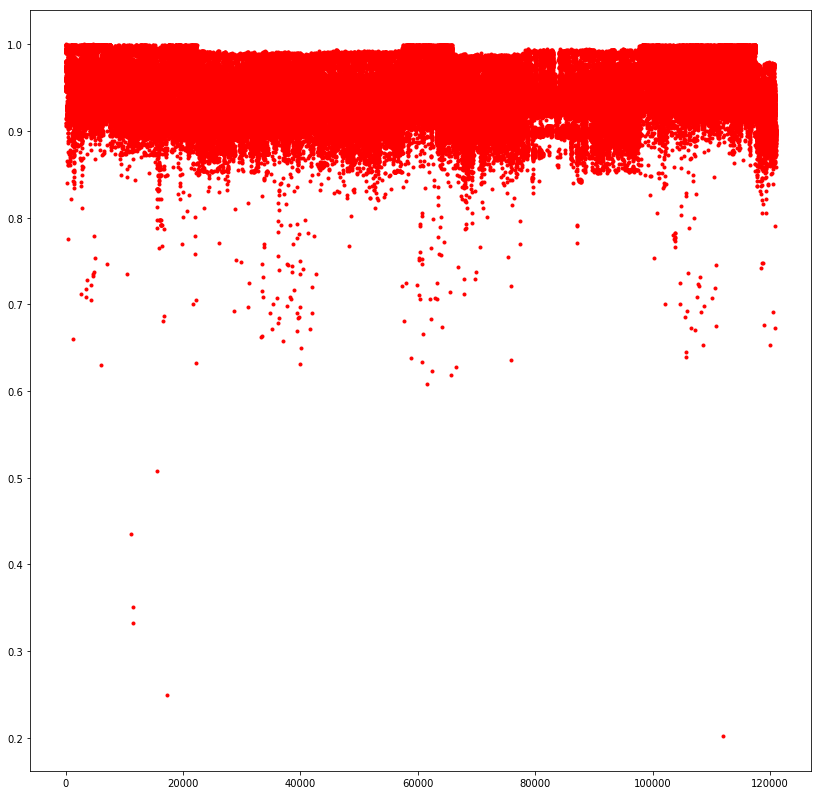

In [52]:
from matplotlib import pyplot as plt
plt.figure(figsize=(14,14))
plt.plot(items_C,list_C_dist,'.r')
plt.show()

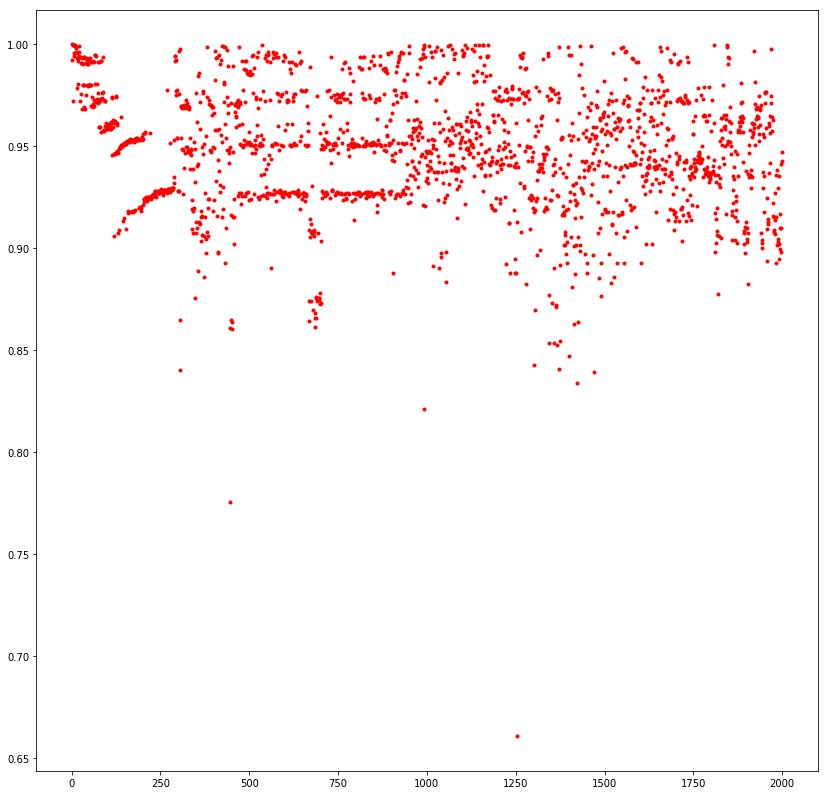

In [53]:
from matplotlib import pyplot as plt
plt.figure(figsize=(14,14))
plt.plot(items_C[0:2000],list_C_dist[0:2000],'.r')
plt.show()

# Euclidean distance 

In [54]:
import numpy as np
def Euclidean_distance(x,y):   
    return np.sqrt(numpy.sum((x-y)**2))


# Query for calculate similarity

In [55]:
query={
 'state_code':18.0,
 'record_code_iodine':3,
 'sex':1,
 'age':5.0,
 'weight_in_kg':5.0,
 'length_height_cm':59.200001,
 'haemoglobin_level':9.0,
 'first_breast_feeding':1.0,
 'is_cur_breast_feeding':1.0,
 'day_or_month_for_breast_feeding':5.0,
 'water_month':0.0,
 'ani_milk_month':0.0,
 'semisolid_month_or_day':0.0,
 'solid_month':0.0,
 'vegetables_month_or_day':0.0}
print(query.values())

dict_values([18.0, 3, 1, 5.0, 5.0, 59.200001, 9.0, 1.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0])


# calculate Euclidean distance similarity between Query and dataset

In [58]:
import numpy 
counter=0
list_E_dist,items_E=[],[]
for row in df_concat.rdd.collect():
    l=[row['state_code'],row["record_code_iodine"],row["sex"],row["age"],row["weight_in_kg"],row["length_height_cm"],row["haemoglobin_level"]
       ,row["first_breast_feeding"],row["is_cur_breast_feeding"]
       ,row["day_or_month_for_breast_feeding"],row["water_month"]
       ,row["ani_milk_month"],row["semisolid_month_or_day"]
        ,row["solid_month"],row["vegetables_month_or_day"]]
    dist=Euclidean_distance(np.array(l),np.array(list(query.values())))
    counter+=1
    list_E_dist.append(dist)
    items_E.append(counter)
    print(dist)
print("Done!")

0.0
8.46463127372
3.35662438003
3.88072160558
16.5663650305
7.72528267444
4.15451279936
6.90000002754
3.90127883905
4.64004217869
5.71664155952
5.66127373654
7.49466405785
7.92579042383
15.4862660046
9.43663134174
9.78235326107
15.1803951347
10.6026868731
8.30222598877
7.64525720431
10.693834709
19.0604119526
12.6575860781
14.4117774429
15.4886839649
20.8681569651
15.141001173
22.8536486541
15.6617130226
15.7257513678
19.7724386448
19.7724386448
23.2260500835
15.2098447554
15.2806848329
20.2076538966
15.4502192439
23.6784558526
21.7441773255
16.4213047765
15.5012659742
16.0405501178
16.621048251
20.3533595498
20.446252666
16.6640105138
20.434023783
16.2342024123
20.4653201002
20.4408739246
20.4914452483
15.9106669365
24.0426545973
17.0014481761
21.0679672338
17.165937544
23.299128928
24.6241624906
24.3962973109
19.1164013843
24.6566271822
23.8593641903
18.3959197536
17.0381698572
17.1423229279
21.7414173964
17.3660411206
25.3781254958
25.4202554173
23.8851275685
26.6954944664
27.193738

22.8003691884
26.2461274874
45.8092594715
61.4849683483
47.642294585
61.581501547
42.0655245272
13.263384331
14.6241872979
26.3656857958
25.380098256
48.4177491704
46.816649151
59.5806189662
31.5504261144
47.1881196884
16.9943185779
47.0747126568
61.7903012777
48.4566655345
46.7673843755
54.0252826812
60.1851401659
61.8909632482
47.3471080397
47.4636524292
60.8671613761
47.3210161844
47.3210161844
47.5419628678
61.6416363555
47.6608668965
62.0806840409
11.6724631835
62.1425082451
46.506865845
20.1628174639
61.5243962407
60.7231532036
61.6169727639
14.331327049
33.2546120525
11.9275875747
25.3272431323
8.36002388274
48.1923208675
26.048977805
26.180321008
62.7526201078
15.0459073971
46.9856216062
24.6793317674
46.403432742
47.7589640068
60.8624788584
59.0912120379
60.212053069
46.2838917599
59.6566969879
60.9820574945
61.9355417478
25.4194686704
60.578855491
11.914043538
47.2081672957
48.0084183173
26.0288156604
48.2617720947
61.9436141308
11.8785537722
47.6503749547
61.5325225616
7.125

47.4241493377
62.0950701151
28.7772156114
15.8868672733
76.216082926
17.1417585772
76.8692480462
43.8602592825
62.3749020338
62.2590427434
62.710353226
67.2522216777
61.3639234142
57.2704324593
60.6172547315
8.99222039321
61.744729145
58.6771778581
60.3004244545
54.0498675792
69.8723215114
49.1386920809
48.0395521391
31.3229646481
24.5725343114
30.9964254821
14.8663809881
36.9999801109
52.1256962095
50.3721011645
33.0679567241
10.9494284508
29.5867940599
62.3533586472
62.2438859245
63.0031851003
29.2637681966
55.6124198124
27.1385002133
41.6140426866
60.733690064
49.6302149232
27.1244976128
47.4275217
35.1763851233
33.2389552024
50.3983992377
49.1206498056
58.9587239413
28.726786347
7.31432478107
64.884985374
25.657909701
61.207933966
15.3381632852
43.8738943588
60.2087301759
26.3867062148
46.5703620957
40.0687953026
43.2601237105
58.7435198876
47.6035706371
62.5575841348
44.5860779159
76.7638671198
65.4234544772
66.371894607
37.3515472026
46.7558367835
48.7915060171
49.3215070676
133.

46.6515820941
46.7111329813
50.9674399239
57.8768525786
57.5494676377
39.8274846271
70.3655447062
47.7971738035
64.2099556231
50.3656642208
51.8435138605
47.1197422786
35.9963862631
43.6088286291
34.4560601445
48.3297902512
46.7539310916
45.9370232427
40.2206407632
55.3028942136
31.0209340289
44.4290423768
39.4759234497
38.6612181908
39.4503478732
38.6967672035
31.7378306757
30.5682848927
32.2201785426
33.5483238985
46.007498817
37.8540612141
30.8528779274
54.3667170372
39.6950885551
49.8728363501
39.8878399515
29.5175910607
33.0756687612
49.017140496
19.8879356928
29.0807358642
41.2271747807
12.5783306971
29.5399717414
4.26731597143
31.583063289
22.9366508043
22.0974965117
21.5299790738
18.9949968065
29.7900997142
29.0144765095
45.317213605
29.9554676365
29.8610116774
21.555741405
33.4079056097
15.1690473261
14.869679726
32.7453548777
20.2536378184
18.0726306104
29.9003337426
23.1415206052
20.6239998512
29.0270579853
21.4030365696
23.0976175395
27.7884860271
22.4100268666
24.871869740

61.054567056
67.3401804542
64.0679320113
74.1087031772
66.9746215338
56.8712575419
59.8062712046
48.3456299307
61.0397392163
49.915429883
60.1539672225
63.1086358179
41.1642858646
32.6675660936
33.8103527547
23.310724513
60.1539665525
19.3238174955
29.5677155695
32.764906986
16.0729581285
33.2902354452
33.4488901422
24.4628149893
24.3452268094
71.6344182387
6.26497819629
27.7283265344
33.656798058
58.3352374504
61.8995663621
71.0313305676
62.5419852275
54.788880954
61.9465892394
58.5864330916
46.1589625165
52.9480892611
57.9933480127
46.5227881538
45.6267471819
47.8812044961
24.8599965101
43.3636927348
46.2961115041
46.6133926758
32.6632815008
38.8683668476
40.3119104782
47.6949649754
35.0511062753
36.1940574691
49.3935232434
19.7572617891
24.2738520919
19.5554818832
21.6762368358
20.7436743582
17.3771816981
20.317480648
15.6775943897
26.9286101142
4.82163463801
5.8086135523
20.2656464138
27.4032837886
42.3055353509
34.6228163136
26.3958179756
13.487702072
35.905707592
22.8194943152
33

62.5033592393
68.6744488365
26.7398590438
53.3763985334
38.4902566985
67.1682955404
58.4911971531
25.5444690467
37.0299624691
37.3229146515
60.6241798327
5.72450747052
37.3038650467
59.7446244645
31.405411577
24.2755029509
61.7170958358
24.8537732427
56.9916642729
45.3781879475
47.252071376
10.7414200487
47.2477327427
22.7184940813
37.1813118703
47.0697368423
40.205949515
37.7435840898
64.4108789537
46.0176983966
62.5006506589
62.5307117823
11.645167001
62.1035419087
2.55538641696
10.9333528729
46.4638562584
42.4632776691
51.4218811072
3.95474402711
42.595889473
57.1139312671
51.1413587982
40.0031175096
66.7874981175
41.5722268636
37.5254554669
40.5276214247
57.6303745381
48.1001053263
52.7669269877
52.1549606787
48.9939760379
29.4613276958
2.41867621231
48.9009209361
23.1270389069
60.8894092466
50.5652046807
51.2444980434
47.5766742785
36.3144592607
45.4962455566
39.5916633649
3.46121382177
5.91776981472
42.3644891318
35.994143784
34.973964001
21.6124948472
45.0963241043
30.5468366068

12.5744351734
23.329153298
11.0292543322
7.91201867541
10.0623058987
10.938462914
31.4186256402
36.7529372805
37.6426860004
6.1966033021
24.9939870065
33.7878556343
26.074685026
17.5320974263
12.6268417272
25.4843103913
8.70326998137
32.3593629842
6.7377958179
9.23309265631
34.8915193172
30.3976697585
37.7722090432
36.5504868688
36.4081100661
7.37172601899
27.9050147737
37.5722035322
20.8918498957
67.3909482394
66.7889953974
63.5051172395
54.4698994356
51.0436081052
54.1517283565
49.7153000536
50.3724137738
51.438392445
49.0358913014
38.1339550758
38.1700206742
25.3406667387
13.8606255458
9.91412804638
26.4201766174
25.9024795287
5.50301227729
22.5986587824
28.075245797
20.7566207922
50.7700524456
143.283843227
72.3277947472
70.5951124073
53.8521109206
57.8281920831
47.9504959557
58.9306383845
41.4581518974
48.3920267123
37.8174551233
49.8032995064
45.5967079952
34.8515173131
43.0892103246
49.9939853755
38.1761686695
56.3260136846
76.846264355
33.4893885552
9.72095464595
27.6439743069


63.8051715428
59.121063441
58.2939098997
63.2393858066
63.0457876023
61.1981221477
70.0890856182
53.7394633617
53.9468227424
64.3206802996
49.5661154379
55.5703168643
71.4179940337
69.1671880331
62.1425095823
54.545849338
54.465582527
59.178542804
49.8559029546
61.9023418006
54.5200851063
55.2012675796
49.7076282669
54.3714050214
46.6154455948
41.2070146255
36.0707415331
34.4844652089
53.5456785558
51.5388196159
46.5690717937
42.1691801201
32.1163522898
46.2584022206
47.1609982931
49.4447159401
51.0946174218
44.1007944191
53.2582380707
58.7407025869
46.8129261892
42.4651601424
52.6835667104
42.7241160049
60.1612125143
52.1342490825
35.9368660913
2.93938774577
7.15660942434
34.030428873
25.0689044515
27.0652908819
3.55809097692
12.5032004863
6.82106583816
2.12132034356
34.8754921886
18.1927023766
24.9549588255
23.9334470831
34.1961978501
26.7263907268
24.4267655019
1.54919342885
28.5777855251
25.5485692453
4.19761972789
31.7253816368
11.6404493178
18.2673721023
15.629778962
13.275919852

62.8497407664
45.896079837
50.3316988825
35.8817516351
43.1681603893
35.6984586138
10.963491651
55.6302969469
55.200736908
47.2274119736
52.7108013952
48.7016419887
62.284266999
33.8641394711
8.98331862844
22.0458230048
10.0189825192
6.09781403491
5.50726713716
29.8093952116
33.7025189634
33.200152378
14.605135898
31.4728446506
35.5917140975
3.6345564076
36.6099679585
35.7580725431
24.8609602733
36.8137194301
37.3332306987
51.9273526227
56.1492647895
59.1983965188
51.1012701995
59.685519118
57.9109759613
48.1873418711
52.2173335627
50.2035684979
50.2295743601
45.1456525415
37.9063315081
37.3001332609
44.3421746165
43.8753911253
37.501709931
61.6542773715
39.1425591713
52.6224122302
44.3534491525
40.8368682883
46.3463962323
62.4702322422
28.1698415047
52.2857528212
41.397221558
32.8099065284
28.9516834122
46.3614057099
49.8763485271
7.4411043253
16.2643775202
5.96992464944
22.5608034813
33.2183648737
30.8365035048
27.3957900343
36.9488811506
8.30180836204
33.3498099545
10.7703313561
12.

33.0257456073
35.3635399303
34.1347062631
34.1679655953
32.1413791824
36.4517234153
34.511155841
35.106977556
37.3060061431
30.5335585778
33.7629704402
37.5207708709
38.3767916838
41.2594226305
33.8311714392
34.7359810966
29.11528642
36.2900572161
27.8052149806
29.3030418855
34.1830360723
38.4055742952
43.5873850145
34.7421914335
34.700693998
32.7018325431
31.3175664029
38.3967426207
35.3695950594
34.7739594672
37.6346660719
42.8777339467
34.7997108821
42.9116502596
42.8383990451
32.5062815355
34.1904689489
39.7863055385
42.6589744479
34.7874958225
31.4020407812
34.0330703305
38.0343238667
38.3146158013
32.4089207834
34.325643825
36.8496925729
42.0511600839
37.95273519
41.0245025028
43.1734864633
33.9319650304
37.831334124
41.9759267288
39.1010222808
35.4697036159
39.7826374157
45.3948202332
55.4628542751
38.846361271
36.6697435551
34.7201645405
37.4068189024
36.280846801
38.9626540773
36.3578045047
37.7409372796
36.903791002
35.9318793052
43.1237737518
44.6107425718
42.5466778562
41.9

10.8790614853
46.3777977097
32.9396412403
34.6886141822
48.8939641191
42.9574213393
33.3568565701
39.296742412
11.3475968136
38.9964600247
53.4967298731
22.5346407915
38.5012189001
23.4618850227
56.6873866157
33.4708812689
35.3454376784
19.0234068558
43.0542663412
34.1844987578
59.9784936063
28.7967177437
17.5825041703
23.7970593901
56.7480390357
31.1412903605
11.7303064141
60.7149049914
24.2952652465
17.8646145466
29.2160908836
69.4529141407
65.8383619739
42.3903285243
62.7144314843
42.4205122143
23.8474312596
42.6612230533
42.5594889114
21.1435564199
18.8374611432
31.3333682409
40.5717130976
44.8541080528
31.7291658636
40.9552320678
34.5642872399
46.1578792788
45.692230645
11.2994669575
16.1794220733
15.9552498332
42.3903285243
36.7034055423
14.9459023053
42.4201586122
48.4621495025
12.2199817358
58.6342884683
17.4392986428
41.1891226854
56.737376872
15.3583855636
11.8225478795
45.7395883309
13.4246291606
65.8554470594
55.8802573666
32.5708439332
56.8020228679
40.0483967589
59.950310

46.5897092939
53.1192989016
58.3898582559
46.7687267164
46.7685770226
35.1946043873
61.2979112848
52.9278180173
43.4247618414
11.3366692396
64.5467525004
13.6260822311
62.0615280617
60.3021881898
43.8360697281
67.3845920827
7.1547660548
42.5095255123
44.3479847614
54.0904789933
43.9024355096
63.8438975921
59.6359206498
8.83900230592
52.6314917162
69.9478897197
41.3645978682
10.8738266046
79.2273304316
54.0250305262
46.2026082512
39.2557009564
76.8248000219
58.7606153957
45.9393071532
61.322507421
62.336184625
60.5666844705
61.2153842408
48.4835127161
18.0871350108
13.6337858663
69.6912709753
55.3619355882
14.5011692356
60.6029972011
9.40414693867
45.7525949144
48.1325247769
60.1810028942
41.7591168929
52.2840679335
36.5669243169
75.4737696112
74.4536090604
50.6254868856
62.311988417
46.3624957086
61.5513872041
80.0431586623
46.0380197485
82.411511627
43.5098123425
60.839487744
60.5003576019
37.9644726307
77.6330464326
49.7040233925
24.8582223453
36.7311850803
51.4689207153
56.430930653

12.046430945
12.3389625123
54.004753607
64.2073763273
35.0321415407
46.2666295735
69.4073996116
51.1439139527
63.4077273486
39.4537833574
41.5269064279
49.6734426281
11.3805954785
39.3284879587
72.8146956906
49.2745379682
67.2622472179
44.6329456635
75.9872351075
12.4828938377
51.4251271858
61.7273838406
49.0989795882
44.1666169454
10.8894442705
54.9615401477
37.8161326859
46.0684267224
17.8925809457
53.8994426261
53.2341409253
69.8833546
51.3892004452
13.8188274495
44.4137359554
59.6652321071
17.3945376656
54.2002759975
61.3470448938
39.0223005652
67.3864964218
16.610238451
54.0805317991
51.4459903433
44.4973026306
67.4922614094
43.4770170514
11.6779258826
46.0505266985
42.1062953535
45.9413089134
55.297858497
43.0250400208
17.8925809457
72.9586863048
52.7788164338
57.6702100772
51.3297177315
32.7476710268
60.0853019644
35.2187574637
52.3303323757
63.2751444129
59.6047810358
12.73381674
8.90744844634
23.5255173733
38.7544828555
41.0396132599
55.899283848
12.3514352755
52.1205725455
61

29.0430701421
61.7360504189
32.6773626928
44.3286601241
43.5006189574
61.7049411603
62.4500593947
31.7288507677
73.5042849853
43.9786287608
32.493399328
43.0134149734
45.215747064
63.9674128997
29.8506269311
31.8198036279
31.0926022713
42.2293720721
44.5166272352
44.8555888343
61.5654948522
24.7949610812
44.924156582
47.0690903074
25.7641241849
60.9620828642
25.7641241849
47.0797117914
23.8237278354
42.8446008734
60.9620828642
60.9538804929
20.6213492439
60.9620828642
60.9538804929
47.0797117914
47.0903308798
60.9538804929
27.4346524213
27.4346524213
60.9620828642
22.5341983442
27.5401552951
61.0358546032
34.2767305522
21.319003806
47.1857951333
37.9806532382
47.1857951333
37.8335819615
47.1645975533
27.7039692477
33.1947926239
16.9490150968
61.0440459598
42.3503233367
17.7146820942
77.1039551471
48.4097021512
61.5722333579
8.27369036766
36.4540019387
61.0440459598
48.4097021512
74.2604195302
63.4369759462
34.697179386
62.8844966427
31.5107914423
61.0358546032
74.0633721958
37.11999807

46.8881569521
74.825195663
40.3234431526
47.439427298
67.922383371
35.155287758
60.6174866414
60.0697556774
9.98188027498
38.4660113409
57.8930024096
33.7030303882
8.11064902731
72.4099433117
46.1248226269
72.4257546407
24.8625109934
10.5009556445
75.0815552077
46.8881569521
38.0253848533
14.1478171376
74.4234499665
60.0780787571
11.4879908391
46.9733888746
7.03278532645
7.69765768919
74.4320489085
42.1857775834
11.3877134808
9.72471250886
9.78778102324
6.28314785471
37.4547734261
13.5689565926
14.3323370342
15.9117064372
33.1797266015
60.3516119288
33.1947926239
29.2224223411
31.4625850392
59.3343887445
59.003182517
31.4625850392
62.4220306767
44.5028006126
59.7278802962
60.047146148
58.9947077892
60.1403332216
33.1797266015
8.09645998225
62.4599064578
44.5140344427
34.9862836826
59.1542046394
62.8252331036
5.55541495518
11.6786183613
12.9856845782
5.07056751842
9.06587592723
5.32847392452
46.8988194133
5.93952363108
7.94568726543
7.3342107182
11.1937482507
46.1464978342
61.4982919958

35.445507423
46.1573316209
28.6823968008
29.7901166914
30.4126790094
68.2083357387
28.6021162072
73.276074547
68.7509267335
29.5580962041
63.0719689383
30.7689948846
36.6269017106
26.7316302413
36.5268399548
60.8689857822
26.2501431992
7.39054009988
20.8514681485
34.3965095845
40.5508336832
9.74987399406
5.26883836902
8.13142538722
38.3998712029
10.6193240124
35.9609484302
38.5360883845
23.2858337828
37.3692359033
37.0931274551
7.59210259678
28.2308328478
45.2592008357
59.5430562462
33.0589512439
73.2989760029
45.227196048
38.9186316897
28.6370385061
32.6633473078
61.9884659933
32.6480360412
45.227196048
59.5346583692
60.275448434
19.0888535591
45.6728558336
71.6665885481
29.6924211259
35.0502493903
28.0522735064
61.6256433531
28.2322492777
76.1709911961
32.8617445877
60.6996718436
28.9692920669
43.4005772625
29.4363700157
59.5346583692
32.2163662964
29.2706323007
59.5346583692
35.0870338632
24.9657740116
26.4102257029
45.6850064857
60.4187031033
28.6637385402
19.6084142786
73.54107633

32.805183438
8.08986305823
33.1273449798
61.587173322
60.3736140475
8.30340497339
27.2115822233
55.2790178241
32.3756116096
34.6234058275
46.1148542229
23.9887468276
60.9559958671
31.0602809422
14.0984570295
74.9494313777
6.76997924991
39.7913806681
70.4331387646
76.3642408608
60.9632957783
22.8497274342
76.3642408608
25.3341667709
59.0206186527
29.8492917018
24.6223477901
39.6434596633
39.8265486262
70.6222151864
31.8284619234
60.3977091714
40.7436372882
48.1522974538
43.9455320141
60.8592612509
49.5332218859
36.4577828673
32.0758471233
40.7356092381
61.7961157155
61.1382838974
43.4542272121
49.2292602171
48.5211300301
62.260580748
45.0437560104
61.0180307811
31.8894956329
39.6855128544
26.2118299685
8.74700023894
6.15147456297
20.113429882
61.457789726
60.777048957
9.77240713028
70.8947619916
5.40006121807
7.98439785826
6.69482382882
71.3810893359
30.6903870995
6.51465064135
32.9545315732
6.75854640911
32.3001529427
42.4137925694
5.98665791807
32.9545315732
7.38580129492
32.560880835

32.508170172
45.0992658263
52.6492172534
42.2413424764
48.8490948964
7.46810808466
58.0004316275
70.1840243905
8.54146226077
60.1529346511
32.6398503747
6.72225850387
9.42287946325
50.4142808387
44.445585325
80.8448507211
56.333679235
16.9151988732
56.5174292177
17.8366042984
57.9174707852
60.1529346511
61.1587535791
58.2932224887
35.7196620553
62.9364274524
33.7231545519
33.1704854883
47.0951595865
60.2451664212
29.6366506159
15.6491466253
32.4945265752
8.61514179215
63.8916263058
60.5569128011
49.2026807773
45.59565515
46.0271578784
55.1400391483
11.3436305266
42.60039683
48.8769284886
61.911500551
57.3387589614
60.1612462233
48.328812674
48.214945931
17.8925809457
59.2178513615
77.2400148723
53.7334254371
54.7499216244
60.0158305466
60.1529346511
37.5339841488
70.8411411402
32.4945265752
45.9754275826
60.1612462233
46.0271578784
26.831089626
27.9847182029
26.162951447
47.5063126744
25.5730320557
56.4014531185
25.7746003678
47.1539951899
35.6320210924
52.9417926043
53.6874666796
59.5

35.370200152
50.3996360121
36.3524961998
50.3897143289
60.8628780302
44.4916169627
59.219367774
45.009935096
62.3969193722
33.9989700744
36.4677152746
59.1527977035
71.5985158089
63.2990765742
48.9234019909
64.2651531781
23.1979407038
52.8109239654
24.2068176673
46.9654534384
26.6028198997
66.1716699759
60.1529346511
44.01591768
23.6088976485
63.3259024081
26.8151274244
61.9724446869
17.460244296
50.3996360121
34.0301492619
50.3897143289
32.8733928489
36.3524961998
33.568734809
17.0164625337
46.0380197485
62.8569798511
43.75443988
33.0113610353
8.88485608544
50.3996360121
35.5534957323
50.3996360121
66.2810674884
43.0871672306
36.3662478124
26.8151274244
65.0204375457
36.3524961998
50.3897143289
27.7670662962
81.3858088883
60.8467175758
29.0695885545
36.3524961998
26.8151274244
46.0498636471
63.5755712955
45.6825022214
46.0368324401
74.4797104414
43.5891032564
50.7995444278
65.0204375457
9.99718329469
65.272071053
50.3897143289
7.41219722207
34.6828496681
65.0127472011
42.9476888779
11

33.0318635616
42.7912368636
56.696412103
15.7201766186
44.8033474455
34.2585892939
54.4308130947
60.9820445508
34.8870177911
10.405319231
72.7817784163
51.9152585612
34.2165301761
47.4125911723
67.9155595365
19.6947636063
33.0318635616
9.08518948943
23.024551253
32.3241383906
56.5775910911
23.952038433
44.2103387849
44.2103387849
44.7826968974
30.2645018809
44.7765557117
70.3393721698
42.8847733593
45.4717941088
33.0318635616
33.0318635616
115.431164787
31.9483949315
48.9917741205
10.6116242843
59.7678300271
45.7377299271
21.1585355955
61.7328105062
41.2727507249
51.9395202681
77.2187146902
61.2931474023
12.8805742555
56.1784422045
32.6871540731
17.8843500972
33.258571623
24.8193692323
24.8395066193
56.0580405943
92.8311297779
73.3442779023
60.2810376167
29.9332772861
60.1612462233
45.8828220583
56.7388749836
38.326156308
57.2714358867
34.8870177911
73.3374604211
59.6865400216
60.1612462233
46.0380197485
57.2714358867
59.8243588004
34.8726828672
24.7992154934
65.9552871831
46.027157878

53.8740289268
45.8828220583
46.0271578784
64.0726143715
53.8642174368
55.0477155639
47.8000104386
46.0809064733
49.1671281125
38.6521660635
54.4632995035
55.6656080017
38.9599941264
35.1034354332
63.0448246567
25.9231563413
34.8870177911
77.4943862315
57.2152071928
60.9486662899
73.8301422754
27.3701288437
73.927058024
74.3398944524
44.1158679842
73.9054119052
24.8533693772
47.6423125066
46.6305687493
42.9883839297
47.2929164011
18.1147578758
73.3374604211
65.774082338
75.0269500483
60.9985237553
11.314059977
65.851726685
62.7851886706
65.8593190627
62.6996803533
11.1045346935
62.6696889764
57.2117115154
9.9365938883
62.6917053238
38.8043786205
34.2913961238
34.8870177911
35.9774923028
57.2029713784
7.36686285327
62.6959322157
34.8070543731
78.0426159121
62.6917053238
38.0253856312
62.2175209905
62.9845212445
51.0754714484
66.1582440462
82.5421791542
60.9745842331
60.8576200849
89.784504513
70.9227317556
28.5224466061
50.6873765784
59.3968848301
32.9595363773
78.0805987323
60.184882237

38.4875298989
34.1629035703
61.5353822492
37.2451479375
43.2986131681
62.9730094018
22.0133264763
37.1521194378
46.7576069178
45.0065968284
49.7191519485
23.117311755
53.3900710245
68.2749828279
56.614432031
45.9222181119
46.0380197485
50.3293475653
60.1529346511
50.7703979712
40.666742707
44.1831862644
56.8704945851
47.3581454396
58.3471776468
47.953829968
48.4906169728
21.0895720273
46.0575720233
64.334075448
66.8232987554
46.1047205858
19.0751165453
49.5144395941
27.3131835328
46.6693027554
64.2594996429
33.1653426987
72.857257067
52.9369731261
41.5667390421
49.3236635265
39.9474769958
46.5562134329
46.9110968246
14.3073424582
34.1482646756
9.62444959881
68.9644088498
59.3802168773
45.4748261965
72.0760703008
46.2826080842
11.4408790146
7.16560424395
17.438467596
38.4733790095
60.9691225169
22.8431627647
21.2007077546
23.4123916253
20.5441036947
32.4945265752
61.4694226132
42.0085844466
36.2781474218
42.5410866161
16.0143719695
58.901405307
66.7453915161
77.5480963844
52.6111508176


65.9176752117
73.7861588988
9.53257507602
51.3220629211
54.1104396582
5.62055782809
30.5394810794
7.08787233407
37.2028363232
74.1297503107
50.1621349386
54.2972367271
29.5678862958
45.4148667333
53.3108812195
31.7089902223
59.003182517
24.1068464325
9.13607869735
60.3189484917
5.39450248484
60.3189484917
6.43195107258
11.946548039
47.302212024
60.3272371913
11.3336908165
73.4804946977
73.4804946977
47.3276886864
60.3189484917
73.0335533286
73.4736898557
16.1409390879
60.3272371913
47.2599117897
40.3837987605
10.4398608276
60.3189484917
7.30136936335
56.1421394106
46.2547215143
12.1053942265
46.2439105436
9.4653357238
59.9580699856
59.8035932583
27.1033202759
61.2580600241
58.9947077892
42.8828649337
43.8849613139
59.0202693605
61.51723268
29.8872866604
40.4502141475
21.7878418509
22.8910441876
22.5889394416
30.2235194048
10.2854314896
65.5804842013
47.7415928515
60.9470235532
31.5071414806
55.4877456273
72.6095717587
65.0395257317
48.3429429224
54.8443243711
71.9685160222
72.216133519

23.3995712149
45.1480871276
59.2561369531
23.4706203165
18.3339665703
40.4665300687
22.9087328956
84.3079903333
80.7835208705
16.7707985199
6.28749768702
20.4367327066
61.1189272464
73.6931466311
89.8349365606
76.0343820784
5.8260294167
67.9697719461
49.6256393055
53.6902233037
52.6992415238
13.0541160666
75.3665037148
55.2839333455
22.2148577308
69.5790192739
32.5043067565
20.7453615452
59.8340490871
21.2880290092
8.40773576179
28.8570594212
24.0029160437
29.4059528361
24.2573693594
35.6339738853
62.4814365609
31.2289910295
6.55306303375
15.0066632294
72.6984171862
22.3494950708
48.2888177345
89.3076696677
18.6040313368
72.7316293506
67.1688162483
31.5616832903
52.6663074791
37.0464590632
22.2299341964
50.1916319161
56.5184917828
57.7242019967
72.1414104451
41.030596079
23.7090706507
71.6720999482
34.4276078689
18.5137764467
75.1181061383
36.5357374427
75.9889458982
9.39308295503
46.1827903921
51.6566540806
62.7727637579
24.4245760495
7.7679263191
34.3944770061
57.8630292017
34.491450

71.5246105583
22.8405626701
42.4258642749
5.93615436492
28.0066100251
59.6317023564
55.8252623399
73.3647265449
26.2781270489
24.1658844531
47.6252046933
8.27228249632
67.9162223063
81.8785679186
21.3556172948
45.8018571283
50.8763614245
28.025185698
37.7482442956
16.7788325265
75.5421730042
46.0705899937
19.7081229592
61.3359613972
37.1152272045
70.4353587392
6.49692356427
45.4507419403
63.778208756
63.7307611199
42.5728921053
64.6769915793
7.6494402305
63.3461385181
55.9701683757
47.1327833081
24.7412622491
36.6174801416
23.5597367164
13.9150707045
66.2074754284
60.5070256774
50.920817975
76.1627855347
49.5925522353
54.0017029175
15.6313770551
55.5031898496
29.0203410658
29.8224746991
54.6503445405
55.7844056571
39.785675109
35.294492082
56.7886779233
27.0676944821
56.7657812249
34.7840642423
34.9554008176
39.8128112981
26.9766582366
58.2057034463
56.7302733809
26.1530107276
27.4592432955
55.0086713189
26.3349571695
26.7114236629
35.084470153
29.8928095515
21.426617082
12.3150298457


46.4596519828
63.6680446921
52.1627659397
5.40579568281
26.1665832966
42.097267794
39.2679272802
79.3335357373
53.5617378695
40.2523306953
44.7752592809
27.6859577216
60.4845066702
7.5997730461
35.6468799473
38.1183698232
110.32542653
51.0250897297
34.7702629051
60.6897038576
79.0425827938
49.0576172059
38.1728954249
46.4596519828
36.4693139624
55.4310374783
61.5022197628
46.4596519828
71.89951262
72.3857713214
60.571114421
21.0344950018
35.4104484948
22.9479860206
7.71962541994
40.6139124198
20.2170724765
8.61881276743
107.512278617
21.9394628877
31.7466539402
28.4327261
59.979996052
65.3010971344
65.58993756
76.7072350095
38.9344315921
63.7743672182
35.7306561977
76.8183565315
36.3914818247
63.5953607924
31.3255462522
17.5968731916
43.592786252
67.0943358653
17.1956378341
27.5833298991
6.02743689142
23.6256199258
62.2071532758
6.24040141051
57.4838232264
12.0299643757
61.7696533884
23.4946785277
22.5904854618
109.581064393
5.99232311914
126.390980496
17.9722002103
80.025745022
62.689

40.968403614
34.3582590711
56.6721266119
25.1048436396
14.0243272816
15.7711695431
12.2536427964
38.6833278496
37.0849020562
16.6111407892
16.0780353641
38.8146885254
29.275736744
33.4953721789
36.5965687887
41.003048156
37.6872651717
33.6197852521
39.664175327
31.1384001901
35.4412182691
34.4425603055
48.9722363426
39.543519727
26.3729031948
43.0635195701
27.8761551352
18.2230622432
39.3914959401
43.9913253468
38.8171333341
42.7371039225
63.049107168
45.8197549282
18.4531839269
58.6383845651
10.8521789369
31.7260139097
30.7429660313
56.6736264384
26.2754634189
28.7023202952
58.2545271092
45.8601127495
45.8132070683
45.9214540427
19.1605435207
54.4489699096
63.8846639986
26.0040994716
15.4694792536
34.0044087571
39.8289244676
15.7539068331
60.6699260168
41.2698283891
54.1059961278
14.1191681705
41.1666121764
61.3365281091
35.1177852232
37.2999994692
45.8887779345
51.0458650648
45.8921097108
43.0795769719
24.8906259513
43.0828266529
31.583222864
17.2404988158
16.0721686751
62.5648209153

48.2750140463
75.3846795165
46.3317379493
22.892139533
21.5945525719
33.7674375694
11.7197172791
9.51344100562
23.5132560154
49.6153208636
22.8212607277
27.432702828
39.5878609322
9.59299571393
22.8195817615
61.7118284172
64.846742774
9.20923469133
39.0530240645
76.9566754856
23.4248763642
15.667784557
13.4491421483
34.4467537656
17.2439757168
32.7010713341
12.013401832
37.1280224143
11.6400957744
32.8254450693
21.9344463181
31.3020747012
61.4603974703
33.1806154513
34.4770756635
37.3490287344
39.4078544327
26.2762254504
20.1512958386
69.9960723784
21.6830190049
52.2062229241
26.2591556461
57.12171162
10.6780157511
34.834878392
46.9075334437
58.7579796999
23.4480986062
9.59299571393
44.7999639327
12.2674288373
59.919949184
21.0198667602
38.8106775074
23.7348518463
25.7505960352
66.27473343
43.9536900745
36.829182839
25.8824894809
48.9034460971
25.6496262929
58.0763301338
45.1835906848
52.8601652113
40.1411129017
25.5206426731
55.8112025064
49.619317999
57.1856653385
57.8263791518
22.93

50.8000033485
32.3805308027
59.0985643668
43.170325019
49.7557699746
38.2976095359
45.4813915043
28.2175287413
57.2800149949
57.2371410555
15.0716551273
77.0917243533
68.4944813877
41.9975832953
56.1698346109
41.7334034098
14.123739502
36.9022876931
61.4176709361
58.1065445386
34.2891930087
11.747340579
74.2154563522
23.9413096344
16.1207943824
43.3173985028
31.7425576392
61.6091707654
33.867260118
74.3602037948
47.1517755857
33.8560379817
33.8560379817
46.9803143985
34.0459976708
57.9827554889
42.4213384857
15.1815676108
14.4743075989
31.1276399105
57.7364697049
78.3947058059
57.7155952443
14.5050191516
31.1276399105
59.3134023308
24.7415269611
13.9230032026
61.5775927012
16.7733823336
46.687685115
20.2179728986
44.9090059675
46.9457127018
37.0408814156
40.1584239564
15.7154836995
20.4548276551
17.1631096089
23.4937973716
71.8709105511
17.1631096089
59.3049719336
74.3745245928
15.122499628
61.0773274006
43.0865402705
37.0408814156
50.780314495
37.0273803563
33.8865735966
10.6883112043

21.7267111658
74.9495826305
43.5165480295
61.4235290583
18.7942700524
74.5697653777
81.246537704
46.6790096446
33.8569041272
24.9779916006
46.9334629181
41.7415845305
43.548707821
46.7173409023
20.2148457427
24.6959504454
57.7415789046
21.7517810397
57.6982663032
37.0408814156
25.1442502487
50.7901598758
10.1548934626
21.7690141807
48.2081616966
23.5150699539
45.972662899
37.0408814156
59.316433766
14.4632493067
46.6674398471
29.6509488648
59.316433766
59.32553678
14.4705072678
31.3942664651
46.0209271313
27.7520966211
14.4036668521
28.0973106419
65.7044921616
65.9685553094
44.1482595012
23.7380128959
65.8462596386
37.0273803563
50.7901598758
27.7701074334
39.465388433
64.1732024671
42.1893346404
50.7901598758
57.7090975012
42.2011843128
54.3901638203
18.0874207193
27.7520966211
78.1833735292
67.2595710988
14.351306452
14.6013696755
63.8436364525
22.9187679202
61.9684586166
46.944434615
48.89877232
46.9972333377
18.2986338179
46.9550842968
61.3244643059
34.0101449188
46.674724866
60.45

43.0354499556
21.8833265095
45.8760910993
33.6627384079
31.3041954344
57.2480561626
24.6237683631
58.6046938427
22.6252077533
35.1654673906
21.7552287324
40.5429016728
23.2901965936
14.489844056
57.2371377202
33.8843615463
63.2115489163
48.9380213576
63.1373892111
25.6680727831
33.6334649057
14.5998486488
62.8538775055
63.4255462444
63.6747195973
19.2197809009
33.5662025883
43.3601193711
17.4452011839
61.5426655581
78.4735617797
46.7098471481
48.9073607384
58.0573865798
74.3106984755
48.9175830801
21.8618383811
74.2175849033
74.4024186999
19.2036449072
63.1532257007
14.4544109503
31.2882190576
10.1622763856
35.940086991
22.4777661007
46.0483435368
74.2154290449
44.8356994637
15.3427506035
30.8326120541
15.0309679302
60.9030370517
21.6870924377
16.2620199892
21.5523367913
24.7341862288
34.7908007209
15.499999471
60.7958854802
57.8833303492
46.0916472086
21.6159658327
43.306350024
37.0543775558
37.0543775558
18.7009739963
9.52102915025
9.52102915025
11.6120535926
24.5489300883
11.6550327

57.6996528073
43.4234953922
14.6253015472
47.9497647243
39.4737880295
31.1406481371
17.0336602228
19.4602990174
46.9546583568
62.8071658444
35.5377259531
58.1203917203
74.2278917101
47.0994666687
53.5350373439
74.2697778971
14.0135644167
43.4773498677
44.814952286
25.0119967472
57.9289006845
78.3855847615
25.5446663458
35.0569516644
59.9583998452
35.8259660023
26.4193107124
14.3162697924
53.3371345537
12.3083538131
15.0646868038
55.2677739191
16.0335489204
58.0217789004
64.3209135063
33.7712889461
14.4618664282
12.9021550056
61.7774224331
61.6902741313
45.8542880659
48.9396560511
63.1624090453
43.4217681869
33.733513862
45.8359655086
10.4473643493
33.8549877626
59.3457607099
33.8524933779
43.4331665021
61.8282304334
33.1012060203
12.0919626723
57.8230035194
37.0408814156
37.0273803563
11.8328678099
59.4051286863
33.8879227428
45.8712953167
59.3175295672
59.3147478619
33.9598484658
23.5320043577
59.3218283117
23.7896033824
48.9324016823
10.1055361677
37.0273803563
10.3975691931
63.12946

58.8875180469
44.0644957298
68.7605257252
33.8076889521
21.6492490955
42.6748163502
21.6353871909
30.6589311634
55.9503328319
32.877844391
58.0147407175
64.2154180187
33.5562194772
61.1223376559
63.492124814
18.3229358925
57.486867469
60.5450258601
23.8683870155
25.2434134665
15.3316661032
57.5448496712
51.1722588362
26.1361812586
25.8317639491
47.3170139434
62.1470055579
34.5749888891
17.1828399015
60.9367698576
21.7006907595
48.4452274987
56.6858883125
62.5019193027
22.40022094
58.182129296
22.5966793711
44.6546762434
56.119515896
18.8727314748
56.7929578944
67.7579508436
44.508537883
48.3124186904
41.8791094518
39.5748662274
54.8190654838
39.3122099811
28.0793514113
47.7480883002
20.5293274573
46.1470456324
20.9807062665
24.4607842662
49.7422348754
32.2180069973
10.7380427075
64.1225382476
30.6843576051
35.3413336138
62.4410145514
42.9925580849
60.1894502583
46.4299463967
69.1873534317
31.9649799837
24.1762272987
102.915012542
32.1700182841
68.9261916696
44.761254679
46.4566456215
6

43.019762348
23.8011188024
40.9088005094
49.3064897696
26.7097989556
26.320776029
28.3065914784
30.8016227884
31.4472568521
45.8361500543
62.3049501739
17.0641607033
66.0154814962
40.1400920638
20.8397015086
30.6371234493
42.1553906713
34.6707202548
14.5503208025
36.0233076297
45.8470571771
48.88227545
14.4859157661
36.5006709388
49.1549270284
27.8649107432
43.9320722043
25.6580057169
15.4056822097
39.266740203
29.157826796
49.7253449569
45.8383776018
45.7830748736
57.2536455992
59.2320852923
37.0273803563
53.4748258171
40.5756922475
49.9979705205
27.8429320756
39.9033428896
52.5609202089
40.1400920638
17.4586569958
63.1373892111
38.331040484
28.2111687535
29.5205547009
27.6910320365
42.0609899604
18.7782660043
27.8851011737
55.6709092957
40.2192342961
57.2388892905
18.5777631637
14.5534104375
45.4810943624
60.1810614514
35.4467045575
31.1016616638
23.378477362
69.5962662807
15.2425406132
28.3134809899
33.9993036958
40.7050242966
20.8629653273
59.8184779747
42.4560812839
12.8246586596


54.2674834972
42.2063955822
61.4926005419
53.6485779998
56.7931326422
48.5956781667
40.1991300702
35.5617766474
50.0321889519
65.8363114723
41.5304684958
67.1055877471
16.3196207162
26.9766547281
60.8033697471
44.6001104326
40.7639518202
38.1604333385
63.5140135387
64.0300703951
12.8767235631
31.8825958322
10.0749971051
58.1468812543
57.4618128447
24.0411399545
41.1711068275
47.2971438947
59.9833304044
21.1378813815
62.202972257
34.1020508855
24.0204073887
47.0729227837
63.8485701954
32.0716391461
52.3194964043
11.2113795371
49.5530032632
26.545433411
10.9391750049
31.0337413447
10.8418429055
61.9293946394
49.9086851176
58.8162972837
45.0970071446
58.7684465612
46.9233070165
47.6444827065
25.4340975513
40.5969080964
47.3919480014
27.7721651833
25.7740821588
32.6245141773
35.2469680549
20.0175744247
57.6268211357
25.4757371145
33.1381946129
63.5352651374
46.7098484453
33.8585297507
62.8657292758
36.1704292452
76.1174085463
33.9836719735
48.4236525512
25.8596186816
33.1742339553
21.35321

30.9992363099
19.2065087509
43.036960303
50.7901598758
57.2654340279
34.7047527391
32.4990762558
27.9304290677
14.8436870199
38.6093115192
15.2677210129
20.98594719
63.1977841099
44.2500475897
24.3194009418
48.4875968281
26.8160993876
30.3187882321
14.1520936819
35.1611838638
50.7901598758
40.7827009687
52.2018840021
56.1402746984
14.2957961681
46.7276902507
14.6413795948
20.5012189364
60.819567325
25.8654821422
31.8796663164
31.8796663164
66.0386272451
35.3166920833
50.9161108441
15.6001520729
14.8320905454
46.484608388
31.9033441233
40.8581535494
14.8773332404
59.3742394411
37.4730416201
50.780314495
50.7901598758
37.0408814156
37.0408814156
45.6499364049
61.1945302965
34.5199775763
65.6832854809
14.0717824111
13.6398328811
30.3667377811
54.3614773292
50.7901598758
22.0286898187
59.0163562939
24.5907169063
31.3356942484
15.9141272216
50.780314495
63.1453079524
24.3019198412
53.862791686
34.229648771
57.8743493632
42.6627105581
57.4105385308
34.4496566744
14.3122938616
42.5749569659
2

34.4880961374
67.8269414508
75.4369535478
10.9650286519
48.5934870036
73.5180519748
38.2207926263
23.3657551759
51.6376515555
24.1160372443
75.0429474499
22.9924091675
57.179196446
47.6238068215
24.4692318279
41.156759226
79.6212531135
25.3028311809
12.8251710065
35.4546014659
59.7745809204
31.162369041
31.7502576456
46.971552565
14.3361329277
71.2755512891
25.3651978752
64.0103140049
33.230391537
25.1615444313
45.7532169742
60.781988783
27.4623982195
13.1955237386
30.7444851954
18.0829555451
46.9821960999
73.6926316966
45.9363337606
59.7877121339
29.1762465264
13.1709788095
38.9911392625
44.7153100951
43.923898085
73.9081454575
34.1600476508
68.2970008464
12.9840207184
49.4623762649
22.5472038845
47.1524852067
12.9391763415
34.2186896971
46.7328254353
10.774765014
44.8039843434
44.6992922289
47.1049575965
46.5448920094
11.534514876
26.1414105038
70.4194163819
14.0324409518
73.6508246116
50.3140833581
29.1496715619
72.5395338458
70.403862293
23.3183012839
44.9959634386
53.5205259351
27

19.4504491938
70.9396065921
59.0346514796
66.3557829573
9.69793806848
13.9381433963
34.5966754952
44.6040350498
43.4771216665
20.917456418
25.459968053
58.4764081336
61.2751197487
21.4173599897
67.4981475924
10.1934080644
58.5563857168
70.9466544908
71.9988882739
71.832025676
37.5953446905
13.8974812006
39.4123056682
22.9863712953
42.7907694299
58.7432543055
27.1339255656
46.7540385892
43.023828765
69.4781243529
34.4921742487
46.7444116489
12.4195425449
47.7138335236
21.0755777363
36.9580851233
72.8258189793
33.3931125893
56.1245911878
61.6747915927
9.85633917062
33.4216991082
69.6596020666
70.4983681896
20.9066968429
43.6106613571
19.5565857041
23.0870067371
22.3566554918
51.9543038448
9.66695401768
26.8752667782
74.9995598692
10.7967592601
24.6873074645
60.8318969002
23.8170093841
99.6789238605
38.5612480037
22.6453785645
22.9947794179
75.160228039
17.7229590652
12.2993215434
20.707727151
65.3827187214
77.5717080874
56.4777305997
12.1823634735
59.8761214799
24.2598440152
66.998582597

33.6127769992
44.4128340911
37.9877624032
50.6324972582
55.3674097588
32.5149203425
11.7243336604
42.1627804871
63.2835674816
23.0781290645
43.1710434781
38.6277112747
27.3059177749
45.9095823549
39.1711635176
55.5583471352
12.3179101095
40.4080415759
42.4876464681
39.8773129787
36.0440021762
29.5739761966
38.4837634386
22.7702602624
39.4315868359
18.1413862337
48.4006212398
37.1583093184
10.208904626
39.7615397639
35.9562239908
39.775328941
38.7976784563
80.9847506127
47.1191017741
57.2021828255
52.6854798213
22.5517188374
16.497574612
42.3154799996
63.2826193563
24.065393335
31.375307769
52.2937862313
43.2721625806
11.0833113751
25.2062158439
57.5352059995
59.2884487097
10.0642814189
37.7060980214
9.59508005008
39.8899719865
60.1395051393
43.8133522525
19.1526295252
57.1268745303
62.7679051379
36.0969508408
60.6988480988
45.8749272586
10.5441817965
24.3034959049
34.2312727271
47.2288773228
27.3996355436
53.5911383876
41.5022902308
30.0068310409
12.9687863837
25.2473744908
13.80525353

55.111583118
27.2248918914
47.7442149446
58.9102751836
56.8568394339
27.919762901
20.8620067258
49.2201158329
34.5699143578
10.0872123491
26.4053002013
34.9591170501
31.2722345188
53.5644478939
36.5147887963
50.0516726166
39.6618183083
36.1005512855
29.8129155669
31.0839180278
57.860954587
67.442567463
34.2404723049
62.7694216973
22.9543034989
44.8142829178
27.1626595752
40.2991293613
26.9239649034
10.6146991939
59.6467136916
46.9239804437
17.0201251288
47.1547100698
36.0127735127
56.3080856024
32.3624765301
38.1167921358
37.159520308
18.059068028
33.7705487323
61.7022696464
40.6342225923
18.7002684291
11.9390016701
28.1035565294
63.5235412915
17.4305691639
49.5751947316
25.6014307524
58.3207521875
41.4869863745
17.0167567427
21.8732717992
59.2668523568
58.3277801001
23.9370687422
10.4893064436
36.6515849669
59.6831609087
65.5203807453
50.4304145469
13.088228622
43.1066901277
11.3267633324
66.8026967166
47.1067589457
46.3352204246
34.9802619857
34.2839431831
35.244293104
46.4860931911


17.3778436944
56.3039957143
40.0971303432
44.2931139389
34.0141159168
38.1203352892
34.0769710931
22.8573834036
32.1362717439
47.0415787588
63.0588606986
27.5043626925
36.4012368526
22.5222092788
41.1976935325
31.1098049065
35.2532261701
61.8031545823
45.5286727204
22.4334579011
46.8122840195
32.3137574953
44.6341840084
22.770594557
46.8770739851
22.2447729316
23.7539445145
43.9107829715
19.5568385784
38.4085934931
36.3782895612
19.1075890572
63.3334817644
44.036232491
21.9120977873
35.6711205917
60.542053989
34.9746885599
20.1836562941
37.0789670298
9.9652175685
49.1576733295
24.4288739212
9.86638518341
47.3042274369
29.5819180534
61.2445909269
16.2717522431
57.7012991958
35.9304859973
45.3479884934
42.6442264838
34.1202280866
11.2396515408
9.66539093252
41.4556401239
44.5233639946
25.5955721516
57.3324509321
35.5849693607
33.931400824
13.547693445
55.0756781094
37.7075561192
65.3505157286
61.6743893218
60.2516369952
45.5055708586
16.2128043634
39.1430702603
22.9089506639
61.364484174

59.5909363582
15.4194690376
48.8700323912
9.50840521005
23.6211455044
23.6423035032
35.0550980572
31.8756943093
51.2039040418
62.2938995337
48.1145501692
16.5696919742
48.5429712947
17.9146598445
40.7202622781
27.4273578286
52.098177256
83.0788173026
59.094585796
61.8388252008
38.9824312659
56.6741547057
43.779445568
37.4514331678
32.560251394
35.3523684494
25.6113260844
44.880505613
38.3443621817
25.0677077213
30.6076769158
57.6505014307
19.0691304338
13.0263209444
61.1834134147
46.3516971564
23.0783457856
14.7200463572
58.9676176337
34.8301587478
72.3033879939
37.4215171943
84.5126018963
39.1436933258
51.7855185151
12.3666906384
48.2094362971
49.6329196942
66.001968972
38.516878657
38.7958739507
76.4929402212
13.3465274794
46.870563936
37.9242659837
63.6953680891
25.8847432392
34.8051713698
11.4631911271
53.7002477254
23.1939327182
13.0727023062
29.827669034
31.3040428994
20.4156788552
11.4697673284
28.2322489097
92.1280080013
28.2335496218
61.3352276794
31.8593764468
44.2029422143
4

64.0975811728
31.7883632904
11.212939174
61.078474755
19.5569610875
43.2846042741
21.9073794181
25.2578406626
46.8891963609
35.5268939876
23.057536839
39.267290235
35.8578997013
11.2210411185
71.6688759744
16.4292417865
65.2357258916
39.841185906
10.5966980895
25.494283966
76.6663810452
45.2046441928
44.8229863842
22.7635657897
37.2561381396
26.3146359276
48.5677890425
18.1225161379
41.1908965355
44.8978835194
16.3829175033
46.0251744784
40.6945913006
67.5426511005
62.8707397513
23.8740439231
17.6741345572
34.1783543665
64.2463221718
35.2366280072
17.8888239077
40.3718966253
17.4785582701
49.7048294104
17.7217325885
54.2863682289
11.1552668565
16.4359291212
39.7065490815
46.3834015928
58.2101347729
36.6836482973
47.6427342328
10.7775078252
35.7945537466
25.8662562898
46.5729185082
48.5962658048
27.2890093774
17.2293360174
33.9980724598
17.2348742074
36.1235233191
36.2676146186
18.1405625029
46.7439486497
21.1341738075
74.8807983316
17.2218429541
23.5787725494
33.6472875341
43.529874236

23.7609609075
26.0817956686
62.2122952478
32.4331631593
33.514323147
47.2637275453
21.4802239486
29.6185769388
35.6837504951
59.5825452297
23.7267468259
59.5825452297
23.7056641953
13.7615385608
62.7604964767
33.9838017029
18.1331128585
37.3415310345
18.6294271428
20.2853401486
25.4652676295
21.9117861374
33.274016836
27.9202439638
59.8017570344
18.3887346304
17.711845428
59.9481454799
37.1253255878
30.8496348192
25.8690928167
44.2209237751
23.1527522316
34.651696669
34.3723721012
55.5609569781
37.4886656322
43.4889652027
34.5353453916
19.6794307214
40.2203797345
62.3769996167
46.4097711928
59.6598718504
34.8129291712
32.8289500399
42.8681694678
39.0216620036
64.5672509172
59.8197273615
32.5030772525
24.7265035959
19.9972438461
53.0385701485
50.5273180131
47.711215894
19.4339887043
20.7482533337
46.9696363768
58.2005166334
46.7787325993
42.4807025375
58.181612792
60.3842701031
38.4563395564
20.1764712128
60.0200811969
19.8248132634
45.6630029521
32.494799154
54.1237457146
17.0252747279

25.0127944924
41.7058741234
45.8402635245
21.328694445
62.3263982306
39.0466380099
10.7940595599
39.2281754824
16.195061467
50.3859114434
25.5665772132
29.6173928204
53.7807292361
58.7990639926
23.5538373512
20.7935081417
68.1829883411
58.2241397808
58.6723968039
24.6286432001
47.3419468915
20.3711379939
13.4810898572
20.5684217032
44.6145722436
45.458663184
58.7292923683
26.7680775686
11.3578936384
29.3887725739
26.0006408953
27.8808169622
49.4138637469
28.8138839381
19.6473898567
45.4055064863
72.012567769
67.4221024783
14.7465250069
29.4565776186
20.117406047
15.0056656274
20.7226940927
43.621322631
18.3196612976
43.5033325963
30.5170450044
15.5852491472
33.473555683
61.7447157107
35.0209915708
24.2441738032
43.9670312134
67.3056482356
59.118441061
25.8234360123
42.465005802
55.6202306996
42.0415276078
22.4728718218
20.92080265
34.6923602483
46.5107494521
30.4465111367
65.7787952678
21.2840292116
61.0282701754
34.5050714012
27.0087015127
52.1320434224
22.0283914093
16.6340007515
68.

43.5598431813
35.2555336337
47.4768358305
22.9244405803
33.9063421147
57.7183673892
11.1575086699
21.2659352186
32.4348571355
62.1615630547
21.6776376536
12.7397026857
55.9126098604
33.2322126817
33.5913674583
19.8929633152
17.2197556638
29.9603077795
10.9051246009
13.3287309053
65.0459061925
44.8409061702
11.0883653519
22.33524655
37.7822702994
26.4471775025
45.9113269837
48.1281295935
16.7931544976
33.8198475328
49.4877756057
50.333291625
30.4783522835
60.1585381179
34.7847502602
39.6117399754
24.7436855759
11.3877130417
23.6332400259
24.6209610613
28.5581839804
52.1139150945
27.945634989
32.5750678947
18.209057232
47.9186670848
110.466942338
40.9920603408
43.3367842043
23.7929244972
36.9618543986
19.2307909309
44.1219531908
20.8387459548
25.6553879032
57.8913652405
32.5785040864
57.7886694103
15.059880301
41.5291299763
18.8966107928
16.2286710879
24.4070327104
45.7994178759
16.9588276711
20.5614525685
62.5387103945
50.0522411703
60.8053476449
33.5165458839
38.8822446238
22.571069222

19.2707025861
11.8490506067
48.3517328223
27.6014484113
38.447105761
11.3338010634
43.7408288076
22.2452236846
47.0307353002
10.68316405
43.3898256411
60.1302746034
63.6176855307
46.7416282759
14.5968979768
65.0445225194
44.9663201118
22.6285225077
9.79160685319
39.619061844
24.2557225025
16.7461867843
41.6324411475
43.9606648394
58.3973464455
29.5751579235
59.4445125676
16.4666599536
54.1114569336
24.5741741408
11.0141607198
34.7932437045
23.6334478001
55.2990950693
59.1230099725
14.7329562702
30.5569934765
14.276203669
45.4295071063
44.922599484
60.5872092317
33.8078383876
13.4059603266
31.4912651458
13.9746104661
20.1355400474
59.1829348603
32.5336741485
50.1267386619
110.215197595
58.9427680568
60.8980307187
16.9328966221
23.1971993439
39.3541604088
34.5023159756
67.5587884957
19.740565152
34.7518337703
24.4028694149
32.1026472821
51.1384409962
35.7595999399
51.3921865965
26.8344929037
56.0257076093
23.425839868
53.0381947611
36.7039334691
59.8696095895
46.9161703698
22.1914391525


63.3694746799
65.0332215964
50.9209163311
49.704021286
49.336296298
50.1377772879
64.0263220387
50.8127950461
11.7354075122
50.8527257873
10.9380919011
65.1411537448
50.4232062051
54.600733683
50.967535942
50.9042931212
63.8141827026
23.036847571
34.0917858728
64.0843967998
57.2460254511
19.7414904658
77.8581395745
78.5438087681
38.1288578901
20.0213984989
78.5878482706
50.6292377979
35.7460459313
58.869772111
26.6627700033
11.1214384106
60.8172668639
17.7088905981
50.498908107
60.4487361654
37.3257296566
60.1343477434
37.6956205414
26.7384214861
10.4666970961
9.70337923135
9.21140600451
9.13782101808
62.3672182978
65.0336060172
61.1058891427
46.0717930235
50.120452877
43.1594696909
65.2725816082
12.6677486467
49.2030460033
39.7319745797
10.4919896901
54.7412123195
27.5962542989
62.8507749897
46.7554257664
51.2426559382
47.5760132648
27.3053094082
26.496288575
62.6473487054
47.7653622053
26.5339409512
39.5201188257
40.3135219672
56.4992014103
48.5692301607
14.0309266325
62.0669006831
6

26.1054269501
48.2183249104
60.2169386141
24.4673908737
27.0396000044
26.9992317472
23.1119003459
11.6297825335
50.4908896079
11.4847717574
22.3819857593
36.7597448575
48.2609247442
17.6319319777
26.4707982095
36.0246989532
37.9203105393
56.8286909967
10.7561852674
12.1557327815
45.491755253
32.7882436551
21.1078159676
37.6353554733
10.2878452884
48.3673437393
25.4822146653
63.25448838
39.5013789631
26.9807063462
9.3893556797
28.2881613132
31.4591632232
12.0994033451
46.5551291954
35.2880975968
59.6644779613
40.1768594781
29.2735930874
59.0772358324
11.5156307747
40.0926261622
48.0502534662
14.9286526921
14.0486516834
47.0528074589
23.8684578104
47.0101335012
10.7711076778
29.0198780585
48.1260517513
63.0642523098
45.6750461587
48.9121705645
36.7824547982
37.9002473763
45.3292377611
24.7393060163
55.5371976716
35.6432149109
49.3213617651
25.4686720841
60.20863473
36.0995684875
18.9197916198
24.4298988717
40.8332815518
32.972545916
42.3801481612
32.6176157545
37.4889174955
56.1663579734

39.1143201321
69.3715337008
46.8137448381
20.5271726377
47.4786240026
49.5404198635
53.5808099141
51.7794669232
44.9170703658
47.1991497381
44.9458937631
57.8280182615
60.3066336468
44.619426355
16.9555531535
57.2570500924
60.1495649228
59.1686545269
46.9110511539
57.8280182615
59.531085631
57.8280182615
43.2904140207
55.8034095214
29.9604532927
47.1679948225
61.1993457253
43.8970688292
45.7153120081
43.8970688292
60.5033101757
62.4645492596
61.7460923104
70.6500373916
57.8193712872
60.8751173978
43.8970688292
28.752563091
68.8305896996
44.8027874133
30.4351763327
48.6150196997
75.9274647239
61.1572556356
43.8970688292
34.5353422453
25.0205202586
61.0887066601
27.0839413291
14.9590068112
74.4033195373
57.0604957253
47.8726085123
11.8570417333
44.6573270491
70.0106704108
24.7619318561
71.1223169216
43.1541048542
17.8774903474
61.4042368197
17.2288942946
22.6678380854
61.0516199622
46.938786776
47.8400351691
48.4658495911
41.6045508158
49.9927875477
57.8193712872
51.4363568246
43.9084576

33.9312545951
43.908457634
54.6184045941
34.6278794384
35.0368374914
63.0810612911
18.4309506027
38.1418411774
23.9603832499
48.7419744175
24.7121433688
47.9441348697
14.0872203908
23.0026094798
47.9951046295
33.5501130013
43.8970688292
26.7029941677
57.8366639429
36.3752690217
31.2995188554
35.1008524768
43.908457634
10.8096842791
33.9652579184
43.292725837
11.9010743342
10.283566291
36.2219835202
42.4814897357
10.2859972536
36.9806719571
43.9539833439
43.908457634
26.2300086208
36.3752690217
36.3752690217
38.190429966
10.2406903948
47.549130382
22.3557594843
34.4448814717
10.7380408449
43.908457634
36.1947522578
16.3454886946
39.2902030221
23.7202450004
36.3615208208
48.4285018723
31.202082758
50.728392204
31.5084110536
11.3296892039
57.4746037081
46.5424509935
34.2289331514
23.5425141814
49.4737311247
21.5569011938
62.6540496441
38.2733581673
44.4060787123
38.3140951359
62.9406887094
45.1442140302
38.2099434179
10.4737772451
43.908457634
49.4534838224
61.6880057295
50.3950369779
37.

11.5368976237
36.2222319356
34.5660231974
41.6686812485
24.2781790899
40.5731424206
18.3439375195
62.321584683
24.599389816
10.8273609297
11.7341287337
59.4610808546
29.8380640739
61.0200792723
37.0236273299
29.7531507723
28.8967114302
64.5065106404
38.6442620189
23.4531457063
21.0676858823
50.1994036658
15.5626036376
28.0608247954
35.624989248
23.2071091728
11.7756324581
29.0439886401
46.999496293
24.1364882674
28.1208699006
64.89499144
32.6692495267
38.1119397092
47.9449678319
75.7958435984
39.9826226303
50.8407323747
49.6697097274
65.0049991493
39.8105519871
11.2289688074
36.6483280912
60.9872913319
13.7695297494
36.4912324796
27.9302514465
23.9223312602
14.8773318961
26.8715445287
10.0891890944
61.4512008492
29.1962900302
16.4274142883
57.5594469685
26.0602435946
78.0154084266
38.3682008437
38.0483902419
47.0363683058
10.5599117497
12.4137009228
25.46154014
48.151115661
28.0511836824
73.1089591905
59.8979972196
24.0736356839
62.4842386398
44.6803083217
40.8252216673
26.0759116782
7

61.996775234
52.633166177
9.87702187845
50.1945188243
41.3571019004
43.8443481782
45.7031733515
22.3092643117
53.4843933425
36.9338182993
48.8556757211
44.9286846209
57.0813494071
37.5243926586
60.5522132726
60.6728909455
35.9054169866
55.0806721111
51.7434049459
21.5223125821
52.1376059424
42.4020041319
75.4673433029
24.0954348162
49.063327795
46.7077094322
49.7810892437
50.6304953467
22.8354983234
34.0568459947
62.0454665393
25.0649146019
41.0702685549
60.9118220858
63.004764085
62.5300751544
61.6645774726
28.0298640283
62.3097096607
62.610381857
72.3275183716
22.4519486905
71.3607028853
71.0145049845
59.9243683688
62.8972965772
9.12851459321
63.1392898082
62.1325994843
33.7954117004
48.8848620331
35.1442719088
14.8283511909
61.5978097046
9.05205930595
22.2401995191
76.8268175814
30.9407489244
47.8746292493
31.4412156953
58.0343857674
62.2511037531
71.0099283072
24.7297400067
15.1082754145
57.0043869428
60.8300103271
22.9028390563
47.1701903342
23.0797142904
26.5827012999
37.16664935

59.2628866661
50.3806485071
27.519144553
51.1886418277
13.2412238452
50.7668854054
51.8693260478
61.1037654192
18.6678880412
9.23363416971
64.0687905246
49.089275622
19.4345895703
35.853433986
9.84609371819
49.1632685798
10.9949881163
58.819048345
24.2229915322
57.9680974434
16.1220350403
23.2721034345
14.5705190203
65.5158781931
57.2567879644
9.32094426118
10.0852232391
60.8132400338
13.2782429509
51.1835616597
39.1175016874
16.4307620055
65.3667339958
42.2629492957
10.3174617867
12.4992741124
60.6271402954
21.5055801782
11.5041540805
11.5974116905
12.3903905976
30.731255399
23.6419114583
47.5468196139
49.4395571845
32.4642886464
47.6308735003
34.6972603328
59.5225173224
44.2996593314
22.3116541135
61.7343508543
20.4499383764
66.2429612231
46.4767335596
23.6766403607
11.3706584434
51.2381673814
50.326631112
39.7754942697
34.854396107
28.9383632651
31.4806098782
57.6216099949
51.5490064638
33.7786760822
32.3774599794
38.9899966479
64.1053813451
43.3587347265
46.5210687925
50.971038028


22.8314105181
56.8286910319
38.3689972426
46.9759506697
32.6007677272
63.4018920569
34.4522835655
24.7203467737
52.2935950579
38.0585055871
60.3826115523
24.1712619447
35.0436847378
27.2143957259
42.8089923264
59.7836072519
48.2133773959
37.5014254018
38.1465574803
10.636729221
34.928340427
56.821210287
61.4568147352
22.8293657617
27.459243806
73.0796819506
35.3403458415
67.5576785634
59.5671044191
47.9775995844
46.6508312668
55.0966428778
35.4819667003
29.1485848233
55.1985491664
23.0323688447
15.1832140906
56.9758715289
34.5433068249
51.3907558574
38.1525858636
46.4908569041
37.4450266935
22.7829585508
55.0597851696
20.9475522198
27.4446721088
61.8097882329
50.5537324438
21.9301158547
57.1189980427
33.4792467729
55.8637639162
39.0974397177
23.5159966601
64.6127689671
43.7522581703
59.4218797044
50.9030423499
37.5032004688
34.0518732489
24.8887529776
25.437962008
19.6747647739
22.077924853
34.7801502726
28.3042974873
33.6521729549
45.7765217814
19.7756078268
25.7414686436
25.460031389

20.9630624843
37.2055096845
15.1991805084
49.893153041
23.3051492036
23.8690162822
64.8664775689
49.7519862289
60.817597358
16.7900697572
63.0517241499
45.4860412259
20.6179528693
73.8759088802
28.4768323259
11.8650758304
34.6555893039
31.8775792883
16.866980315
62.8447286454
70.2822146777
43.6302642027
70.8052522428
45.3944906789
9.7596103037
44.7951990053
63.2137655926
34.2976687313
38.3673009517
60.4818963416
48.3084553478
25.1883536153
30.274247219
12.1675727636
15.6372966764
58.1433551094
30.1950129688
63.7515483404
63.3147685669
43.5715508836
22.8844930287
63.0146801795
62.1672755186
20.8310650464
46.5898039889
71.0881824491
51.9099192093
47.9180563078
22.6767448329
43.1932875387
21.3032855851
47.8148493734
76.3874328931
59.8173870008
48.9447345908
48.292547276
58.0366258099
38.665877788
37.1919320283
26.3026598632
110.225313215
52.6782680657
14.9452948267
60.5538585195
61.5101599227
10.402404174
30.1824988735
63.1632798262
33.1120840238
49.353821991
33.2833284922
46.9888566768
4

38.1719799251
34.3904066408
35.4144033325
24.703236792
37.4025264786
36.1017979901
46.760207219
49.4630845719
27.9061518689
27.9107518767
17.9032135011
61.2330786536
18.4542656229
43.4988511503
39.6093428044
16.8782318956
41.395290679
25.3292968937
43.7771635947
19.8986121118
32.1796524593
16.7324534766
17.8702297004
60.1493967002
39.1286319924
23.9285023294
72.9707471375
32.3055732405
45.4920514416
27.1952197071
45.0327952918
45.0327952918
21.7382894094
21.8430777685
23.9395741977
30.3362814201
36.6651057208
17.4129261068
70.2513322294
16.5641186328
68.0291833083
39.6566519373
60.7567286677
40.0907575756
30.5342963608
62.8933217027
30.8982737746
9.35521252992
56.1756180598
25.6924099165
24.1712621222
25.7025939455
9.64704935032
50.6957579547
22.8407517854
12.753039473
41.0323027689
62.7064586074
23.9242540607
13.1552248054
44.7600280205
58.6777615119
60.6169948717
36.729414199
24.4397204751
58.6862820091
23.6083313224
47.7370918197
33.2094676577
38.5867827112
18.1361532327
53.49579330

21.4767295462
14.451989088
10.6901819966
47.9864557391
45.6752311583
21.3708499234
26.9870961062
48.7072896639
31.8549648342
34.0326124855
19.3148820137
11.6348514936
25.5243646692
16.7294560217
40.4632765575
12.7687803483
25.0191629544
46.3651789665
60.9007426984
44.9020795439
46.9439020364
40.3545510692
35.7825205259
9.4417912414
18.2445391405
34.9307915227
49.7714804422
27.0801265183
10.1094877468
9.7984685334
9.25005728648
60.3155879885
34.1876013844
28.6136126671
28.475057717
51.1573747486
47.9867348375
33.8552796462
26.0866483176
44.614009376
9.41912933768
30.2428316463
34.2224078614
9.56033453808
44.8959915404
17.3774293918
33.8245466548
44.8101846883
34.9307915227
54.6411046943
33.482235236
23.359364773
38.8939590605
10.0673599698
60.5894373831
37.0567117796
35.5550305358
27.512879074
33.8611878616
20.4054714517
55.7501609344
55.9564133358
40.3081872502
19.3851307648
40.2254495608
47.955048956
34.9164745701
13.9100964317
44.8768623053
22.4022332012
46.0474426778
12.0436687317
1

25.9061949863
59.6850039792
28.0370970841
48.1929434627
58.5194851796
48.0610001561
30.1102793987
51.1812135238
48.6091217198
23.6157397904
56.107843163
23.8258964307
9.73989552241
60.6767639486
48.8070389818
11.2720894328
50.5253416258
32.5648388527
45.4125546121
110.375149896
45.1075362963
61.4376112931
48.0941477746
49.1124896719
17.4153161604
10.7276153726
30.580389082
59.4382006758
44.5020982693
27.9921214149
50.9255309643
21.1325175776
48.8220959625
54.0305514891
31.0636870284
45.971185969
18.5384270538
13.0200560458
36.6626339243
48.9983330509
25.2775230465
30.580389082
53.9523848331
31.4194006401
44.5869603154
20.887154163
44.4196687535
10.1824228797
59.5980730411
58.5382756248
31.6123230242
49.414539443
12.5316288479
58.7681042097
30.4996551408
32.5821879723
20.875423444
16.497111266
58.7490406866
11.5734618211
59.985166103
33.5503946174
43.9658807402
42.1532894565
45.9735806859
29.8933086111
10.2208395579
39.4249539745
19.9367704751
43.8020529382
10.411615624
46.5289164004
44

35.4415004253
78.5881664018
23.6538211401
43.0574029918
20.0094076552
14.7083324801
35.4415004253
53.6437314362
63.3312712363
48.9589617374
63.3391657381
14.9909972023
57.1650270376
51.929055876
11.869288501
63.3268498853
14.8270615963
57.2371377202
41.8960245628
38.9462428175
57.2367882981
52.5412250829
57.2287509415
57.7706688416
21.828650366
14.9976663825
43.8310034926
49.4619038485
57.7706688416
30.7982136872
63.4148242827
22.6550209464
35.5236534213
45.0608129371
53.8720747019
60.7233886027
57.472515749
48.9396560511
17.8574913328
35.7659034937
15.5373732754
57.258186611
61.3514471697
17.5789641595
62.9537124942
11.5965421035
39.5283438257
37.5402037044
54.5563923393
43.0610026832
27.7832479582
81.8374847425
62.0303970814
25.2667739072
30.2436596493
56.2904088972
56.2904088972
56.2904088972
56.2904088972
56.2904088972
54.1272620055
15.4233422164
57.5021783432
27.8386210719
61.4590119381
30.7361164415
14.8270615963
57.2284014664
9.71336383883
43.3435099672
25.7756329165
58.32701185

21.4830155146
25.5339626766
66.4268763935
26.5160342887
63.5478583228
38.8087446407
21.6189724668
48.9115521569
11.4568737481
28.6389387755
49.0930741999
71.8709105511
12.6574089086
63.1532257007
14.1517441093
33.2260451134
21.8203214461
46.5240772934
44.9984426251
10.4527242968
52.5505489011
24.5407802647
33.8549877626
49.0646505582
30.8163911917
10.4473643493
11.7589056181
63.1446744896
25.5751825471
49.0132628418
14.4316271202
43.0428850381
22.3512858556
17.2478983183
44.0990923875
25.2422246258
21.8494846136
35.4757657056
36.1509308317
24.7803014156
32.0928323512
19.1462784478
14.7724301007
43.2799834354
18.0994701653
14.4684154055
44.5605994368
11.7677435712
34.911456625
47.234624546
10.7387051304
45.8459382759
16.7684226128
47.114436433
33.4841747308
35.2457062361
35.4182162888
11.7204858295
27.7701074334
14.7314887437
34.9299292438
56.0758427294
14.4414224411
20.0916549373
47.4103370733
27.861262873
36.0512129116
32.6721417875
30.9831026819
15.6884170014
29.5788583198
18.5295246

15.8040003838
59.3943542234
65.4498586062
37.0543775558
15.8356063392
27.8060940598
27.7881065721
27.8060940598
50.7901598758
81.298215773
65.4574975963
46.9786115312
27.7881065721
15.8040003838
45.8470571771
19.0696956957
37.0408814156
43.4405335225
15.8356063392
33.8697534152
33.8549877626
45.8470571771
12.8733440883
15.8040003838
27.8060940598
57.7415789046
45.8470571771
50.780314495
59.3134023308
45.8470571771
15.8040003838
45.8470571771
50.7901598758
15.8040003838
15.8040003838
15.8040003838
37.0543775558
33.8697534152
37.0543775558
50.7901598758
43.4290220097
15.8356063392
45.8470571771
37.0543775558
45.8470571771
33.8549877626
45.8470571771
50.8000033485
27.7881065721
37.0408814156
27.8060940598
19.0696956957
27.8060940598
45.8470571771
33.8549877626
50.8000033485
33.8549877626
45.8470571771
59.3134023308
15.8040003838
67.6045109761
5.71401872066
11.0276422835
65.2519723267
63.07154578
48.2824001114
50.0550098168
62.5434242612
54.8631926187
51.6674937496
39.9595257043
51.4750416

63.5507664029
61.9995154334
62.088162428
42.2338697206
51.9104129569
41.8667023702
47.2237221439
45.0720528896
28.0871863724
27.1331912019
37.6814284283
18.7840348999
26.6910107849
7.34591684747
40.4142821755
60.22556378
51.3258291444
70.2606486464
53.4236932433
42.811455971
41.4928886437
35.348262158
35.7913408799
22.9389112991
14.3143284264
11.1757596797
27.601629879
29.4268578411
12.2122891679
31.5039676181
12.9826803812
19.43125701
24.7805098331
67.7008770432
45.5690767227
53.9166017167
60.3792156292
58.4835880773
61.5994311363
59.4296228923
70.7174329757
75.054215978
42.2925323996
26.9874734644
11.8599679904
23.6030454624
65.9595315972
53.1832666182
73.0369078768
54.9122040752
60.3202281528
46.312415436
44.8007145229
30.607091609
38.9436766159
36.9958099844
31.5176134312
13.2219711381
16.2225146892
26.6712218194
41.4068135618
69.7139131881
67.2435132045
31.7669645764
65.226221021
69.6442053173
66.323036846
38.8789138531
46.3471694678
51.753257904
38.8114669514
38.4870100735
37.693

30.7411789296
21.1534870865
7.70016336255
5.92442773725
17.8112319596
14.2908804981
9.94397031019
22.9312009542
5.30094292933
29.5365844941
22.3766337752
3.43374792865
8.8156743281
19.5492335791
8.22317702944
45.5237276558
36.3231337916
35.6226028145
44.7845765501
35.053243382
33.9997052987
19.6453555478
18.9414879289
5.34602681811
55.1047192298
48.9735636277
46.8705677201
56.8638719874
56.3712670782
43.0522908101
53.0468654154
37.0784296496
39.7026969835
43.9409151334
22.47220559
50.0977052209
18.1790771464
19.1604410161
46.2301824798
58.9491282378
64.252081006
64.3774021874
62.0739874617
61.0380109032
59.6488049111
51.2726019617
72.2247181815
61.1049909788
62.7561145843
58.557065589
24.1189508683
37.4295331566
19.5532749446
18.8913342443
18.9474421524
61.9257632848
80.4871411543
56.3324057573
50.2258910762
62.9572069012
47.8097263996
48.7065695713
39.1797155467
50.5684677482
27.1468903042
18.8401163462
35.4873763188
18.8091071699
25.2882151998
47.8415098223
51.9364027191
51.238072479

43.7629957832
50.1427038098
47.968320917
53.8886898556
56.8936733277
36.7041419837
51.2691906774
44.9301674415
57.0565514591
32.621771321
41.9636740846
34.6942365531
45.424155175
34.3219178917
34.6642442075
33.4482305912
36.8467067771
35.6246288368
38.8540106007
39.5578028207
27.5098904353
36.9927012855
54.6967998918
52.0642843416
37.3365778898
40.3872511657
36.6400035824
47.4345858884
30.7806753292
36.3628944172
38.6090676671
45.608003074
37.2381538533
37.7254570602
42.5866266492
51.1388379156
42.4075427998
34.3703353059
6.63098848287
18.6123763442
30.7943151721
32.7443722108
3.84975732449
24.2595059164
28.8955704267
12.2016922071
13.593973183
21.5148768465
42.2897145334
31.7253854873
9.35364234603
25.2199057133
29.5530000684
24.5448539967
11.5896502725
44.7871627447
17.6520172555
24.5032664598
31.2456377634
5.50988755728
30.1532755985
25.9939170359
26.35306566
30.5058036993
4.44495302553
2.91506473671
23.0334533299
42.3261256124
10.4597381315
30.1370196483
24.4517863626
22.8393024952

6.08595459512
60.6245799656
54.8916197404
40.3656307737
42.8979093541
43.5072385738
39.8061522747
37.7249261751
39.1302959151
42.3140607354
38.0295152843
39.7648063433
46.7564944109
3.65111285193
2.78758400367
25.5329206226
36.7422553967
53.2384230037
27.8465416197
17.7207641769
39.4772056296
36.4166149937
39.1452917394
3.36015257652
31.0111285883
37.0747864188
41.7795376724
6.40693476897
26.2939149675
25.2845817011
38.065865423
20.9411951805
44.2431930177
28.9123432103
49.7705111222
25.8379572118
35.8051665501
29.4505322191
40.3535639279
30.3757108722
32.0163014664
32.0607791482
6.6383431381
34.5456805225
35.6544507729
46.6164101578
38.0791288556
34.7502525372
32.0376311234
65.7544668261
71.6766342103
54.3946696047
52.1555337037
39.0544461838
38.6394890121
33.5820481502
46.242512286
42.9649161731
51.3194887541
66.4771382206
55.296744162
26.343691528
30.0527861477
33.1367402076
34.6089551434
30.2845529893
32.6248379827
29.838963085
30.6009811006
30.2638369035
36.7551886046
34.310259593

2.52400970234
37.2247751906
11.8851860204
18.8524680987
5.93960182957
50.2783226848
57.732920698
44.6481779763
37.1727066865
46.0106477242
68.9249501488
73.4248509771
70.0731753078
48.8694358971
54.9884525925
49.1202599179
55.2367623762
67.8484331972
56.348202289
62.4499790905
49.1437077128
77.3098229943
50.0003400765
49.1047850898
56.790351203
48.8351743087
67.6280914784
62.1679975444
59.4997460885
74.1820050026
61.1170201705
53.428549022
48.3352879445
35.6941164552
54.2997230258
34.0600911349
46.9356982294
59.1273196619
28.1435584687
54.1108190416
30.1552654507
33.8147889587
17.9642351551
6.56628672533
17.5793550391
29.3556493671
55.6000878417
31.101605156
41.0007312735
11.4999491744
32.172656742
49.3826880425
27.8188789623
20.0090926458
35.2746955117
23.2635691928
64.9388167
37.8943239539
61.9407644187
33.866502029
38.3910138866
36.7288728441
35.3554798497
36.2502406933
67.1464065034
57.1623133167
62.739859085
61.9488361212
52.1031661852
48.0378991248
61.9488361212
50.8672779134
51.

13.8549607361
11.5980050311
72.950187886
51.9635427584
26.0837108495
73.5993200431
66.2185012449
71.3892143002
79.2130033189
54.839858355
63.4141933223
62.7436842909
75.7073966254
6.04565818915
48.334879958
21.2305735031
3.80735491922
71.0678543247
36.6243082736
71.4561398084
54.1909581358
35.427955726
13.9620919672
72.6940842897
10.806016067
55.4960337322
43.565974599
24.0335190216
51.7971116314
54.9386026004
16.4356317712
10.8901845025
51.2395341903
56.4492703797
52.8198831419
32.2806450989
14.5917783097
57.1865347724
19.6992365152
39.1286316311
51.3555250496
61.3854098024
38.47648698
56.0473890089
60.5449413527
41.311134791
55.9791043551
41.3716058185
54.0138856121
75.0347246693
53.2158867001
54.1134913337
57.5428581751
60.2307236832
37.5713967481
3.01290464489
70.1134075746
47.800836063
39.2973254619
74.9292993855
25.5921837067
52.9324069356
52.6833932912
58.5396440946
36.6700144041
36.6114730881
48.9117584063
50.1478874984
40.0817887191
50.3077502139
49.5893106988
24.0669905023
38

48.3391585295
71.8278491389
38.3926292234
55.031716578
14.6709071878
56.8493516587
18.9594302388
7.6589573031
80.6077532549
17.9196468578
12.9501980347
60.4590743892
6.70447615552
76.475746955
26.5468234278
62.7382560023
36.405002208
35.0119140562
30.4984202081
54.2660097844
9.71647975967
56.1949515484
39.3227642525
59.9287891051
22.8465269595
71.5165388178
67.2072076046
32.285507296
54.3508135114
8.02239344671
22.3897282699
51.5392145745
56.7885617828
58.2654247045
58.4462128251
37.3237179188
12.8326770395
9.86562522385
6.93703826788
38.3191060616
48.2165950104
67.2571921968
9.1356444644
76.6474740907
38.5518332296
37.381866459
11.7847334734
53.9467311347
38.5354919751
9.47563117366
17.1698515681
32.9424346393
53.8450625532
37.7962186834
8.02122264496
32.6117111221
59.9554692816
54.3207136673
17.6896518335
55.1530682134
58.6700990536
10.3353558947
66.23182924
36.0421954592
61.1876614817
29.7308560588
47.9922974503
24.5933666241
71.5880570565
52.9480858608
40.2697132833
4.1146843594
72

31.3557670498
65.0711142059
6.16837539502
52.8129702497
68.7858252674
49.7354003631
19.1668963727
21.9998569966
50.0273929731
51.8482406105
64.6075065725
28.149777354
50.0065980347
54.7601144301
12.2090145835
63.5527751202
65.0891691021
6.03039000397
58.1104114916
67.0725737422
6.16918535415
40.2703377056
100.501242875
37.4224538426
54.9000897686
53.9889798985
34.9965723807
53.6735484879
41.116174286
63.0786803064
6.58778054688
52.8822259422
6.08856508362
28.8098924156
78.0101270541
66.7609180481
26.6765811828
26.221472186
44.6310427886
29.7107712192
31.3176939011
36.0850389552
44.8692516541
5.27883720711
32.5284482489
16.1502320949
66.3373930116
48.683364279
24.7091081029
17.0637426105
44.2431919319
46.9216371786
84.3972052713
25.0898379373
55.1094370176
48.0903324838
28.9050150666
55.0821186949
51.2532917909
44.0890463807
20.0527825835
60.6953862859
65.0123070226
40.1434905398
7.53376533609
35.0794822778
49.7325829645
33.4254379178
38.3435867252
16.106207648
48.5148435298
48.58528646

32.2567822326
63.3221926294
43.7932635559
63.8552275182
64.5524586509
37.3665603044
43.171749442
34.5851118101
64.9927682029
46.5267642838
50.2383313708
62.5560524728
56.9980706463
65.6119647199
47.9872881097
41.2632982647
56.472471899
41.6281138333
47.4766252529
65.267449136
33.9657537317
47.3443760271
39.057135873
26.3967052421
64.6202748091
65.2060573373
19.5739616072
57.1515521941
44.5637738855
62.3523288283
63.5180283257
26.5605188333
13.9158635439
61.9599851356
63.1764176705
55.986758086
35.56799921
63.3465508803
37.659657188
36.7653683578
50.8904420788
62.8803258805
64.2889191777
55.1450785848
31.3799276608
49.7676397065
57.877604482
49.7776853817
49.7776853817
29.8281095089
36.9464804692
49.7676397065
47.316984257
51.9103755812
53.7670618425
32.2403842174
33.218369019
32.0045303356
31.0998782005
64.1793574056
41.4891848424
48.8697253858
36.8361241365
61.0045092146
38.3724194948
59.4125870118
20.5428815822
37.1395998982
61.8625908597
56.8353743016
61.2036757752
32.6472431437
28.

49.2070087967
34.5527128064
59.4456027871
59.2605510464
49.8551874533
58.9101451758
12.0503115047
56.0061586267
15.7892966866
14.4533737542
55.7253067249
47.0115935637
30.4621079835
32.5554883373
30.486227684
62.0671403899
52.5583480467
53.5042033732
35.973602633
50.0193933342
61.0244186758
39.6894202326
26.2646155791
59.2961219423
59.2605510464
39.2460174234
49.0885905025
14.6365983548
12.9282640134
16.350839691
64.3296192263
52.6901296316
52.4834236745
21.41187293
20.972121968
33.8784565572
56.6623307946
33.892621983
35.0830448932
50.3104355773
22.0056822007
10.8074906152
52.9640428359
38.3200980904
20.5710951381
10.630674474
47.205297704
58.2640515927
38.5880802891
15.3434018907
41.6702816233
60.8261054567
60.1818890305
34.5111548471
12.9037146088
50.1163628409
31.9684231807
18.9417504186
17.944914031
40.3640912857
14.5234292872
50.5552155569
63.2789057434
11.7452120449
12.707084668
13.4320973736
21.7352259427
53.0213134126
47.0312634319
46.1910139638
41.7111463551
22.8107406465
54.

14.5994012035
44.400416491
26.8101869251
29.1814989348
11.4311155384
38.1837997528
12.0030165658
55.1902821063
14.038874425
15.1398768616
34.5330641253
31.7554735868
75.466037064
32.3088236511
62.2158573863
48.6602209405
20.3119635
54.5903851644
20.9806125158
40.2235314199
40.0284533873
36.8142974384
16.5897531199
63.8717690544
39.5288474348
41.5196648696
42.2715040234
62.2158573863
39.623760789
24.5099187358
11.9479035876
13.4670868319
57.7710978951
62.2158573863
39.4954414658
62.0855037357
38.1698827103
40.8686014183
39.2109685598
32.9443477113
21.6563184073
24.2453752673
55.4506979585
51.7839723841
28.7690226301
62.2078203309
56.0536359962
44.0314665134
12.9372277772
82.1235818341
71.137471826
58.2809566994
20.8726224793
48.2579539193
44.8523940397
10.2222524299
71.716734996
44.9899999155
60.8554463991
35.2233233651
46.5883778702
44.0532636898
12.7125916949
71.2054445042
75.7105854373
63.339242812
43.2465036783
13.5148066867
42.5095292188
17.5783960668
39.5946972005
49.5356985056
71

46.9198258045
59.032578831
30.1418321029
55.4163807789
43.1220339817
38.3619925693
44.5508668392
43.867643365
55.7000912064
60.4273122824
17.0018191461
53.939288623
27.839900535
44.1831679272
49.4083534074
52.4775196681
26.8708470105
46.6026806924
20.8330532394
78.7073866512
41.4739664117
44.9525908312
30.5172095402
54.9483898894
29.7942264715
45.0422296838
22.3978669659
49.6127080666
16.8716290203
76.5706203794
55.4719471551
24.0061633758
21.5359316401
17.8017550927
42.6387130115
30.8627583602
40.4017319639
30.4538989688
49.6066322376
31.0335296465
29.0087223855
31.4133704731
76.6687674697
53.6314259654
55.2081106309
44.8764963806
15.8554341918
52.2863769737
39.623760789
42.4930561457
28.9666366269
24.6912264396
24.6709680209
54.234281695
39.9975292497
75.7147458984
29.5142320659
80.1935953444
40.9134729213
45.1568360783
37.4853623176
58.0973315995
77.8036807616
55.6866723861
26.5337976751
22.7141334855
38.6576334362
76.4830879676
31.2465386716
53.5257876904
62.9730513207
19.343991796

77.6333682214
32.7423288481
73.7783526316
38.8655362773
36.7724059806
10.9756295637
54.0806775845
54.1782215242
54.8049253414
73.0164729403
43.7042316189
11.7142824074
42.271741535
69.8594295668
46.2537542692
32.7102425714
65.4472299811
12.7569594105
32.418203234
25.2661839117
57.0886145735
30.2651580534
46.100868228
60.872487879
61.3168015506
44.0047719608
56.7313838671
66.714090774
69.563207945
47.4052751609
24.5342627515
23.9762386658
24.4728428524
61.9600690316
23.7743570866
11.6499859441
40.6831985331
59.7323207351
21.6193431407
60.8231855841
71.1020768025
57.5556867249
47.2254902418
63.7275870046
12.0646407988
11.5464267107
56.8443666209
21.8574910225
51.4903866093
57.5712593182
65.8238547595
50.9239620925
71.4038507015
76.0973408776
58.5970980186
78.9894288983
67.186977206
68.8735789487
39.9021309506
46.7936943543
27.4479502586
36.0494085932
21.1374648357
26.9482845688
62.3841299172
32.060256101
48.4501782884
43.1378030354
60.3812891002
30.8009734015
51.2957126902
19.2995376281


69.2040454309
60.0453971925
74.4627614834
66.6649076456
19.3752397023
34.2570601914
74.4627614834
39.623760789
29.5889574383
62.2158573863
44.1598238506
18.2104360145
24.5254940362
49.596551916
27.3799211905
63.5891512791
59.0034496854
79.3643040583
64.8309751958
41.4852970895
14.0351483666
73.6805938873
12.9257409432
52.4393678545
60.9361152611
28.0782118711
25.3423753914
66.6139275095
12.2352457798
59.099745322
61.8799620582
14.8018853537
24.7720944429
37.0034133264
19.3397474395
26.2637782799
45.4098779692
39.5934312522
26.1770137326
56.8676513452
24.6709680209
71.4779895888
33.9720462634
74.4694759464
49.6066322376
57.3667603498
11.4129235028
39.1541828069
74.0168410084
56.6992552282
17.0345481426
24.7519022115
60.5172708487
36.462619206
29.4563388519
11.6663804095
56.3992912785
73.1446700441
40.7431264766
49.7474628688
50.890637284
16.8606596608
42.5873522704
40.3828227142
15.0980965151
69.2676677254
50.8147330098
26.1882675071
30.2189683384
33.4395356362
12.8302026283
47.81774746

14.2846070958
40.581524236
40.581893185
77.0171756002
18.1283236036
54.307090793
23.6156732515
13.3683402897
50.9637113378
60.4550486752
12.4111214301
39.5823489208
54.8767278146
49.3341660199
48.9981424337
16.6920570311
59.8569593066
38.5764158657
33.1948765944
16.1644667837
55.2689757459
55.753883187
22.1616794183
13.2499976279
57.8568505627
73.4517715924
47.9326604457
31.3081432378
42.2015679458
37.2672772829
35.5114048767
58.1860799522
32.7916129222
25.7927517469
24.0870514168
24.6808841381
58.3931943726
33.3227014482
46.6482563511
24.3725249119
16.2525692349
65.1286412387
28.9141149952
50.4374867512
20.9833260138
23.4133730564
51.8468441569
42.3497322315
25.2878645195
31.8629864187
55.8034032797
34.4495633813
28.207386676
64.7798220068
12.9271998244
38.0794225148
63.287955766
11.8916718033
46.4460990689
27.1717890511
49.0033665517
27.524282586
44.2973701835
59.6699690601
42.5996491145
11.0830862177
13.102076398
59.2857926542
80.8681635083
40.7829587362
10.2328510637
63.0336411482


32.6379559249
60.4401780361
44.6421013728
24.2508990501
36.6246139431
26.5337976751
24.705181522
34.1475107492
44.9367308557
28.2251069633
61.8396725819
39.3579351107
15.5904425556
55.1619169081
38.0794225148
20.4307124345
55.0325092648
36.209285734
47.2209483382
19.7729608112
71.5661226852
26.6962539267
10.7215315964
60.3557197813
34.3662977212
44.6355220604
16.3677269155
10.8818401302
59.3719227214
16.4030877914
39.4934144399
38.429804795
11.0368414484
49.709252867
11.8511612309
74.0781339622
24.1844975412
34.3226225551
34.0536351587
10.3263954921
25.7318877846
80.2306666556
25.4737129037
31.1325579013
27.7607645284
47.0536904687
27.3877704861
46.8978656623
10.2777054031
47.227331088
28.6448922086
48.0833367704
35.9209182255
63.0230540742
64.9015401367
47.0984054494
38.7774425397
24.1175592275
27.8326546181
25.2122324099
31.2552372783
31.4652184064
37.6781413051
35.100461807
69.8140568028
47.2103586298
22.8835456844
51.1688895036
81.8028108698
62.0097566388
41.3788604087
60.033322210

38.864925887
11.8414526077
56.4124980241
75.307521148
72.0600636959
47.5131536322
45.7606501153
12.6740047551
43.8211116888
64.2833563981
26.630807432
62.5201195059
56.2073850344
30.5411596843
32.3219720098
52.7864117424
33.4485060259
72.1228316675
19.7166447231
66.471496923
47.9889253597
12.0845328893
46.0088900318
50.9966366065
46.0088900318
10.8950095077
10.9092272766
37.1401733825
36.3873936833
38.066289799
39.5105939451
40.6370811093
23.1814573481
57.9123469454
17.5205607901
22.9575324352
54.9732645467
72.1228316675
37.027589971
43.1820217125
46.0197562136
55.3718105953
44.5571208358
59.2225058709
80.43665414
80.9205158523
23.6220249428
41.8536373461
51.114745788
17.8547518733
54.9568483543
52.0817172685
11.1135047901
54.6642044087
32.3654510916
40.7312776202
27.0926202203
40.3866287615
25.057853137
66.0637770329
59.3869759318
51.8439238569
15.6818365557
45.3995601344
21.3718509619
27.5941305795
61.2847072868
35.5638290283
69.6509534984
44.0793861401
60.3491109266
24.9475455811
44

53.0185370473
60.1170315409
38.3280891653
45.0986708496
28.4332992529
83.4427511427
55.4718825363
69.8244219261
36.50630139
71.2450191596
65.6400785176
39.3021635114
38.11525122
42.8237078194
37.895150337
55.3814040548
46.0354191965
40.644431783
40.2533223523
33.7784832086
61.1644478435
57.9794372949
31.8023964381
46.9554891568
47.5493441376
61.9052495205
35.5645354964
60.1149973827
36.3972003626
36.7705051363
42.1598155404
63.40800693
30.3769644777
17.3062439379
54.4130491518
26.5922935175
65.3891069677
60.1016632306
64.4687503569
39.0883606896
55.0597835023
62.8392818612
60.1066794152
35.6938728687
33.2976869298
27.6360725575
46.9448395668
69.9821786231
61.5218652172
70.7450344122
66.7015184779
62.6217208004
60.1149973827
76.7255194198
19.5614420327
40.9702609521
62.0623873141
32.5973293163
84.6619909703
45.1078398616
78.3197286409
60.885161739
41.1737414294
63.946930296
59.4348374373
75.6378866899
74.0610744403
46.9448395668
57.5034757847
30.6365775112
30.0054969517
91.0167715262
41

46.5526557365
15.262372273
62.2612232308
16.5396478294
20.8518576841
73.3651818652
26.7921613141
50.0888189879
22.9418827675
56.7988567878
73.3777401455
26.863668087
38.8253794959
42.0719603926
60.1149973827
13.0904537736
40.0885264059
19.7448717038
45.4332451652
65.7211526643
38.7985830917
28.9627329277
46.9448395668
60.8454606238
29.2104408731
34.8797910303
46.2270490029
18.3891276759
16.1068973597
14.1992966615
27.568822434
41.5861739755
47.5639582499
58.2674842086
55.6173271092
51.1320539307
45.8707941954
11.9825384478
47.1178022087
11.2641201774
44.2367506311
21.2386411693
57.0172757687
23.3220912819
23.1967663997
48.223439616
62.9293249724
33.6838622323
60.1066794152
61.9652315232
53.6187437384
38.7894291332
59.9904967141
34.7456449081
21.7177353423
26.7704438344
42.5174087465
62.5943281456
58.2107372346
48.3703413666
53.3572843387
62.5530967787
42.1365642453
21.5817049567
39.1277389012
21.6820192551
51.0063735861
42.2986979454
57.5073920153
32.4878425427
43.8822269786
46.4371325

44.1549521866
27.97027193
62.4277175421
14.4461060774
56.9042154512
77.5210930981
48.4287077684
47.2209483382
28.9884440617
14.5620022043
41.7935380182
13.8449226866
46.1186488106
36.4148653583
56.2080048723
14.2317211214
49.1664501537
44.3689056886
76.664984701
35.1381543516
13.2517914789
11.4361599762
47.2209483382
25.7145858749
36.133226782
13.6469937954
12.7362434445
27.4888360968
45.2542809321
72.5403525843
26.7704438344
60.3142844633
22.4824369031
13.4377044415
11.6907998841
56.5595272936
11.3296250852
35.2525170931
58.5578336785
41.3630264536
72.3796926893
43.4104808842
72.8951496859
45.4134316708
36.5747191349
60.3142844633
31.4092340671
56.6075066188
15.0585531244
66.1891210396
32.9267364377
35.3062311271
12.2633446296
26.8894480989
72.2629913145
27.7147275837
48.3621746347
24.0129129062
34.4856502824
13.8155856905
16.7886858092
17.3741198833
55.3708385355
48.7279194343
57.9832716714
31.5375962026
33.787569661
60.2963489442
42.6650893917
12.9249554684
15.7633266495
70.14919740

24.9048182423
39.4585852321
20.73706037
20.6205261819
36.8154842391
61.6525725004
48.1333576473
28.3924279892
23.858958217
48.2567075205
28.5106983113
63.416716395
34.0829847285
36.5183526534
24.6023247557
20.7645398124
48.4104302737
20.6696908854
35.3104784148
24.4683464272
48.0942817774
21.0710695362
22.8683160788
26.0038437466
29.1187211484
49.1333873463
24.4548558188
31.8913757621
26.8678224097
75.5452176509
21.2124043903
24.7404521867
26.3611989554
26.5667415373
25.6688869976
28.9608350798
63.5620163179
49.2780890701
50.3918657364
36.1400039696
28.4227017009
77.3386055093
74.1321786603
47.8449555126
35.153652905
24.0694807613
34.5592222152
22.0626973571
25.4966658667
36.947665182
48.9826474538
36.0879459116
36.9774161694
75.1270917126
39.1209644886
26.2374113239
36.1006908604
73.5266612407
35.6658093894
39.4148360718
20.6268190759
22.3027493774
74.8198426819
27.8869139261
63.4089419917
36.6357654426
35.2149001158
63.0007155547
49.2967538254
51.7192393594
36.2033141897
27.295603455

27.4423009443
21.4648557908
25.7194483844
18.8393193157
18.021374548
21.6122628154
20.9071770548
19.7550923503
21.6684083375
21.6210176929
27.84277074
22.1083706338
24.5755983528
25.4310818378
21.0876747153
25.8754720467
23.4147375813
25.3702560945
24.221891576
18.8448920941
22.5295366157
22.512883746
24.4184363504
25.43128028
23.1896513014
24.8758904822
25.2122965154
20.4511597397
27.643622832
15.5467022715
15.833190914
26.6662686014
28.3058307294
21.7855443724
28.0258787459
22.688763054
20.9899969967
23.9599639365
21.0667966146
10.206009494
26.7121672823
26.6685211847
20.9401529775
22.3925972428
21.1082935123
19.9233504211
23.5335938369
21.27181085
24.284563721
20.8408256602
23.0490777251
21.1329561972
23.9367901954
26.3419823764
26.2840241896
21.1787632925
23.4516531498
20.2992582938
20.0823314164
22.0864200852
22.5800804339
22.5042215462
24.0254021794
23.6858615296
22.5933623854
22.909169057
25.5697079139
24.3240614919
22.2272361975
25.01319467
16.9628529687
24.4822359894
12.507598

27.3091555036
26.3964022867
28.5655392016
26.7146038503
27.6016287512
19.9812851508
27.1659719392
132.627711053
27.8461856831
24.9096719709
27.1753570516
28.457687327
36.21629572
40.1235585211
38.8589668232
34.078436791
33.2917279541
35.3657930007
37.6956207536
36.0401069999
28.0488737358
39.0991061131
38.2561100025
36.6990368632
38.6990968329
37.7863744384
38.6064658673
47.7375097025
48.2918194894
38.0631030832
38.8615473943
52.3236057626
35.6595003061
36.7709107382
39.3292492774
39.3757518521
48.8179101322
38.3210131181
37.0430836108
38.5586572432
38.0747930122
35.2150423281
35.8006977921
37.5699353071
35.3220905401
39.601261987
39.0971764004
40.8410338887
49.025688838
39.5056934368
33.3469653852
39.1016636055
38.252975031
38.4413845926
39.5055704761
37.3835500941
38.1777428028
41.1593252146
35.0811909393
37.4799920491
38.8677134734
40.0296121775
39.4564298299
36.0958456684
38.449187877
38.9826865493
35.8862069336
38.0518080569
35.5219628962
37.641068521
38.4708959085
35.8559595047
3

48.0407969821
62.1332737115
48.2813457525
63.8373708644
48.645658166
48.4700932679
48.5868094741
62.9314687863
55.9769574075
56.6209318044
61.0362527561
61.6744691781
62.1673560068
61.7693595701
62.8428529151
56.0471978932
63.9976087405
60.9300759109
61.7467389885
62.1520245728
62.7543636452
63.4764535903
49.4761533703
50.3420119451
63.8696635697
62.9211423641
51.7730605006
52.3658278785
52.7488381703
48.2611627162
49.502020781
47.6675967089
52.5557623832
52.4051517448
61.0569728492
51.8093600976
63.8755815447
51.0005895291
60.9678124136
50.2848858374
49.5872948909
62.2878812618
62.9892035504
63.4690016189
61.1236773559
61.5800629628
62.3252270714
48.670299515
49.1976439545
63.0140759648
63.8919707358
61.1377443786
62.8959789057
49.4318704267
50.2543543228
50.7927173158
51.6677829399
52.15628794
52.1688617894
63.6799020046
63.9742442277
62.271262653
52.5673846449
50.7442620607
63.9308995626
50.7789306957
63.9914050354
50.9514481215
61.2829485413
47.8382668595
49.2662137502
49.669911664

63.4525012777
63.3303554743
63.3476907109
61.9688141609
62.0148363087
61.3627242754
60.1700916436
60.1434944811
60.7391136491
60.7586201825
61.3929957282
17.1609990327
10.1278146395
15.8861562337
10.676407311
12.0270528393
11.4975239214
11.1814879506
18.9899966045
28.280911684
26.8205473601
26.4911310895
31.8705171492
18.1427679608
37.1922040215
37.2243183631
30.0008346951
30.5080310332
29.6062500226
37.4235201391
35.6230268282
36.3016511305
35.9083566917
36.0830980059
37.8807314079
35.7303787089
35.8626529147
38.1981681351
35.4464367394
34.7355737825
48.2505768947
48.3798505517
48.7420737762
48.2295533809
48.2988587857
48.3008287788
48.2307999146
47.4151849938
50.156154158
48.6087446701
48.1386551578
48.2189809067
48.7144723313
48.3205770938
48.1073590137
62.4119354329
63.0531496063
62.989601799
63.2548015442
63.2579632805
63.3714440296
48.7378677429
63.3533733782
62.1208474533
62.2339148407
62.4769532228
62.3259958932
62.8784516349
62.8862471483
63.2412833472
63.1046730251
63.0816937

37.4530261059
33.2574817146
37.9160909789
38.1296478562
37.6625790657
38.061264681
37.8048921252
37.5784506934
39.3966933964
37.2526485501
36.4617619486
36.4946554076
34.9941313761
37.6450533988
40.2756732319
35.7751321465
39.0873361922
34.7759953215
36.6345354845
38.5375115958
36.2609977659
41.1737774162
40.0602040599
41.9802328593
38.9411074265
38.4482780941
37.0271528757
37.693887703
38.5770586044
39.1210922215
37.947201432
37.7201433381
37.3642851932
37.7420171242
37.5395766569
37.7741950543
38.3234921086
40.0318599743
39.8252413994
35.7789019681
33.8487808259
37.9713054535
37.9027708887
38.1818030103
40.4797455526
45.7865677967
40.1932842699
39.1034531764
35.6822064424
36.4326665256
39.6683765284
28.2796725745
39.4746765965
39.4201654305
33.9767579442
34.1802568715
39.2471555118
38.1965875906
36.127550119
36.4890405793
39.010893453
36.6863718081
37.5711308416
37.5431729309
36.6475083944
36.6236268073
36.8652947554
36.3502382936
38.5115560345
38.7764115503
39.3418346217
39.29249229

17.994494759
15.9813269125
63.762451025
49.2801183075
36.2292705198
27.7748387217
49.3944334969
11.1375221914
27.7555378345
49.0512792012
63.702854615
39.1291345952
42.0909710936
25.6542371027
74.9822637922
37.650761758
13.0469415724
24.6499493018
37.3954536504
63.4530528848
49.8358279955
49.7452307591
62.4281993679
36.3646710647
50.7037305893
25.7670673282
50.7263064561
49.3002856588
36.8871145395
50.6872571449
27.3700876538
39.0514955397
62.5295923815
36.9092047404
17.0758181853
50.7748934565
24.9964002792
62.6301838072
11.1191006823
62.3033688646
37.3423239524
50.2217897697
50.2780087879
51.8852389883
17.48035078
61.6864101336
62.6058279715
38.5275148247
36.6133772352
12.9654742018
62.6177604958
38.521412549
10.4535002975
52.1305895773
39.1623549512
51.8427265841
27.7606152954
52.2891971482
62.5031974862
51.9642007797
27.8389998366
51.9711268386
75.3704528128
62.3582695294
51.869144611
39.0764640831
51.9500545012
51.8640537212
38.9694763845
51.9257141894
36.7208293409
39.5264397699


36.8719300158
48.2226953381
48.7641255568
61.0719242156
61.1562734443
61.7904823262
28.9587647855
28.3340779388
15.3049888512
20.5467737828
29.2386725567
36.1031859913
52.7981980405
51.2949321739
28.0814890496
38.9861495867
51.446962334
51.3669134716
51.3204630953
36.784479309
63.3439796713
63.327274425
63.0949614827
9.79897949074
13.2545985968
20.6012149666
26.1927453697
28.3700541797
31.5261776687
39.2251201069
37.7450348269
49.2842786365
52.7221009456
38.8311704691
49.3506844945
62.5682021775
52.4936159825
52.4206993498
52.539601445
51.3688442996
53.7055856311
62.6863615543
10.9513772181
17.7762089569
28.5924810277
28.7468264217
28.445911746
39.1154676822
29.1748189006
37.9651138589
10.7707914287
14.2051743302
20.1725054349
36.9786418831
52.0542965912
36.7245125768
51.2044932833
63.9843743612
64.1033534099
28.7711554785
36.7703695456
37.2496878211
51.3238742341
53.5212100827
61.3219694196
62.0716503383
48.0996863699
62.1474030022
63.3234092931
52.6784592637
16.3413598773
50.54216188

39.9139054416
37.9506238104
18.1227599709
37.0024229554
39.7298275955
48.5183263445
48.0877146023
48.2630086845
46.3693680211
21.5933874921
38.7440330957
33.181920499
79.6529967622
82.1705536406
25.6758625873
28.4084992262
20.2799009707
27.5697303092
34.3669905491
28.6459400984
35.3278907505
34.0393895421
25.6457351325
25.3695026927
36.8323145019
46.2791332641
32.6142582316
37.6734561537
28.8087108128
36.7285917313
39.2551818053
25.7536745976
38.0064473662
38.6741212452
36.1143904527
33.4467883972
52.807764
35.6805192026
27.9750202091
51.5696437808
36.7692819767
35.0098222516
41.4576795994
13.5898632798
53.3417291658
61.1272437249
25.6080396649
38.1095679609
26.487201432
52.6391334624
37.4171059276
26.4045444649
37.5102633502
37.3995877807
51.292199527
20.1571538593
25.7513458564
61.4731136197
34.8485205937
63.0843872793
53.1350173287
37.1979522835
49.4735117176
29.1276510622
25.0856537949
33.9113460153
39.4999994354
53.3085173483
36.4579125783
26.8970575323
36.8018939807
47.4934539876

20.9914896611
38.6182521169
23.983365343
50.2496563896
60.7821495801
34.6920746356
51.7132491766
21.4863358857
40.2379150568
76.4386918139
20.9652089787
26.9453133884
38.8066979786
60.9532613844
50.9776434763
20.1376792263
35.7867299037
67.1431292956
37.8873323379
23.9121284063
17.1859150525
38.0407567507
49.4023076311
39.1761330466
28.4587718712
21.5177524098
26.796301269
27.7178959738
48.8446348505
27.0998149145
37.3385852656
27.0126221389
29.7444091795
40.7014673574
24.4182302471
61.2516098074
61.2337337454
72.1939293571
61.4255653161
61.1440424858
80.1406488245
62.4904799021
37.9924913577
51.0301704845
25.5186534774
32.9831769998
70.634269844
53.2677194124
48.2039392996
63.6658457762
51.5675265445
27.6414871629
39.2801457177
50.4814790195
69.9825687325
51.2335668256
28.23154213
51.3097463424
50.7974402249
41.2288648484
61.0185521797
38.4074105361
26.4492287392
25.7194472724
53.917715738
20.9574831509
71.9613096143
21.2264608136
23.6436044426
36.5231350495
51.8670224601
38.472449890

32.0402763965
74.0870427835
46.0144362964
13.5533261302
24.7961686815
47.3949184373
55.8775799807
33.4766732829
73.8098581351
15.4061813903
59.7763598354
74.0937912945
19.3535533275
46.3625920479
51.2948311985
15.2975054788
40.7606205997
23.0065591794
59.7679947395
33.4916057257
31.296804412
74.1172038625
31.491903188
62.0172550054
31.6660696393
44.8688063581
28.57708963
10.3354159776
65.4378609019
40.9866830616
57.4445309712
39.0733693806
40.7260146672
52.9701232347
21.0117057303
19.0956450107
57.0796805737
31.3805666998
43.9677136954
74.133662451
48.2380568473
31.7032997911
58.8765651885
40.9483585629
17.5966412486
61.4289000439
33.7203089584
35.7061861001
64.7216340307
46.2700550602
45.9067334241
33.6806981562
37.6026356746
25.0056345094
10.0177684197
74.100539191
60.6592424458
60.8934295848
33.7379584445
57.1335272358
14.5320334751
32.0346591161
33.4356091226
33.3571587291
56.3551223457
20.4267419154
56.7114104083
23.7621898994
12.2484975026
21.9868151623
60.5408451337
43.129340922

16.5052846199
18.5284556423
36.8589184687
48.4514183557
48.7739666585
48.5889698931
60.896799131
26.0163765851
26.1855257121
38.127541785
39.181236588
40.0976221061
32.0040530334
48.6682478591
48.6587945872
49.6120781028
49.731562349
49.6256817956
49.5986722975
49.6394832132
60.9745040514
60.9093929579
49.8323194521
60.989787264
51.630980648
51.7318077337
51.7386695975
39.3366235002
62.1587496045
62.1016115115
62.4159446968
62.1027386868
11.2735361885
26.4076096172
38.2558389369
39.3087751018
39.7538589142
39.8954859602
36.1900544493
34.6371099916
51.6861676989
51.6877154786
52.429077454
47.9587328481
52.484949541
48.2913017874
48.0998942776
48.1723969676
47.8268735119
62.4600684543
62.4191810144
62.0801913054
62.4539842796
72.6983742488
27.6378358125
49.7640438711
49.7304741823
39.117898099
61.0456398476
61.0335984907
61.0600535899
61.0918173277
28.4093603535
49.6866007458
49.5245221449
37.8864012618
49.657610632
49.8124488697
61.2038409285
61.1250697382
63.9125176916
33.959532687
35.

27.6537515994
61.573209762
46.4003226433
56.586819519
59.7759080991
60.9318465369
33.34576371
46.1599387066
42.7823349605
54.3672690541
33.6726640455
30.5571590041
43.0337082692
54.6873300089
51.8859720782
30.524415906
57.105953581
52.3306797911
46.3329250253
42.8856613847
57.1347524132
42.8682860912
42.9563709827
46.1084584583
64.5517614895
46.9772298289
57.2217610215
74.0887299689
42.9290106152
46.1335012914
58.8938021221
39.6598029203
63.7074555951
69.0066909821
73.8106283603
59.7763598354
42.859537473
74.1292108983
45.8273941808
33.9483426164
26.6642078847
45.1202842899
57.8473001652
39.6829849881
36.8239049841
41.4459655575
59.7775357473
57.0884395863
73.8038539572
50.8107662452
60.2538789158
27.6698270664
68.7198213721
83.9091984792
57.1256504068
42.8216061399
47.7591869424
62.0830888262
27.4739754802
77.5487582106
63.1282814228
60.2918746798
30.4008127169
27.551197534
57.0818704529
42.833280897
57.0884395863
27.4921684974
46.6572590344
51.0381225987
33.4766732829
45.2164578873
5

15.0067868704
22.2587055257
41.8329786159
21.6972332633
71.7320703451
45.4608598247
42.8337478201
41.580523775
34.0549550932
11.0052764754
54.6429323554
55.8172923242
60.9663015254
73.8106283603
41.6170632962
27.505089833
81.1251493809
13.7379980751
33.4916401121
20.7118319354
28.1227660162
30.4826174631
37.1012053519
43.5001132251
54.4067086341
74.3618847771
16.2603810005
30.5276918125
16.3477829775
41.6376026856
14.5852664398
81.1135000379
30.5276918125
48.2477972077
46.8990209497
10.9066806367
21.7716813871
74.2370521263
18.5736370192
69.1404362613
32.323056189
19.6214170813
42.833280897
43.5119500818
16.5242237494
24.3287888807
15.3016341742
9.55248702067
42.84786987
42.8216061399
31.2137770691
22.8908673298
14.6676517684
46.3868509537
15.4739669023
57.167210308
30.4826174631
14.1679214114
33.4318703844
44.5571462121
15.6923550903
18.2463702505
14.6372814511
46.3397231468
74.1188903565
46.612551329
48.9198337323
16.3523695616
14.3322611045
30.6877820378
37.0405180617
15.0332966538


40.6242465354
13.9029726718
36.8107078111
50.613179751
64.7924371435
23.2026259745
20.7781130548
43.5205692794
22.571885752
73.6459766572
15.3993509084
43.1158897902
15.1621241388
41.5925468973
14.2299975153
14.8981771539
39.3508572511
30.9465664073
30.4826174631
28.9912049836
40.3290144879
31.2784163433
15.0033328557
42.9061761568
14.612665442
44.4158532427
25.3474576767
43.920032756
62.8381104878
44.3130888632
45.1661297718
13.3206607344
74.1207791945
39.4523759285
43.0544997927
19.9978390855
46.1443381294
23.8684234774
50.6990928268
40.5647611111
54.4411603881
42.879948139
14.6332425189
51.0111748385
16.4627379399
36.2581019553
57.0796805737
31.9108136637
35.6412663933
57.7013870492
36.7551363404
43.7924656808
39.8203452095
10.1332020424
23.5401754097
60.887188209
20.8645630033
38.2194862928
46.540841649
46.3297953956
30.2659762368
30.2659762368
16.0934771967
52.9711234769
63.7488032374
21.1482861783
74.1275246342
22.4944439424
74.1426996298
51.0789572583
50.6329335957
57.167210308


17.3703769999
64.4077917601
73.1019145331
73.0762609087
15.6757774008
26.3404334732
13.3681884815
17.3919520791
33.8701929047
13.2482493523
74.2614294557
24.8966210886
59.4952932794
15.9918728234
44.2634166372
22.2374155241
73.0967845285
21.6553846078
73.0831027557
42.0485228715
20.8350667909
55.7864673053
18.7588264552
73.3082526623
42.8893920731
44.3576356629
73.1087539793
46.8990209497
33.4713304863
55.9278100369
32.3564517894
35.9656667138
20.9624333086
68.0550060717
13.7935727487
36.4429697528
36.7245124678
42.9382108663
26.5316796928
27.3155627509
10.9597495546
18.5332133512
27.2231512739
73.15148603
12.0582265126
27.694403444
46.3194337336
56.9899125846
15.2882306733
55.8719959765
28.4756015494
58.5082318582
14.2649919874
65.7960746019
45.6840047246
16.9959917277
55.9915166289
23.1007815829
12.3170949785
28.9711919934
23.1320101833
44.6820986683
54.1308040353
13.0576662996
55.7976696227
24.163026425
58.5167770402
31.2488394408
11.6372541035
46.6345345061
35.7705179219
41.0845463

11.0052764754
30.5373536234
67.6716624925
10.3967311817
58.242245742
10.9597495546
12.5306779556
10.348527396
61.0453922667
64.652454767
11.0052764754
14.5185046665
11.0052764754
10.348527396
55.4358181532
14.5185046665
10.3967311817
11.0052764754
62.7337566998
17.1051209404
79.4993074712
42.859537473
44.7911797567
10.3967311817
10.3967311817
10.348527396
62.1292864089
46.3712188897
44.3225669541
67.6716624925
60.5220466415
51.3867493609
67.6716624925
11.0506158335
59.7165277465
39.7450400638
77.0826173557
12.5306779556
36.9198890878
40.5030832407
54.0301782377
62.6538100367
64.9668369816
64.8885961275
62.7255921614
38.3361378149
14.6714010333
14.2313034301
44.3028209192
40.8821459393
59.1752326339
37.605044935
14.2916062176
81.5036413224
30.2983384767
14.4582159411
46.3198655149
45.7272353999
30.0896984598
73.3083460938
53.6570434489
63.888603361
30.5113088444
41.9891543874
72.8707067922
46.9096809415
46.3760707844
71.6910288182
72.9307884806
46.3425284312
23.1788223861
42.8351485591


69.2492159126
57.361868323
33.6578285183
64.9937969303
52.8294799662
22.0998144602
77.0218385266
79.9159783111
38.84339365
42.2359820432
61.751664817
52.7216077456
69.3219581295
55.8830369138
68.5166688077
39.7665599539
21.735648547
13.8847750343
37.5031923239
25.2715613007
39.8884621234
13.9626531329
30.5276918125
10.9097971424
67.6148662825
10.0962161079
60.488428004
66.0401687634
46.3194337336
33.1870462819
13.2244528998
59.1535265559
37.7404183094
65.2314336681
27.1413280924
26.6086602577
24.5760041935
35.6293414096
20.653106721
52.896766624
45.5168094598
35.418779643
32.9467666773
21.7991222598
36.8465494948
36.3034427761
27.1925273687
13.3275505108
80.9009492492
45.6480004097
48.6765837195
30.8501212659
17.207373048
53.8153318711
48.1353273179
24.9784066864
68.6216722654
41.6135790025
30.4497942095
45.2889428854
13.3717175025
58.0918941994
14.8820590904
27.6545087047
21.9881785767
75.6181188777
14.9403357952
42.8945212399
75.0117984386
39.6586679227
18.1684282671
43.162484896
45.

25.6166324426
47.3933333484
59.9124336344
34.5770167944
15.4097379731
28.4420447422
33.7298082307
13.2771544092
74.1022260691
42.9883699668
23.3340947868
42.8623372251
31.0241745832
33.9755800451
33.7564820205
26.4034084618
36.8107078111
34.2956260681
15.222765554
74.7719861205
46.3518062367
43.0145318747
36.8107078111
46.311337072
57.0884395863
34.4599762971
74.0870427835
32.7345378749
57.6015630639
41.423422846
32.3674208444
10.8823565035
28.8327932348
10.9066806367
70.7918080035
29.1494420598
30.6388636604
17.5869277869
57.0884395863
14.7891335973
19.1005421072
34.848960478
39.6900498916
60.9458769926
65.3203922172
35.1576422884
25.4373433416
74.4814066247
44.1754232948
50.6329335957
17.3573747709
58.1810942489
39.3742294071
59.1880375642
36.7883127148
31.7058363776
44.5594921164
57.1379027802
31.6463262702
33.4056875008
46.1613257963
14.4357202605
31.5686445158
25.1421948207
28.9842943652
74.0937912945
24.6294550975
21.2541756039
47.4974710064
57.9681286355
37.2049742158
30.5571590

46.391270099
62.217024436
62.4684570778
14.6957279201
33.8008792573
61.7377836135
38.023008597
25.5853794749
31.8574826602
58.5090055129
37.9872111332
60.8027953502
61.0574313412
74.2879526464
74.0887299689
61.3844436352
27.1132801483
42.8361990891
30.5334131641
43.5694853125
69.2194618912
46.4164835096
41.4601007886
62.6315266433
81.3941250301
46.3743457248
62.0228033039
80.6652954399
27.6399950667
33.4507093707
60.7345858832
62.217024436
14.238419544
62.5366143125
54.4319753858
46.3329250253
46.3518062367
44.1222084507
46.5159106264
57.0078410441
35.7502440596
30.5113088444
57.071393364
40.2631354725
30.4128257056
20.9353762899
41.5858143592
62.4618133717
44.1222084507
20.1596582733
20.8349710782
74.1089731976
33.4708822378
49.8169642933
20.9118631382
33.4817854572
8.74528441161
32.9766596629
43.7315658375
46.259482963
34.4611381954
17.1800804086
30.6388636604
13.8246156344
13.7884008297
29.8655329589
60.7345858832
55.7073440228
30.5381722852
33.4916057257
20.8628331539
61.7953730442

49.1615718292
28.9391123173
10.2557278747
63.1728573956
32.8291003849
10.9036669667
21.6679066998
45.9792323285
8.43445305873
60.8563874675
7.13372263268
16.0274756066
15.1902288489
6.84762793966
36.9822926196
33.0792928229
16.4429308336
20.7183481967
47.3731969958
4.74371991102
53.0841776513
36.7038159379
56.6496255098
10.5424701618
58.7190763153
14.2144265238
61.8938600664
20.2299283241
15.5171848272
57.5678742564
11.778069502
41.1491127723
47.3447950396
53.0080174917
8.97607928218
9.95791121471
47.7649431479
51.997020687
60.9296308681
36.5612139803
13.1274494415
62.7034282246
9.42284368118
49.9192340226
59.9332121565
11.8680223003
40.1981357866
36.2166034812
60.4017377111
31.5319239139
13.109158513
64.4432301115
7.70183830329
17.5482160495
56.6653345734
46.6634732518
4.52769275459
37.4016034202
61.9964508307
8.39009398712
8.89943815755
46.8465539751
7.33973083792
56.9086101352
6.31347634034
44.660272486
8.51938683944
47.9196476232
17.8387215192
57.7474681222
53.3501632342
10.3768181

12.3852180083
26.0685611509
44.8535387803
51.4470571364
16.6537797479
11.1531913421
43.0174389519
19.7400160717
30.2475160585
20.502882283
44.3486147173
47.1778523498
34.9987441962
60.5608791244
36.4432721269
38.0451318215
22.6450868711
43.1051011058
47.47166993
65.8514980589
53.1445177605
47.0137207036
35.1650963059
57.5951361835
33.7027052877
38.3151383477
30.1797920351
57.6928903137
51.7860968827
68.1322968657
39.0553719469
44.1744276522
44.2379069545
22.4258773349
55.7769629609
39.8228570346
54.268314129
33.2997329898
8.6738206713
14.4187350832
5.66017313959
34.7233683808
56.1527373377
74.5262363494
61.0153409071
66.1994705659
60.1609514503
35.1926101743
61.606817126
58.933860593
45.4248837247
32.7146729741
31.3818431007
67.3208712659
57.1619620762
50.1178588481
66.5031569025
31.6475880847
68.6935944772
56.0143723646
39.4474326845
26.8478578472
65.2715857491
56.1489083652
67.9594724723
54.9003620899
52.9772555343
9.58270991995
67.0711555091
55.9024113643
59.9628210284
17.436975589


37.0339047358
53.3733064401
34.8124958384
37.3039407865
35.3182645955
60.2607658889
63.2569355755
47.8746246828
58.2779512006
14.4166013446
14.3748088974
7.11055515976
10.2993978072
49.2347129171
75.2077116078
74.5059050406
72.2860764465
5.42494413428
7.47328572985
60.1798982086
50.3067294161
57.0543565396
29.7122583832
33.1860225895
8.11285447252
34.463057144
64.9922294186
11.1130546647
10.8411266555
55.138731998
9.3706998522
69.7490493441
32.1113421431
50.9440146468
66.4931568765
38.0822800877
50.5587783614
36.1676657428
32.099999243
66.3235769831
62.9989827379
30.3048206217
50.2760387095
12.1942609247
11.9235057949
42.9248158994
41.4375714505
8.04176645893
7.95950230182
7.61643003775
11.4791114674
64.5622712598
19.5414943031
53.1198651798
21.4615936109
64.936329339
64.4336085719
64.9903062904
65.9245543438
66.8330001332
67.1040748541
68.5478657675
70.1799109276
71.2706103173
46.0843766593
49.9926943217
61.7906963751
41.3980941918
27.3418734879
48.4723648113
12.7396981487
36.57676777

67.1277891374
45.7435504493
45.7435504493
27.2758114486
51.2386549916
72.0836313555
28.7748160356
60.5352365981
53.1146851257
27.3990888695
60.5161537937
44.2497395014
60.2858199032
40.1743706524
56.0600564609
38.170668777
54.9131125907
33.8955755502
77.4370059713
51.2313388406
55.8691310081
56.5629743783
69.7833785273
41.8836464697
47.6793462455
51.2216758754
53.3313234357
71.1120236894
67.2707965941
8.35044864184
6.64680376121
67.2254408622
30.2572311754
15.2293465546
8.85776418291
23.1436295854
5.35443618694
32.3157871852
6.34744006982
6.80734897886
26.8344933994
51.3455953016
40.5207361522
56.8148740067
8.93812062572
13.4885127171
51.9300506343
51.3834619184
42.7786134357
62.1476461002
36.154147544
26.8657789144
38.3004227213
23.8442878803
23.2400534578
7.27048860807
50.8753393907
35.674081027
31.9194274184
25.6916341582
7.75048384167
24.9982014657
59.1308698025
46.224127158
10.7205410274
63.1468915292
37.3636194114
44.6377656349
20.8417473771
30.2853105053
7.82432104275
34.0474660

78.9775909369
27.6483279697
26.9538168583
26.5280976683
61.0634908747
26.6964074802
12.7055084692
64.8846660606
35.0191382373
5.65773702818
59.388047252
44.0896618307
10.5659823169
63.2778778848
52.6915538615
8.32225919568
29.9355987025
31.2205064956
7.87083263194
34.4000006
48.210061983
62.3898221998
64.0921983708
6.06465027681
27.0174024917
52.8965690043
115.283517763
5.51180525599
26.9538168583
60.5328015525
21.7549999191
42.9873250203
36.3711439468
39.2695789654
58.8863305394
44.1915157013
70.3071114193
43.4226872499
48.2240548953
41.6938838129
23.1337393558
12.0337045551
66.7590210101
14.896979569
83.0084928039
47.3156401161
12.9664944145
38.5866573738
76.2155489207
87.9952833811
38.074922713
32.1953406958
38.3088780102
61.4366333436
40.4491013112
64.8979191346
39.070320292
22.9213869432
43.0561227915
50.7019738543
33.8654443088
19.3157968337
44.8217548519
30.6160065979
42.8916066591
30.5892143475
41.3134324403
19.6949215414
24.5646095548
60.3489842533
42.4699884168
55.0111783913


33.1061933094
11.6856170018
6.58331256284
72.2093478201
34.1030804485
7.95801494344
65.044599394
54.8413156618
75.0166641687
56.4703456108
61.6291320578
5.26687645954
55.1138813161
77.7424587669
60.1109781015
63.9166638022
24.9970012185
46.4949452887
42.8432016974
41.2127383211
44.0731204332
15.673542641
27.3484911342
55.7794757229
23.9595093345
58.3222948153
22.4044652585
59.0129640344
34.3304545627
54.462738554
50.7272087149
62.1749138795
48.8329798128
46.7352132089
30.8172023779
72.424373742
36.7932065795
35.6530496833
33.436356798
36.9563262357
42.5221126756
46.6330371123
68.4295981239
45.5867298529
33.6573920237
37.2415070973
47.0838620413
70.69398784
44.9640936668
53.2370164408
39.0741595098
43.0198797232
33.7545565576
46.5588887797
33.5590537757
56.4868993626
56.3621320959
55.7908571721
67.4980733103
51.1611195038
61.219765403
37.4947975661
56.4526326394
33.3103564394
54.5228384771
47.3272621993
31.8551119168
59.8450512273
30.2865993958
55.3578351647
22.7995599712
45.9401759109


15.5986396711
12.2632956179
15.6879852076
13.3172205287
15.427091626
32.1707898962
59.3528998418
4.61658748365
51.730910145
52.5581287569
8.18830266356
34.796583262
4.92675180562
60.6383284073
10.0733765637
7.91696442142
9.40053130626
11.5480552471
64.2484233797
11.1837004501
63.6117906445
59.6728319709
37.2847106512
60.7639688918
57.0369143077
6.45778647533
61.2364015225
56.5458185399
59.3431263082
60.7157053292
60.7948753747
50.4595823659
66.897584843
50.5133606914
65.7736261901
49.4047560281
61.1250350963
61.6020285023
67.4218799643
44.5761122562
59.6623841327
10.42728872
62.8702625269
67.3239177196
58.4411402903
12.4565314256
58.5338937935
4.7236511296
60.8807023294
60.6957981699
60.9531780592
53.4452954164
9.27269867304
67.8996088091
59.3782782034
46.5732965476
53.8049883433
15.334373041
47.2941848899
64.9321179196
47.1305625016
31.5087289353
46.061371383
55.4703516484
48.8526342925
59.5439323283
5.97518922497
67.5506469112
68.5195362873
67.105215149
8.20060973343
64.2895007571
4.

24.0896214167
23.252957909
21.1577403727
31.6837567443
15.5187088617
27.7893857989
32.2583333841
3.44383472019
10.4220940019
22.6479585288
29.5042377702
29.354554698
36.7593497222
7.00803207755
29.0299903595
6.36808438857
67.9503488026
57.9548944232
56.8846190951
53.0661821125
48.2440676809
58.1464522581
142.458589528
59.7379289263
66.4970497526
39.5431548783
62.4987993149
13.4011189607
32.11027692
28.9395904014
17.7654146757
29.5223626778
30.3163317108
18.3245835007
12.4346300622
53.8227159067
45.4348391389
43.15438386
65.4937218716
52.2059361242
64.8491139769
60.0691262046
61.6851677326
59.6602038582
58.2345066708
58.5316983523
55.4450172459
44.3810776615
46.8020777079
57.9755790587
56.8836508322
57.1559938169
60.9352108505
59.213256151
58.3047840164
57.8968903258
52.0657695821
51.1545689592
61.6988648048
41.675653473
41.5124645071
47.0858216725
49.4683191202
48.9738140211
45.0359245023
31.7461788894
35.2413124103
45.8802763723
38.5223326189
37.1560238508
44.5768979697
49.6429263884


40.4907391965
28.1522641129
40.5398574778
52.2419381379
30.3295241427
6.67308018234
37.4432874625
38.0123634624
43.5842837271
38.6727286407
34.562114503
15.7530956539
31.5260185612
36.2754890488
36.1150945229
31.8656545346
30.7605241321
14.7963680544
63.7480188869
5.23258974123
61.5959407607
56.6191669525
60.3398497131
69.2650699862
63.4733007949
51.088747179
53.7122895844
49.8521799724
65.837754418
63.880669314
46.1215758621
49.7969850493
48.5603720332
46.9124710221
50.3504695271
54.9159349843
45.7126871229
42.7740552672
59.9086798753
41.2060669975
40.7937489991
62.3574365766
44.7831956159
45.1155177126
48.500516156
54.6212405242
55.1575938779
63.0150768763
39.6172934512
40.8960847847
36.8735692929
11.2401077788
22.5344174187
20.001249446
23.1970122491
26.3700581228
42.9010465677
37.1227699047
69.5135231246
24.1673344769
7.16745423285
15.0362892124
6.17677079711
19.7846009521
15.2787420791
34.4402374614
23.394014296
52.3097496935
15.5660685056
20.3948517028
26.2469052362
28.1937941469

77.4000638126
68.922056709
69.3209181993
78.013138978
58.6845796168
48.4546185869
48.869825103
54.6535466542
54.5704146622
52.3562787581
49.146007614
47.8561358239
80.0860154534
80.2980067822
49.0910385345
36.147753767
62.6738373231
32.3181045329
19.4023199896
34.3339495893
32.8380883183
6.92893144601
28.0811329237
24.3228280198
28.7043528149
34.3179219138
25.6381044541
43.5847444802
21.1265242745
34.1745526437
47.0468881011
44.6304834435
19.0262975904
50.8035410931
58.189259588
55.1507916861
61.6245087559
55.0825738542
48.6991775701
64.6334272061
57.398081292
48.4467178638
51.0036252398
44.4346717373
41.5110839088
47.7724809739
45.1319153593
55.7812703369
40.9237076033
50.8146636171
46.3487845213
44.1368304254
42.8133151195
45.5526044919
46.1905846943
49.4664539602
60.1882681442
49.9885980139
42.7782649765
41.9392427972
49.9368594567
27.0529297181
5.66921411838
38.2994758136
34.3198199937
7.82255664089
24.3663713072
36.0763220511
26.3296385087
29.2781474243
29.5326933096
33.3871238905

34.568772684
22.0945671123
49.9368608585
44.4819563132
22.8863513054
9.3877558298
64.8897519521
84.7860745524
57.0681852103
59.7748075714
58.5351827809
61.3740980985
57.7270282242
77.0275918045
48.6316199584
52.8473729392
44.6523751728
42.2474845452
41.9963069629
60.5187632043
45.8086228935
38.5177860034
45.4906180061
41.4789199273
65.7517293005
60.0694380263
27.0817290748
28.6883232323
13.477497247
24.8596130089
17.5217016982
18.9087285506
27.6633394086
31.7403690705
36.0054315588
42.9651002745
10.802315725
35.2058389863
24.0374689832
20.5358321758
35.0663799776
34.4725990085
24.4648722359
29.5135720619
46.6929844042
4.12069018777
35.3793718344
28.7250951123
13.7815055317
60.4037256997
60.6743551823
58.0228397047
56.3430557265
65.0226107483
60.2129567319
43.9745393427
48.2481564267
40.1886794682
45.7889718098
50.695659828
62.3449084657
52.927826562
51.7850829735
34.9190649894
44.9921073967
39.4422355147
124.580774725
46.6271373387
49.9240394199
52.1850992964
10.3666627665
5.3188328155

28.9452978571
26.1570337094
63.7277012844
64.7275822867
22.8611092389
57.2373213396
25.5996174791
67.2405374339
62.5352693622
29.5018635913
30.9921033696
67.007834636
13.056413565
13.2087067944
13.0695247197
25.256090125
8.9515335513
24.9064712073
57.3313576847
57.9997405856
21.2183899408
56.5644756981
54.9285891627
58.3561453833
48.8287796284
45.2551747862
40.500010251
28.3017660474
25.5411476554
50.7799610553
25.4727285244
41.052219338
57.7433105043
48.8536015681
29.3058879762
72.8197081002
24.3957011966
62.1059571684
32.0646195256
40.0756757223
60.2058128589
41.4590633033
11.0403799427
42.9181762264
17.9816579358
35.7273051174
48.8270388207
26.299427412
23.9288602335
36.6207587906
34.3166275868
42.1303920765
28.6965148825
42.7777972598
59.7141498082
35.4171917026
77.7755740422
43.1525171456
35.4030714501
45.0662838539
29.8083896969
27.0691699097
45.7702929857
52.8715881034
41.6875752472
28.0076858729
16.2411540561
26.8934975701
60.4359175805
26.8274162094
35.5737235611
65.2178649375

25.0209885696
17.3372438236
102.644969677
25.0215900838
21.5856438167
7.79551157526
11.736269207
5.29929387749
7.04645250605
59.5682795565
48.7534595154
40.9270089125
49.2618486864
23.7229850845
29.7937905846
18.9224735851
26.5331853007
61.7024316986
42.2782420604
35.7482840427
37.1608786981
49.1891254588
36.950912714
29.0320489942
18.9153472523
37.2931604925
11.8522629935
26.0416939541
63.0249169783
63.5576896764
51.0997071373
59.3306827299
49.0121394546
44.9312814128
28.6127598774
31.1231398114
24.9096371551
27.1014770675
21.5724357744
62.8046170309
67.2501294259
50.1768844788
47.0571998466
46.0418299854
38.1181234874
30.5034407043
37.6799675079
40.1400042526
11.0521480537
20.9248655814
19.3106177058
20.9766533632
25.5808527497
17.2049399557
26.644697796
19.2554536555
41.4711216389
19.3992251093
21.7439764073
66.1195123228
64.2446098362
61.4401328374
70.0449848298
62.3661761005
62.3126601759
60.5015696193
60.3162510805
58.5166648605
57.3533775361
49.5105013507
58.9990683689
63.493148

47.6075746444
10.0762060578
36.5872922119
15.1100565509
67.6946814844
39.6357155293
42.6099746031
38.6398750567
55.4268882258
25.3533116171
23.6972662068
51.9084788334
22.7982552243
8.94035788545
54.5537437957
37.0436385731
50.5700496974
20.720280252
39.8977449664
11.8753442734
10.1395242334
53.4584975989
47.6180760166
6.97728407907
34.92506071
25.9360746513
48.6075090125
10.7466287607
60.8839381938
6.78601505156
59.3759204089
25.6538474089
40.9791379109
54.5756361429
60.8757252933
32.5121491126
7.02513243434
18.4753896955
70.9995063062
39.4199301868
24.9593651939
62.684925735
28.2964852364
52.728930673
16.4903009227
7.54784827087
28.3959474876
36.3782554296
74.1434414254
74.9565867926
62.9188359206
41.0153772472
58.8453050498
45.2402492371
53.169069138
42.5482073122
76.5143770746
25.0176004172
71.9981938154
8.90463292225
36.0488537027
42.3040290626
32.2560077889
59.1967898089
42.4903620711
68.293485417
35.2481336943
57.7571632648
26.9120835974
37.3150096339
47.4009500369
29.3336178937

61.8910325976
40.4308029428
32.5339800301
22.672669153
23.588979883
31.9604427548
33.7315860671
5.10710383681
46.4955884359
44.9716557467
20.4232685582
25.517834463
41.6404865774
59.8221504796
38.9133627434
43.1107868799
46.3315241105
20.3494452141
23.4733899214
41.3951664811
49.9564817957
48.4191092277
32.3414571607
52.9921707651
56.3341820514
14.7922290342
63.4602230693
41.9403123226
8.16286823855
49.1847530074
58.1304542215
38.0585045387
30.2049658815
41.9553310081
32.4556634207
55.2392968293
31.2814612191
9.10329449156
44.1631074246
15.0296349364
40.7522974567
44.3198574907
26.894613999
54.5037605356
46.5665122636
48.8292923111
55.1671996125
27.98267135
28.6893695574
8.42689147907
21.2873208079
21.4149492813
57.5321630447
52.8620854715
46.9944801389
60.4305711539
47.3394106385
50.373109104
24.4928552741
58.9041588039
41.8437552163
43.9928416268
7.5980260805
61.7766130198
43.7508831454
22.4147250949
37.7393685398
23.1458412619
45.6115124327
56.4668036124
41.2302087358
7.89303644994


62.5035992036
46.6956225306
42.7473982179
6.54675664585
31.9848409
47.195973699
58.4840155547
47.0835055763
36.5856508839
38.3061325639
35.9317382825
46.7491300831
47.1344863407
57.1512041903
59.6710399164
62.1495769511
6.30634532832
57.5045190544
26.4881088015
37.3058969564
44.2273684092
5.47745437224
38.7659657741
25.575964688
21.9146056985
6.70745939831
59.956149818
38.3912723196
28.7271627892
44.5061801147
27.1237896578
51.5703395509
43.9914738103
25.5517116945
5.45160588451
47.7935156313
46.6956225306
58.8141146019
7.04077201733
59.9960838672
33.0638753427
8.38152396644
16.5921676426
57.87140854
12.4695857694
22.9999977391
46.1177853805
10.4238259007
35.0789104648
59.3063208098
45.9242827271
5.75955786324
40.3104199348
64.5654699371
11.5922582295
39.9832447733
48.5182454382
29.0189586202
32.3612398032
38.7651878881
56.2479326866
27.1503200961
39.4093911919
59.7657922344
44.1499707796
41.6875752472
68.5714949976
7.45401905015
49.2468250347
30.4292615323
58.7903046803
12.3438260835


47.4554541902
40.9762137392
35.7751312993
48.2474883947
58.7856281365
43.9441097142
28.9107241127
21.5550470396
34.963136038
31.4415474367
26.9490255497
7.13091868415
19.7324593723
29.3439928602
27.0928014402
20.4151980797
50.4170601523
21.116342295
14.443681251
6.96796285725
13.5392020215
8.46936135866
16.9973639096
32.9621002043
12.6893653104
32.603374683
17.8689685522
28.6174831345
28.9058807429
20.1074622069
22.7193728892
23.3935986687
26.6895114365
26.5755497418
21.2183894035
41.4711216389
40.5772081346
55.1034487433
58.5733734224
56.6634785078
60.2990062638
55.4173252368
58.4606718093
55.4193118723
43.0023261278
40.2056557536
46.660044492
45.5456893416
41.9677233121
23.2486565719
30.3825613535
48.6954807759
45.3306719628
24.7388335093
35.6115142812
4.69574345551
7.98451746319
27.1049814816
9.79438579595
33.3265639783
5.94663769873
8.20807069901
35.1213582311
32.0507403921
24.4665082772
36.5368277769
6.41639278595
16.3456413432
24.0651193332
17.8227389567
33.2971476466
31.29696292

4.47660591073
7.10563080099
9.92622724503
16.9263122835
23.8692278032
51.952862464
57.4216870912
18.5248492269
47.1798805608
60.9466973346
20.1576294965
7.42444611941
23.108874124
55.1685580707
18.3698116289
47.1848462962
59.4798615498
63.0492657356
55.3093112414
7.09647958357
21.1198969486
15.724202638
47.0842875924
24.8437125728
23.4893602578
46.7291101135
7.05708164895
53.9693423492
62.9368724167
43.3429327988
40.9394649696
37.5245226485
7.60082313832
67.9058163694
69.2870108419
53.5226103119
22.3246578311
5.78446329403
35.6463194229
41.8781572469
31.4187836334
48.3935387585
4.62412192746
26.2973376957
43.6464181875
7.76418000307
35.0954387566
55.6932664817
45.0529695283
22.6713469251
36.4469484281
8.25833043175
45.2758206486
36.7808365745
65.4534176128
11.3199188628
55.0019066579
46.2009747343
42.978713366
9.93592127485
57.3135211272
22.7964980323
36.6742429288
25.9231531932
36.215743048
56.6330273303
30.306267957
56.064692276
7.5133222931
41.3111339472
44.5517648584
56.6912672693


6.97065355473
20.4951218093
39.8226059469
29.6330906873
48.2296567539
22.1289379772
46.5975328145
27.6602582779
60.4388445454
4.85180415722
48.1713061331
57.17473035
4.55411896858
38.1922752415
48.6240688281
60.4222966295
42.9970941855
46.7338200386
14.8448631243
41.6755795399
60.123039855
16.8341889416
45.5082403351
24.7244805187
41.336422822
49.1880081361
34.6994230626
37.9612932867
48.3926640143
38.1625139122
47.0051184822
35.05566936
37.4233857902
36.8579720061
44.7299656114
31.7238086503
44.7634876166
62.2387332374
43.1553003164
26.1231680139
30.8254737008
41.6875752472
42.1868456797
23.3563766059
38.6401317803
57.8516180586
32.7264403683
66.3052780961
48.0243104081
13.8688052987
29.8459383421
56.5293710703
21.4695122329
12.8561268942
13.9884288992
44.4609934819
43.8157486482
25.5007838193
22.3591138671
15.668437446
38.2808158002
60.4305711539
12.1531897015
18.8544431474
46.9758441585
11.8200024365
49.4998960807
45.991844364
40.0228677558
56.3592709746
47.5277785721
46.9944801389


32.8714170416
47.0873082643
19.8861760975
35.1877948274
67.6838800572
59.1126050551
46.4056731065
39.3597482019
35.86781179
7.07901830623
30.1971889757
52.439582689
22.4857707869
30.3034627843
59.1155639557
14.5938337156
50.291946914
60.7849479575
27.9624759798
31.596675151
46.3193389798
62.3334574109
50.3065596864
19.3662055065
47.1405352897
35.7874249803
33.2534215593
8.53008729615
53.5937473965
19.4221530238
42.2382508942
5.0487617571
51.1348195127
7.46676085863
44.5234762726
6.21469962911
40.9206543252
43.1310766849
30.7424762002
19.2299250836
48.4451243202
20.8588104388
61.4594168212
36.4943838748
67.3832315847
61.0602154975
40.9299376985
6.68673339681
21.6935447514
41.5434724403
42.0327224434
41.6755795399
41.6755795399
60.6343954979
44.9369565213
19.0131538725
22.0295236471
47.4197209123
67.2259613319
30.6391881028
61.9293945845
49.235149298
36.0884672451
58.6005100029
38.4110643253
24.0347651326
16.1545648248
46.8817668972
12.5956336355
58.1319170129
45.291830802
36.9882406789


61.832434251
64.8682504426
66.0676918955
67.100818829
62.8787716276
64.0034367702
66.9375821971
65.7079134641
68.907038134
78.6344066737
64.7751489085
72.6804643243
67.0081331586
66.1471837072
22.4572929473
21.3786309423
21.1410939563
24.0549375056
14.9147574094
21.7468587848
15.1855190455
15.4171979442
14.3013983554
13.6062484955
15.538661322
15.068177993
26.8719179196
28.1228685999
16.6132473009
19.1335974507
14.5327215029
24.712822237
32.2038810456
25.2843002487
14.8569847116
24.7816460091
23.863152091
26.6550178315
26.9156098486
29.6561262253
30.2669096653
33.35400975
32.3306186766
42.989171532
44.4420966472
35.7456135845
40.4049363139
36.2343753141
34.1855227604
37.5526148561
46.2137302166
41.2493632382
37.9532601024
43.5160882594
33.9269799422
38.5120754102
46.4125522407
39.5679176152
49.9965011616
44.6314889467
36.0507960051
43.9021635011
48.2097494434
52.7288339374
42.1315662245
50.3937489616
53.308347624
50.103643573
52.2000951091
44.7461184495
48.1973022316
50.5329110609
58.2

62.9741191602
72.0113178244
55.4657544923
55.0841636525
54.9809071988
54.7150338618
48.6736961482
55.1690605439
54.7015104114
62.1844038116
62.3975936395
54.335024924
54.5496570777
54.453098382
54.4665966662
53.902274899
44.5903104238
61.2135618013
53.126356058
60.853921099
52.5311800352
54.3831304348
46.2048667567
45.9033627824
52.8739547631
49.3244354088
52.8312400801
43.9236358546
52.3353119786
46.3479226007
52.023937475
52.5188088373
69.2109908287
59.8068534534
51.8194470666
59.622596823
59.4543022154
45.3559227444
43.9234066858
45.441378308
44.9613040573
59.3388568511
50.8878678694
58.9275838161
59.0679596187
44.2739193363
44.3829937296
68.3207941529
50.0936103969
58.3607224434
58.6730767422
58.5084955876
43.7660720254
58.6840704996
50.7914846002
50.3366159758
58.2983688331
57.630114206
50.4680583329
43.6371379859
43.2989490927
48.8004104729
57.6118379634
42.2127786592
44.0598328246
49.1350174356
49.0168332147
57.3275686071
42.3801692745
48.9290823876
46.0777461486
40.840649972
42

63.2710828215
14.782620289
36.1922637745
33.4133216475
27.8016181925
58.8558391802
14.8776967931
53.7576954335
17.4675287115
36.76533637
15.8096757768
61.5134125732
42.8359508606
38.7189888608
28.3518222661
63.3252231352
41.4246310352
41.8860351716
44.619837902
73.2006138349
61.228784472
60.3987559475
38.9434198473
18.4184686226
61.1642034576
19.914090945
65.7591365129
39.118153754
36.2422416305
41.0810168375
62.0987934859
67.7154333029
21.1858437264
63.1835434144
22.0063620692
63.2898879797
43.1153100896
23.1058431813
24.0530658
40.8269512014
46.8785670899
43.5442296682
60.5750768006
43.0275507367
31.2854595606
59.6018450419
18.8992067908
56.4691051425
70.9487838359
60.6651459192
36.2455508497
27.5569561035
24.9769889634
69.9404319755
36.7207036752
32.6363291091
50.2347483155
67.29464993
18.1077325596
34.0625875705
67.3404032465
61.7190402258
33.4037408025
33.7302529993
22.1909899968
36.5165727362
45.8969490642
43.9062615762
64.5861433839
68.7165484139
17.4988558163
58.0491166031
33.0

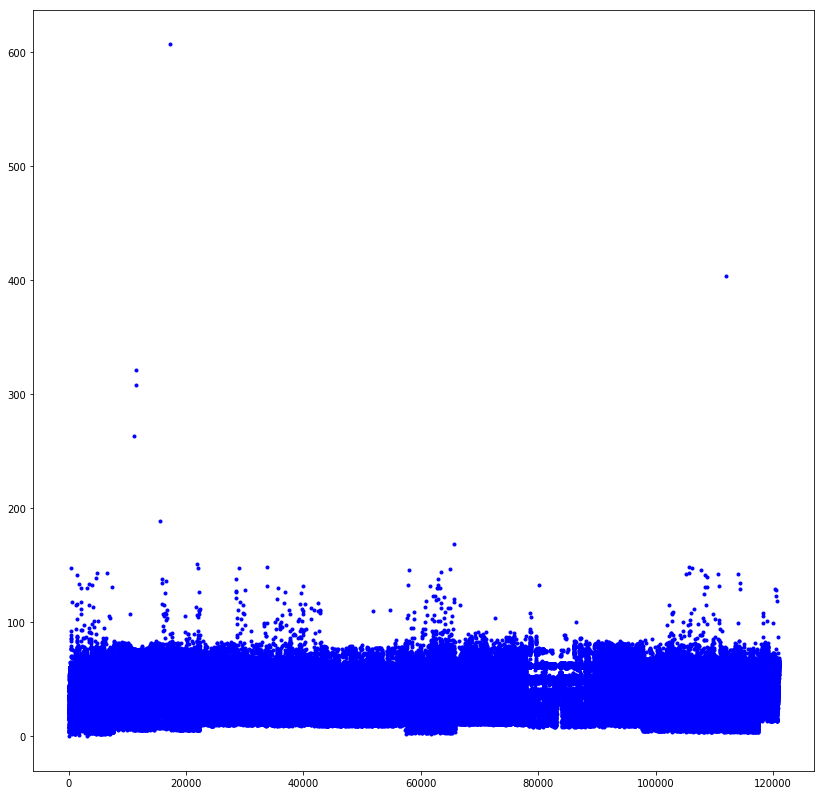

In [59]:
from matplotlib import pyplot as plt
plt.figure(figsize=(14,14))
plt.plot(items_E,list_E_dist,'.b')
plt.show()

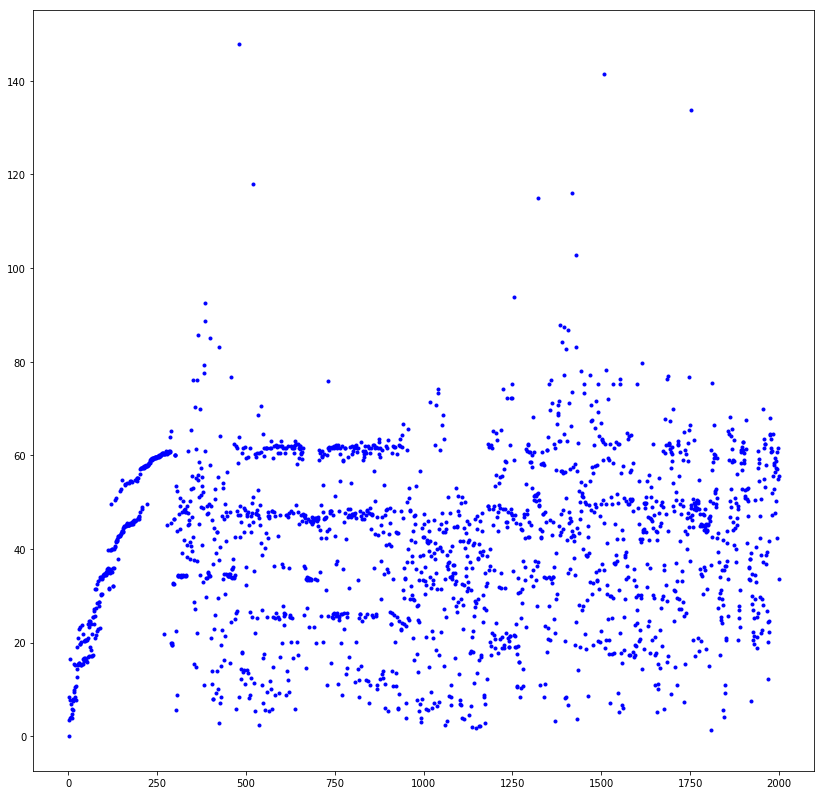

In [67]:
from matplotlib import pyplot as plt
plt.figure(figsize=(14,14))
plt.plot(items_E[0:2000],list_E_dist[0:2000],'.b')
plt.show()

# manhattan distance

In [62]:
def manhattan_distance(start, end):
    return sum(abs(e - s) for s,e in zip(start, end))


# Query for calculate similarity

In [63]:
query={
 'state_code':18.0,
 'record_code_iodine':3,
 'sex':1,
 'age':5.0,
 'weight_in_kg':5.0,
 'length_height_cm':59.200001,
 'haemoglobin_level':9.0,
 'first_breast_feeding':1.0,
 'is_cur_breast_feeding':1.0,
 'day_or_month_for_breast_feeding':5.0,
 'water_month':0.0,
 'ani_milk_month':0.0,
 'semisolid_month_or_day':0.0,
 'solid_month':0.0,
 'vegetables_month_or_day':0.0}
print(query.values())

dict_values([18.0, 3, 1, 5.0, 5.0, 59.200001, 9.0, 1.0, 1.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0])


# calculate manhattan distance  similarity between Query and dataset

In [64]:
counter=0
list_M_dist,items_M=[],[]
for row in df_concat.rdd.collect():
    l=[row['state_code'],row["record_code_iodine"],row["sex"],row["age"],row["weight_in_kg"],row["length_height_cm"],row["haemoglobin_level"]
       ,row["first_breast_feeding"],row["is_cur_breast_feeding"]
       ,row["day_or_month_for_breast_feeding"],row["water_month"]
       ,row["ani_milk_month"],row["semisolid_month_or_day"]
        ,row["solid_month"],row["vegetables_month_or_day"]]
    dist=manhattan_distance(np.array(l),np.array(list(query.values())))
    counter+=1
    list_M_dist.append(dist)
    items_M.append(counter)
    print(dist)
print("Done!")
    

0.0
20.699997
6.01666377619
8.4000001
47.4666675667
15.599999
6.19999695
15.9000001
3.9999969
7.49999905
10.5999992
9.3000018
13.69999885
16.5437491
40.2666658667
19.3000009
23.5666660667
42.6666626667
21.7166687762
16.6166674762
13.0999968
23.1437462
54.3221500872
27.1666687667
26.9221523872
32.1221526872
54.9999988
24.0999968
63.0221494872
32.4221490872
32.7221492872
53.6221526872
53.6221526872
63.6221552872
28.9221542872
28.1221526872
55.4221504872
28.6221502872
66.0221498872
60.8221491872
33.3221496872
29.4221490872
30.7221492872
35.1221488872
55.1221488872
58.2221492872
34.4221490872
55.6221526872
31.6221526872
55.8221524872
54.8221524872
55.1221526872
30.4221518872
66.2221492872
33.2221492872
57.3221496872
33.4221556872
63.0221550872
67.8221538872
66.3221522872
34.12999742
67.4221504872
65.0221498872
32.0999959
29.7221492872
29.3221496872
57.4221490872
29.7221544872
67.8221502872
66.4221542872
61.1221526872
70.0221550872
72.1221554872
67.4221556872
36.1221540872
81.0581833843
80.

68.8221542872
67.8221542872
90.6903423954
86.4903453954
107.900002
78.6221540872
87.0903453954
44.8166625762
88.5903443954
110.691340824
89.9903423954
88.3903393954
96.1913378244
108.391337824
110.991340824
87.9903453954
88.6903403954
108.991340824
88.4903443954
88.4903443954
87.8903393954
109.791340824
89.4903393954
111.791340824
30.6624992
112.191340824
87.7903443954
31.9221492872
109.391340824
108.891340824
110.591340824
34.63000212
83.0221498872
30.2318149818
66.2221502872
16.6999998
89.599997
67.4221502872
67.8221492872
114.791340824
27.3221524872
88.3903453954
65.2221552872
84.4903441954
86.0903449954
104.491340824
102.591341024
103.991340824
82.8903451954
103.891342624
106.191341224
109.991340824
65.8221542872
109.461783616
29.0666655667
88.8911349046
88.9903393954
67.3221502872
89.4903453954
110.991340824
21.2000022
88.4903393954
110.391340824
15.2999971
90.0903403954
108.591343824
27.6437518
107.158188584
109.691340824
87.7903393954
88.7903393954
68.1221492872
87.8911349046
11

116.891134905
107.891134905
114.891134905
114.891134905
113.199999
104.290341995
77.9581867843
116.790342395
85.8581863843
64.5221522872
98.4581865843
63.0615379481
96.6903423954
123.391340824
87.8921894837
49.762501
105.890344395
113.590340395
112.590344995
104.390339995
108.891134905
56.8221524872
103.590340395
135.461783616
102.990342795
74.0581861843
107.490342395
76.3581863843
48.1221521872
58.8221524872
28.8666676667
103.690339395
116.090340395
51.5624988
9.200001
104.590342395
100.158186584
16.200001
25.8666664667
39.4999988
111.600002
125.190342395
107.4000022
63.0221522872
38.3437488
67.2221520872
116.099999
108.299999
116.891134905
76.6221522872
53.862499
108.891134905
135.099999
73.4221522872
10.799999
89.8581865843
91.1581865843
144.999999
132.391340824
87.7581865843
112.699999
131.461783616
54.3581835843
27.8500015
151.791340824
35.1999958
153.291340824
101.5499969
131.590342395
127.790342395
127.390342395
139.491340824
129.791337824
122.8499994
129.591343824
17.400002
132

148.645904177
70.0615379481
129.456251994
147.645904177
22.2437489
64.0221522872
26.0999992
113.891134905
48.0624988
117.891134905
127.461783616
63.4221490872
149.645904177
148.645904177
111.891134905
53.3999961
11.3000009
119.490344395
129.461783616
111.290339395
63.1221526872
77.2221492872
76.1581895843
59.5221522872
113.891134905
118.791338824
115.891134905
80.0581835843
113.891134905
61.1221554872
89.8921894837
73.099999
63.4221542872
12.262955966
73.3221524872
29.34375
95.8921894837
90.6581895843
93.7581865843
65.3221552872
129.461783616
172.699999
114.090344395
81.5581865843
80.9903413954
91.7581835843
82.4581835843
132.691338824
134.191337824
66.3581905843
110.890344395
67.9221556872
56.6221540872
110.290342395
111.890345395
60.5221498872
83.5581865843
58.4221556872
102.090344995
40.0999968
106.099996
113.990345395
142.599999
132.461783616
89.2581895843
132.299997
111.990342395
125.890342395
62.4581885843
132.461783616
131.891343824
94.6581835843
63.1221554872
110.290344395
62.3

15.4474178181
59.0556778445
58.8318139818
85.000002
13.09999705
65.3058619036
80.099996
118.399996
109.600002
116.099997
114.599999
114.400002
124.099999
122.899999
113.699997
120.899997
120.199996
128.091340824
119.899997
130.699999
119.599996
126.899999
105.200002
88.200001
95.199997
93.0903443954
123.591340824
113.400001
91.7903443954
112.999997
69.799999
94.3903403954
96.7903443954
100.390342395
104.391340824
91.0999964
80.7000024
74.1999972
85.1999972
86.099997
66.2000022
44.1318150818
79.000001
71.6581841843
85.5903443954
113.691342824
89.1581865843
115.099996
55.9221490872
130.999999
109.490345395
113.948139284
87.399997
95.7230218528
73.5581835843
89.9273522152
78.4581867843
66.0581899843
96.399999
69.099999
63.7221506872
60.4556718445
58.8221496872
13.4954941423
16.1954944423
66.9280153908
8.90000105
119.825114866
58.5221522872
58.5221522872
55.3850796495
124.599999
118.699999
111.899999
107.190339395
99.8911349046
102.099999
21.9166624762
57.1318141818
80.5221522872
90.999996

59.9221523872
73.3221524872
73.0999992
76.299997
5.9999988
13.200001
70.5999992
72.899997
9.3999989
7.2999978
71.3221524872
47.4999988
76.1280155908
8.2000019
3.0999999
69.499996
54.12999882
69.0999992
57.5000012
15.4474178181
130.400001
140.899999
119.891134905
122.199999
88.799999
138.599998
91.700002
153.699999
144.199999
122.990342395
140.461783616
156.599998
137.0
111.299999
117.590342395
101.958186584
108.599999
87.7221522872
121.000002
73.6221522872
67.299999
78.4221522872
56.9999988
97.7581865843
34.5437491
85.899999
138.391340824
147.991340824
140.461783616
124.999997
149.099999
141.461783616
115.799999
110.399999
105.099999
104.399999
24.1437518
75.799999
101.699999
10.8999989
82.499999
79.8999994
107.158186584
119.799999
126.999999
127.791340824
128.999999
92.399999
91.7581865843
93.1999986
96.599999
113.399999
86.799999
143.899999
12.500001
68.1221542872
164.299999
10.6166655762
56.8999994
22.143749
94.899999
69.9221518872
58.3999994
73.499999
8.4999988
74.6999986
64.799999

149.499999
110.990344395
95.199996
16.4474178181
114.600001
169.499999
169.991340824
118.400001
140.990341395
113.900001
11.6999998
142.091342824
119.099996
110.458184584
147.890342395
128.691337824
78.7581831843
119.590344395
159.3
84.2221552872
121.690339395
96.4581835843
134.891343824
175.691340824
72.6221540872
77.2221522872
116.100001
119.000002
165.199999
149.999999
171.699998
127.500002
111.799997
163.999999
12.4166664762
129.591340824
75.0221522872
101.590344995
88.8581891843
67.0581847843
123.300001
134.590342395
130.999996
115.399999
134.000001
77.0581861843
159.091340824
175.999999
116.690342395
105.358184584
149.499998
119.790342395
143.299998
91.1581865843
136.790342395
114.358183584
136.199999
70.4221518872
70.6221488872
71.7221544872
101.058183584
7.9999988
172.499999
72.2221506872
162.991340824
131.299997
120.700002
71.6221542872
141.791344824
113.390340395
51.4318190818
11.1999991
8.01666687619
103.358184584
139.699997
7.00000215
42.2666634667
73.6221526872
133.0903423

73.3999956
74.3221524872
51.8221524872
18.5000012
45.5999992
72.4221518872
54.0221522872
70.1999986
4.299999
13.900002
75.0000012
7.81978159408
80.600002
13.1999991
92.9913408244
69.999999
23.2999962
74.6999986
63.5999992
77.299999
30.8437488
60.4221542872
122.461783616
134.699999
126.099998
117.999999
131.599999
117.799999
133.091340824
118.199999
103.799997
106.500001
113.691340824
106.2999994
111.099999
116.499999
123.8999994
114.691337824
109.8000018
111.499999
112.999996
133.599999
100.658186584
97.999997
100.600001
89.4581867843
111.900001
95.699996
100.499996
97.0340018994
102.300791509
119.600002
91.7581865843
119.199999
94.199999
103.890345395
126.999999
122.599999
126.491340824
84.7581869843
69.5999968
67.4221518872
16.4474178181
54.4000016
20.0437458
6.19999695
79.2221522872
8.64999864605
109.499999
18.6437471
69.8221500872
73.7221506872
92.999996
73.2000024
16.4000008
113.491340824
112.299997
105.258186584
94.2581885843
54.0999959
35.5999999
53.1999958
58.1999991
62.8999989

35.2666634667
42.8666685667
35.8437512
32.3437481
20.9666628667
43.0666636667
52.0999968
55.7625024
51.362499
62.3624962
49.7625024
38.1624968
45.9625022
51.1624964
51.3318191818
36.9318190818
50.3318167818
73.9318151818
38.0318182818
49.4318147818
68.02999562
57.42999902
37.8999961
67.0615379481
75.1999972
77.4221490872
57.562496
74.2221520872
51.7221520872
63.1999972
38.899997
73.9999974
69.5699988
73.6221526872
77.3221524872
66.5221494872
71.699997
68.6000011
53.9625008
79.7999962
62.999996
55.0615379481
72.9221542872
72.1221526872
56.4318143818
66.2221502872
79.2999966
76.7221502872
73.5221552872
54.099997
68.3221543872
67.3000014
73.099996
74.799999
49.3666652667
86.499996
70.5221498872
67.8221538872
74.799999
64.5221498872
64.5221498872
80.4999974
74.6221502872
75.8221524872
82.1221552872
80.599997
72.4221522872
77.1999972
64.7221520872
78.999997
77.399999
59.800607413
59.900613413
124.622492527
64.800610713
94.899999
31.6999991
122.5999968
124.0999992
82.0999992
28.799999
136.29

132.931757263
146.5499986
19.3416676792
123.583063956
122.583063956
122.983063956
89.1999992
21.8541676792
129.422492527
13.0352942765
114.4999988
81.0999992
87.899999
104.522492527
107.820234204
86.8202342039
127.683063956
112.1999992
103.5999994
124.583063956
125.899999
13.3043491
109.322492527
87.599999
102.099999
100.799999
111.6999992
89.6999986
123.732874265
111.5999988
110.383065956
113.0999992
139.122492527
12.7352952765
101.722490527
100.332874665
125.183063956
121.0999992
97.8224905274
34.3134301404
119.432874665
140.699999
122.299999
107.820234204
128.183063956
120.632874665
122.983063956
116.932874665
17.7352952765
125.222492927
125.722492927
127.122492927
138.083063756
137.383063756
143.483063956
73.4328750651
130.222492527
83.8319539109
151.683063956
102.132874665
113.132877665
128.522492527
139.331755263
105.632876265
137.883063956
21.3541676792
130.379361468
123.783065956
68.7328780651
108.899999
30.4825375873
52.500613813
41.400608713
40.600607613
30.300608813
116.8999

168.031757263
156.799999
83.7224924274
111.322490527
124.283063956
94.5224926274
101.422489527
106.820234204
130.931757263
147.883063956
106.283063956
162.7999986
135.2999978
165.699999
62.8031270016
111.199999
63.2999958
91.099999
137.499999
51.900612513
108.9999992
125.883060956
108.2999966
107.283063956
107.9999962
110.7999966
123.4999992
103.9999988
153.9999988
110.099999
131.931757263
133.2999978
106.200002
86.600610413
76.3999989
79.1999986
129.931757263
106.283063956
133.699999
133.4999988
133.5999992
134.1999986
108.5999992
131.422492527
118.322492627
124.299999
108.5999992
123.8999988
110.2999986
127.822492527
59.0352949765
162.7999992
126.799999
171.299999
109.499999
76.8031242016
141.299999
86.3328718651
101.7999988
59.2708325469
51.9999993
108.8999988
117.4999961
135.5000028
19.2416684792
82.7224924274
129.1999991
119.4999962
159.8999988
117.400002
49.3842115316
111.3000018
57.9031241016
104.4999988
41.7708292469
113.799996
27.2352952765
21.700001
21.700001
14.6043488
142.3

27.3541676792
105.983066556
94.7224945274
131.8999994
24.6264714686
31.0999987
141.499999
189.820234204
124.9999992
130.199999
116.099999
22.3999982
18.999999
91.8319539109
139.2999992
84.899997
92.8319539109
65.3134301404
121.3000012
77.7000014
139.099996
75.8000018
160.399999
118.499997
14.0352911765
106.2999968
159.999999
162.9999982
157.8999992
113.399996
93.7999962
160.699999
82.5000008
162.799999
79.7999972
162.2999992
79.8319539109
161.399999
12.3999968
144.999999
15.2999966
17.7
86.800002
130.099997
85.8319539109
112.820234204
145.2000012
112.820234204
136.379361468
112.820234204
136.379361468
78.0999968
88.8319539109
137.379361468
156.083601425
85.8319539109
136.379361468
83.8319539109
155.2999992
82.9999958
124.0999962
140.2999986
86.8319539109
114.820234204
137.379361468
113.820234204
151.2999988
74.0999954
84.499996
114.820234204
89.8319539109
136.379361468
22.1352948765
110.0000019
32.0000016
113.8000012
42.5000026
83.8319539109
115.8000011
65.9999972
48.6000022
89.4000018

112.499999
117.799999
83.0000008
112.800001
102.820234204
143.331758263
95.9000012
97.900002
83.6224925274
102.820234204
103.820234204
92.1224925274
104.3999966
21.5416686792
118.522495527
117.983065956
92.5328768651
144.2999988
92.0224895274
74.200612213
148.699999
111.722494527
116.322495527
27.6416678792
107.499996
69.600612813
69.900607813
128.983063956
83.0328776651
127.1000018
128.183063956
128.699997
109.322492327
145.083601425
125.379361468
87.8319539109
146.083601425
145.083601425
126.379361468
145.083601425
126.379361468
99.8319539109
87.0000022
84.9224955274
137.383062956
110.4000008
83.8319539109
127.379361468
140.183063956
77.8319539109
110.2000022
146.083601425
140.783063956
141.883063956
134.983063956
129.8999972
80.1328726651
81.1000006
144.5999986
131.183066956
103.622489527
83.4328716651
129.983063956
83.3328776651
76.8328722651
87.8319539109
115.700002
143.731757263
130.2999956
149.399999
69.200613613
70.100607613
68.800610213
107.222495527
135.183062956
126.37936146

73.6000021
72.000613813
72.2000024
74.100607613
111.432876465
43.576713526
21.1416685792
98.5000018
75.9000017
117.8999992
82.0000026
95.7000019
35.2128185274
18.4
18.6000023
19.3541688792
119.351843161
68.999996
107.099999
120.299999
103.800002
89.200002
98.0999958
70.8000024
77.8000019
13.3000021
97.7999959
103.7000022
121.599997
89.6999992
72.4999988
19.4264673686
95.5000022
57.3000018
17.5416636792
18.3541657792
120.199999
75.9000018
115.422495527
71.900001
68.0031268016
66.7031271016
27.6352910765
92.1328716651
19.5043477
17.0043498
14.4043447
23.2352921765
15.6842086316
13.4043478
103.883063956
11.4416668792
78.1328720651
99.2000022
15.5416667792
11.5043501
71.100002
47.3000023
22.8541685792
113.322494527
91.4999998
108.100002
71.7000014
99.499996
109.299996
161.6999989
76.400608613
104.3999956
101.000002
48.6999958
91.5224905274
73.200608013
98.8328766651
115.599999
106.632877665
95.2328766651
85.0999992
88.6999972
149.3999991
115.222490527
54.1892879196
72.000613813
123.8999994

128.0999992
85.9999992
121.183063956
120.983060956
76.500613613
88.1999969
113.3999969
73.3000023
101.099996
132.5000008
122.0999992
141.1999988
72.800613513
87.199996
32.100003
103.299997
84.399997
72.1999958
64.299997
91.499999
67.900608713
120.8999986
85.5000009
123.5999992
71.5000016
116.7000006
73.500613813
80.1328766651
92.8328726651
64.6999972
69.600609013
70.100613713
79.900610613
140.8999989
121.800001
69.300608813
64.000607713
70.600002
72.900608213
81.700001
99.999996
75.100613713
76.400608213
68.000612413
81.900608613
122.100002
73.300608613
100.8999962
69.200612213
77.500610613
66.300610713
78.800612613
66.400612513
76.799999
77.899997
79.4000006
79.000610613
61.9999993
72.0999964
75.4000008
85.5000006
95.2328746651
63.800613513
69.700613613
84.600001
76.100613213
80.100613213
83.8999992
101.000001
70.200613613
62.800614013
106.820234204
73.200608013
159.083601425
109.300001
75.800613613
140.783060956
158.083601425
102.7999962
77.900608213
116.820234204
76.200613613
106.29

55.800607413
21.6842124316
134.183063956
137.999999
145.883063956
123.283060956
108.132871665
134.483063956
143.083063956
128.583061956
128.583061956
122.483060956
117.722492527
140.483063956
99.6328748651
144.299999
135.431757263
116.622489527
157.231757263
121.332874665
144.783063956
150.551843161
133.331754263
129.722492527
129.379361468
142.331760263
129.379361468
129.379361468
127.322492527
133.099998
128.522492527
150.399999
136.083063956
150.083601425
107.820234204
162.031757263
120.122492527
154.331757263
149.8999994
129.431757263
98.0224893274
86.6328776651
122.683065956
137.1999992
85.2224929274
81.7224924274
82.7224924274
131.099999
134.683063956
95.2892847196
113.122495527
26.8541676792
107.820234204
68.2825356873
28.8842115316
87.4328726651
150.083601425
112.032874665
123.4000022
129.379361468
101.922490527
38.2892878196
129.183065956
121.022492527
96.0224955274
130.379361468
143.583063956
124.3000014
68.3031270016
81.499997
106.283063956
149.122489527
84.400613413
99.8328

101.5999992
129.500002
138.483063956
107.4999992
73.5892877196
132.483066956
79.9328745651
70.9328745651
70.9328745651
70.9328745651
107.783063956
113.422489527
127.199999
65.3134301404
112.822489527
114.299999
108.783063956
83.7224924274
118.522489527
93.8328776651
107.783063956
140.299999
70.9328745651
116.022495527
115.432875065
132.1999992
108.599999
91.1224945274
91.8999986
128.083060956
107.783063956
108.783063956
70.9328745651
104.322490927
137.799999
146.299999
143.399999
146.299999
134.222489127
73.999999
133.283066956
94.5328730651
128.931757263
82.8319539109
129.4000022
83.8319539109
162.431757263
116.022489527
106.820234204
84.7224924274
129.931757263
134.183061956
116.7999962
123.200002
70.9328745651
129.931757263
108.783063956
84.8319539109
147.999999
103.332874665
32.5708353469
129.931757263
121.883063956
107.783063956
125.699997
135.5999992
123.699996
98.8999984
77.8328765651
86.8328765651
99.8999984
181.599999
123.820234204
109.831953911
103.283065856
102.2999985
121.8

113.983063956
92.699999
132.022494527
116.100002
95.8999989
31.9892867196
26.2825408873
18.076713526
17.976713126
28.5031259016
29.2031219016
73.1224925274
29.8892837196
21.676711526
22.3825388873
26.9825375873
21.176713426
18.176710326
23.7264694686
18.076715426
24.576714226
40.300612613
37.500608613
42.300607413
37.700613613
39.800614013
43.900607813
45.1328720651
105.722489527
100.222492527
23.3031230016
20.8264674686
44.276715226
36.200610813
61.600610413
42.500607613
68.700610813
126.222492927
161.231757263
82.7224924274
116.599999
98.3328746651
137.183063556
119.283066956
82.7224924274
106.283063956
82.7224924274
107.622495527
139.083064156
61.376713226
125.522495427
93.5224959274
103.083061956
83.0224893274
118.183063956
95.7830611563
73.9224899274
120.931754263
106.099997
107.1000006
99.2830609563
70.6224953274
107.499997
106.583060956
101.983060956
82.6224895274
117.899999
80.6224897274
106.0999992
85.9000008
66.8416676792
50.8328746651
127.731760263
99.8319539109
125.63175726

18.5842094316
106.2000008
140.399998
111.099997
80.600002
75.299999
79.000610513
96.4999992
101.4999974
100.7999992
115.3999992
107.4999988
94.7000024
114.9000022
116.099999
90.799996
111.699999
107.2999962
26.9842114316
17.6842095316
115.099999
13.5352949765
130.0999991
131.1999982
133.1
88.7328726651
15.5352911765
20.1842124316
73.5000019
151.9999988
106.820234204
145.5999959
28.6708293469
104.522495527
128.1000032
87.4328776651
162.499999
153.000001
102.499996
32.800002
130.899996
68.676709326
110.099999
125.699997
114.499999
88.099999
56.4000022
133.299997
109.2999994
137.999999
67.5999978
163.799999
109.3999986
144.599999
150.783063956
108.5999992
143.599999
143.399999
141.622492527
151.283063956
131.222492527
160.4999988
142.522493527
118.899999
159.099999
142.999999
145.599999
80.4224915274
120.722492627
122.4999988
137.999999
115.422492327
117.322492427
102.1999988
106.0999992
124.0
110.099999
133.0999988
134.399999
110.099999
133.0999988
122.099999
144.699999
140.722492527
159

111.522492527
124.822492527
113.122492527
121.183061956
103.332874665
150.131757263
140.383063956
84.8319539109
120.022492527
84.300608813
78.800608813
85.700607513
73.8999971
68.4000008
70.0000007
109.899999
97.700001
91.0999968
74.500612413
82.5999959
94.7999962
108.8999965
67.300613513
74.1999972
110.899996
109.299996
117.599996
109.7999958
65.300608813
113.7999988
93.299997
136.5999991
68.0000007
111.099996
57.3999982
131.083601425
110.099996
118.5999988
114.599999
68.800608813
113.199999
66.500612413
130.799999
69.7999972
63.7000014
66.5000019
107.4999962
81.100002
16.1416656792
82.100002
18.8541657792
76.499996
16.0043479
9.83529517647
22.5842125316
28.4000001
27.876715126
17.2000029
33.5825398873
66.0999964
77.4000018
78.200001
65.3999956
111.820234204
66.7999966
71.6000022
83.0999987
79.5000016
97.800002
81.4000022
112.299999
119.600002
113.399999
115.4999988
22.5541674792
133.6999992
25.3541676792
113.1000019
120.999999
34.200001
51.6999958
38.999996
108.5999992
18.8947334662


132.1000032
117.300002
129.7000022
74.9000013
73.8328765651
130.783063956
119.783066956
121.683060956
130.1999986
130.483063956
110.422495527
23.1000006
129.4999986
149.731757263
117.3000022
148.083601425
148.083601425
38.6999958
96.0999966
36.800002
31.4825420873
130.1999992
126.683065956
153.231757263
116.599996
34.300607413
126.683066956
104.322494527
130.4999958
120.883061956
97.5224955274
127.583066956
86.199996
85.6000024
78.6328716651
137.9000012
106.8999962
107.5000018
25.799999
104.600001
154.299999
107.000002
96.200002
83.5999964
106.299996
127.379361468
65.100003
98.699997
111.399999
131.299999
62.900611813
143.0999972
125.8000022
71.0188153917
116.820234204
48.1
35.8999989
87.9999962
42.900612513
61.5999991
129.8999988
154.299999
150.1999976
57.8000009
56.700610813
54.5
147.083601425
43.9999988
117.2000022
144.000002
42.800614513
102.9999956
68.7000017
128.379361468
148.3999976
121.399996
115.0999962
120.2999988
128.2999988
57.0000012
61.7000034
54.4000027
60.1000018
108.82

31.476714526
90.3224955274
12.9043497
38.2708353469
87.0224905274
13.9352931765
20.5541655792
33.0
84.3224905274
23.6416666792
62.7000009
11.304346
90.999997
74.700001
107.5999962
12.3541645792
108.5999958
84.7000012
131.5999992
33.1000006
108.5000019
48.9708342469
30.476714526
121.099999
113.7999985
149.899999
70.100002
82.3999989
37.0999959
62.3031214016
75.4999989
31.2264713686
88.1999972
34.3000009
24.0842137316
128.6999989
30.476714526
75.8999989
89.399997
85.300002
72.7000024
102.500002
71.000613813
129.500001
95.699997
135.799996
62.3031214016
69.900608213
61.5825414873
128.383060956
133.283063956
107.122492527
71.7999969
127.9999991
71.4999993
103.7000011
132.099999
71.9000022
129.800001
114.820234204
135.2999992
153.999999
59.3708305469
109.8999972
74.4000008
132.4000022
73.3999965
116.4999958
148.231756263
128.379361468
130.300002
144.7999969
131.9999969
111.9999958
151.5999992
109.4999988
84.399996
119.099996
129.0000018
98.300001
128.783060956
152.699999
84.299999
120.40000

155.9999959
104.800002
139.1999988
104.0999989
76.599999
62.1999986
88.600002
78.0000016
96.1000016
143.1999989
135.799997
13.2043449
140.999999
76.899996
91.3999992
76.5000012
123.1000012
131.2999972
144.999998
116.499996
142.0
122.800001
76.2999962
125.5999972
118.5000008
111.3000018
67.4999974
78.799999
82.2999962
108.8999968
96.699999
83.4999969
13.7000029
32.400003
38.2000029
62.2000029
89.9000013
60.8999996
59.0031240016
70.1999986
28.7000029
24.376715326
33.5708341469
111.500002
45.0825367873
117.799999
120.379361468
124.499996
125.199999
82.8999956
132.400002
120.820234204
136.1999972
72.7999976
117.2000019
85.2999957
139.083601425
111.0000008
124.9999968
135.5000018
119.5999989
68.4999993
99.1999959
125.8999989
126.1999969
79.3999989
126.6000009
80.1000011
120.379361468
87.899999
144.099999
143.899999
119.820234204
119.099997
118.820234204
121.9999988
138.799999
109.8000018
123.2999958
119.379361468
137.099999
72.699996
119.379361468
119.379361468
119.6999986
113.899999
134.59

40.5999992
131.819538995
41.9000008
86.564065252
98.6229532256
109.819538995
139.8999994
111.164062352
121.800002
114.600002
137.709887475
95.164065152
137.8999989
142.099999
26.9083343833
86.564065252
43.4732659649
135.009887475
144.099999
41.5555565231
73.8229511256
108.819538995
117.400002
88.864065452
131.599999
109.819538995
41.5555565231
134.009887475
40.5555565231
134.009887475
134.009887475
125.619541995
128.319538995
78.6555564231
114.173267065
28.695002845
73.6732666649
58.4732659649
108.664062352
141.299999
108.564065352
36.8093504317
92.6229512256
109.819538995
97.9229542256
58.4732659649
134.009887475
54.0923715337
56.5732644649
114.064065352
110.819538995
145.009887475
131.219540995
72.8732670649
84.4229496256
135.799999
129.119541995
87.564065252
86.564065252
145.319538995
85.6732610649
132.299999
114.419538995
17.6631590684
105.764062352
56.1280538501
86.564065252
36.8093504317
89.764065552
99.864067352
82.9229482256
86.7229540256
47.4732668649
124.619535995
39.65207092

133.009887475
55.4732659649
133.635621363
150.586022973
127.6999986
127.299999
108.819538995
41.4732659649
167.099999
84.499999
40.0555565231
28.4357152071
126.6999986
82.8999994
104.299999
83.8999994
150.686022573
117.499999
127.6999986
73.8229511256
84.299999
29.964065352
29.4357152071
85.564065252
150.586022973
134.009887475
94.699999
51.3999989
128.8999989
153.3999994
109.819538995
28.4357152071
74.7999994
109.600001
65.3732660649
131.419538995
152.1999991
140.109887475
108.8000014
155.499999
88.5999992
98.3999994
68.5999964
142.8999988
115.299997
37.7999992
103.8999994
21.4631587684
115.699997
21.799999
126.8999994
33.9000006
127.6999986
40.9000008
104.6999986
118.464063352
65.7732618649
140.299999
16.4213922977
86.564065252
70.399997
16.899998
84.8229512256
105.6999968
117.899999
91.499997
131.899996
131.799999
71.2999971
90.6999972
42.8000009
108.819538995
129.4999988
84.199999
109.819538995
85.564065252
41.4732659649
85.564065252
72.1732624649
40.4732659649
41.4732659649
108.81

126.500001
97.964067352
145.499999
79.1999972
94.399999
54.0740030744
155.609887475
140.519540995
20.5083335833
138.300002
96.600001
72.6732624649
149.3999986
99.7229492256
140.519540995
16.7000010238
64.9923716337
167.109886475
140.519541995
136.0999986
75.0732644649
118.699997
78.6732670649
137.7999964
126.299996
67.3923660337
98.0229512256
12.5000019238
110.464063352
78.0732660649
97.1999956
19.5083361833
94.2751741342
116.064068352
102.622948226
72.7732618649
62.1520700234
125.364068352
68.2999966
39.9093517317
26.6213920977
133.8999966
80.8000006
133.7000024
96.199999
77.9999988
21.2083364833
55.1280538501
99.799996
30.7732660649
74.600002
127.699997
87.100002
98.9229542256
130.719536995
77.9732640649
149.019538995
19.5093507317
19.7357161071
84.199996
141.699997
97.600002
82.5229492256
140.3999968
67.5229482256
87.1999968
105.722948226
18.595001745
15.5357170071
17.8999982238
75.600002
17.7357161071
106.700002
83.399996
102.099999
87.100002
87.199996
81.0732644649
77.8000014
82.2

39.1555564231
58.9732668649
126.819538995
38.1555564231
44.0520649234
38.3923703337
124.999999
21.1093487317
37.0999992
77.9999992
131.319538995
77.2999992
149.509889475
73.3732636649
36.3520698234
64.8999994
121.899996
151.2999991
29.1357150071
134.0999994
123.319538995
122.319538995
29.8000009
131.299999
129.319541995
86.1999991
75.4999988
108.8999988
98.299999
127.8999989
159.609887475
33.4083343833
133.299999
110.099997
16.4999992
36.1999967
79.1999963
37.8999994
66.1923658337
112.199999
81.8000018
127.799999
71.195000945
135.199999
107.0999992
111.799999
28.0999992
77.6999991
128.6999992
110.6999986
154.8999994
108.799996
67.1999988
110.4999986
73.4000008
64.799999
71.799999
155.999999
110.3999994
108.819538995
112.299999
155.799999
111.8999986
103.8999994
92.0999968
73.299999
35.7093505317
154.799999
85.1999991
95.6999972
109.9999994
55.1280538501
91.8999994
127.8999994
97.9999988
70.4999988
55.4999988
103.899996
106.699999
30.095001045
104.922953426
140.499999
133.9999994
106.39

109.819538995
134.009887475
134.009887475
115.464065352
131.064065352
131.999996
110.819538995
41.0555565231
41.0555565231
109.819538995
73.8229511256
140.409890475
137.619538995
135.799999
128.999996
134.699999
111.899997
159.299999
66.1732666649
117.299999
84.299999
34.799999
36.5999992
37.0
129.619535995
160.009887475
139.299999
103.299999
146.519538995
89.0229532256
112.299999
110.864068352
87.6229494256
131.519540995
65.7732618649
126.119538995
142.8999988
114.4999988
60.8732674649
110.864062352
82.399999
142.119538995
142.599998
129.619540995
130.499999
50.0740030744
81.899999
92.5999988
115.899999
150.309887475
66.6732620649
53.1280538501
132.519538995
123.064068352
47.3555515231
72.3732660649
154.4999988
149.509887475
112.219538995
127.819540995
112.919538995
43.695000945
72.8229511256
110.819538995
76.6229513256
124.319535995
65.7732618649
139.709887475
122.819541995
96.3229544256
140.519538995
163.809887475
108.264063152
31.1083341833
103.664067552
158.209887475
145.119537995

109.499999
131.499999
139.509884475
60.9732621649
139.309889475
107.799999
60.3999994
110.664067352
30.9631587684
45.695000945
131.8999994
148.909887475
122.600001
130.119540995
54.3555576231
158.809887475
112.864067352
86.564065252
94.5229490256
99.2732642649
106.164068352
129.719535995
32.695000945
106.799999
110.7000024
57.4732659649
131.3999994
21.600003
29.9357152071
120.699999
71.3999994
122.1000021
87.9999991
56.1280538501
133.0999992
102.264067352
66.1732638649
155.2999994
57.4732659649
109.819538995
132.299999
132.299999
95.0229482256
95.0229482256
126.099999
119.599999
141.999999
86.964065352
92.399999
22.6631590684
131.6999986
73.2999956
33.695000945
144.299999
107.3999986
54.308837836
75.5732658649
140.399999
118.699999
144.199999
24.5000012238
78.8999992
135.1999984
77.0732640649
108.819538995
28.695000945
141.299999
50.299999
106.9999988
52.1280538501
116.299999
130.9999988
74.8229511256
95.700002
142.799999
117.299999
102.400002
90.499996
93.299996
86.564065252
29.695000

90.000002
95.6000014
125.455161357
112.5500024
50.1083322833
101.0000024
56.6999991
90.899996
101.5000016
48.7213936977
41.2999971
43.7999997
107.700001
93.2999966
76.3999994
93.5999994
137.7
131.099996
90.4999986
82.499999
113.599996
97.4999994
78.6999994
131.9000008
107.999999
84.899997
124.4999964
106.799996
58.799999
119.399996
107.1999994
51.3000009
102.7999988
40.2357142071
51.995001845
100.799999
133.2999994
90.0999964
93.0999994
151.0999964
62.6000008
106.8999989
73.4999989
73.3999961
89.7000019
91.199996
86.8000014
55.6631599684
62.2999957
22.1281290534
99.8229532256
79.3999984
64.7000019
60.7999971
70.7999966
97.1999986
72.3999989
113.500001
77.6999986
98.3999956
128.719538995
102.222951226
47.3213923977
79.0999992
75.700001
107.8000014
89.9000022
73.0732620649
92.2999994
56.3999975
53.0999999
125.4999961
95.1999962
114.700002
110.6999968
109.300001
76.2999962
209.3000072
81.4999988
60.4000022
85.6999991
70.299999
116.3000012
153.5999991
100.6999991
97.9000008
110.864065352
1

61.3999994
29.5357163071
92.364068352
113.364067352
127.819538995
79.8229516256
85.4000019
69.499999
50.8000018
117.6000004
129.2999964
73.8999989
88.3999994
100.4999991
54.9999974
130.219538995
115.019541995
121.6000012
53.294998945
125.599999
80.299999
42.9631587684
61.7000019
46.899997
49.9999974
82.5999992
183.199999
131.919538995
206.709887475
86.2229512256
14.4357140071
81.2999994
107.964067352
128.064065352
70.964065352
131.219538995
117.064065352
102.275174134
141.695911048
109.764065352
113.264065352
69.4437495023
56.3999994
117.0000008
66.9999969
89.7000024
109.364067352
56.9999988
103.8999988
145.099999
127.119538995
153.9999978
144.9999994
95.499996
53.0000012
28.9631580684
95.200002
128.199999
106.5999994
131.3999989
91.8999966
48.2999976
68.399997
101.099997
101.722953226
63.6732624649
50.1999972
114.699996
39.0
76.9000008
82.0999992
145.7999994
67.9999988
142.2999994
114.464062352
97.3999989
55.2999971
60.9000022
47.5999994
131.219538995
106.600001
71.2732618649
115.5640

100.6999972
75.8000009
127.5999958
62.8000009
89.599996
74.0000021
94.0999991
126.600002
113.0999992
83.8999994
129.0000021
123.7000012
66.499996
106.1000025
122.8000022
20.2000010238
89.9000013
84.799996
31.295002045
117.600001
78.6999958
99.8999966
83.6999958
106.500001
24.7357173071
75.3999986
72.900001
125.5999991
43.1999998238
86.0999964
39.6999991
97.664068352
121.7999962
105.2999959
133.664065352
35.895001945
21.1631590684
84.6999963
76.3000018
37.4213922977
88.7229532256
102.299999
70.0999959
66.9999988
74.1923714337
97.400001
82.9999969
32.299999
88.564062352
91.5999959
110.422951026
105.999996
59.4999993
45.2093467317
87.6229542256
98.6000022
24.2631570684
111.464062352
71.5732658649
96.5229492256
133.819538995
76.9732616649
93.4229512256
95.0999964
105.8999966
59.6999988
83.6999988
107.364062352
53.7732630649
128.999999
124.399999
91.6999988
119.464065352
107.7999994
72.6999988
78.4999974
96.4999958
94.500002
27.9213941977
57.7999957
26.8213970977
74.9999964
55.1280538501
69

103.6999986
155.499999
141.499999
66.8000018
129.3999994
102.3999994
83.3999994
135.549887475
87.964065352
89.8999986
127.9999994
36.5999992
88.8999994
126.4999988
57.3732641649
109.819538995
167.799999
77.0999992
43.3520698234
31.2740080744
114.064065352
52.5732606649
155.299999
106.1999991
25.5631586684
114.464068352
126.819535995
65.2732642649
33.4631587684
132.0999992
65.1999991
23.0000012238
156.0999992
76.8229511256
61.4999988
18.7213943977
133.0999991
80.6999991
77.9229538256
36.3520698234
153.8999994
72.2999962
162.809887475
108.364062352
83.7229484256
73.1280538501
111.4999994
27.3357153071
154.409887475
53.6999996
92.0229542256
128.799999
67.3732608649
94.3229512256
34.9631587684
93.0229542256
91.4999994
52.3520698234
84.7229532256
113.464063352
41.4740031744
74.8229511256
86.564065252
112.7999986
104.8999994
109.819538995
55.1280538501
75.8229511256
41.4732659649
132.635621363
55.1280538501
57.1280538501
85.999999
57.1280538501
50.6999986
130.499999
95.499996
83.3999994
86.5

32.0520701234
85.3732608649
126.419540995
50.8999956
100.222954226
45.8093457317
88.6732660649
142.8999994
115.500002
28.5083323833
73.2999976
129.500002
119.019535995
125.519540995
113.6999974
74.2999957
111.1999964
110.0999964
106.764063352
20.3999982238
76.1999986
77.5000016
131.219538995
78.3732670649
59.1280538501
110.264067352
65.3000009
132.2000021
110.0000018
100.9000022
34.4000006
89.7999962
92.6229480256
103.5000012
77.1732610649
80.0732658649
118.199996
69.8732669649
42.3923656337
76.600002
113.600001
127.5000024
97.6000008
132.699996
31.395000045
73.9732612649
75.3000006
108.500002
109.400002
29.8000026
77.0732658649
118.864065352
129.419535995
137.019540995
31.4093496317
135.619535995
61.499996
132.319541995
139.1999946
110.600002
106.364068352
95.3229544256
101.7000018
42.5999968
108.2999964
92.3999994
117.299999
107.2999964
68.2732642649
120.064067352
83.1732610649
78.600002
87.3000014
103.922953226
72.4732664649
39.8520651234
128.319536995
63.3732608649
88.5229514256
13

108.499997
65.0000026
88.164062352
37.6213970977
65.6732624649
77.1229532256
117.319535995
124.4999992
63.3000023
96.8999972
98.199997
140.6999982
64.6999986
54.8999956
54.0
92.0000022
32.3000018
67.4000008
84.700001
111.2999972
81.9999974
114.7999989
56.5000021
92.400001
77.0999968
114.2000008
94.600002
82.4999974
43.200001
116.599996
74.899997
104.419538995
89.600002
69.8000018
120.419541995
97.899996
121.0999992
86.1229512256
65.5999992
92.499996
64.4999988
24.5000021238
96.4999962
78.7229484256
85.7000014
19.6213963977
89.7000024
105.6999972
35.599998
83.4000022
140.699999
102.499999
165.119538995
66.7732656649
106.419535995
16.9083343833
97.800001
23.6999991
81.6999996
67.1280538501
65.8999984
70.0999992
68.999996
57.4732640649
91.9999988
61.8000018
149.5999959
72.599999
45.4000001
65.4999988
97.1000018
71.6999991
94.1000009
18.8083301833
89.4999993
84.3999956
101.619538995
89.199999
117.3999994
99.900002
31.0999992
74.9999988
23.3999998
63.7229512256
68.5732620649
87.1999989
90.3

82.8999971
72.7000019
84.2999957
65.5000012
121.3999984
114.719538995
98.899999
117.7999992
99.6999958
93.699996
95.7999959
103.0000021
104.019536995
93.899999
95.4999969
123.999999
94.8999966
100.299997
89.9999969
102.0999969
123.599997
22.8083363833
88.0999992
77.1999992
86.1732660649
92.4437495023
69.5002090277
110.799997
127.6999992
110.099997
105.700002
103.264063352
92.500001
107.899997
84.564065352
93.499997
120.9999992
102.1999974
66.4000018
111.0000022
110.0999969
64.100002
65.1999969
65.7000019
116.9000019
82.6000011
94.3999969
34.999996
35.8000023
107.3999991
97.1000019
111.319541995
118.999999
92.6000011
98.199999
32.9213934977
88.064067352
110.8999972
69.700001
76.7999959
64.9000008
87.0000012
33.1000011
105.0999968
81.4229510256
92.1000011
59.7999978
121.319539995
64.4999955
100.722949226
15.8999989238
59.6999958
108.0000021
63.0000018
81.9000009
27.7093517317
92.1000019
98.1000009
20.5740082744
20.8631550684
91.3999989
98.4000018
114.7999988
35.6555521231
100.4000009
93.

73.2999962
64.9999974
118.599996
34.6999963
126.8999989
107.1000019
97.1229532256
108.9999969
119.700001
123.8000019
30.8999956
27.1083322833
93.1999989
95.6229532256
34.299999
40.5000021
112.0000012
124.3999986
127.2000008
85.1999996
100.8999972
23.8083325833
119.799999
92.2751741342
99.7999989
47.0000012
127.9999986
117.999999
94.2751741342
130.695911048
111.455161357
85.799999
112.7999964
141.4999994
91.399997
85.0000026
111.399999
71.4000017
130.695911048
111.455161357
108.399997
83.1000024
51.799999
101.1999956
22.7740080744
120.819538995
23.0631548684
138.1999994
83.9999974
143.8999996
129.9999994
114.7999956
27.694999945
82.2999966
24.595001045
86.8999968
17.5357144071
119.4999988
22.7631546684
90.2999959
121.7999988
56.999996
99.900002
21.694999745
114.4999969
72.2999962
114.419541995
92.1999991
21.3357110071
73.7000019
70.5999968
23.795002045
43.7740061744
105.6000022
187.999999
30.694999945
89.7000005
61.2000014
92.0999989
75.3000004
99.9000008
93.9999994
60.8000014
70.400002

99.899997
60.3000011
86.464065352
88.100002
96.4999972
96.100002
49.700001
72.1999986
111.3999994
94.9000008
88.9732640649
88.364067352
87.799997
50.699996
102.199997
112.1000024
79.099999
85.999999
15.6999972238
90.1999986
93.5229533256
51.3000018
64.4999974
76.1000015
20.8083332833
71.6999963
34.4999988
109.6999974
100.899999
90.2999971
68.3000018
105.6999956
109.199996
78.999999
36.299999
55.1280538501
38.4999974
116.7999986
53.1280538501
18.7999971
21.1999986
31.5999973
51.8000014
81.099999
101.3000009
97.699999
69.299999
89.7999994
86.1000014
37.4000008
90.1999994
85.300001
64.499996
101.6999956
84.8999964
103.999999
106.1000006
87.4999966
69.899997
100.799996
96.6000024
96.1999994
100.7000014
75.1999996
89.999999
109.400001
96.1999994
78.864064952
83.1000006
113.399997
105.9999988
74.7732618649
89.1000014
70.6999967
87.9000014
77.499999
50.7000019
79.6999991
84.7000019
73.9000008
92.899999
64.1999991
111.700002
104.7999994
103.900002
34.7213924977
61.8923684337
88.7999966
104.599

92.1229508256
51.6999961
131.3000011
41.3999994
58.4000013
165.1999986
121.3999992
74.8732660649
139.1999992
131.5000022
145.695911048
153.7999989
119.4999962
164.799999
136.964062352
52.899997
82.2999971
23.5000021
144.695911048
100.122951226
98.1999996
24.5999987
24.5999987
108.5999987
111.3999988
107.0999992
61.0000026
139.8999988
73.5732639649
52.4437495023
121.499996
89.699999
71.3000004
69.8732608649
101.622951226
135.3999988
86.100001
105.6999961
28.695000945
131.3999994
120.399999
97.7000008
69.3999989
39.9999988
139.7999989
42.7213943977
138.599999
104.3999956
95.4999988
74.100002
102.599996
137.999999
105.2999986
58.9000013
46.2000010238
74.3999986
72.2999966
66.4000016
78.8732622649
130.6000022
130.8999992
15.6357150071
15.0357144071
101.7999972
156.5999984
115.1999972
24.195000945
142.3
90.1229513256
25.695000945
22.2093486317
129.119535995
103.7000021
68.6555545231
17.5357170071
88.3000023
97.9000024
107.8999974
69.3000023
54.7999995
110.764068352
132.100001
70.699996
78.1

47.9000022
62.8000018
104.5000008
82.6000006
122.9000014
122.819535995
104.2000012
42.0213983977
112.0000009
63.8999966
92.3999994
104.3999969
104.200002
19.6000011238
88.6999972
68.4437495023
74.6000006
68.4437495023
54.1000006
66.2999971
96.8999994
21.2999990238
90.1000025
127.1999968
98.6999958
40.6357124071
125.8000008
68.4437495023
103.12805385
60.3000014
88.2751741342
87.2751741342
140.2999994
121.899997
68.799999
145.6999989
99.1000018
43.094999145
147.4000009
104.9000022
45.995001145
93.5000021
68.4437495023
104.8999989
105.8999959
110.4999988
79.500002
78.8999994
99.100002
86.9999988
138.100001
109.900002
50.395000745
135.3999969
69.8999965
109.5000018
46.395000745
68.4437495023
35.499996
66.499996
66.2732656649
17.2357161071
101.5999974
30.899997
81.9999962
103.163987498
91.3999968
52.2213971977
35.5000000238
68.4437495023
100.499997
138.099996
73.899997
104.1999968
60.2999976
89.4000011
49.5000007
94.4999974
104.464067752
83.7999962
95.4000022
119.499999
89.2751741342
96.599

81.7499972
146.299999
100.4999974
65.494996845
152.8999988
83.3999961
122.9999972
155.0000002
93.599999
78.9499996
92.7999962
129.3000014
136.600001
163.6300001
94.8700008
148.4899993
85.4499996
81.8100018
121.139999
163.309999
125.455161357
67.3000009
48.1083334833
87.899999
134.199999
242.319538995
76.200001
80.700002
138.299999
75.499996
103.3999989
70.5999987
59.1520681234
43.9000008238
72.7000024
99.6999989
115.664062352
108.5000007
87.9000013
118.3999994
111.299999
129.619538995
60.5999964
135.4999989
71.5000012
98.8000022
133.7999964
60.600002
97.2000009
118.8000024
46.0357170071
78.4732660649
126.000002
122.8999962
46.4999976
61.4000013
103.199996
89.5229542256
24.1740081744
100.500001
80.4000022
76.0999968
94.1999988
89.2000014
112.9000019
11.2631608684
128.300002
106.800001
113.000002
78.8000021
119.2000022
45.6631597684
107.200001
44.1281290534
135.8999988
92.3999958
80.0999959
61.5000026
76.6999989
78.7213912977
80.6999992
109.1999968
61.6999996
84.3999984
127.899999
175.49

123.9999968
86.6000025
119.119536995
126.699999
92.6229546256
76.4999988
118.564067352
86.0229512256
123.5000018
115.2000018
93.664065152
80.3732674649
94.9229542256
60.1923705337
62.3732641649
65.7555549231
100.022954226
56.7732642649
87.3229512256
86.0229514256
135.319538995
109.200001
48.7740061744
98.1280538501
80.3229516256
40.9520678234
84.3229544256
51.5740082744
114.219540995
92.564063352
125.919538995
40.1740081744
112.019535995
69.7732610649
112.264062352
99.5229532256
96.6229512256
40.5936239466
128.119538995
16.5999992238
83.964062952
113.219538995
116.464065352
45.4740083744
115.219538995
45.794999945
104.464067752
127.219538995
47.1740090744
128.319537995
124.919538995
117.919538995
91.864068352
54.8732660649
70.8732636649
117.719536995
128.319538995
80.8229532256
101.064067352
90.7229532256
63.7520647234
127.219538995
116.319538995
85.8229542256
62.0520663234
130.219538995
101.164063352
75.4229534256
124.519538995
74.7229512256
68.2229512256
110.964065352
60.4732616649
6

79.5732644649
51.2631558684
92.2751741342
110.8000018
116.664067352
137.219538995
113.064067352
78.4229510256
114.164065352
68.5732639649
73.3732622649
115.664067352
124.1000011
100.064063352
57.6732638649
85.7732642649
80.1229508256
134.419538995
139.519539995
99.7229542256
86.0229481256
110.299999
117.019535995
106.12805385
117.373263665
54.4740059744
84.9732640649
107.12805385
98.2751741342
82.4732668649
123.964067352
107.464063352
133.719540995
90.2229512256
109.164065352
145.573262065
38.6520681234
111.899999
102.722954226
101.664065352
49.6083341833
132.499999
51.7520680234
65.6732640649
134.8999992
73.7083345833
97.194999045
104.7999991
88.1229508256
129.1000012
103.564065352
53.3732641649
66.1732638649
93.5229512256
115.919536995
139.199999
89.4229532256
126.599999
132.919538995
86.6229508256
42.8083344833
136.799999
93.4229534256
129.0999988
64.6732638649
86.9229512256
83.3229512256
128.299999
110.122953226
130.819538995
79.1280538501
98.964065352
75.9732640649
134.919538995
8

55.0999954
12.2000010238
84.9999988
61.5999986
102.699999
13.8631588684
82.1999986
166.5999964
99.099999
124.399997
53.5999989
125.599997
127.119535995
52.6999986
107.099999
84.3000018
93.999999
49.7999968
50.8999994
28.3631600684
89.6999988
116.099999
93.299999
90.600002
59.700001
119.7999986
53.2999995
123.7000014
71.3999956
84.6000014
61.4999988
102.899999
117.2999968
66.2999962
115.7000014
69.1732610649
137.099999
104.1999962
70.1000011
55.7000024
99.900002
73.1999986
40.395000745
74.9999988
37.6999996
56.9999974
59.3999989
85.2000019
71.2999968
68.0000026
75.0999992
114.064065352
97.4999988
135.0999986
131.899999
57.9999969
102.5999964
71.8999986
67.6999958
93.0999992
52.2999971
64.999999
109.399996
84.099999
117.2999986
77.5999992
102.900002
108.200002
61.499999
68.1999986
103.6999994
75.1280538501
104.5999987
78.9732640649
72.8999994
135.5999986
51.9732640649
78.1280538501
105.0999994
133.2999994
63.5999992
101.399997
112.6000008
67.1000011
101.799997
54.899997
55.4520659234
94.

168.199999
84.5229542256
18.6083365833
80.7000018
104.0999956
53.4999966
102.3000016
17.4999960238
78.399996
100.6000018
39.3093466317
110.822954226
95.2751741342
148.7999992
111.599996
18.2083333833
95.8229542256
133.3000016
32.7093467317
44.2923718337
143.87
79.0732670649
150.199999
134.999999
18.5357144071
62.8229542256
59.6732670649
19.5083304833
149.1999986
59.1923700337
79.0732670649
68.499997
18.5631600684
34.0740039744
107.822954226
93.0229542256
48.4740083744
17.1357112071
141.299999
161.899999
141.299999
113.864068352
26.4093503317
129.6999968
78.400001
147.900002
76.900001
152.6999986
77.1999956
148.099999
79.1732662649
132.900001
104.099997
79.8732620649
132.7000008
78.5000008
131.000001
134.199996
77.6732670649
154.499999
103.664063352
77.9732670649
141.699996
75.300001
134.799999
130.200001
82.0732640649
139.799999
75.099997
107.099997
94.499996
129.9999956
125.099997
71.4732652649
69.7000016
137.699999
99.7999958
133.099999
115.2999966
75.2732656649
146.299999
140.799999

110.799999
66.6999998
114.737534342
84.2000019
23.5093483317
117.799999
124.564063352
25.5999992
71.2732614649
117.400002
114.199999
120.099999
104.499999
99.2229512256
18.3000028
123.164062352
78.699999
136.799999
78.4889232963
142.799999
90.5999992
18.400002
124.422951226
134.455161357
88.5229492256
101.399999
22.0999992
136.842915552
79.6889236963
79.4437495023
129.399999
116.899999
42.5999968
100.302632393
113.702632393
82.0999968
97.8229542256
78.1732610649
129.519538995
71.0732644649
139.119535995
65.8732622649
108.064065352
123.664065352
85.5889232963
140.800002
143.499999
69.5732644649
87.6229480256
29.964065352
125.200002
138.419538995
100.422948226
115.064065352
74.3732641649
63.4000022
82.0732639649
72.1732650649
43.4520659234
133.299997
118.964065352
92.6255846187
79.4437495023
121.099999
72.8999994
101.322951226
66.9862605164
138.119538995
120.464068352
84.999996
84.9732640649
110.064063352
23.7631608684
66.2732609649
106.822951226
93.799996
19.7999962238
108.364063352
23.

104.599996
79.100002
111.099996
19.6631547684
105.2000022
71.8000014
115.800002
110.499999
75.399997
122.0000012
123.199996
26.3083351833
100.4999971
104.0000012
107.3000004
23.2357130071
17.0000019238
118.2000006
98.6999966
119.6000022
96.7999966
103.275174134
101.099997
133.7999992
105.4999968
16.1999979238
24.8999961
119.899997
109.2999988
69.600002
92.1999972
125.455161357
76.5999959
100.999997
125.455161357
100.2999994
71.0000016
102.599996
104.3999972
47.2999962
107.6999986
90.9999998
76.4000008
117.4999956
109.0999992
78.6999986
17.5631567684
108.5999988
102.0000006
79.4999992
124.455161357
104.12805385
49.4437495023
75.0000016
76.4437495023
111.099999
105.600002
99.600002
12.4443192251
77.4437495023
113.199999
71.5999992
96.4000022
91.0999988
15.1357150071
82.2999962
24.7999962238
125.455161357
99.999999
85.199996
91.499996
98.2751741342
30.0093464317
44.2520708234
100.022951426
124.455161357
80.799999
116.199997
74.9999974
103.200001
110.800002
108.400001
86.2000024
112.599999

103.619541995
91.8229492256
87.764062352
64.0555527231
101.319541995
81.599997
85.499997
97.6229532256
59.7999966
89.6229482256
59.3732622649
57.9732640649
81.9229496256
98.5195369948
28.0083354833
81.264068352
28.4213913977
90.464067352
63.4732616649
103.319541995
64.2999971
78.9529492256
20.5000012238
103.199996
18.1357124071
65.164068352
81.864067352
58.5740039744
88.764063352
85.9000012
66.2195409948
108.719538995
75.0999988
86.1229508256
27.5093507317
74.2732618649
91.0229512256
104.455161357
105.455161357
100.319540995
96.264065352
75.0732672649
92.364062352
102.222951226
101.099999
104.455161357
83.1280538501
91.364068352
104.455161357
101.099999
87.100001
108.999999
102.499999
89.099999
90.700001
101.600002
83.499996
31.495001145
109.219540995
94.299996
26.0213964977
54.1280538501
111.099997
24.6357143071
62.5000012
61.6000011
115.600002
118.264063352
83.1280538501
117.899996
95.2751741342
135.799998
96.2751741342
98.000001
128.899999
111.999997
140.3000008
118.099999
53.128053

130.099997
123.799999
90.999996
98.200001
102.100001
123.3999986
74.4437495023
129.199999
65.900001
101.799997
119.799997
124.0999956
100.8999964
111.3999974
87.1999964
107.400002
43.3093516317
103.964068352
124.419538995
113.700002
105.000001
73.6999972
57.100002
101.6999964
105.064068352
102.5999986
122.919538995
104.4999994
104.222954226
99.500002
25.0213940977
87.5999974
76.7999968
96.999997
127.999997
126.599999
78.600002
125.699997
121.299999
29.5000031
72.4000008
127.364065352
25.4000027
21.4083331833
17.7357130071
18.5999992
115.800002
58.5740063744
111.000001
13.4631606684
124.863987498
103.900002
117.900002
27.794998945
34.595001045
129.999999
50.4520650234
106.000002
54.2923718337
127.399999
63.4000022
28.2213924977
153.000001
133.399998
115.400002
58.2751741342
32.2093493317
141.500002
126.400001
142.199997
155.400001
54.0923694337
31.5000012
132.499999
31.6000024
127.299999
55.4520671234
109.700001
78.5732672649
102.399999
37.0740082744
97.664063352
124.099999
39.409352731

129.100001
74.5999968
128.219541995
128.455161357
109.699999
104.999997
89.5000016
98.500001
91.9000022
100.700001
62.4520659234
118.0999968
23.4083362833
108.8999969
107.12805385
127.455161357
104.200001
130.900001
35.595001745
137.299999
136.199999
109.400002
151.9
151.3
112.799996
114.300002
130.100001
121.199996
101.199996
98.799996
127.0999962
110.2999962
155.099999
132.699999
111.499996
106.12805385
133.8999994
119.499996
120.299999
110.799996
113.399996
156.599999
123.2999994
105.100002
147.695911048
100.799996
135.799999
138.6999992
128.7999992
89.7000024
134.499999
152.0
104.499996
72.1732610649
137.1999989
139.399999
109.800002
110.164067352
102.499996
127.619536995
93.599997
128.664068352
134.000001
95.8999956
128.319535995
108.022953226
104.7000006
75.699997
97.399996
122.099996
129.999999
46.7999962
41.957586267
143.709890475
111.164063352
110.099996
117.5999966
70.5732658649
103.300001
110.399999
110.8999966
148.000002
108.200002
96.699997
79.0732672649
88.8229482256
16.8

88.8732636649
91.0732644649
67.099999
120.12805385
88.8732660649
98.2751741342
94.2751741342
73.6732662649
76.2732642649
91.300002
96.299999
142.455161357
120.299996
121.12805385
127.6000006
141.455161357
89.5999964
76.5999992
86.0229514256
41.9520659234
140.6999988
78.4000022
117.019541595
113.700001
140.1999966
68.0999959
132.419538995
105.322949226
101.275174134
87.6000011
136.9999962
81.1000006
75.6000015
77.299999
152.099999
93.3000018
123.099996
81.800001
156.999996
67.3999994
111.1999986
102.522951226
146.6999966
82.3999994
123.164067352
101.922953226
143.419538595
74.5999974
121.264062752
143.419535995
84.5999964
82.6999958
116.5999968
19.2631558684
117.7999968
112.0000012
73.4999969
138.519540995
137.319541395
30.495001145
125.7000012
121.12805385
93.700001
169.099999
110.1999961
64.4732616649
135.700002
73.9000008
67.9732616649
128.9000019
141.299996
67.0520658234
98.1999972
114.4999971
100.400001
140.700002
111.7000006
144.500001
102.199996
138.999997
66.2732618649
145.09999

94.3229544256
39.2923685337
112.564063352
27.895000045
138.619538995
103.322947826
38.7923685337
100.964063352
91.764068352
103.864067352
103.964065352
96.5229490256
101.164065152
74.5732672649
107.964063352
130.419541995
109.264066952
102.364068352
105.364062352
108.464062352
121.219541995
82.5732658649
119.119540995
115.364068352
31.095002945
90.1229532256
135.709884475
101.364065352
112.919540995
96.864068752
20.9083343833
98.9229538256
100.222948226
116.464068152
121.6000016
102.964065352
72.0732640649
107.364068752
87.3229530256
116.364068352
114.164067552
116.319540995
67.9732621649
130.299997
115.3000018
117.864062352
73.7732661649
127.219536995
82.5229542256
88.1229542256
75.7732661649
72.9732659649
125.219541995
37.9093503317
34.1093463317
113.864062352
78.1732671649
23.9213941977
78.5732611649
62.2229512256
13.5631548684
106.864068352
113.264067352
68.9732659649
61.7732661649
107.164068352
83.3732636649
103.222949226
104.564062352
77.1732671649
115.664067352
84.100002
15.9999

146.199999
115.9999964
25.5083333833
146.799999
112.4000008
16.2357111071
135.419541995
20.5357144071
17.2000029238
143.499997
23.6083334833
17.0357144071
109.3999958
15.2999978238
111.600001
124.599996
13.8631576684
99.199997
24.6083334833
140.800001
141.199996
20.5357170071
137.499997
140.299996
14.0999999238
119.999996
137.4000008
25.5631560684
110.499997
12.8000002238
165.599999
23.4083355833
145.919538995
22.7357173071
25.4083355833
139.119535995
21.7213950977
156.6999988
79.8999958
145.700001
119.7999956
122.0000016
22.2357161071
24.6093494317
140.8000008
124.899997
16.9213922977
127.7999962
114.799996
44.0520701234
94.5999956
66.4923716337
131.3999958
93.599997
108.7999956
76.1999972
17.9083331833
147.699996
146.400001
116.2999966
147.299999
146.5999986
145.300001
112.064062352
119.399997
148.5999992
146.219538995
49.299999
142.699996
136.800002
58.8999992
36.4437495023
160.709887475
111.1999958
24.7740033744
139.500002
131.2000009
75.3732641649
95.5229528256
102.9999988
15.4213

91.0229514256
138.400002
106.599997
94.2751741342
73.4923716337
104.519541995
86.899999
16.8631597684
14.0631579684
107.899999
17.7631570684
127.799999
121.600002
42.100002
89.700001
14.0631567684
115.299997
95.2751741342
70.5732611649
86.7999992
71.2999962
118.455161357
62.3999989
152.599998
142.199999
140.799999
83.799999
17.3631597684
117.400001
93.000001
173.999999
77.599999
64.3732660649
77.8732640649
77.300001
68.499997
82.6229512256
73.6732671649
86.700002
34.9923702337
75.6999992
17.5999968238
74.9000022
95.699997
84.3999961
117.799999
39.0999959
66.2732610649
18.2083364833
43.5740082744
95.864068252
123.600002
14.1000011238
98.4999988
97.700001
94.2229492256
124.799999
138.695911048
133.6999958
119.455161357
103.964065352
116.499999
99.000002
64.3732674649
91.2751741342
101.599999
126.119538995
102.222951226
118.219538995
95.5229482256
51.6740029744
61.5732620649
118.12805385
119.455161357
94.2751741342
88.264065552
140.199999
118.719538995
55.9732630649
97.1229532256
98.12805

113.899999
92.199996
57.6732610649
32.295000845
89.464067352
130.799998
105.300002
50.3732622649
86.399999
31.995001845
128.799999
115.600002
82.6229546256
115.455161357
119.600002
52.6000006
97.100002
21.6357124071
98.600002
75.8732608649
68.1732610649
115.455161357
92.399999
77.1999958
116.500002
65.6740043744
115.919541995
82.1732666649
119.964067352
106.599999
17.1357143071
102.519538995
63.4000008
108.619541995
89.8229478256
108.499999
68.699997
98.999999
112.800001
83.6999986
112.899999
93.7000024
95.1280538501
103.400002
87.1229512256
16.5631567684
66.9520659234
75.5229514256
82.5229482256
19.4393550956
75.099999
60.1732624649
18.0631600684
99.064068352
95.1280538501
94.2751741342
93.2751741342
47.0732620649
137.499999
100.500002
117.719535995
115.899999
65.5732606649
125.300001
94.499997
85.5999968
19.7357130071
18.8631569684
91.499997
62.200001
20.4000008238
95.499996
91.364068352
19.7357123071
93.2751741342
103.200002
58.3000009
59.3000018
98.400002
90.700001
120.499997
89.39

28.8083332833
29.794999945
21.3357101071
119.199997
109.300001
73.999996
107.264063352
102.564065352
115.900001
98.8000016
28.6732662649
105.619535995
103.864063352
85.8229530256
97.364063352
34.8732660649
92.8229530256
94.464062352
65.1732619649
120.455161357
58.5732611649
59.2751741342
92.6229542256
55.1280538501
115.300002
112.019536995
86.899996
74.7732656649
122.719535995
41.8093513317
125.5999991
60.8732608649
120.699996
84.000001
92.8229492256
93.099999
71.4999969
107.264062352
129.4000002
54.1280538501
131.199997
99.699996
33.495001845
115.364063352
103.699999
66.0732606649
99.300002
116.2000021
79.6229492256
60.8732622649
62.9732610649
77.1229492256
102.8999991
116.099996
94.1999959
65.7732618649
116.700002
83.5229492256
38.7740073744
99.699996
98.1280538501
31.9555519231
87.7229512256
119.455161357
95.6000018
31.495003045
103.964062352
18.8357110071
99.9229512256
70.5732620649
111.900002
121.219535995
92.5229482256
53.1280538501
130.599999
99.600002
91.864063352
97.8229492256

84.6999986
106.4999988
19.8000018
135.699999
105.8999994
87.7229512256
119.799999
128.8999994
144.299999
98.299999
68.299999
117.010001
155.299999
15.3000009
101.599999
135.9999988
77.8999986
135.1999989
36.9999988
37.299999
119.799999
79.799999
89.9999998
129.299999
84.299999
85.799999
30.9357152071
131.899997
128.299999
84.499999
85.3999994
113.7999971
126.4999988
105.6000018
166.209888475
118.219538995
17.8213970977
143.299999
83.299999
130.964065352
136.2999986
93.399999
94.399999
170.399999
69.3732636649
105.799999
50.0555546231
28.195000945
94.399999
127.899999
142.899999
117.599999
143.899999
37.0999992
126.819538995
120.364065352
24.4000008238
140.699999
31.9083343833
128.299999
101.064065352
99.699997
127.6999991
115.619538995
127.4999988
126.719536995
64.0999987
37.0999992
104.664065352
115.9999988
126.719536995
82.4999988
141.6
66.6999986
95.499999
103.864065452
118.619540595
134.099999
128.1000012
116.699999
51.6999991
93.5999968
40.2999971
128.3999989
136.019535995
46.7999

167.099999
72.0000012
106.999997
85.999999
23.9357152071
85.499999
24.5740063744
117.099999
154.799999
101.699999
89.799999
139.499999
19.3999989238
104.299999
106.199999
84.7999966
124.319540995
133.319541995
86.1229480256
106.464065352
98.7229512256
130.199999
22.2000010238
109.364067352
128.719540995
64.2732614649
86.9229482256
126.3999994
90.2999988
87.564065252
114.964065352
82.0999968
92.399997
126.8999994
134.3999994
35.799999
72.1999996
128.999999
126.299999
86.9999988
126.3999994
148.609890475
104.964062352
91.399999
64.8000018
84.9999988
95.4999988
138.899999
102.100002
26.4631587684
113.0999994
135.299997
129.4999988
136.299997
37.3999994
22.4631587684
155.8999994
58.4732659649
91.4999988
109.299999
130.4000018
87.564065252
121.899999
87.564065252
153.8999994
105.364065352
97.599999
66.0732620649
38.7923704337
20.8000009238
133.199999
72.9999988
118.419538995
146.409887475
153.299999
95.264065552
103.764065352
68.0999968
84.3229478256
105.764065352
64.3732622649
83.022949025

62.4999993
84.8000018
56.950001
71.9999974
99.7999958
75.5999954
85.8000009
14.4000011
60.599999
52.07500125
51.999998
48.0600008
100.1999972
91.9000008
65.8999961
48.699999
110.0999958
66.0999956
31.835997744
96.699996
51.23999884
57.399999
108.5999992
75.5
19.8999988
22.6999986
68.399997
59.3999961
52.8000002
116.90967965
102.9999988
109.500002
120.8999958
150.1999988
139.999042082
135.700001
128.699996
107.299997
104.599999
105.2999959
113.8999989
105.100001
110.0999992
105.4000012
104.000001
106.100001
108.0999992
105.999996
109.199998
87.1226278301
99.539274617
114.0000018
141.199999
108.0000016
102.32263083
89.400001
63.9000008
55.9000008
98.600001
29.035998744
84.8999966
64.5499997
99.2999962
44.799999
64.4999988
48.77499985
103.52263083
49.499996
69.8000022
97.2999992
64.499996
109.3999986
90.300002
99.700002
99.1226278301
52.9999988
107.299999
49.47500085
48.700001
40.8999956
95.8260359662
70.8999958
98.8999961
99.5000012
51.33999804
58.899997
65.7999962
73.999998
87.4999955
7

123.299045082
110.539273617
107.639271617
97.800002
99.8999958
110.22262483
100.02262983
137.2000024
143.6999986
97.439273617
108.6000024
112.899999
103.90967965
87.499996
101.299999
88.6000022
103.2999962
106.800002
21.7571448214
80.1999986
59.8260359662
99.5999972
91.5999992
64.4837477119
70.1837456119
83.4837501119
83.9226280301
63.7837479119
56.8981102528
101.12262503
61.8837459119
65.4837458119
29.735999744
55.7981103528
45.2246375087
102.539274617
81.2999957
70.2000005
41.2000001
62.1999996
83.700001
98.1999992
103.4999958
111.399996
63.8999989
37.2999971
40.499996
92.2226282301
21.5999992
25.8999982
88.1226302301
89.4000006
62.1999996
33.3999961
75.4000022
70.100002
83.6999958
18.5000007
77.8837497119
34.5999992
85.200001
39.4990419818
126.199045082
127.339271617
116.2000006
100.300002
111.6999974
120.599042082
132.957558005
122.100002
115.999996
116.6999986
93.5000006
86.4226278301
115.4000022
118.7999992
96.999999
127.4999972
108.8999992
94.299999
77.9999988
38.8000018
98.3999

14.9990450818
74.5837495119
15.0990430818
33.0571389214
87.1226298301
15.4600021
69.5837495119
90.4226298301
59.6837463119
95.299997
14.5990461818
73.7000014
100.199039082
22.8435174824
125.699999
145.999999
119.1999988
129.599999
132.099999
91.939273617
123.9999989
120.5999988
90.739269617
113.4000008
99.439271617
115.099040082
112.399042082
100.499999
124.799042082
103.699999
86.5000012
103.000001
101.12262783
101.339271617
95.3226298301
94.3226278301
94.739274617
105.72262983
102.299996
106.2999992
101.6999988
78.3999988
76.699997
60.8999974
55.4999992
84.300002
75.2837507119
63.4000022
61.8000023
92.800001
60.4999968
86.6999968
59.9000008
78.0999954
102.600001
89.9000022
102.1999969
107.039271617
82.500001
106.0999964
95.7226248301
94.2999989
86.6226302301
104.3999972
84.5999974
93.7000016
99.4000022
88.939269617
96.5226248301
92.7999958
93.000001
105.700002
109.7000022
99.4999962
118.299997
72.8999988
12.5600000261
16.9599978
12.67499685
70.4837453119
39.036002044
86.0837481119
16

71.3000018
77.5999982
82.9999964
49.77499985
68.3999984
109.9999988
79.3837447119
63.6999986
91.8999962
71.7999994
114.099999
86.7226278301
90.2226298301
116.90967965
131.1999988
132.8999956
145.899999
127.1999992
141.6999982
142.2999988
130.799042082
112.9000008
103.1999986
98.399997
94.2999962
106.7999986
94.3999986
92.8999969
119.400001
96.1000009
127.6999992
52.87499905
63.2999962
107.699999
54.4999988
113.099999
65.9000022
54.3499999
85.3000018
85.0999992
64.6999991
39.4571413214
58.9999988
88.9999964
82.2999959
59.799999
54.97499895
48.47499895
61.8000016
112.199997
139.799042082
134.199997
120.999997
116.8000022
115.399997
145.499999
142.399999
107.239271617
115.799997
116.199996
120.799997
115.499996
102.899997
92.800002
59.0000012
90.899999
66.1999972
74.700002
163.499999
101.7999974
61.8837445119
12.27499915
61.6816349097
14.8
62.4000008
15.3990460818
115.90967965
147.2999992
111.6999962
127.739271617
80.4999958
121.099999
118.799997
141.3999988
85.2000014
86.5999968
149.4999

9.060002
92.999996
79.399996
217.600006
90.600001
114.000002
13.2999981
141.999042082
19.9000001
109.300002
10.37500305
68.399997
113.299997
87.299997
103.739268617
92.599996
111.2999956
115.139268617
92.9226294301
85.5226248301
105.72262483
101.72262483
101.02262983
15.2599999
22.8999961
83.8226248301
79.5999954
83.1837507119
97.2226258301
103.72262483
105.839274617
80.4837447119
91.1226258301
126.699040082
91.7226248301
123.799042082
137.8999986
119.2999956
142.499999
118.099997
132.6999966
128.799997
117.399999
116.800001
113.639271617
107.8999972
111.899996
121.1999962
121.9999992
96.8226308301
105.22262483
101.999999
106.999996
96.099999
72.399999
165.899999
92.099999
17.3000009
94.099996
65.6999972
64.0837447119
71.8999956
64.1837475119
64.3999956
76.500001
69.3837457119
76.3837447119
107.239271617
81.9837477119
73.8837477119
80.0000022
66.9837477119
78.9000018
52.3000021
14.34000114
67.7837477119
156.7999982
135.42262783
131.499999
125.739271617
128.599999
127.799999
135.699999


132.199999
154.9999988
85.2999966
129.22262783
157.399042082
112.52262783
107.299999
132.8999992
138.599042082
86.7837507119
85.9837477119
69.9837477119
67.199999
95.1226278301
14.17499925
44.835998944
53.9837477119
84.9226308301
84.2226258301
84.199999
8.87499905
91.1837497119
10.0600008
95.339271617
52.3837497119
93.3999984
21.3499999
71.1837447119
153.8999988
90.5999992
83.0999992
89.1226278301
108.42262483
93.5837457119
114.92262783
23.9571385214
153.999999
141.6999988
8.79904218182
101.826035966
125.2999992
151.1999988
185.257560005
159.4999992
136.68163491
169.199999
61.6981130528
148.699999
147.6999992
133.0999992
146.499999
132.239271617
123.6000016
136.339271617
133.099999
127.339271617
124.5999988
127.0999992
132.72262783
128.12262783
128.5999988
97.5837477119
125.12262783
42.299999
105.199999
154.8999989
156.099999
115.299999
83.5837477119
110.199999
138.1999992
147.4999986
153.0999986
109.92262783
114.9000018
22.435998844
86.0837443119
145.299999
95.000002
117.7999992
88.40

149.9000008
108.5999982
149.099999
51.9000012
72.8999994
66.999999
23.8246367087
123.6999962
64.100002
52.0837495119
79.5837477119
40.43999584
147.457560005
156.5999988
146.4999992
138.099996
138.6000016
124.499039082
149.4999988
99.2999959
169.4999988
155.7999978
47.6837477119
131.499999
138.699997
147.499999
151.5999992
164.5
79.6837477119
181.2999986
169.1999986
25.899997
65.500001
142.5999992
69.1837461119
151.399999
10.17499685
122.42262883
160.4
75.9837477119
95.199997
102.799996
125.42262783
39.435995544
130.6999988
53.5999987
92.499996
64.4000008
121.499999
133.32262783
31.8999984
119.1000016
147.499999
73.3999984
148.739274617
125.4000014
60.0837481119
140.8999992
95.699997
124.299999
130.699999
126.599044082
156.699999
67.899999
151.699996
162.599999
163.1
142.599996
38.299999
44.2999972
68.799999
105.539268617
141.7999992
126.599999
117.000001
118.799996
102.5000006
97.1999986
105.3999986
112.8000018
150.1999962
115.539274617
73.5000012
75.6226250301
69.8999961
109.9999972
1

55.7999962
15.650002
122.5999992
144.6999992
143.9999992
21.936000744
139.3999956
110.68163491
131.699996
89.3999984
84.8260359662
108.8000014
107.299044082
116.357558005
149.600002
42.0246346087
126.1999992
74.1000016
122.1000022
46.5837495119
111.699039082
100.12262783
154.0000008
78.7837477119
85.700002
60.299999
142.700001
78.9837501119
103.90967965
57.6246336087
108.12262983
78.4837457119
62.0837443119
19.150002
132.299998
117.4999992
97.5226248301
8.8599991
130.331073529
132.439271617
110.68163491
110.68163491
92.5999954
73.6837447119
158.0999986
87.399997
151.800002
140.939274617
73.9837497119
70.1999972
92.499996
142.539271617
84.5837497119
144.239274617
97.8260359662
58.3837487119
114.239271617
148.000001
116.099999
58.5837457119
68.0537446119
127.899999
134.339269617
67.799997
72.799999
102.300002
85.599996
105.9000022
114.899042082
149.599996
138.439273417
107.499999
114.100001
73.4999964
156.499996
94.7226298301
44.700002
15.87499605
8.23999694
155.539271617
117.22262983
76

94.300002
69.4999958
22.2000001
257.9999992
29.5571429214
123.657560005
114.599997
115.439273617
100.4999992
87.900001
115.5000009
18.3599979
59.6999967
80.5000022
117.803874337
122.199999
48.2000024
96.6816349097
73.700001
124.899999
93.9000008
100.2999992
84.4999966
97.9991160799
106.5999992
70.700002
31.1999972
72.5999968
77.499997
194.7000068
84.199996
58.499996
95.6816349097
83.400002
92.2999972
86.7990450818
51.2226296301
38.235995744
83.4837449119
20.6571435214
80.339268617
68.7999962
101.199999
53.200001
33.6246364087
25.7837451119
55.5999959
50.1999986
64.099997
15.1599981
37.5000012
72.539268617
22.1837499119
16.43999584
100.599999
55.7837451119
100.699999
30.5000016
49.3571395214
77.899999
59.1999971
75.3000009
71.9999988
67.7999957
92.299999
82.8999992
101.300002
87.5999989
76.4999968
96.6816349097
143.90967965
116.9999992
121.499999
92.6837477119
96.6816349097
99.5000012
141.499996
71.0999968
82.199997
75.300001
86.6999992
73.299999
144.7000018
79.2837451119
94.8999962
98.

97.2905406712
132.190538271
95.9905380712
113.199996
117.299999
131.8999989
20.9181806545
85.499999
20.9454533818
96.4905432712
124.7000022
129.999999
110.1999986
105.790543271
138.699999
94.0999972
77.900002
80.7797186274
156.399999
130.899999
32.5000012
29.01999986
134.400001
90.799997
114.8999956
91.9999988
94.7999962
97.300002
82.199996
116.8000002
101.600002
62.9999994
78.899999
123.3999992
90.499996
133.8000002
86.8999992
117.2999962
149.199996
101.292771786
109.2999959
111.7999962
107.692766786
101.690540271
117.7999992
75.7905402712
113.873680981
127.0999984
125.399999
116.2000022
93.3905400712
116.799999
87.0905410712
131.1999972
118.7999989
103.173678981
105.666667633
135.7999988
118.2999988
128.7999962
94.7736809811
101.292769786
123.699999
111.100002
60.1999968
65.5797248274
95.4000022
96.4000008
137.790537271
83.7999966
117.573681981
111.573681981
83.200002
118.8999989
53.9000022
86.099996
92.7999972
120.5
21.84893335
107.599999
112.499997
86.4797198274
102.5999972
106.699

34.3000002
119.8999964
85.9999964
115.0000016
68.1797220274
159.15328669
118.990543271
49.9913716159
144.099996
132.099999
132.092767786
116.0000012
171.35328469
95.2905373712
134.800002
138.092769786
86.9797236274
143.173678981
167.273681981
130.5999988
73.6797196274
36.14893825
134.1999963
148.4000008
102.290542271
29.8571389286
24.0666685333
144.473677981
119.892769786
52.6958343431
158.6000018
124.600002
122.292769986
167.65328369
136.899999
121.0999992
178.4000004
104.991371616
156.899999
101.300002
53.2103469845
180.799999
139.773677981
114.192771786
18.2454523818
100.490541871
47.9913716159
146.999999
32.7958323431
164.05328369
123.0999988
144.500001
135.592772786
99.0000012
133.899997
84.7000024
19.3181819545
49.9913716159
104.990537271
78.1797248274
116.8000018
160.599997
128.1999964
178.1999994
123.692772786
104.8000018
124.899996
77.5797216274
133.790540271
164.569584087
167.9999994
100.590537271
152.399999
103.590537271
144.392769786
148.900002
153.3000024
83.8999998
48.991

134.3000014
116.492766786
155.199999
107.290537271
123.982841775
96.9913716159
137.2999962
92.7905434712
20.117278086
126.500002
100.9999974
164.4999978
119.4000022
140.899996
72.5797188274
127.2999992
102.2999962
124.599996
123.092766786
86.4905380712
170.199999
154.0999976
76.7999994
141.799997
84.899997
103.0000006
85.2000006
127.5999956
97.2999962
40.499996
147.099996
128.000002
152.199996
52.6999958
128.3999956
140.100002
159.95328369
110.991371616
141.799996
144.900001
146.79100932
110.991371616
122.0999954
164.75328369
128.499996
89.0797244274
133.9000012
92.7999957
147.79100932
141.6999959
109.4999962
136.1000012
99.8999962
118.492772586
125.7999962
137.599997
106.790538271
20.0492925577
91.200001
37.5000021
161.899999
130.8000018
102.690540271
121.8000019
166.499999
95.2905432712
82.1797248274
102.0000021
69.5797249274
79.7000019
135.899996
46.1999958
73.6797234274
143.5999992
154.8999958
106.300002
96.5000007
77.9797236274
70.2797252274
147.7999972
96.0905436712
153.45328669


81.0999959
36.3000014
96.600002
111.4999992
102.1000016
77.8999956
32.9958293431
77.0000012
106.299999
92.399997
126.499999
97.799997
15.7666676333
101.373678981
101.6999961
113.699999
52.5999964
84.600002
28.9571416286
103.4999988
112.199999
97.9905380712
76.3797242274
86.599997
36.3797190274
63.6999958
124.799997
118.2000005
92.5999972
97.4999956
85.9999966
93.399999
42.84893815
111.899999
90.0000012
122.0999973
99.499997
95.199996
88.100001
124.1000016
25.4571428286
95.599996
32.9492988577
81.500001
81.6927717865
85.199999
58.1999972
83.4999988
82.0000009
22.8666675333
97.2999972
73.5999968
74.4999988
105.9999986
77.2999966
78.4000022
92.699999
103.500002
102.7999992
81.3000018
75.7000019
109.299999
106.9999992
56.1999967
82.799997
26.9365106515
80.6999989
106.3999992
79.499999
80.3000012
74.4000017
99.4999969
92.8999969
70.5999992
83.6000009
102.099999
69.9000013
87.699996
104.2999992
74.4999986
80.8000018
79.0999992
49.34893335
77.4999955
83.800001
108.2000012
78.3999968
62.999997

113.792771786
118.592766786
135.099999
130.873680981
113.6999966
121.2999962
103.9000024
122.1999962
109.392772786
103.7999966
109.6000018
88.9000014
125.0000018
116.800001
121.9000011
108.5999968
105.0999964
114.6999962
110.800001
124.3000024
114.199999
119.5999988
110.4000017
107.6000011
124.3000014
106.100001
107.799996
120.1999994
105.800002
20.5492925577
114.9000014
115.899996
95.0905370712
128.100002
89.6000016
153.173679981
125.192769786
127.6999992
128.900001
116.2999961
107.1999972
140.3999994
119.4999998
27.94893795
118.1000008
125.5999964
127.5000008
105.100002
139.0999972
128.599999
132.100001
138.899999
113.6999956
114.699997
87.100002
129.799996
133.199996
137.299999
135.7999988
47.6000004
109.492772786
129.499996
106.0000012
136.2999959
130.1000012
104.5000026
140.099999
142.8999986
133.9000006
78.3797190274
55.9999959
116.6999966
130.0999962
106.0999986
135.299999
139.1999986
135.799999
135.273683981
131.700002
86.9000014
141.699999
128.899999
133.2999986
142.799998
141

98.5736779811
83.1927719865
106.992767786
96.7905420712
96.8927693865
85.2905368712
123.3999988
109.392766786
20.4571428286
97.7905422712
44.64893615
96.7736829811
106.399999
26.12000216
137.490540271
94.7927727865
114.0000026
85.5905431712
92.6905374712
106.090543671
142.673680981
109.1999986
100.592771786
19.6454517818
106.400002
48.4103439845
88.4797198274
89.4905432712
75.6797187274
40.34893195
114.890540271
32.6571438286
99.3927727865
62.8103407845
59.6797187274
120.100001
98.7905368712
100.092766786
67.8103435845
72.0999964
115.692766786
60.1499969606
104.799996
20.9797229274
113.373677981
57.4999988
98.9913716159
122.79100932
108.292766786
127.873680981
80.7927671865
110.5999962
113.590537271
131.273680981
124.299997
97.3905372712
100.982841775
106.192769786
21.7571437286
117.599996
122.873677981
128.873680981
113.092769786
123.79100932
127.9999992
100.992769786
46.9913716159
123.873680981
94.3905372712
19.5000012
94.9913716159
94.4927667865
97.2927727865
90.1927717865
93.592771

86.9797188274
68.9797250274
109.173679981
100.890543271
134.399996
85.1000024
104.492772786
102.1000019
18.8454546818
46.100002
32.9958302431
20.3181819545
99.5999962
118.1999968
33.6499969606
105.590538271
19.8454565818
122.290538271
101.973682981
89.600001
30.4499957606
47.9913716159
44.6999963
30.1499981606
100.0999964
87.2797200274
84.799996
79.6999962
97.5999992
36.8000018
62.3797218274
90.1797248274
140.990542271
62.4797238274
82.8905422712
33.3492946577
112.790543271
106.190543271
75.2797238274
109.873677981
106.73396137
31.1500031606
97.5927677865
125.773680981
59.1797218274
57.1103465845
129.973680981
39.1797227274
35.8958303431
89.5905382712
94.7905406712
87.9905432712
68.8905428712
66.1797196274
47.54893695
99.5905402712
95.1927667865
80.1797218274
93.0736839811
104.892767786
21.1499969606
120.590542271
30.3492946577
19.9571428286
68.3797242274
108.673680981
95.199999
78.2999962
56.6339641698
111.273683981
118.073683981
49.9339634698
56.9797250274
133.690537271
71.9905422712

66.196929828
32.2492928577
124.79100932
115.7000022
117.373683981
54.4797217274
27.6181778545
87.8000014
56.6339613698
46.5103405845
86.400002
124.79100932
91.9913716159
101.890540271
99.9913716159
104.600001
21.0999972
42.6999972
123.4000022
103.490537271
111.290542271
98.6927727865
96.0927727865
113.790542271
101.990543271
84.0797244274
34.1499969606
117.092766786
112.792771786
82.9913716159
115.292769786
79.9913716159
78.0797244274
113.590543271
28.3181800545
102.982841775
77.8797242274
105.991371616
113.290543271
124.073680981
84.7797247274
104.292771386
77.1000006
131.699999
118.9000018
20.9454526818
96.3999968
58.1999986
138.4999994
75.7797247274
105.599999
71.4797222274
87.2999957
124.699999
94.8000021
62.7999962
27.5492925577
57.9958932089
71.4797184274
75.1000006
104.7999962
98.9000022
22.9999988
115.873680981
76.0999974
108.299996
56.4999965
102.599999
71.4999955
104.899997
52.2999962
120.300001
101.7000024
95.6999958
118.499997
91.899997
90.999999
117.899996
108.499997
89.29

129.792769786
120.7999986
46.5339590698
84.0999992
31.5500008606
126.399996
92.1927677865
133.790540271
25.7000003
97.9999962
38.6999967
99.3999972
105.290540271
105.092769786
102.7999985
48.199996
109.700001
56.5999968
138.099999
99.6999972
79.3797246274
90.8000018
22.7454547818
86.1999972
110.099999
84.8797242274
89.8999966
124.79100932
126.099997
118.5999992
107.7999971
103.2000022
73.1999963
124.79100932
103.991371616
124.392769786
46.4797236274
147.5999988
112.599996
89.2797218274
106.1999972
29.7492928577
127.673682981
127.6000022
93.3905424712
114.499997
14.5181817545
96.2999972
49.9913716159
101.123920037
103.982841775
24.7181836545
60.6958331431
111.3999969
96.9905380712
104.982841775
124.79100932
68.0339590698
120.273683981
120.773677981
102.999999
59.2797238274
138.1999968
50.9797250274
106.6999971
27.7492959577
122.973680981
137.4
146.599999
95.3927727865
107.500002
102.890540071
97.0927717865
120.399997
103.3999975
111.592772786
123.973682981
72.599996
94.2905373712
122.80

74.1797187274
123.092766786
136.573677981
100.690543271
139.399999
134.873682981
114.392767786
104.690540271
109.792767186
80.1797234274
121.892771786
94.1905378712
112.592766786
136.473677981
65.3797237274
113.392769386
63.4797189274
116.292772786
97.5905370712
101.090539871
127.992767786
115.192771786
149.773680981
123.990540271
138.099999
105.4999974
123.982841775
165.399999
115.2999956
137.499999
146.9999988
147.5000004
102.190542671
33.9905430712
98.4877935425
119.792767786
112.390537271
114.490538271
151.499999
107.090537271
121.490540271
85.7797186274
128.373683981
60.9913716159
87.999996
62.9913716159
81.3000004
170.673679981
96.5999968
53.4999981
156.673680981
147.492770786
40.196929828
118.199999
39.3797190274
156.973680981
132.992769786
105.991371616
154.499999
55.6000014
122.800002
109.0999954
150.692768786
79.2797252274
76.3000011
154.973680981
145.2999994
123.982841775
168.4999998
113.2999972
174.073680981
91.1905374712
164.2000001
122.982841775
178.899999
112.290543271
1

86.6927667865
20.0181829545
97.9999958
136.35328369
102.899996
101.9999988
34.64893215
109.55328569
133.85328369
67.6999968
80.0927697865
92.3999989
93.0905370712
139.199999
114.9999989
84.3797218274
112.6000008
80.600002
51.44893755
89.2999964
75.3999956
87.4797198274
64.8000014
47.800001
75.4927717865
111.1999974
76.0999956
32.5999989
40.3797246274
88.8999964
104.873684981
105.200002
103.0999989
111.199997
38.6999967
95.7905406712
103.190537471
34.64893615
112.990542271
107.7999966
21.3571436286
105.390542271
105.590537071
98.799997
30.11999906
107.699999
78.8927665865
80.1999972
21.9999993
98.2999966
78.4999988
81.1999958
85.200001
82.600002
47.1999991
49.5797216274
93.1999996
51.4797217274
30.4571447286
101.299996
25.2666676333
56.1797192274
83.2927667865
98.6999986
57.4999968
35.0999973
82.5797202274
38.6999986
78.4999988
31.5000016
54.8797246274
86.0797197274
68.3999956
113.6999992
104.273677981
109.9999988
20.4666636333
26.1571428286
98.1000022
110.0999966
95.0999959
79.6999968


49.4000018
137.999996
135.5000016
101.9000008
122.492767786
118.982841775
97.9913716159
119.982841775
91.7905368712
118.492769786
71.4905380712
105.6999988
65.6339632698
114.4000018
137.599996
97.9913716159
119.982841775
120.982841775
103.290537271
99.7999957
99.9913716159
28.1492915577
114.792767786
114.399999
97.9913716159
119.982841775
18.5220534827
124.3999972
80.100002
70.4999958
119.2000022
140.79100932
108.3999994
126.300002
97.9913716159
64.5797209274
140.773683981
64.0103405845
125.9999968
140.79100932
107.790540671
144.2999992
100.090538271
140.773677981
76.8797246274
132.773677981
70.2797200274
77.1797192274
116.392771786
21.2181808545
138.6999956
124.392772786
32.3499958606
101.199996
120.982841775
98.9913716159
139.79100932
81.2999966
110.590543271
77.196929828
107.4999969
132.392769786
119.982841775
75.0797197274
146.1000022
116.9999972
44.5999968
101.6999992
95.4905382712
33.8492951577
122.9999972
18.3454577818
158.75328369
141.299997
47.2958311431
73.0797238274
140.7910

120.0000012
144.0000006
149.399996
142.300002
141.599999
140.932388134
143.132393134
143.532388134
122.299999
123.2999992
144.7999962
125.600001
119.800001
119.5999968
118.968023653
139.8999989
141.632389134
120.4000018
144.099996
120.568020653
118.193525163
139.932388134
141.832394134
142.499996
143.9999962
142.4999958
142.9999972
144.5000018
142.299996
118.600001
141.732388134
142.4999968
125.100002
143.9999956
145.9999962
124.5999992
144.232391134
142.032394134
115.9000018
118.399996
143.799997
120.600002
144.199997
147.600001
142.999996
142.900002
142.532394134
143.632393134
141.6999969
140.399999
139.399999
122.968017653
139.932388134
141.7999988
142.3999972
143.499997
142.932388134
139.632393134
141.499996
140.700001
142.732391134
142.600002
140.9999962
141.699996
142.5999968
121.2999958
146.0000012
142.6999956
141.399996
140.2999992
142.3999958
141.4999958
142.7999962
142.9999962
144.900002
141.500001
142.6999989
144.4999962
144.100002
142.8000018
118.7999962
123.300001
140.8000

143.400002
121.4000018
146.399997
143.4999956
141.1999989
145.399996
141.0999956
122.099996
121.3999958
117.7000022
143.032391134
145.6999959
140.199996
161.799999
163.000002
159.9999992
162.399999
160.608950114
163.599999
160.199999
141.000001
178.2999992
175.5999992
161.237194811
146.600002
153.2999959
161.6999988
166.699999
174.2999988
157.0999992
145.2000022
162.3999992
158.799999
151.3999958
141.8999972
154.099997
181.799999
153.5999992
165.2999989
176.837194811
164.199999
160.399999
159.999999
176.699999
162.737194811
153.237194811
154.137196811
144.9999962
170.499999
175.799999
138.8999986
175.0999988
175.3000002
160.608950114
154.999997
161.499999
164.999999
161.299999
161.2999999
156.499997
95.1999972
18.2100001075
92.4989107826
16.538579199
142.832389134
157.437194811
155.637194811
70.3492044099
125.4000019
97.6361176408
60.7705882471
74.6492032099
73.8492063099
143.532394134
77.9492062099
121.1999986
143.2999958
78.6855760779
92.2989165826
105.698915783
101.798913783
122.700

126.9999962
125.368023653
147.132394134
126.068023653
147.900002
126.899996
124.300002
149.599997
122.0000018
146.532388134
143.5999956
141.7999968
120.868022653
147.232391134
146.699997
127.300001
144.299996
144.999996
144.4999968
124.399997
147.099996
145.000002
145.432394134
148.300001
147.199999
147.7999966
147.1999958
147.099996
147.700002
145.800002
145.0999964
146.300002
146.0000024
121.168022653
148.300002
147.399999
149.299999
147.2999966
146.4000022
147.799999
141.1999992
143.799999
143.5999956
147.0999961
143.0999962
145.3000018
146.4000018
144.999996
145.932394134
123.100002
147.300002
147.8000024
152.200002
147.799997
130.0
150.799997
122.9999988
147.600002
152.699999
150.299999
106.0999972
144.299999
150.899996
144.7999959
141.7999992
143.7000024
125.899999
145.600002
146.300002
145.532388134
147.900001
123.4999974
124.868023653
145.100002
146.432394134
149.200002
147.7000022
147.032388134
148.4999992
145.232388134
147.000001
145.400002
145.3000024
144.632393134
144.63239

42.0999959
76.6999972
76.1000011
25.4000008
114.1999988
44.5000021
69.0000012
75.0999954
50.0000016
75.1999958
46.5999959
79.8999961
39.3000018
76.1999958
72.899997
78.4999988
79.2999985
73.8999989
39.8999966
80.2999958
76.7999962
31.5999968
75.9000008
38.2999966
78.200001
43.2059160426
28.0999999
92.1999972
57.4999972
95.1999986
99.3999956
94.4000022
63.1000006
69.5000026
87.4999974
88.8000014
79.8000019
93.8000006
99.100001
57.300002
76.5999959
95.0999972
59.199997
55.1000008
85.199996
98.499996
107.0999989
85.199996
97.4999958
91.6361176408
76.1000022
72.8000021
70.600002
82.5000012
92.600002
93.100002
98.599996
56.2000012
92.399996
90.9000012
71.7999971
103.299996
84.299996
96.900002
99.999996
69.2999971
97.499996
86.6999988
96.3999988
94.299999
99.899997
99.299996
97.700002
105.300002
96.0999968
93.5989111826
92.0000002
92.3000004
97.499996
101.0999964
107.9999958
101.0000021
98.9999955
80.9000022
90.0999954
93.0000021
69.8000018
77.3999989
92.8999961
108.1999958
109.2999962
107.2

91.9999974
114.4999956
117.1000008
139.799999
137.799996
137.9999988
139.999999
139.199996
139.700002
137.700001
137.1999986
137.4999994
29.4196894037
116.868022653
41.6999986
64.499996
62.2000012
59.5000009
120.099999
119.7999991
120.199999
121.8999992
138.900001
141.9000011
32.799312336
18.260228408
28.799998
81.8999956
79.999996
104.399999
99.0999968
99.900002
94.5000008
119.1000006
112.4999955
118.299996
115.999999
127.399999
122.600002
94.2999962
121.600002
139.399997
138.400001
139.099997
119.7000024
138.232388134
139.4000019
140.200002
137.800001
139.3999972
137.699996
79.5999992
108.2999952
72.6999963
119.499997
121.7000012
119.800002
140.899996
138.800001
138.6000006
137.9000009
139.3999958
104.800001
121.5999968
98.3999994
138.0000008
136.132393134
41.0000021
60.5999966
98.9000022
117.2000024
142.099999
138.9999959
139.499996
23.3999982
79.6999958
80.200001
82.4000008
109.9999974
97.4989121826
105.598911183
122.8999956
109.998911983
115.368020653
116.168017653
116.868020653
1

111.898916983
107.8000008
124.099997
113.2000022
125.768020653
127.899996
114.298915983
107.798910983
125.1000016
123.5000022
102.368017453
110.499996
113.8999962
113.798913983
96.6361176408
96.6361176408
125.899997
124.200002
128.699996
126.899997
126.199996
126.799996
112.499996
128.599997
122.6000018
121.599999
119.1000008
127.999996
121.6000016
119.9999968
127.7999959
126.899996
121.7999974
122.3999956
124.1999958
120.168022653
108.098913983
110.4999969
111.2999986
123.3999988
120.193525163
124.1999988
125.600002
125.268022653
116.000001
119.568022653
122.400002
106.699996
122.199999
128.4000018
120.068023653
115.268020653
121.268018653
123.900002
117.2000008
114.468017653
121.6999956
122.200001
116.4000019
121.700001
118.9999972
113.598913983
106.598913983
107.398916983
115.5
120.468018653
123.468017653
120.9999958
120.568023653
116.800002
116.3999962
118.9000022
122.899997
121.868022653
103.399996
116.099996
114.699999
125.0999959
101.5999968
115.399997
116.1999992
120.0999988
12

24.1199999862
92.3989117826
87.6492032099
145.332394134
101.998915983
77.6492098099
127.368018653
145.132389134
145.432388134
80.1492084099
108.798912383
52.6431964178
128.768023653
130.368017653
129.500002
100.5000008
145.600001
52.3431971178
145.932389134
128.168018653
32.0000007
102.098913983
32.700001
111.0999966
31.7200010862
31.0999968
132.832394134
30.6999998
29.5699345227
109.198917183
137.699999
136.299999
110.600001
104.6000015
106.1999967
103.598913983
111.9000018
33.4999988
106.2000014
102.600002
131.3000018
104.998910783
109.868023653
132.332388134
132.532394134
133.432388134
114.6999958
134.432394134
117.9999988
109.568018653
132.5999992
85.1999986
37.9000008
82.6492084099
134.032388134
110.9000008
24.2999966
31.7200010862
171.7
18.8000009
18.4999986
135.099996
31.7200010862
29.1699384227
111.798916183
130.999996
113.399997
49.0999959
106.499997
32.1000006
94.3999968
132.332388134
115.068017653
99.4999986
66.3431943178
115.4999956
30.660227308
123.199998
77.2492083099
101

126.2000022
100.500002
69.3000018
105.400002
97.0000026
149.8000018
151.000002
149.799999
129.9000006
150.932391134
150.632394134
95.2000019
30.6000015
17.3000023
80.1000015
95.5000026
109.4999988
85.099996
103.4999988
80.4999988
129.799999
105.199999
112.000001
132.1000016
126.4999962
106.399996
132.600002
130.9999986
150.700002
129.799999
148.8000018
23.2999978
123.5999972
126.1000012
103.2000006
37.4000013
26.2705903471
78.1999972
116.598911983
100.600002
100.4000022
95.6989171826
129.999999
130.599999
129.699999
122.6999992
148.499999
151.199996
149.299996
80.6000018
106.0000012
70.6000011
52.1000011
68.100002
103.699997
148.232389134
72.6000011
68.69091205
64.6199999862
64.1705892471
29.5200000862
64.5200000862
70.1199999862
61.5100010075
72.1259218993
69.1199999862
75.09091005
22.8705902471
75.1999991
78.7200010862
123.168018653
49.799999
62.7705872471
71.8199990862
73.89090905
71.5492033099
74.9999988
18.3000002
69.2999989
84.5999992
73.799999
77.0999992
29.8199990862
63.1602263

107.798913783
109.098916983
109.498912183
30.4196894037
88.0999986
111.200002
64.500001
58.3000018
57.5989169826
63.4000008
104.599999
109.099997
86.899999
108.3999959
110.299999
28.9996894175
24.100001
19.0000011
26.8000001
110.299997
25.1199999862
62.2000022
108.299999
28.499999
89.2999968
84.8999958
108.132393134
29.799999
23.2999989
24.7000003
90.5999968
103.8999984
50.4000008
48.8000009
109.600002
21.600001
51.9000009
107.9999992
107.9000014
23.499998
26.0000011
57.3999962
25.0200000862
27.4
27.7999989
112.299999
74.9000009
23.499999
89.3999992
25.6
91.599999
26.2
72.9259248993
50.6000011
36.3100019075
84.999996
90.300001
68.5999992
26.3000002
86.199996
81.6000011
77.799999
26.1199999862
126.299999
22.4
87.2680206527
115.300001
84.8999992
22.4000019
64.4999994
28.0999991
26.8000001
25.699999
28.800001
61.8999961
26.1199999862
110.1000006
61.0999969
28.500002
48.9000018
29.5100010075
82.8000009
86.300001
66.0000012
30.100001
37.3000009
54.1000011
108.0000012
23.2999989
113.099996
8

98.9999964
74.5999968
164.299999
119.2999966
100.6999956
28.19090995
99.9000012
76.7999966
119.768017653
143.899997
142.832394134
120.268018653
15.8100000075
119.968017653
84.5000026
121.500002
165.999999
115.599996
118.6999968
119.2999958
108.2000012
142.6000008
142.3999972
103.0999962
126.7999966
161.599999
142.232388134
143.399997
122.099996
166.699999
146.999997
28.9199989862
76.1999958
102.499999
119.568023653
118.968018653
156.637194611
146.9000019
162.937194811
118.468020653
163.199999
142.732389134
165.799999
159.937194811
122.5999958
108.0999969
98.899997
142.2999968
142.8999968
121.0999958
143.500002
145.700002
163.499999
105.898913983
101.299997
143.032393134
119.868017653
121.100001
162.937194811
120.7999988
32.560227408
160.5999988
121.1000016
120.3999956
164.5999988
145.699997
77.5999968
142.799996
148.899997
166.199999
164.399999
32.1699344227
28.8199990862
106.6999958
107.1999989
73.6999986
103.9000022
160.5999992
121.099996
81.3999992
142.632394134
142.7000018
120.3999

38.799999
19.560228108
109.232390934
132.699996
116.699996
31.09091195
129.200001
156.599999
104.999999
92.200001
140.699999
159.299999
85.9999988
86.200001
140.200001
84.299999
42.3200009862
128.799999
137.637197811
106.299999
40.2746025481
134.799999
107.700001
109.600002
39.299999
154.799999
18.460230108
108.999996
43.0492094099
154.799999
42.3200009862
18.3699356227
154.799999
98.3999994
27.2100032075
91.5999992
20.860229508
106.499999
84.799999
85.299999
132.299999
129.799999
51.299999
127.299999
103.999999
154.299999
128.299999
105.999999
110.700001
156.799999
85.7999966
104.299999
125.299999
171.499999
98.7989119826
128.700001
132.989240693
170.099998
103.799999
53.8999994
153.799999
114.800001
127.799999
130.300002
94.499999
119.399999
134.699999
116.600001
139.899999
73.5999968
89.1999986
111.568022653
89.399999
122.732391134
136.599999
86.3989139826
138.499999
54.799999
123.809997
111.732388134
153.299999
126.299999
84.799999
156.399999
99.6999986
111.299999
24.29090985
163.2

123.199999
135.799999
71.299999
94.499999
132.8000018
111.568022653
103.799999
31.7200010862
102.298913983
128.399997
88.2989165826
133.999999
83.9989107826
89.0492064099
133.899999
86.5492064099
129.168020653
142.332391134
31.7200010862
145.232391134
157.737194811
90.5999992
110.099996
30.59091005
110.099999
77.7492036099
96.1989119826
104.298913983
124.132393134
135.299999
150.232392134
110.799999
31.3200009862
137.368020653
109.399999
110.193525163
105.998913983
130.989240693
132.068020653
66.6875288962
111.999999
86.2492064099
112.599999
136.299999
143.232391134
21.060228108
88.6361176408
111.1999986
31.3200009862
110.4999988
65.0999992
124.699999
29.59091005
134.799999
29.6705892471
29.59091005
29.3200009862
110.193525163
157.032391134
147.932391134
87.6361176408
131.989240693
108.898913983
28.6705892471
69.299999
134.799999
148.832390134
123.299999
88.6361176408
112.52550351
151.732392134
144.132391134
160.337194811
130.989240693
129.948020653
121.032391134
99.4680206527
99.46802

104.899999
71.3492068099
125.299999
123.799997
113.032388734
83.799999
108.499996
101.1999964
111.600001
167.537195811
73.600002
147.532391134
131.700001
135.399999
147.932391134
85.3989117826
155.799999
134.799999
85.5680205527
88.5089129826
28.6705892471
106.799999
85.5680205527
98.799999
153.799999
123.799999
104.799999
163.537194811
77.6989105826
130.499999
84.299999
31.29091005
116.168022653
74.7492034099
83.5999992
18.960228208
141.499996
106.499996
38.3431962178
21.060228108
130.642395134
154.799999
89.0999964
108.032391134
85.5680205527
73.6989138826
18.960228208
133.137194811
110.999996
109.199999
103.799999
104.799999
105.799999
136.299999
103.568018653
66.2492092099
141.099997
105.600002
106.809999
112.799999
126.099999
72.6989138826
127.299999
144.832391134
152.799999
18.860230208
114.299997
133.137194811
111.400001
66.6999972
110.100002
78.4989121826
155.799999
146.137197811
93.099996
132.137194811
85.1989143826
29.6705892471
128.732393134
112.299999
107.500001
27.29090985

89.2989165826
108.068023653
139.232391134
95.5989163826
100.368023653
143.832391134
51.2492036099
48.5492054099
111.898916983
139.968020653
108.799997
153.608950114
152.399999
98.299999
149.800002
63.8000009
106.600002
113.499999
113.299996
91.0999992
135.600001
70.8000009
104.299999
56.9000008
137.599999
50.5999999
108.968020653
102.299999
129.299999
118.668020653
31.0431922178
25.760227208
130.800001
114.299999
80.1999991
160.637193811
100.868017453
85.1989171826
118.668017653
83.8492030099
137.532391134
112.368022653
66.6492093099
113.098913983
125.868020653
92.6680176527
73.9492034099
115.468018653
135.537197811
79.1855736779
111.068018653
134.537194811
137.337196811
93.8989119826
76.6989143826
20.2080050354
140.632391134
100.668018653
128.032388134
153.608950114
102.498911983
115.568018653
32.263219377
59.163217577
124.532389134
131.532394134
87.1989138826
25.6059180426
134.732394134
84.7989123826
109.698910983
159.237193811
138.337196811
42.0855780779
21.1431952178
96.8680240527


125.799999
100.799999
28.69090995
153.299999
72.5999992
72.5999992
109.699999
111.299999
121.632391134
145.637194811
157.032391134
131.632394134
136.299999
133.799999
109.799999
146.199999
108.799999
149.799999
123.499999
51.1431964178
134.799999
38.5999992
134.299999
97.299999
53.7492045099
134.332391134
133.232391134
83.0492033099
131.999996
162.4999989
136.7999989
111.299999
85.5492042099
40.3000009
109.799999
43.8000009
109.799999
84.5680205527
125.332394134
33.6431952178
43.9492034099
116.068018653
68.799999
20.960228208
153.608950114
127.800001
56.060228108
101.4000008
85.5680205527
30.3705890471
38.399997
88.3989117826
21.9099999075
72.6989138826
112.498913583
106.498910983
92.5989167826
85.5680205527
84.5000016
149.4999988
165.8999989
37.0999992
102.1999986
82.799999
124.299999
44.4061671813
60.699997
111.193525163
103.299999
111.193525163
95.6999958
42.3000009
131.989240693
167.799999
154.299999
43.060228108
106.499999
133.137194811
128.899999
74.9999988
105.299999
123.0323891

24.260228408
100.468020653
89.8855758779
137.100002
90.799999
59.5999992
63.060228108
133.499996
76.999996
29.5999992
156.499999
130.899997
89.0989163826
131.699997
114.899999
166.499999
106.268022653
76.7492040099
131.168020653
52.6875288962
52.6875288962
52.6875288962
52.6875288962
39.2492083099
39.2492083099
131.989240693
104.268020653
100.968017653
63.563220477
132.6000016
98.9989159826
32.4196894037
140.232391134
99.9989159826
136.932389134
112.368018653
42.7259278993
80.8492063099
99.6361176408
30.3200009862
130.832394134
123.032394134
88.9989107826
108.032391134
139.968020653
92.6989119826
72.0592096099
111.132391534
76.6492098099
42.4492062099
122.432394134
76.2492040099
113.098913983
112.932389334
51.1492032099
126.032389134
20.960228208
115.932388134
111.032393934
92.7989118826
64.6492053099
108.032391134
138.968020653
83.9680206527
125.632393134
110.232388134
24.1100009075
58.4196894037
86.6680204527
102.598911983
74.1492093099
92.4492062099
113.599999
132.137194811
110.9999

79.9680236527
40.799999
117.737196811
67.2855726779
108.6999989
85.4989135826
103.132388134
99.4989109826
73.0999992
70.363220177
103.0999992
80.899996
85.0989139826
107.1999986
101.898911983
102.199999
106.137194811
82.0323911338
101.199999
116.100001
69.9999955
85.799999
110.799999
88.1999986
37.2431944178
69.799999
104.299996
39.3492096099
102.599999
88.0989167826
82.5000016
99.799999
84.3999956
31.8200028862
86.3680176527
84.299999
90.1999959
63.4999993
94.1989109826
83.9680176527
72.0989139826
27.5705893471
129.0999992
68.9492062099
81.0323911338
105.298913783
38.763219377
46.0492042099
99.799999
97.7989119826
108.6999988
23.1100009075
21.2080050354
24.1100009075
21.2080050354
23.1100009075
23.1100009075
119.799999
22.1100009075
23.1100009075
90.700001
117.732391134
24.1100009075
24.1100009075
24.1100009075
23.1100009075
92.899999
24.1100009075
22.1100009075
20.2080050354
23.1100009075
24.1100009075
85.3999989
85.1999989
24.1100009075
24.1100009075
88.6361176408
24.1100009075
23.1

90.8680206527
43.7059193426
112.956848559
89.6680236527
110.732394134
112.799999
125.332391134
15.6999991
114.656848559
22.2080050354
109.989240693
90.5680236527
97.6680232527
19.8000009
90.199999
23.1100009075
115.768020653
37.1999992
39.300001
126.332391134
127.832391134
112.6999958
85.5680205527
66.1492093099
126.732394134
132.000002
89.2999966
87.999996
132.637194811
72.8492096099
29.4196894037
126.132388134
96.8000014
89.299999
126.799999
49.299999
135.799999
108.032391134
42.8999989
96.399997
107.899997
154.299999
132.137194811
85.3999989
126.799999
91.3999994
25.8705902471
109.600002
63.9492095099
95.799999
128.899999
93.4989139826
121.532393134
81.3492082099
125.799999
127.799999
27.19090995
152.299999
77.1999972
85.8989113826
154.799999
104.668023653
32.4999981
81.6999972
108.799997
73.6989138826
115.899997
133.137194811
74.6989138826
130.599996
109.032391134
63.6999958
86.4999988
128.299999
102.299999
111.799999
106.299999
119.0999992
126.299999
31.2100008075
128.600002
102.2

22.8699368227
105.268021053
125.799999
110.032388134
119.799999
119.799999
23.2100008075
22.1100009075
124.799999
125.299999
124.799999
113.399997
22.1100009075
22.1100009075
117.5000016
96.299999
72.3999989
94.0323911338
22.1100009075
22.1100009075
22.1100009075
95.2255033104
22.1100009075
91.2492064099
22.1100009075
21.2080050354
94.0323911338
23.1100009075
133.999999
95.0323911338
23.1100009075
23.1100009075
23.1100009075
23.1100009075
23.1100009075
111.799999
22.1100009075
22.1100009075
95.0323911338
96.1935251631
23.1100009075
22.1100009075
21.2080050354
22.1100009075
124.799999
21.2080050354
94.0323911338
75.3989141826
23.1100009075
21.2080050354
125.299999
51.899997
101.168023753
118.332394134
141.8999994
64.3000009
113.999999
72.799999
50.7492064099
51.7492064099
52.0492066099
87.799999
108.799999
106.799999
110.099999
105.2999986
106.399999
27.79091105
38.8000009
30.89091095
130.799996
83.2999962
63.8000009
100.299996
121.332391134
124.037197811
20.0100010075
108.300001
69.799

26.663218277
39.5492042099
40.1492065099
40.8492035099
43.0492042099
23.1100009075
35.6492065099
108.432391134
24.1100009075
39.8492063099
38.1492065099
77.299999
100.568020653
77.6999991
113.532391134
37.3492063099
22.1100009075
22.1100009075
113.0999992
22.1100009075
52.4989107826
125.968020653
22.1100009075
22.1100009075
22.1100009075
123.299999
22.1100009075
114.332391134
23.1100009075
27.5855737779
31.4196894037
23.1100009075
22.1100009075
36.200001
23.1100009075
13.698806507
124.537194811
110.100002
80.9680182527
84.1935251631
23.1100009075
80.0680186527
38.4052311635
88.299999
77.799999
23.1100009075
23.1100009075
23.1100009075
104.989240693
95.9323945338
23.1100009075
23.1100009075
20.2080050354
20.2080050354
20.2080050354
20.2080050354
32.799999
98.1323915338
82.3989108826
22.060228108
19.960228208
17.2699395227
38.9000008
109.237194811
105.532394134
94.8323885338
123.937194811
82.4680234527
43.200001
104.832393134
90.6680236527
49.5855728779
106.3999994
107.3999989
96.799999


18.4948080519
61.100002
19.851348573
96.800002
38.4795947673
22.2948051519
24.5948084519
101.299999
41.8537902885
77.9067889575
104.499999
22.1758649155
112.4999998
40.1999972
105.699999
116.599999
83.8658460646
80.9067861575
10.5948084519
18.6000019
19.5952399107
87.5658400646
16.7952350107
32.779044639
77.0658400646
100.3999992
12.5999999
82.799997
24.0999969
83.000002
10.1676799697
102.899999
19.9948080519
88.300001
101.9999986
78.6999962
40.2999972
83.2999956
32.7999972
27.8537962885
82.8999962
13.1948071519
88.6067831575
81.399997
92.8067867575
81.4999959
17.2000009
19.1758621155
101.3999986
92.7067887575
102.5999992
93.6067833575
95.8999994
105.0999988
28.4999994
23.2537911885
13.3948043519
88.1067843575
65.1999991
79.9658410646
17.9000019
8.3999988
11.5999998
110.399999
80.9999988
100.399999
81.3999992
78.7658410646
99.999999
101.6999992
96.7067863575
88.3999994
76.2537911885
76.5658430646
100.45757721
98.6575742097
78.600002
78.7658430646
76.700001
78.7658430646
88.7067833575
1

85.2000019
100.1999972
119.5999988
112.899999
98.5575792097
110.265843065
87.9067861575
112.606784357
111.3999992
97.5999962
102.506789357
116.6999992
116.499999
79.2658400646
116.200001
114.6999989
93.7658450646
118.75757721
116.199998
88.2999972
105.099996
84.1658460646
106.200002
107.941435058
120.499997
97.300002
85.5067893575
114.999999
79.2658460646
82.4658410646
105.55758021
110.45757821
82.3658460646
120.5999998
83.9658450646
97.2658460646
103.45757721
107.25758021
83.1000016
105.306789557
108.300002
95.2575802097
86.0999964
108.55758021
86.8067829575
108.2999992
88.8067829575
126.3
121.099999
26.9758651155
28.2999971
119.5999992
39.1537964885
117.5999988
26.5758631155
26.3758611155
24.7000024
96.8067893575
34.4000022
69.3067883575
21.8537910885
19.6537964885
62.000001
78.7658460646
90.8999988
40.0537904885
119.45757721
93.7658450646
75.4000018
43.5999962
24.299999
73.700002
31.2000022
31.779049839
75.3999968
42.1999958
71.2999992
29.0537904885
101.206786357
92.2000006
90.96584

98.7999962
92.0000021
86.700001
88.3000024
83.4000012
35.9999974
26.8000028
74.3000014
90.5000022
32.5524610295
91.6999992
41.619997028
62.0000021
48.219997028
43.620002228
30.6999972
86.4000008
86.4000022
110.799999
109.499999
22.7999972
92.1999988
86.5999959
89.2999992
84.5000016
84.9000018
95.0000022
90.3000018
39.0999968
19.7000024
93.1999986
88.600002
87.299999
88.5000022
18.4999974
88.3000008
16.5999969
10.1948021519
14.8948050519
40.679044239
87.1000006
85.4000022
92.099999
9.19524131071
75.7000024
81.0000008
39.100002
100.2999976
92.1067897575
82.100001
16.2999962
97.1999962
104.941435058
84.4999974
19.1952403107
106.299999
103.941435058
36.0000026
92.900002
112.800002
98.3000016
126.599999
98.8000008
32.7999966
85.1000022
64.4658446646
98.8000024
93.8067829575
104.941435058
13.651352573
24.4999981
104.941435058
24.100003
116.399999
100.8000018
33.219997028
72.2067835575
52.7537973885
65.0067872575
72.1537952885
20.9000029
88.800001
30.500003
30.2537930885
97.399997
103.5067837

14.9948061519
101.5999992
24.079049839
60.399997
71.3537910885
95.1067831575
10.7676779697
53.4999964
135.399999
98.9067863575
66.4999988
132.465843065
16.9952339107
132.799999
59.1999996
148.399999
90.4067833575
118.799999
124.899999
114.399997
133.799999
12.2952412107
16.9758639155
141.699996
70.5000026
131.300001
125.95757721
109.899999
132.465843065
98.8999972
104.299999
99.5067843575
46.2529381853
147.399999
12.8952411107
134.35758021
102.506788357
101.9999971
99.5067843575
24.3999969
65.2999985
99.6067863575
96.5999986
15.251350573
120.3999956
66.2000029
71.6999986
56.6537938885
68.3537972885
86.1999984
81.6000025
70.3537962885
62.7537961885
68.3537972885
118.699996
115.7999962
130.5000022
70.2000003
70.5000026
129.0999962
101.5000006
112.299997
93.600002
94.4067889575
126.500001
126.800001
129.199996
131.199996
77.8537962885
77.4000022
68.3537972885
104.0000026
94.4067889575
109.1000022
115.199996
96.4000017
104.2999985
67.9000032
74.4000018
81.7067863575
132.299997
122.75757721

122.599999
126.1999992
73.7999985
57.2000018
103.999999
63.1000021
79.4000012
116.300002
72.0000006
122.4999994
40.0999969
45.4000008
126.7999978
51.9999969
72.5000018
117.8999989
71.9999974
82.0000021
44.1999972
103.499999
104.1999992
108.865843065
43.4000017
59.200001
113.399999
81.6999971
80.3000022
119.1999988
88.9000022
43.1999971
60.3000022
28.9
25.9000018
76.9067861575
24.5
18.6952370107
19.9000032
89.2000022
103.3999992
30.3999999
27.099999
130.6999988
115.3999992
104.1999988
86.299999
108.6000016
21.1999991
18.5000026
141.3999989
121.4999989
25.3000002
29.0875018875
97.5067865575
24.8758609155
20.8999994
17.9000019
109.8999992
96.300002
142.199999
107.600002
144.9999992
138.4999992
90.800002
23.399999
27.1000002
25.2758582155
84.3000022
20.9000031
78.0000018
183.989998
113.499997
59.999999
16.899999
151.2999982
125.299999
86.000002
21.000003
12.6999998
121.999999
69.4999968
29.4999991
69.8537953885
84.099999
19.5948082519
88.7999988
113.499996
100.299999
18.500003
120.2000019


134.299998
108.5999992
93.400001
57.399996
108.5999992
77.1000022
53.200002
113.399999
123.699999
92.9999991
117.599996
119.9999958
94.199996
86.5000008
67.0999972
71.9999974
84.2000022
96.2319871901
85.5999972
89.8067843575
104.166144126
82.399997
70.3999971
131.655603536
79.3000006
82.299999
65.1537903885
65.1537903885
41.0999992
100.93198319
12.100001
117.0999988
99.8661411255
121.299999
98.5661377255
120.455603536
122.513181745
64.7999962
99.499999
70.1999959
70.5999992
127.1999992
105.4000008
102.000001
100.999997
26.4000032
85.800002
130.6999988
43.600002
22.5000029
132.899999
23.1000031
81.0537951885
30.0999964
100.3000022
81.9067883575
14.5000031
19.4948080519
21.8000002
124.6999988
34.7999971
100.4000006
129.799999
23.9948080519
79.2000012
19.5000032
45.3999972
103.4999989
43.299997
125.199999
13.800003
52.499997
109.099999
36.6999972
36.0999968
124.399999
28.4000017
129.3
31.2000024
115.099999
19.3000022
41.200002
104.999996
16.8
22.1952370107
122.900002
115.8999986
111.59999

112.85757721
30.779043239
93.0537932885
99.7658430646
103.499997
43.9537952885
89.200001
75.8067829575
93.400002
120.806786357
89.099996
109.55757721
89.846415854
97.4658430646
103.199999
87.600002
115.699999
93.699996
64.2067883575
24.2999962
75.299999
27.979046839
117.9999978
96.2999988
87.0999969
119.7999986
103.900002
71.1999958
92.0999991
74.9575752097
98.1658430646
26.219996028
104.906786357
98.8575752097
88.2575802097
70.799997
25.2999962
130.699999
71.300001
129.099999
119.599996
119.500001
72.899999
67.299999
51.4000014
57.5999992
63.299999
12.1500012
151.924116675
137.699996
122.599996
127.161926691
121.099999
90.299999
114.099999
130.999999
131.599999
99.100002
99.700001
96.299999
111.299999
99.699999
103.399996
74.599996
100.812920524
74.0999992
108.399996
58.9999988
78.099996
15.4999991
57.3102808383
73.6999991
42.9999988
40.6999958
49.8999961
59.099999
62.7999962
119.499999
16.3370556265
90.5000012
58.1102824383
32.3999989
92.999999
56.4000008
55.6999986
47.6999958
127.09

140.399998
117.899999
117.300002
102.499996
94.899997
63.8999991
50.4000008
54.1000011
133.399999
137.599998
109.313597664
80.5817006433
137.261929691
136.099999
134.299999
107.413599664
114.6000008
112.8000022
100.0999988
112.413602664
102.100001
96.600002
23.499996
96.799999
51.9999988
14.5199998
35.3999961
77.2999971
157.000004
73.8102808383
27.8000009
121.999999
126.400002
125.7000008
131.399999
123.800001
112.2999988
126.299999
105.099999
123.599999
83.8999988
91.9999988
87.7999992
95.199999
79.2999968
87.2999968
65.8999956
64.2999992
76.0999988
71.5999956
33.0999989
36.2999962
60.7999962
68.0999956
13.4999991
49.8999994
72.8999962
10.3000012
16.9370560265
18.3199988
132.599999
140.899999
109.913597664
101.299999
89.7999962
113.699999
96.0000022
105.513599664
98.7999962
117.299997
64.799999
55.6999967
130.7999988
69.999999
58.3999958
57.0999992
46.0471689138
69.5000016
61.799999
57.5000016
110.5999958
107.2999988
65.9999958
106.519996
77.8999966
89.7999962
77.499996
121.899996
135

79.099997
55.1000006
86.8817016433
72.699999
85.300002
83.5999968
58.5000012
74.9036336815
76.100002
80.9816966433
17.6499999
12.1000009
195.681700643
55.2000019
11.3999999
88.499996
15.200001
71.999996
18.5200029
14.3499991
16.5200029
125.799997
129.599999
128.099999
118.399999
129.8
131.299999
128.100002
123.9999968
96.600002
102.400001
112.000001
107.300002
123.100002
100.399999
108.999997
95.0136012641
98.399999
110.199997
100.100001
75.4817006433
89.300001
93.600001
42.5999992
88.900001
20.049999
11.3499998
79.499996
61.7102809383
66.1000006
51.0999964
47.4999969
56.4999969
58.4000008
24.4238105252
84.2999974
70.6000011
81.600001
42.7999961
99.200002
19.7238055252
58.899997
80.5000016
63.9905054008
72.6999958
52.5000012
100.700001
113.400001
98.899999
107.799996
109.999996
80.199999
55.9000008
94.900002
19.799999
58.7102828383
89.2135968641
61.0102778383
85.100002
85.7135968641
133.299999
128.499999
125.399999
131.099999
114.399996
100.499996
83.300001
25.4999972
36.099996
68.4999

115.600001
111.799999
60.7999971
68.499996
73.7999962
53.2999962
72.8999994
53.799999
30.1370582265
65.800001
27.100002
57.7083991443
94.4999974
63.0999992
90.799999
87.399997
23.220003
89.200002
96.4135996641
84.999999
16.200001
71.3999962
79.3000014
103.999996
106.700002
93.2999958
100.081701443
97.899997
18.8199988
96.100001
26.1102829383
58.2999962
14.9000022
63.9905054008
9.4999998
45.6471707138
80.700001
121.099996
125.299999
127.399999
113.099997
130.4999994
130.799997
127.499997
128.4000018
115.700002
120.999996
129.7999988
109.000001
99.400001
108.600002
109.700001
110.800002
108.213597664
103.300002
112.8999968
111.413597664
100.3000014
128.900002
9.62380962517
93.5000012
72.3000014
74.6999986
71.5999992
78.9000022
100.0999968
97.599996
101.099996
162.700001
116.500001
94.5999978
100.2999964
72.6999958
86.5999968
84.5000021
62.3000014
63.8000018
104.500001
92.099996
14.7000008
8.8999992
64.0999964
116.213601664
133.961929691
131.499997
125.500002
132.299999
124.599996
114.299

90.000002
70.299999
76.299999
89.299999
72.2999958
179.399996
64.899996
80.8999994
61.2999986
60.8999992
19.5499988
61.9905054008
61.9905054008
61.9905054008
137.861926691
138.699999
157.299999
144.000002
143.513600664
133.799999
147.399999
154.361929691
145.500001
132.199996
123.881696643
110.399999
124.099999
117.181695643
119.399997
108.6000006
73.599997
43.6999992
78.200002
87.5999992
82.799996
25.5999992
150.561928691
24.2238107252
27.400002
121.999999
32.1370577265
147.799999
151.1999992
144.000001
143.799999
119.199996
144.099999
152.199999
150.961929691
124.999997
160.299999
162.799999
143.600001
126.099996
144.099999
114.199999
106.599996
113.534442251
116.900001
129.099996
115.499996
122.299996
124.099997
116.3999956
132.399999
132.399999
116.081698643
119.599997
130.099999
115.999996
132.599999
117.800001
13.350001
119.999997
32.4920575882
60.999996
76.7999962
84.9102826383
57.6999958
140.299999
100.299999
99.399999
80.900002
52.0000012
116.799999
52.6999972
54.9000008
59.80

90.0000022
121.990505401
100.86362626
86.1000018
83.7135972641
126.199999
121.990505401
90.7457129306
89.899999
121.990505401
92.699999
86.8135966641
23.8999956
118.4999994
9.2000001
110.099999
130.699999
133.2
122.990505401
137.799999
100.8999988
101.900002
119.3999968
105.799999
86.0135976641
109.299999
89.0136026641
84.3000014
129.199999
92.4135966641
12.250001
106.599997
74.8999984
114.699997
86.3999986
93.999999
19.5471717138
104.4000008
91.899999
122.299999
124.299996
98.699996
89.2999956
42.7000024
99.399996
104.699997
84.5135970641
97.6000012
149.2
15.7370569265
125.799999
83.6136030641
100.86362626
128.399999
92.9000022
88.2816986433
8.32380872517
100.0000016
45.7999976
122.699996
89.7457129306
112.7999962
139.024116675
65.1500015911
122.9999992
40.3500018911
130.499999
62.8999988
153.9999992
131.300002
13.4500028
93.4136026641
70.799996
119.990505401
127.2999986
121.499999
16.7200032
89.3135976641
17.699997
50.1374187465
47.9999988
127.799999
132.499999
38.4999988
129.9619296

61.099997
62.8999972
86.9999958
75.799997
109.999997
82.7999968
31.7000019
18.6370596265
75.3000006
11.3999999
9.3500029
116.415582345
135.561929691
118.4999958
73.3000018
77.3816960433
143.999999
114.113596664
106.013602664
114.199996
63.9135966641
104.813689138
108.361929691
48.6102786383
116.261930691
24.5374164465
104.413600064
88.6000022
95.3999992
90.500002
85.500002
55.5000009
84.199996
85.700002
104.861927691
109.161929691
106.813601664
74.8816960433
108.081695643
59.2083977443
87.3102808383
118.299999
89.9000022
93.200002
86.199996
90.9999962
95.499999
114.3000018
102.899999
112.099996
35.8000018
11.949999
42.7083963443
98.900001
74.3999956
42.099997
111.599999
106.300001
104.699997
90.699999
89.5999968
99.0000012
81.699999
15.4499971
97.0000016
16.4999972
18.5200029
113.661929691
108.299999
114.799999
109.399999
80.999999
80.1136016641
94.399999
86.4000024
99.500001
97.199997
87.4000018
16.6200009
62.3000018
43.1999963
88.3999968
70.3999992
84.999996
13.500001
74.9000008
99.8

95.799997
13.9238119252
104.281701643
113.399999
69.3999961
62.9905054008
107.900001
83.4999989
99.200001
79.8000018
91.900002
84.100001
97.699999
89.9000022
55.2102837383
84.699997
72.0999968
8.6999982
60.9905054008
28.8374199465
41.4999962
78.300002
24.7370548265
30.8374213465
26.5471708138
59.799996
19.4238086252
67.299999
97.4816968433
102.100001
98.7999962
104.3999994
81.899999
14.799996
102.7000014
107.799996
21.1499988
102.413599664
120.900002
100.9999986
125.861929691
102.499999
22.8000018
101.799999
92.0999992
46.0370578265
98.599999
13.6499969
13.200001
89.5999968
103.0999974
14.1999989
87.399999
12.8499998
19.520001
105.099997
98.9000008
12.5000019
18.749999
20.900002
92.699997
85.699996
14.050001
88.900001
72.1999991
77.4000022
85.999996
105.799999
6.7000008
88.199997
110.881698643
98.499999
94.400002
81.899999
103.9999986
112.781700843
94.5999988
102.681701843
95.8999956
95.500002
80.7102790383
88.600001
73.4000022
88.7457129306
102.6000006
95.199999
101.700001
101.099999


94.799996
70.399997
100.2999994
103.999999
70.0999968
95.400002
73.600002
13.700001
73.9999974
109.699999
82.699997
60.8999994
43.1999958
76.599999
103.299999
100.099999
89.7999994
108.199999
84.1999964
89.500001
52.8999994
114.599998
31.6999958
68.4000014
69.8999994
59.5000012
85.599999
103.199999
82.800002
83.199996
58.500002
90.800002
63.6999958
41.0999968
76.8636262603
60.5000016
62.4000022
94.500001
105.499999
77.199999
65.300002
100.1999984
102.299999
95.699996
75.799999
77.099996
95.500002
70.3000014
79.200002
77.399996
66.6999986
39.6999972
34.5999992
90.599997
76.299999
99.5
69.799997
73.300002
72.100002
76.8636262603
21.7999962
39.9999988
72.399999
78.099999
18.5499989
93.6999958
68.4000008
71.400001
69.900002
84.099997
15.5999962
72.2999966
74.100001
58.7999966
96.999996
108.400001
82.5000016
101.800002
104.399999
10.9999998
71.299997
85.4000008
33.8000009
58.9999966
78.3000016
83.699997
21.5999978
72.000002
102.299999
83.799997
99.7999971
108.699999
89.599996
86.599997
110.

154.999999
111.300002
119.899999
119.499996
135.100001
65.5999961
94.999997
74.900002
108.299996
156.799999
109.3000018
164.199998
143.999999
149.899999
139.799999
134.500001
11.6499981
91.799996
72.1999972
75.599997
117.599997
66.5000007
167.599999
140.999999
84.599999
131.500002
152.899999
104.299996
154.2999988
79.299997
71.0999964
46.6374201465
142.799999
53.399997
69.7100012
83.8999994
136.899996
123.800001
66.299999
136.990505401
96.100002
127.799997
9.6900011
125.899997
79.5999964
92.100002
114.800002
72.999996
114.86362626
29.5999968
115.700001
130.899999
133.699996
92.410001
127.319999
105.4999988
123.700002
88.6999986
35.8999989
117.499996
80.2999962
30.8000018
119.199997
137.000002
129.900002
69.2999962
124.000002
81.6136016641
144.799999
100.000001
88.799999
130.900002
109.900002
86.4000022
110.599997
60.2999962
66.5999968
10.5000008
54.299999
74.2999962
55.6000006
127.600001
19.899997
117.399999
74.0000016
90.999997
74.6999972
27.2816977433
114.86362626
92.1999986
119.6999

93.599999
13.3000012
102.500001
54.899997
97.5999956
16.7999959
84.8636262603
79.399999
74.3999986
96.199997
108.999999
15.7500022
74.9999966
101.5000018
106.299996
104.400001
113.699999
81.4999988
100.699999
40.1999967
82.299997
25.500001
91.800002
15.7500029
100.081696243
31.399997
82.9000008
78.1999974
86.500002
26.0471670138
99.399996
27.1999989
123.200001
17.4500032
21.6500031
93.899999
73.099999
71.3999972
51.4000017
50.6999986
90.999996
98.4999966
106.899999
55.0374211465
99.099996
112.099999
113.399999
40.0999968
101.799999
113.799999
96.5999994
111.799999
89.499996
86.599999
88.499996
90.900001
71.099996
87.200002
72.200001
74.0999992
35.4999971
67.399997
100.900002
91.799997
50.8000018
87.499997
37.7999968
104.5000008
99.7999992
91.299996
84.6000008
79.799999
50.9000018
97.1999988
90.4000022
84.300002
87.100001
103.799997
91.6000022
10.1000009
106.799999
123.799999
124.4999994
115.8999974
83.100001
114.1
101.899999
110.6
38.7238055252
107.499999
60.2102776383
103.2999986
88.9

90.299997
99.499996
33.8099982
110.8999956
77.999996
105.861929691
95.499996
65.0999964
99.699999
51.999997
102.600002
16.2499991
85.7457129306
92.6816966433
113.990505401
112.0999988
50.1999972
83.300001
72.8000018
6.6000002
88.8999994
86.700001
88.099997
83.4000022
114.899997
64.899997
11.5499989
105.861932691
98.799996
42.799999
64.2999971
100.999999
100.1999958
105.7000006
47.4999969
92.8636262603
85.3000014
103.799996
51.799999
20.7500029
45.499996
116.999999
64.9999969
96.299996
69.9000008
84.7135966641
8.5999992
115.861929691
107.199997
118.899999
115.599999
70.299999
89.599997
111.399996
74.8000018
94.299997
48.6999972
99.5000016
113.299996
90.199996
93.899999
124.899999
88.3999956
33.1999958
73.0999968
116.999999
40.5999992
90.199997
108.200002
108.8999994
49.5000016
101.4999988
90.800001
105.600002
92.2999971
103.199999
73.100002
84.9000008
14.5999992
23.5619325915
115.499999
81.0999992
15.849999
82.9000008
72.6000006
95.899996
116.399999
70.3999956
94.400001
13.9999991
89.00

155.699999
100.0999992
11.899998
134.699999
119.600002
62.299999
110.699999
104.499999
13.4000001
140.399996
52.799999
133.699996
70.399999
148.099996
74.7000024
143.699999
88.300001
151.199999
82.9999988
124.599999
88.2000006
68.9000008
108.399999
16.5499989
129.399999
118.8999994
56.6999988
97.399999
100.9999988
78.8999956
143.899999
58.4999994
78.8999961
67.999996
138.699999
65.5999992
6.599999
144.424113675
68.3999989
98.8999994
20.850003
140.899999
159.599999
84.8999961
151.599999
156.899999
124.300001
28.3370587265
46.700001
98.4999988
120.361932691
15.1499988
74.2000024
162.799999
107.7999966
22.32
79.499999
108.500002
139.600002
120.699996
91.1999986
159.899999
124.400002
135.099999
131.400002
100.999996
136.700002
126.400002
125.799997
130.199999
124.399999
116.099996
99.3640128873
79.1999991
143.799999
127.499999
125.599997
91.900001
113.999999
68.4000022
77.7000024
152.499999
85.699996
105.099999
99.3999956
94.3999956
89.8999994
139.599999
116.599999
140.299999
78.899997
120

49.6624993
22.8266104455
18.4266084455
62.9266103455
22.9000008
18.7266112455
46.5999992
22.0266095455
46.700001
16.700001
28.299999
27.1266082455
29.3624996
19.0999992
53.6999991
47.0999992
65.95499922
23.5266114455
24.7266086455
33.8999994
106.5000012
59.0000021
29.200001
64.3470577706
74.6999991
50.5999968
51.4999988
52.9999988
69.1266082455
70.9999988
58.8999982
36.2999962
82.2999962
22.7266105455
77.1999991
20.799999025
23.799999
66.600002
73.0999992
31.9999993
86.5266083455
61.5999968
53.0470580706
95.0999992
62.6999991
71.1999991
77.6999991
104.9999993
77.9266084455
76.65499902
61.5999959
35.8999989
61.5999959
71.15500182
65.299999
62.4999988
75.1266082455
69.6999958
85.4999988
88.9000008
25.5999992
65.6999972
84.1000011
76.5999992
80.2999962
60.6999991
80.3999961
62.1269220769
30.799999025
75.799999
70.3999989
69.099999
91.299999
92.4336850566
71.0266088455
106.1999968
29.4000008
35.8000018
77.9266112455
67.7999962
82.7266086455
88.1999972
107.4000008
56.2013898259
78.1999986
8

155.151079236
171.451079236
175.699999
170.299999
169.899998
145.351082236
142.899999
167.199999
152.799999
158.3999986
165.151079236
118.8999968
160.599999
97.0266064455
164.751079236
151.324680925
163.351079236
128.724678925
142.599999
151.899999
125.833682057
110.251080236
116.424677925
55.100001
95.3336850566
77.5266114455
91.8246849252
123.524680925
125.724683925
137.333642086
146.351078236
125.924680925
67.9266084455
137.051081236
116.824683925
117.024682925
85.3336850566
116.524677925
124.024678925
120.224677925
120.033682057
74.3266066455
75.8266118455
96.5336850566
99.1336850566
83.9246789252
83.7246789252
128.224683925
131.951077236
133.251077236
151.051079236
158.951079236
164.151080236
142.651077236
168.051079236
126.751079236
134.151077236
164.551079236
115.024678925
83.8336820566
123.324677925
140.024680925
92.1246819252
92.6336830566
91.5246809252
94.4246779252
141.951076236
128.524680925
134.224679925
126.424683925
66.8336870566
143.699999
145.699999
142.399999
138.1999

106.699999
88.999999
117.799999
71.3999994
125.899999
32.0999992
123.299999
141.599999
88.9999969
111.599997
81.799999
142.499999
48.4470576706
132.833683057
136.099999
121.5999992
78.800001
49.3999994
116.324677925
34.9999988
126.899996
144.699999
121.333682057
88.2999972
41.799999
153.599998
99.799999
67.9999988
95.2000024
119.600002
116.417264511
115.417264511
120.699997
73.700001
127.799999
114.024680925
86.6266082455
133.651077236
124.751077236
37.15499902
118.224680925
102.633687257
117.451079236
131.851079236
16.4999988
109.024678925
107.933682257
31.7299616606
116.417264511
112.433685057
91.8999989
117.124680925
95.0840648716
123.324680925
135.833683057
106.024680925
101.026610245
94.7266114455
94.7246839252
137.1999986
142.751079236
115.417264511
114.326605245
87.5266064455
128.151082236
120.851076236
149.051079236
123.524678925
95.9336874566
35.6399998133
110.5999954
112.8000018
134.651076236
85.1246780252
20.299997825
22.9999988
100.833685057
132.599999
140.099998
143.324680

136.6999989
113.499999
98.9999988
147.199999
128.551079236
99.299999
102.3999994
148.099999
135.599999
99.1999991
126.3999994
71.3999989
136.900001
106.6999986
139.699999
113.499999
138.599999
36.300001825
116.199999
115.899999
120.599999
75.4399990133
77.1266084455
33.8072554778
140.251079236
135.599999
132.899999
87.2336852566
136.251079236
87.4999988
157.499998
25.4679879248
94.4436850566
35.5
41.2269219769
107.933685057
146.551079236
97.0336820566
151.251079236
94.5999964
77.5266064455
28.4679874248
100.799999
151.799999
131.099996
134.851079236
109.724680925
102.899997
90.6999991
27.9072556778
23.4566103955
114.651079636
83.5266084455
143.333642086
72.2266062455
58.8470582706
83.4336850566
116.824680925
121.351079436
113.033687057
139.499999
76.9999988
87.3999994
31.1999991
99.199999
138.499997
98.1999986
97.2336850566
69.9266084455
120.299999
98.3999994
64.6266082455
129.551079236
141.600002
89.599999
148.100001
60.6266106455
131.751079236
102.733685057
148.851078236
90.233685056

In [149]:
assert len(list_dist)==len(items)

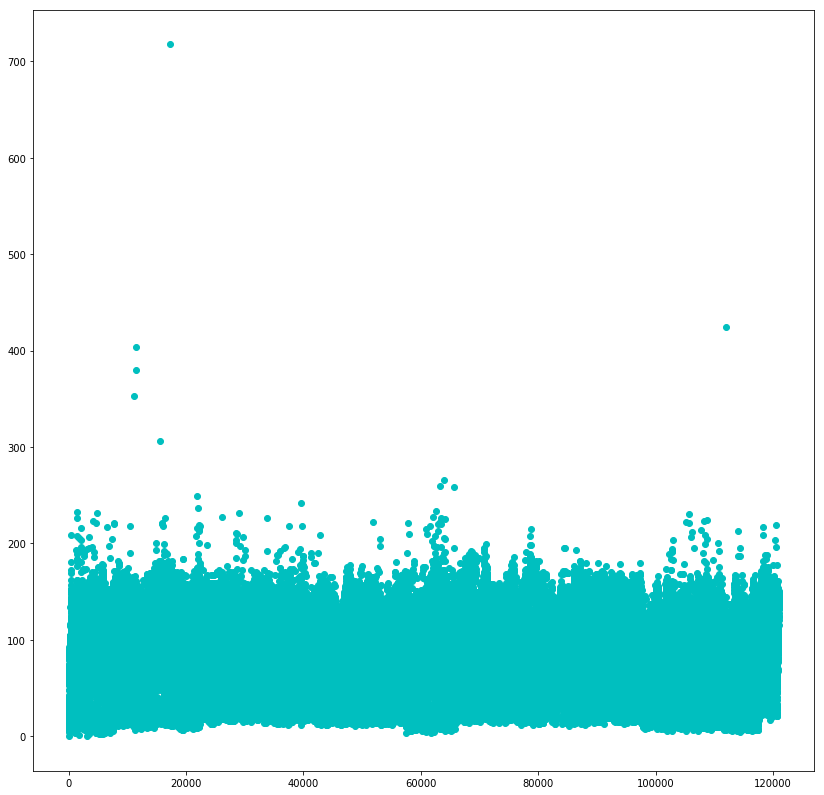

In [70]:
from matplotlib import pyplot as plt
plt.figure(figsize=(14,14))
x = [1,2,3]
plt.plot(items_M,list_M_dist,'oc')
plt.show()

In [ ]:
from matplotlib import pyplot as plt
plt.figure(figsize=(14,14))
plt.plot(items_M[0:2000],list_M_dist[0:2000],'oc')
plt.show()